In [9]:
# General Notes: 
# 1) 0's in arrays represent red integers, 1's in arrays represent blue integers
# 2) All coloring arrays begin with the first entry at the end of each arm and the last entry at the center of each arm

## Optimization Code:

In [27]:
# The following are the necessary packages that are utilized throughout our code

import numpy as np
import math
import random
import matplotlib.pyplot as plt

### k-star Array Generation Code:

In [5]:
# Code to generate a random coloring of red and blue in a single array of length n

def generate_array(n):
    return np.random.choice([0, 1], size=n)

In [31]:
# Code to generate a random coloring of red and blue in k arrays of length n where k represents the number of arms and n is the length of each arm

def random_kcoloring(k, n):
    coloring = []
    # Iterate over the number of arms 'k'
    for i in range(k):
        array = generate_array(n)
        coloring += [[array[i] for i in range(n)]]
    return coloring

In [30]:
# Code to generate a random ordering of numbers 0 through n-1

def random_ordering(n):
    ordering = list(range(n))
    shuffledordering = random.shuffle(ordering)
    return shuffledordering

### k-star Counting Code:

In [10]:
# Code to count monochromatic triples within a single arm in kstar

def count_monochromatic_triples(coloring):
    n = len(coloring)
    count = 0

    # Iterate over all possible starting points 'a'
    for a in range(n):
        # Iterate over all possible step sizes 'k'
        k = 1
        while a + 2 * k < n:
            # Check if a, a + k, and a + 2k are the same color
            if coloring[a] == coloring[a + k] == coloring[a + 2 * k]:
                count += 1
            k += 1

    return count

In [34]:
# Code to count all monochromatic triples within a k-star: ALL regime - takes into account all possible parings of arms

def count_kstar(coloring): 
    n = len(coloring[0])
    count = 0

    # Adds the number of monochromatic triples that stay within a single arm to the total
    for arm in coloring:
        count += count_monochromatic_triples(arm)

    
    # Counts the number of monochromatic triples that travel between any pair of arms

    for firstarm in range(len(coloring)):
        for secondarm in range(1, len(coloring)):
            tempcoloring = coloring[firstarm].copy() + [coloring[secondarm][n-1-j] for j in range(n)]
            if firstarm < secondarm:
                for i in range(n):
                    current = n + (n-i)%2
                    jrange = []
                    while current < 2*n:
                        jrange = jrange + [current]
                        current += 2
                    for j in jrange:
                        if tempcoloring[i] == tempcoloring[j] and tempcoloring[i] == tempcoloring[int((i + j)/2)]:
                            count += 1
            
    return count

In [35]:
# Code to count all monochromatic triples within a k-star: ADJACENT regime - takes into account only adjacent parings of arms

def count_adjacent_kstar(coloring): 
    n = len(coloring[0])
    count = 0

    # Adds the number of monochromatic triples that stay within a single arm to the total
    for arm in coloring:
        count += count_monochromatic_triples(arm)

    
    # Counts the number of monochromatic triples that travel between adjacent pairs of arms

    for index in range(len(coloring)):
        tempcoloring = coloring[index].copy() + [coloring[(index+1)%len(coloring)][n-1-j] for j in range(n)]
        for i in range(n):
            current = n + (n-i)%2
            jrange = []
            while current < 2*n:
                jrange = jrange + [current]
                current += 2
            for j in jrange:
                if tempcoloring[i] == tempcoloring[j] and tempcoloring[i] == tempcoloring[int((i + j)/2)]:
                    count += 1
            
    return count

### k-star Swap Code:

In [13]:
# Code to determine if swapping color from red to blue or vise versa decreases number of monomchromatic triples in kstar: takes into account all possible parings of arms

def CheckSwap(coloring, ell):
    n = len(coloring[0])
    numMon = [0,0]
    # h is a helper array:
    h = [i for i in range(n)] + [n - 1 - i for i in range(n)]
    #print(h)

    # First, we decide which arm contains ell:
    OrigArm = coloring[math.floor(1.0*ell/n)]
    EndArms = coloring.copy()
    EndArms.pop(math.floor(1.0*ell/n))

    # Now, we'll define p (pivot) to be the relative position within the arm:
    p = ell%n

    # Now, we start totaling the progressions
    
    # assume position p is the first in the progression
    j = 1
    while p + 2*j < 2*n:
        # All three on the same arm:
        if p + 2*j < n:
            if OrigArm[p + j] == OrigArm[p + 2*j]:
                numMon[OrigArm[p + j]] += 1
        # First two on the first arm:
        elif p + j < n:
            for EndArm in EndArms:
                if OrigArm[p + j] == EndArm[h[p + 2*j]]:
                    numMon[OrigArm[p + j]] += 1
        # Only first one on first arm:
        else:
            for EndArm in EndArms:
                if EndArm[h[p + j]] == EndArm[h[p + 2*j]]:
                    numMon[EndArm[h[p + j]]] += 1
        j += 1

    # now assume p is the second in the progression
    j = 1
    while p + j < 2*n and p - j >= 0:
        # All three on the same arm:
        if p + j < n:
            if OrigArm[p + j] == OrigArm[p - j]:
                numMon[OrigArm[p + j]] += 1
        # First two on original arm:
        else:
            for EndArm in EndArms:
                if OrigArm[p - j] == EndArm[h[p + j]]:
                    numMon[OrigArm[p - j]] += 1
        # Cannot have only one on arm 1.
        j += 1

    # now assume p is third in the progression
    j = 1
    while p - 2*j >= 0:
        if OrigArm[p - j] == OrigArm[p - 2*j]:
            numMon[OrigArm[p-j]] += 1
        j += 1
    
    if numMon[0] < numMon[1]:
        return 0
    # if numMon[0] == numMon[1]:
    #     print("They match.")
    return 1

In [14]:
# Code to determine if swapping color from red to blue or vise versa decreases number of monomchromatic triples in kstar: takes into account only adjacent parings of arms

def CheckSwapAdjacent(coloring, ell):
    n = len(coloring[0])
    k = len(coloring)
    numMon = [0,0]
    # h is a helper array:
    h = [i for i in range(n)] + [n - 1 - i for i in range(n)]
    #print(h)

    # First, we decide which arm contains ell:
    OrigArmIndex = math.floor(1.0*ell/n)
    OrigArm = coloring[OrigArmIndex]
    EndArms = [coloring[(OrigArmIndex-1)%k], coloring[(OrigArmIndex+1)%k]]

    # Now, we'll define p (pivot) to be the relative position within the arm:
    p = ell%n

    # Now, we start totaling the progressions
    
    # assume position p is the first in the progression
    j = 1
    while p + 2*j < 2*n:
        # All three on the same arm:
        if p + 2*j < n:
            if OrigArm[p + j] == OrigArm[p + 2*j]:
                numMon[OrigArm[p + j]] += 1
        # First two on the first arm:
        elif p + j < n:
            for EndArm in EndArms:
                if OrigArm[p + j] == EndArm[h[p + 2*j]]:
                    numMon[OrigArm[p + j]] += 1
        # Only first one on first arm:
        else:
            for EndArm in EndArms:
                if EndArm[h[p + j]] == EndArm[h[p + 2*j]]:
                    numMon[EndArm[h[p + j]]] += 1
        j += 1

    # now assume p is the second in the progression
    j = 1
    while p + j < 2*n and p - j >= 0:
        # All three on the same arm:
        if p + j < n:
            if OrigArm[p + j] == OrigArm[p - j]:
                numMon[OrigArm[p + j]] += 1
        # First two on original arm:
        else:
            for EndArm in EndArms:
                if OrigArm[p - j] == EndArm[h[p + j]]:
                    numMon[OrigArm[p - j]] += 1
        # Cannot have only one on arm 1.
        j += 1

    # now assume p is third in the progression
    j = 1
    while p - 2*j >= 0:
        if OrigArm[p - j] == OrigArm[p - 2*j]:
            numMon[OrigArm[p-j]] += 1
        j += 1
    
    if numMon[0] < numMon[1]:
        return 0
    # if numMon[0] == numMon[1]:
    #     print("They match.")
    return 1

### k-star Optimization Code:

In [15]:
# Code that determines optimal coloring to minimize monochromatic triples in kstar: takes into account only adjacent parings of arms

def optimize_adjacent_kstar_coloring(coloring, ordering=None):
    n = len(coloring[0])
    k = len(coloring)
    currentcoloring = coloring

    if ordering == None:
        ordering = [i for i in range(k*n)]

    diditchange = 0
    while diditchange == 0:
        diditchange = 1
        for j in ordering:
            kcurrent = currentcoloring[math.floor(j/n)][j%n]
            knew = CheckSwapAdjacent(currentcoloring, j)
            if kcurrent != knew:
                diditchange = 0
                currentcoloring[math.floor(j/n)][j%n] = knew
                
    print("Performance: ", count_adjacent_kstar(currentcoloring))
    plot_kstar_coloring(currentcoloring)

    return currentcoloring

In [16]:
# Code that determines optimal coloring to minimize monochromatic triples in kstar: takes into account all possible parings of arms

def optimize_kstar_coloring(coloring, ordering=None):
    n = len(coloring[0])
    k = len(coloring)
    currentcoloring = coloring

    if ordering == None:
        ordering = [i for i in range(k*n)]

    diditchange = 0
    while diditchange == 0:
        diditchange = 1
        for j in ordering:
            kcurrent = currentcoloring[math.floor(j/n)][j%n]
            knew = CheckSwap(currentcoloring, j)
            if kcurrent != knew:
                diditchange = 0
                currentcoloring[math.floor(j/n)][j%n] = knew
                
    print("Performance: ", count_kstar(currentcoloring))
    plot_kstar_coloring(currentcoloring)

    return currentcoloring

### k-star Plotting Code:

In [24]:
# Code for plotting k-star

def plot_kstar_coloring(currentcoloring, filename=None):
    n = len(currentcoloring[0])
    k = len(currentcoloring)

    plt.figure(figsize=(4, 4))
    
    plt.xticks([])
    plt.yticks([])

    # Plot the center of the picture first

    for i in range(k):
        x_points = [(1)*math.cos((2*math.pi*i)/k), (0)*math.cos((2*math.pi*i)/k)]
        y_points = [(1)*math.sin((2*math.pi*i)/k), (0)*math.sin((2*math.pi*i)/k)]
        if currentcoloring[i][n-1] == 0:
            plt.plot(x_points, y_points, linestyle='-', color='red', linewidth='5')
        else:
            plt.plot(x_points, y_points, linestyle='-', color='blue', linewidth='5')
    

    # Plot the rest of the picture
    
    for i in range(k):

        if currentcoloring[i][0] == 0 and currentcoloring[i][1] == 0:
            regime = 'red'
        elif currentcoloring[i][0] == 1 and currentcoloring[i][1] == 1:
            regime = 'blue'
        elif (n%2 == 0 and currentcoloring[i][0] == 1) or (n%2 == 1 and currentcoloring[i][0] == 0):
            regime = 'purple'
        else:
            regime = 'pink'

        regimebroken = False

        count = 2
        
        for j in range(2,n):

            if regime == 'red' and currentcoloring[i][j] == 1:
                regimebroken = True

            if regime == 'blue' and currentcoloring[i][j] == 0:
                regimebroken = True

            if (regime == 'purple' or regime == 'pink') and currentcoloring[i][j] == currentcoloring[i][j-1]:
                regimebroken = True

            if regimebroken == False:
                count += 1

            if regimebroken == True or j == n-1:
                x_points = [(n-j)*math.cos((2*math.pi*i)/k), (n-(j-count))*math.cos((2*math.pi*i)/k)]
                y_points = [(n-j)*math.sin((2*math.pi*i)/k), (n-(j-count))*math.sin((2*math.pi*i)/k)]
                if regime == 'red':
                    plt.plot(x_points, y_points, linestyle='-', color='red', linewidth='5')
                elif regime == 'blue':
                    plt.plot(x_points, y_points, linestyle='-', color='blue', linewidth='5')
                elif regime == 'purple':
                    plt.plot(x_points, y_points, linestyle='-', color='darkorchid', linewidth='5')
                    # plt.plot(x_points, y_points, linestyle='-', color='yellow', linewidth='5')
                else:
                    plt.plot(x_points, y_points, linestyle='-', color='fuchsia', linewidth='5')

                regimebroken = False
                count = 1

                if j < n-1:
                    if currentcoloring[i][j] == 0 and currentcoloring[i][j+1] == 0:
                        regime = 'red'
                    elif currentcoloring[i][j] == 1 and currentcoloring[i][j+1] == 1:
                        regime = 'blue'
                    elif (currentcoloring[i][j] == 1 and (n - j)%2 == 0) or (currentcoloring[i][j] == 0 and (n - j)%2 == 1):
                        regime = 'purple'
                    else:
                        regime = 'pink'

    if filename:
        plt.savefig(filename, bbox_inches="tight")
    plt.show()

### Unified Code:

In [19]:
# This function has the following parameters:

# First, the geometry can be:
# 'S' for kstar
# 'R' for rectangle
# 'C' for circle

# Second, each geometry can have specific progression types:
# For the kstar:
# 'adj' only allows for progressions to travel between adjacent pairs of arms
# 'all' allows for progressions to travel between all pairs of arms
# For the rectangle:
# 'D' if all diagonals are allowed
# 'P' if only positive diagonals are allowed
# 'UD' if only up/down or left/right progressions are allowed
# For the circle:
# 'D' if all diagonals are allowed
# 'P' if only positive diagonals are allowed


def optimize_coloring(geometry, progressiontype, coloring, ordering = None):
    if geometry == 'S' and progressiontype == 'adj':
        return optimize_adjacent_kstar_coloring(coloring, ordering)

    elif geometry == 'S' and progressiontype == 'all':
        return optimize_kstar_coloring(coloring, ordering)

    elif geometry == 'R': 
        return optimize_rectangle_coloring(coloring, progressiontype, ordering, aspect = True)

    else:
        return optimize_circle_coloring(coloring, progressiontype, ordering, verbose = False)

## Comparisons of Local Optima:

### Code to Compare Colorings:

In [17]:
def GetRegimes(arm, midpointswap=True):
    n = len(arm)
    armregime = []
    # adapted from plotting code
    if arm[0] == 0 and arm[1] == 0:
        # regime = 'red'
        armregime += ['R', 'R']
    elif arm[0] == 1 and arm[1] == 1:
        # regime = 'blue'
        armregime += ['B', 'B']
    elif arm[0] == 0 and n%2 == 1 and midpointswap:
        # regime = 'purple'
        armregime += ['P', 'P']
    elif arm[0] == 0 and (not midpointswap):
        armregime += ['P', 'P']
    else:
        armregime += ['N', 'N']

    
    if midpointswap:
        for j in range(2, n):
            if arm[j] == 1 and arm[j-1] == 1:
                armregime += ['B']
            elif arm[j] == 0 and arm[j-1] == 0:
                armregime += ['R']
            # Before half way:
            elif (arm[j] == 1 and j < n/2 and (n/2-j)%2 == 0) or (arm[j] == 0 and j < n/2 and (n/2-j)%2 == 1):
                armregime += ['P']
            # After half way:
            elif (arm[j] == 1 and j >= n/2 and (n/2+1-j)%2 == 0) or (arm[j] == 0 and j >= n/2 and (n/2+1-j)%2 == 1):
                armregime += ['P']
            else:
                armregime += ['N']
    else:
        for j in range(2, n):
            if arm[j] == 1 and arm[j-1] == 1:
                armregime += ['B']
            elif arm[j] == 0 and arm[j-1] == 0:
                armregime += ['R']
            # We don't want purple or pink to occur at *every* transition between red and blue
            elif (arm[j] == 0 and j%2 == 0) or (arm[j] == 1 and j%2 == 1):
                # This checks that we didn't start a new blue or red regime
                if j < n - 1 and arm[j + 1] == arm[j]:
                    if arm[j] == 0:
                        armregime += ['R']
                    else:
                        armregime += ['B']
                else:
                    armregime += ['P']
            else:
                # This checks that we didn't start a new blue or red regime
                if j < n - 1 and arm[j + 1] == arm[j]:
                    if arm[j] == 0:
                        armregime += ['R']
                    else:
                        armregime += ['B']
                else:
                    armregime += ['N']

    return armregime

In [18]:
def Gen_Coloring(RegimeList):
    Coloring1 = []
    Coloring2 = []

    for i in range(len(RegimeList)):
        if RegimeList[i] == 'R':
            Coloring1 += [1]
            Coloring2 += [0]
        elif RegimeList[i] == 'B':
            Coloring1 += [0]
            Coloring2 += [1]
        elif RegimeList[i] == 'P':
            if i%2 == 0:
                Coloring1 += [0]
                Coloring2 += [0]
            else:
                Coloring1 += [1]
                Coloring2 += [1]
        elif RegimeList[i] == 'N':
            if i%2 == 0:
                Coloring1 += [1]
                Coloring2 += [1]
            else:
                Coloring1 += [0]
                Coloring2 += [0]

    Coloring3 = [1 - Coloring1[i] for i in range(len(RegimeList))]
    Coloring4 = [1 - Coloring2[i] for i in range(len(RegimeList))]

    return [Coloring1, Coloring2, Coloring3, Coloring4]

In [19]:
def GenStarColorings(OrigColoring):
    k = len(OrigColoring)
    StarColoring1 = []
    StarColoring2 = []
    StarColoring3 = []
    StarColoring4 = []

    for i in range(k):
        ArmVariants = Gen_Coloring(GetRegimes(OrigColoring[i], midpointswap=False))
        StarColoring1 += [ArmVariants[0].copy()]
        StarColoring2 += [ArmVariants[1].copy()]
        StarColoring3 += [ArmVariants[2].copy()]
        StarColoring4 += [ArmVariants[3].copy()]
        
    return [StarColoring1, StarColoring2, StarColoring3, StarColoring4]

In [20]:
def differences_in_optima(local_optimum, comparison_coloring):
    differences = 0
    variation_differences = []
    coloring_combinations = GenStarColorings(comparison_coloring)

    for combination in coloring_combinations:
        for i in range(len(local_optimum)):
            for j in range(len(local_optimum[0])):
                if local_optimum[i][j] != combination[i][j]:
                    differences += 1
        
        variation_differences.append(differences)
        differences = 0
    
    return min(variation_differences)

In [21]:
def compare_optima(list_of_indicies, list_of_colorings, progressiontype, comparison_index):
    
    if progressiontype == 'all':
        print('LOCAL MINIMA FOR COMPARISON:')
        print('Index i =', comparison_index)
        print('Number of Progressions:', count_kstar(list_of_colorings[comparison_index]))
        print('---------------------------------------')
        
        for i in list_of_indicies:
            diff = differences_in_optima(list_of_colorings[i], list_of_colorings[comparison_index])
            print('Index i =', i)
            print('Number of Progressions:', count_kstar(list_of_colorings[i]))
            print('Number of Differences in Colorings:', diff)
            print('Percent Difference:', (diff/(len(list_of_colorings[comparison_index])*len(list_of_colorings[comparison_index][0])))*100, '%')
            print('-------------')
            
    elif progressiontype == 'adj':
        print('LOCAL MINIMA FOR COMPARISON:')
        print('Index i =', comparison_index)
        print('Number of Progressions:', count_adjacent_kstar(list_of_colorings[comparison_index]))
        print('---------------------------------------')
        
        for i in list_of_indicies:
            diff = differences_in_optima(list_of_colorings[i], list_of_colorings[comparison_index])
            print('Index i =', i)
            print('Number of Progressions:', count_adjacent_kstar(list_of_colorings[i]))
            print('Number of Differences in Colorings:', diff)
            print('Percent Difference:', (diff/(len(list_of_colorings[comparison_index])*len(list_of_colorings[comparison_index][0])))*100, '%')
            print('-------------')

In [22]:
# This assumes the first bucket is alternating

def compare_list_to_target(local_optima, buckets, progressiontype):

    if progressiontype == 'all':
        
        for i in range(len(local_optima)):
            mincomparison = 1
            index = -1
            for j in range(len(buckets)):
                differences = differences_in_optima(local_optima[i], buckets[j])/(len(local_optima[0])*len(local_optima[0][0]))
                if differences < mincomparison:
                    index = j
                    mincomparison = differences
    
            print('Index i = ', i)
            if index == 0:
                print('Bucket ID: Alternating')    
            else:
                print('Bucket ID: ', index)
            print('Number of Progressions:', count_kstar(local_optima[i]))
            print('Percent difference: ', mincomparison*100, '%')
            print('----------------')
                  
    if progressiontype == 'adj':
        
        for i in range(len(local_optima)):
            mincomparison = 1
            index = -1
            for j in range(len(buckets)):
                differences = differences_in_optima(local_optima[i], buckets[j])/(len(local_optima[0])*len(local_optima[0][0]))
                if differences < mincomparison:
                    index = j
                    mincomparison = differences
    
            print('Index i = ', i)
            if index == 0:
                print('Bucket ID: Alternating')    
            else:
                print('Bucket ID: ', index)
            print('Number of Progressions:', count_adjacent_kstar(local_optima[i]))
            print('Percent difference: ', mincomparison*100, '%')
            print('----------------')

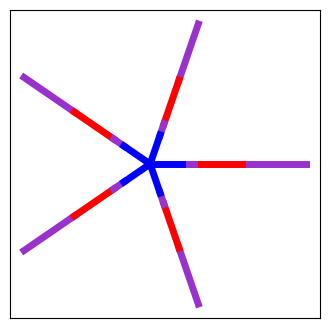

In [111]:
#Local symmetric optima, purple alternating

plot_kstar_coloring(colorings_kstar_all_k5_n500[0], filename='5starLocalSymm.pdf')

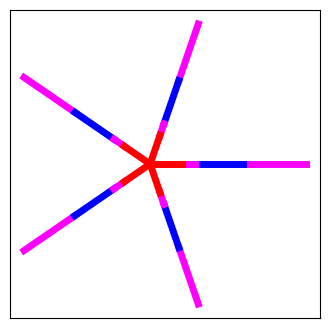

In [112]:
#Local symmetric optima, pink alternating

plot_kstar_coloring(colorings_kstar_all_k5_n1000[39], filename='5starLocalSymmPink.pdf')

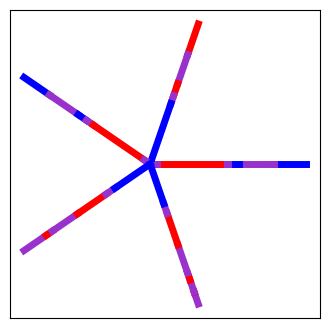

In [113]:
#Local reflectionally symmetric optima, purple alternating

plot_kstar_coloring(colorings_kstar_adj_k5_n1000[24], filename='5starLocalRefSymm.pdf')

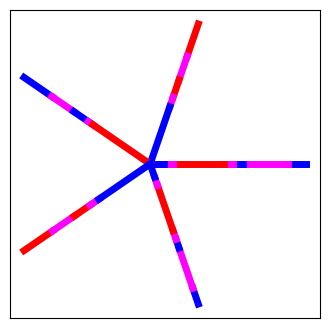

In [114]:
#Local reflectionally symmetric optima, pink alternating

plot_kstar_coloring(colorings_kstar_adj_k5_n1000[37], filename='5starLocalRefSymmPink.pdf')

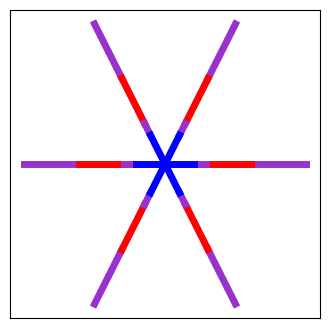

In [115]:
#Local symmetric optima, purple alternating

plot_kstar_coloring(colorings_kstar_all_k6_n1000[10], filename='6starLocalSymm.pdf')

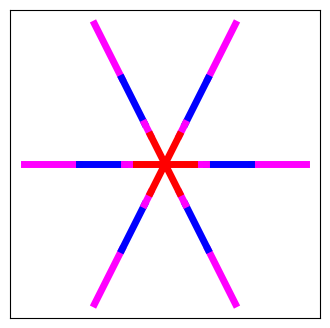

In [122]:
#Local symmetric optima, pink alternating

plot_kstar_coloring(colorings_kstar_all_k6_n1000[70], filename='6starLocalSymmPink.pdf')

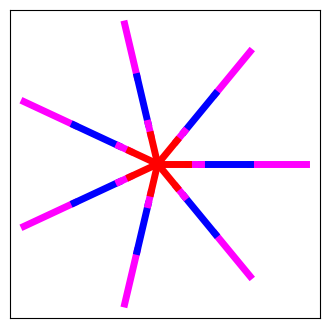

In [116]:
#Local symmetric optima, pink alternating

plot_kstar_coloring(colorings_kstar_all_k7_n1000[11], filename='7starLocalSymmPink.pdf')

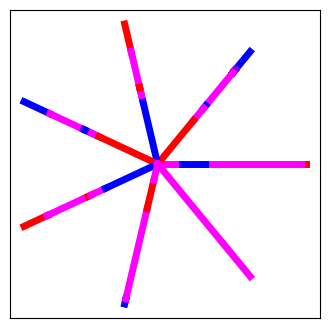

In [117]:
#Local reflectionally anti-symmetric optima, pink alternating

plot_kstar_coloring(colorings_kstar_adj_k7_n1000[14], filename='7starLocalRefAntiSymmPink.pdf')

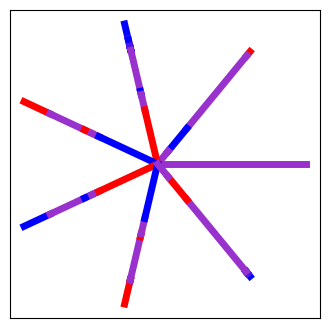

In [119]:
#Local reflectionally anti-symmetric optima, purple alternating

plot_kstar_coloring(colorings_kstar_adj_k7_n1000[41], filename='7starLocalRefAntiSymm.pdf')

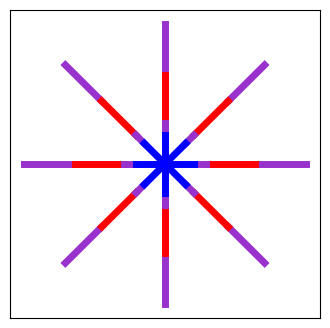

In [120]:
#Local symmetric optima, purple alternating

plot_kstar_coloring(colorings_kstar_all_k8_n1000[24], filename='8starLocalSymm.pdf')

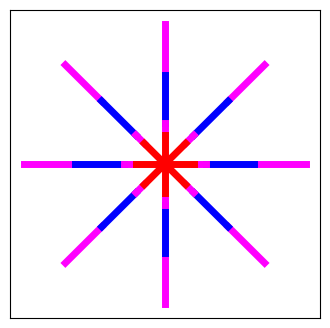

In [121]:
#Local symmetric optima, pink alternating

plot_kstar_coloring(colorings_kstar_all_k8_n1000[23], filename='8starLocalSymmPink.pdf')

### k=3:

Index i = 0
Performance:  93000


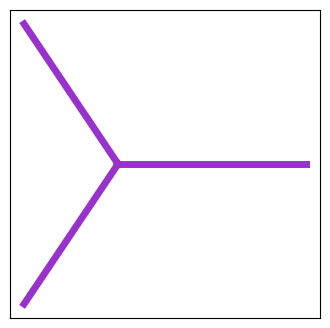

-------------
Index i = 1
Performance:  93000


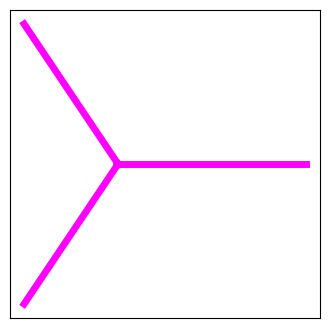

-------------
Index i = 2
Performance:  93000


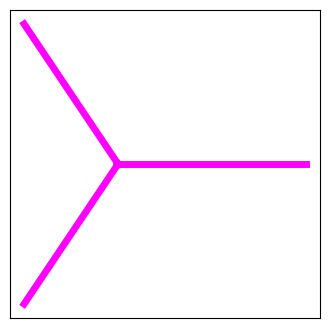

-------------
Index i = 3
Performance:  93000


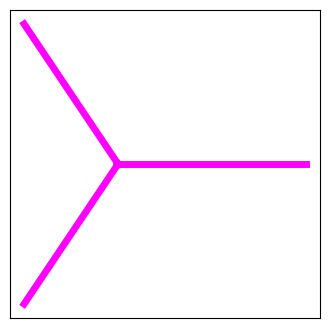

-------------
Index i = 4
Performance:  93000


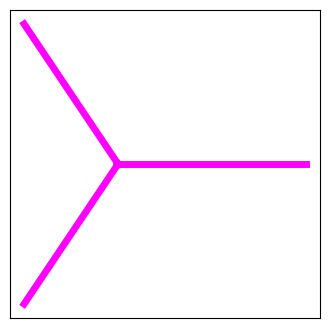

-------------
Index i = 5
Performance:  93000


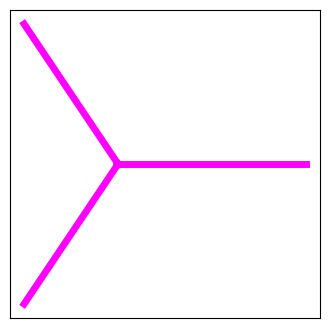

-------------
Index i = 6
Performance:  93000


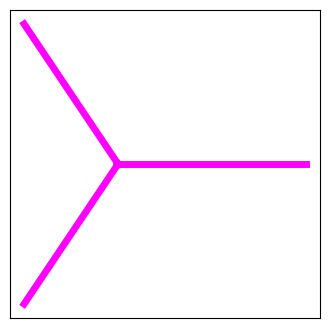

-------------
Index i = 7
Performance:  93000


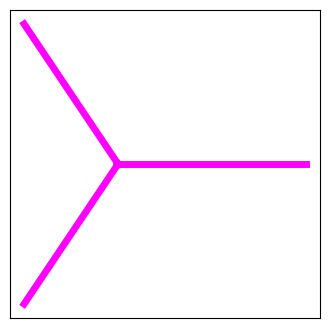

-------------
Index i = 8
Performance:  93000


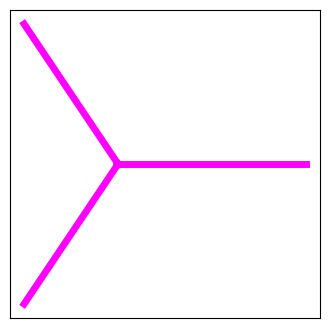

-------------
Index i = 9
Performance:  93000


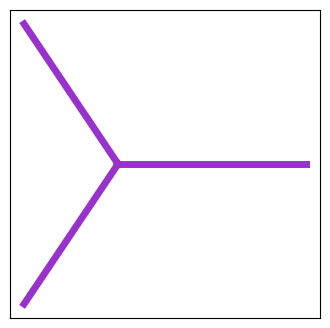

-------------
Index i = 10
Performance:  93000


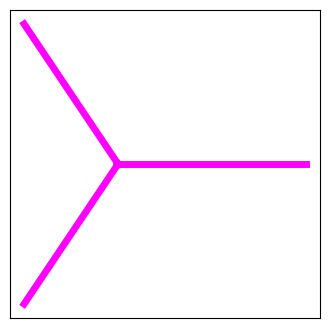

-------------
Index i = 11
Performance:  93000


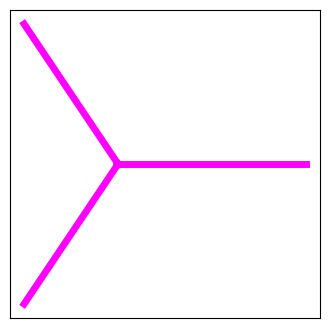

-------------
Index i = 12
Performance:  93000


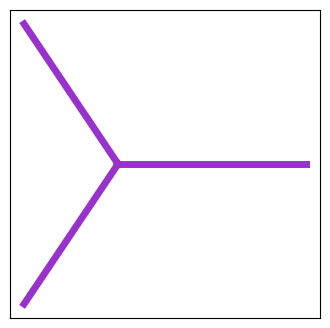

-------------
Index i = 13
Performance:  93000


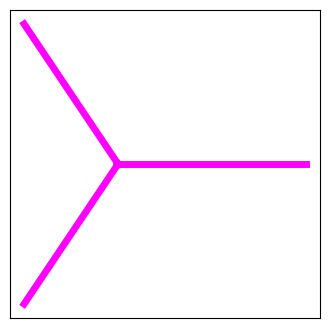

-------------
Index i = 14
Performance:  93000


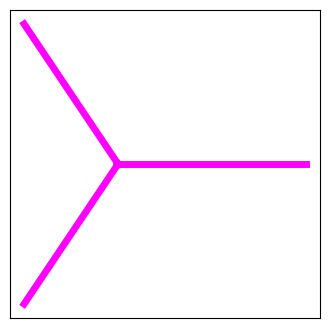

-------------
Index i = 15
Performance:  93000


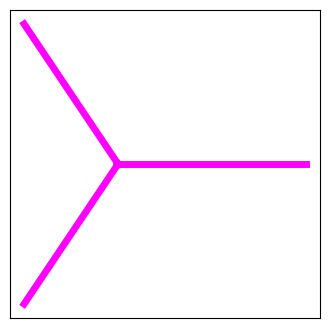

-------------
Index i = 16
Performance:  93000


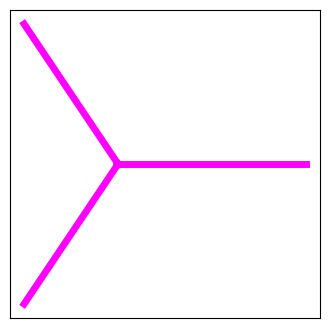

-------------
Index i = 17
Performance:  93000


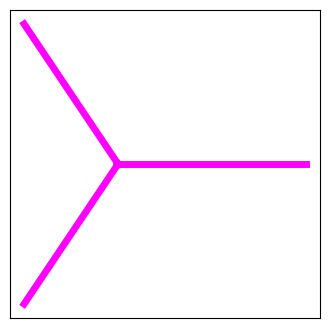

-------------
Index i = 18
Performance:  93000


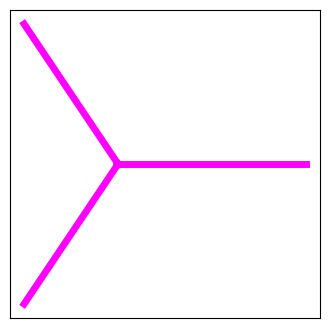

-------------
Index i = 19
Performance:  93000


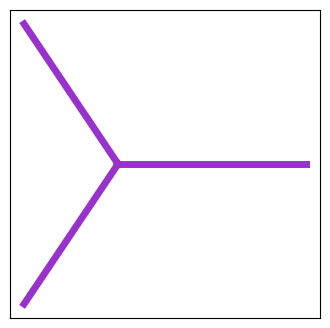

-------------
Index i = 20
Performance:  93000


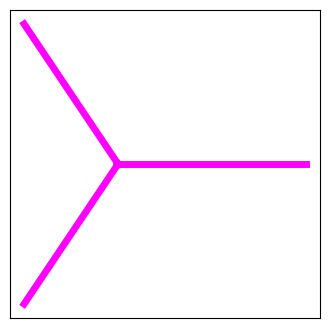

-------------
Index i = 21
Performance:  105537


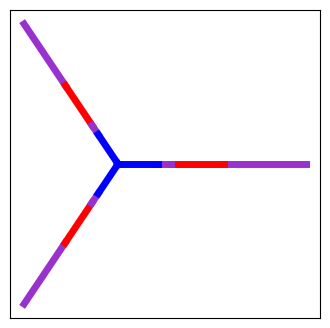

-------------
Index i = 22
Performance:  105537


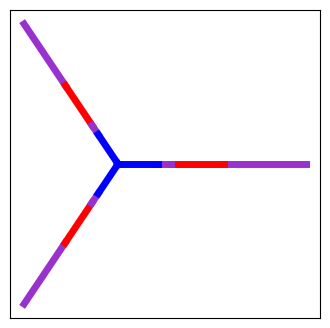

-------------
Index i = 23
Performance:  93000


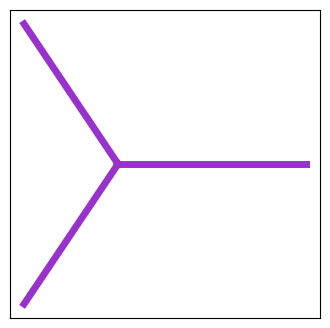

-------------
Index i = 24
Performance:  93000


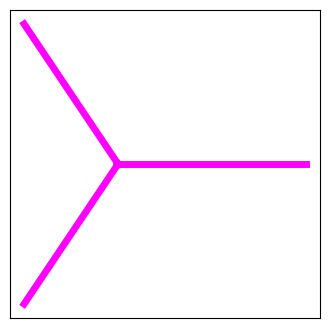

-------------
Index i = 25
Performance:  105690


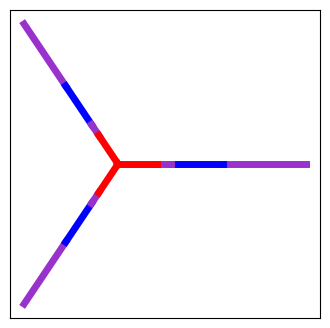

-------------
Index i = 26
Performance:  93000


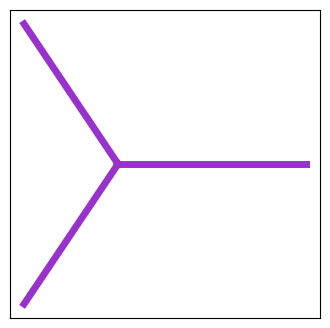

-------------
Index i = 27
Performance:  93000


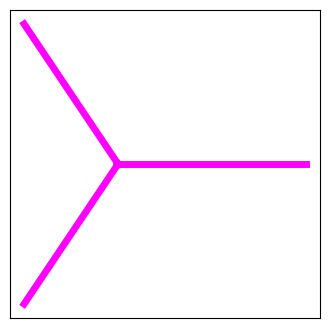

-------------
Index i = 28
Performance:  93000


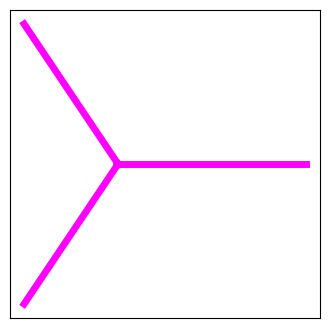

-------------
Index i = 29
Performance:  93000


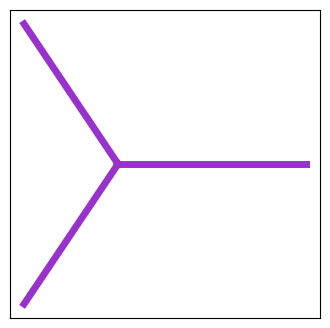

-------------
Index i = 30
Performance:  93000


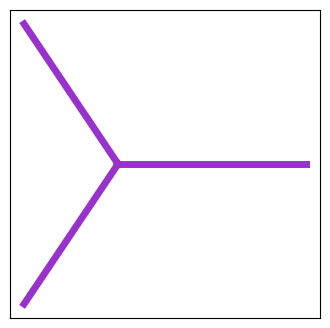

-------------
Index i = 31
Performance:  93000


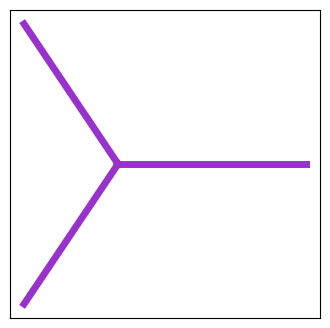

-------------
Index i = 32
Performance:  93000


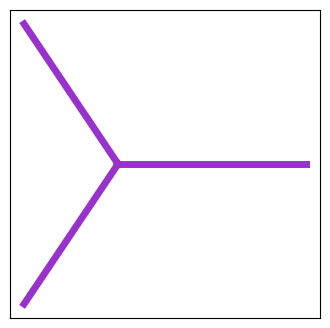

-------------
Index i = 33
Performance:  93000


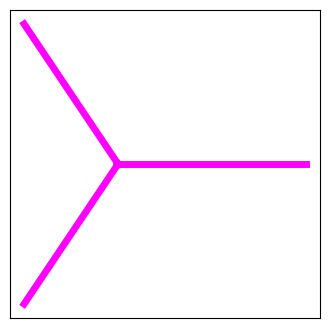

-------------
Index i = 34
Performance:  93000


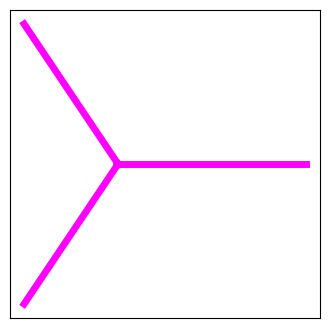

-------------
Index i = 35
Performance:  93000


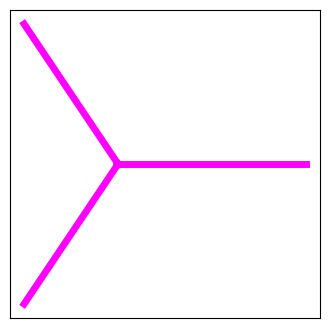

-------------
Index i = 36
Performance:  93000


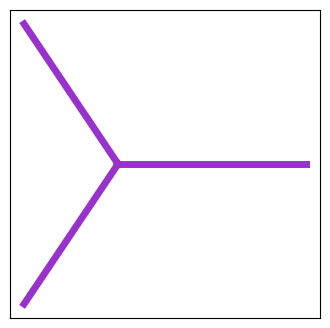

-------------
Index i = 37
Performance:  93000


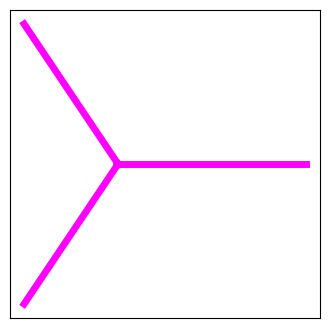

-------------
Index i = 38
Performance:  93000


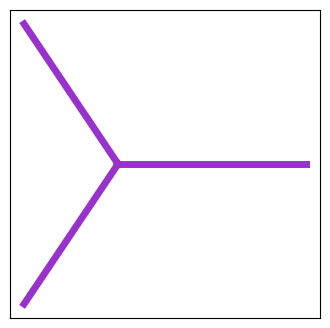

-------------
Index i = 39
Performance:  93000


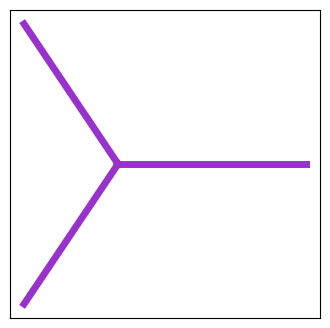

-------------
Index i = 40
Performance:  93000


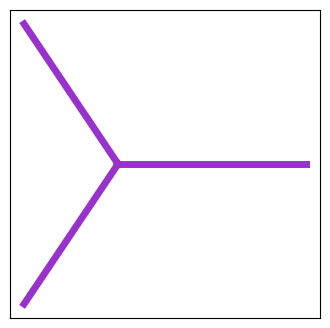

-------------
Index i = 41
Performance:  93000


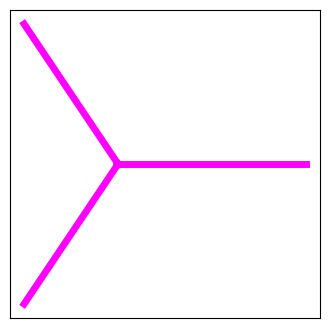

-------------
Index i = 42
Performance:  93000


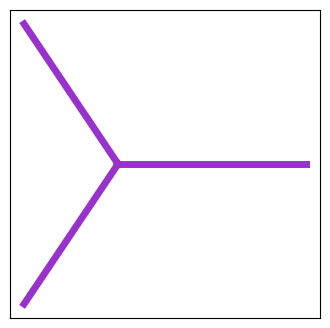

-------------
Index i = 43
Performance:  105542


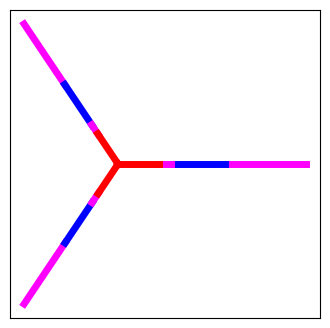

-------------
Index i = 44
Performance:  93000


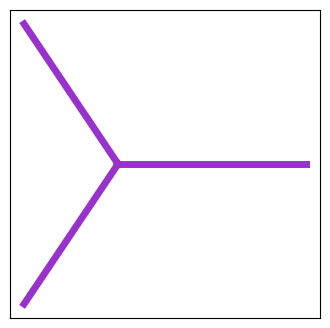

-------------
Index i = 45
Performance:  93000


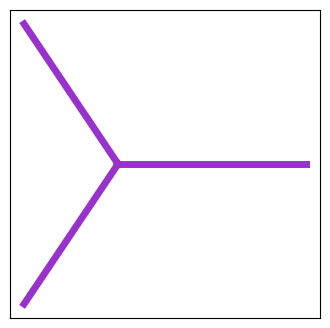

-------------
Index i = 46
Performance:  93000


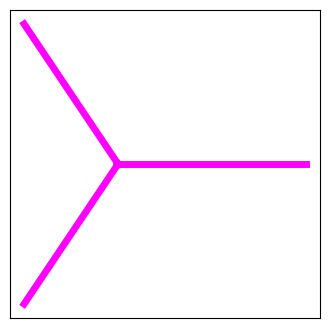

-------------
Index i = 47
Performance:  93000


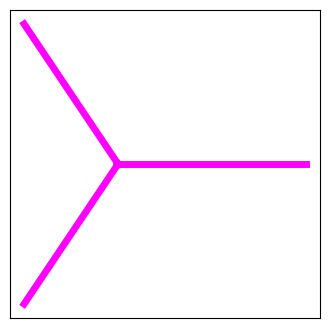

-------------
Index i = 48
Performance:  93000


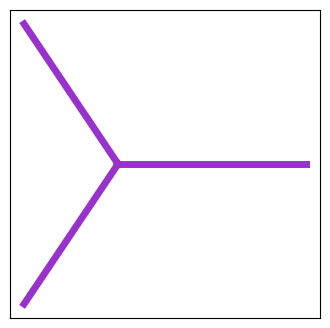

-------------
Index i = 49
Performance:  93000


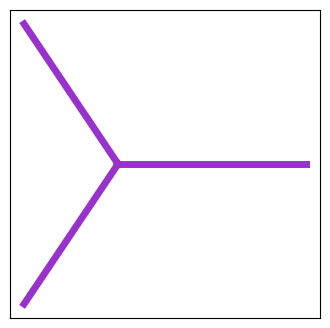

-------------
Index i = 50
Performance:  93000


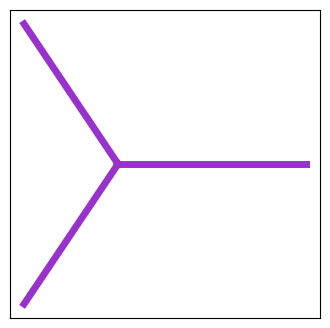

-------------
Index i = 51
Performance:  93000


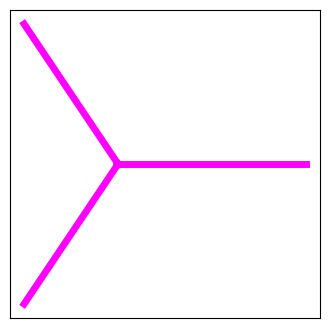

-------------
Index i = 52
Performance:  93000


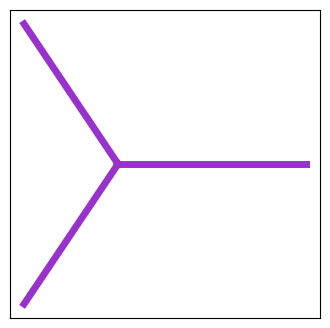

-------------
Index i = 53
Performance:  93000


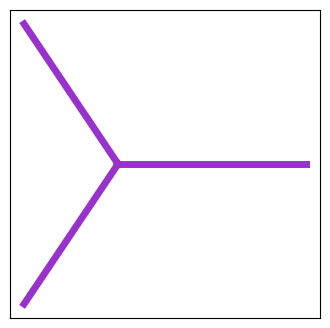

-------------
Index i = 54
Performance:  93000


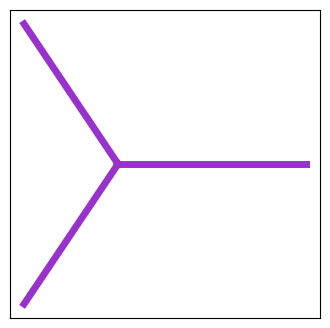

-------------
Index i = 55
Performance:  105537


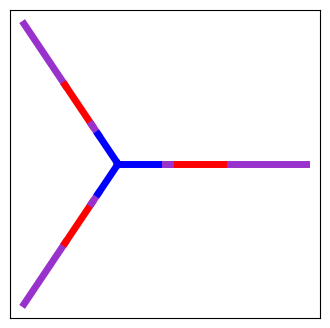

-------------
Index i = 56
Performance:  93000


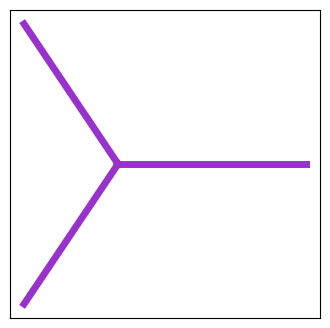

-------------
Index i = 57
Performance:  93000


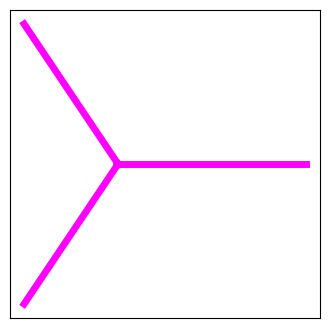

-------------
Index i = 58
Performance:  93000


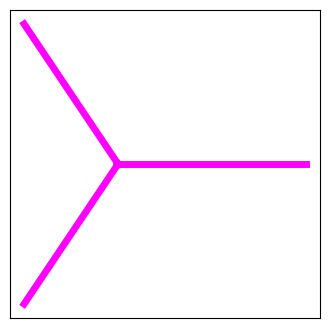

-------------
Index i = 59
Performance:  93000


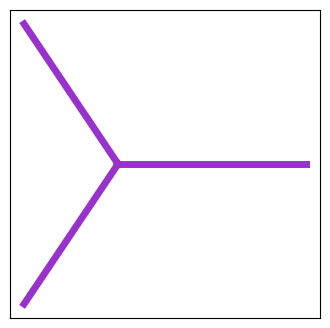

-------------
Index i = 60
Performance:  93000


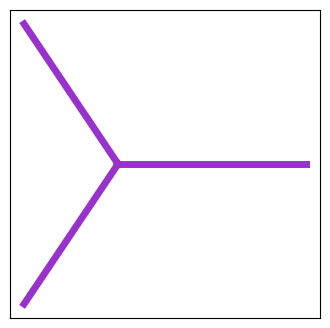

-------------
Index i = 61
Performance:  105537


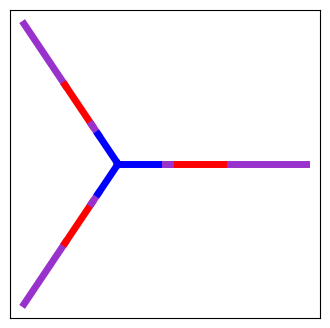

-------------
Index i = 62
Performance:  93000


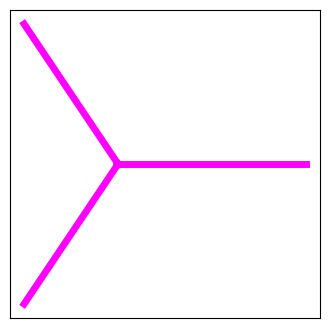

-------------
Index i = 63
Performance:  93000


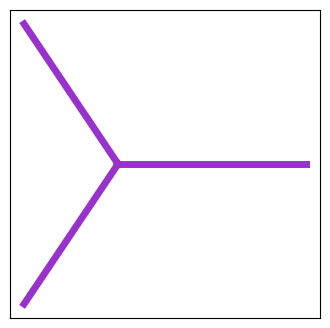

-------------
Index i = 64
Performance:  93000


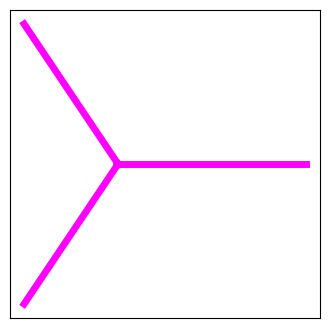

-------------
Index i = 65
Performance:  105542


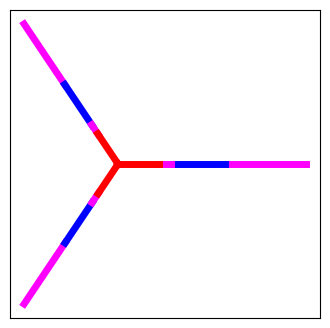

-------------
Index i = 66
Performance:  93000


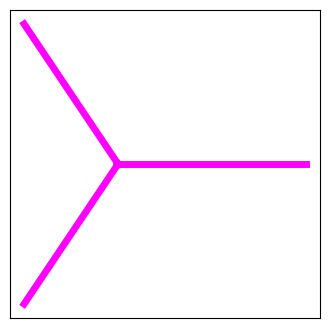

-------------
Index i = 67
Performance:  105542


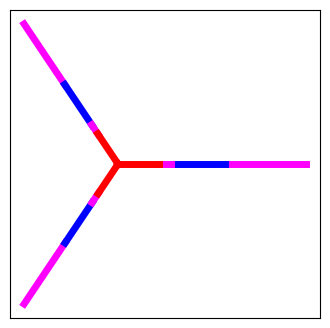

-------------
Index i = 68
Performance:  105537


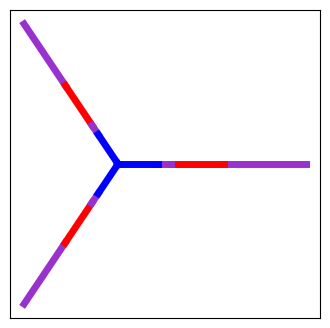

-------------
Index i = 69
Performance:  93000


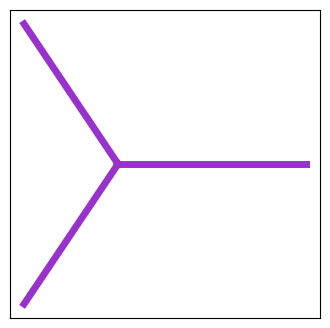

-------------
Index i = 70
Performance:  93000


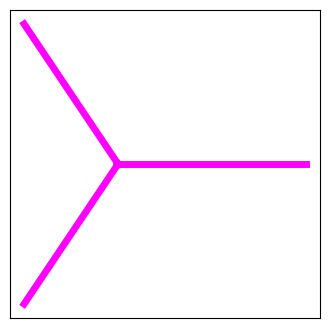

-------------
Index i = 71
Performance:  93000


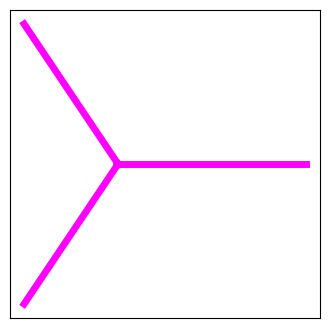

-------------
Index i = 72
Performance:  93000


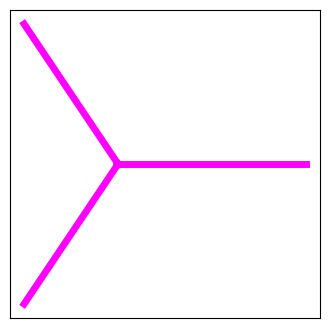

-------------
Index i = 73
Performance:  93000


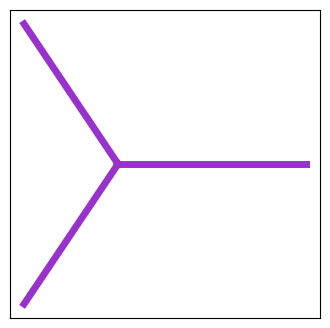

-------------
Index i = 74
Performance:  93000


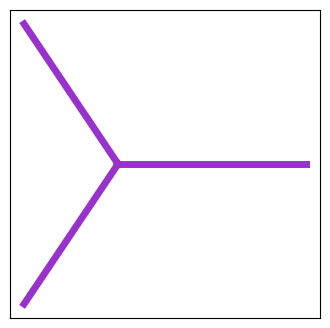

-------------
Index i = 75
Performance:  93000


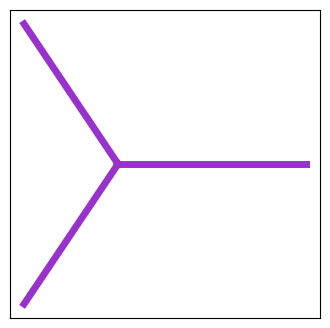

-------------
Index i = 76
Performance:  93000


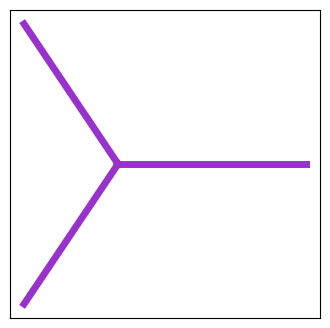

-------------
Index i = 77
Performance:  93000


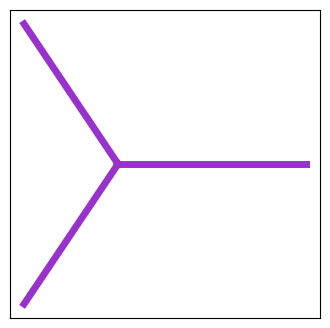

-------------
Index i = 78
Performance:  93000


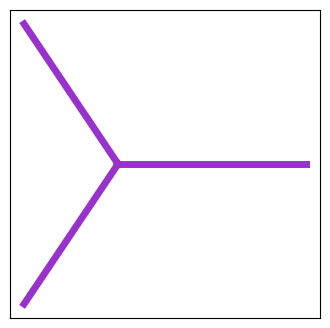

-------------
Index i = 79
Performance:  105537


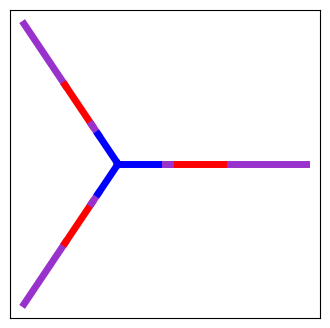

-------------
Index i = 80
Performance:  93000


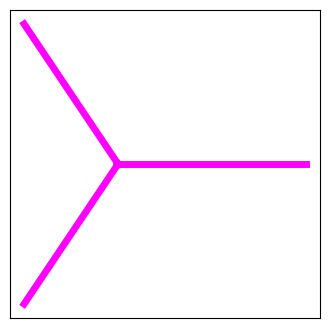

-------------
Index i = 81
Performance:  93000


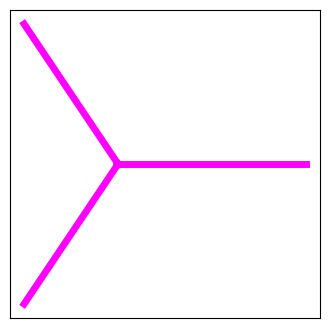

-------------
Index i = 82
Performance:  105542


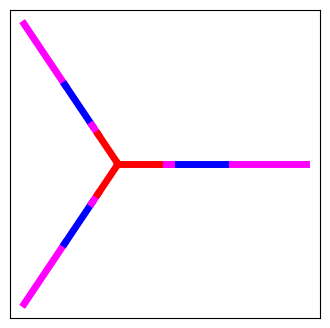

-------------
Index i = 83
Performance:  93000


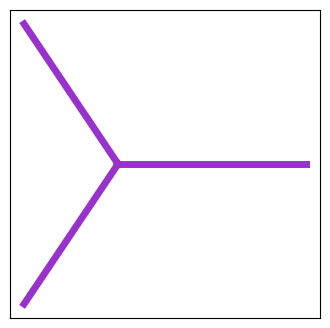

-------------
Index i = 84
Performance:  93000


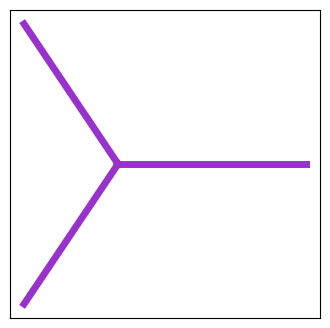

-------------
Index i = 85
Performance:  105528


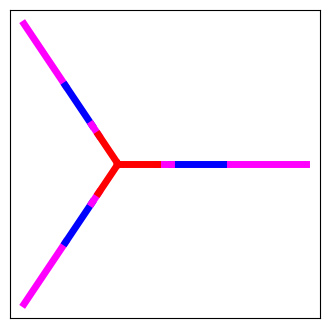

-------------
Index i = 86
Performance:  93000


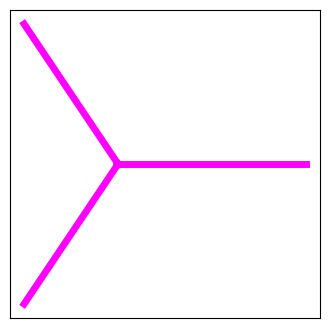

-------------
Index i = 87
Performance:  93000


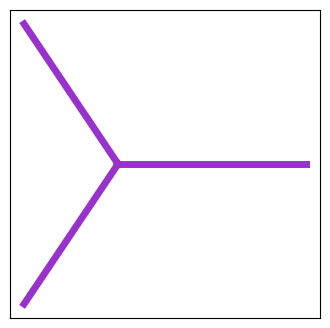

-------------
Index i = 88
Performance:  93000


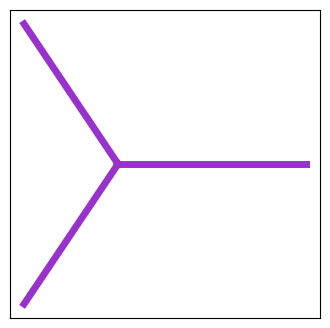

-------------
Index i = 89
Performance:  93000


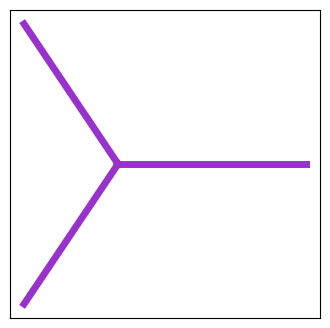

-------------
Index i = 90
Performance:  93000


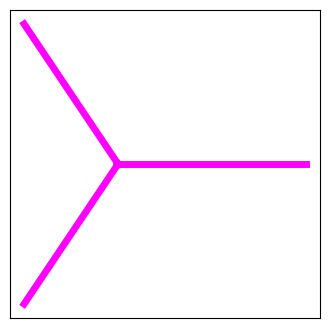

-------------
Index i = 91
Performance:  105542


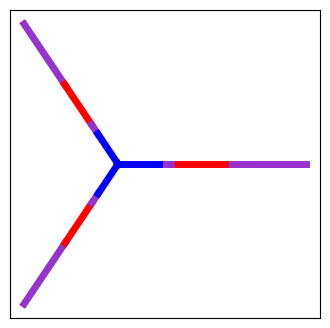

-------------
Index i = 92
Performance:  93000


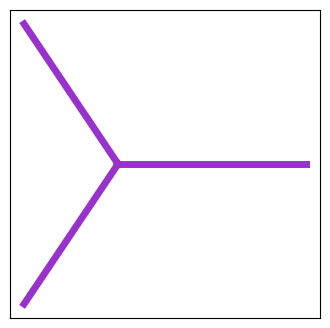

-------------
Index i = 93
Performance:  93000


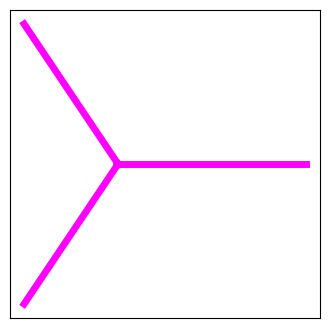

-------------
Index i = 94
Performance:  105528


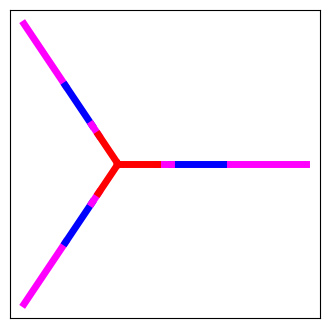

-------------
Index i = 95
Performance:  93000


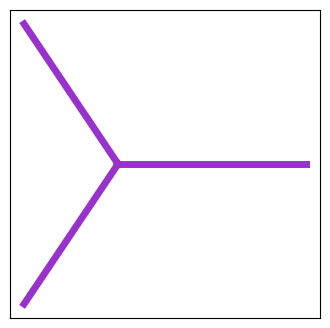

-------------
Index i = 96
Performance:  93000


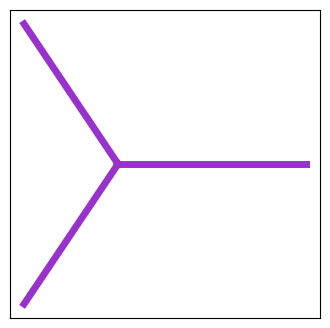

-------------
Index i = 97
Performance:  93000


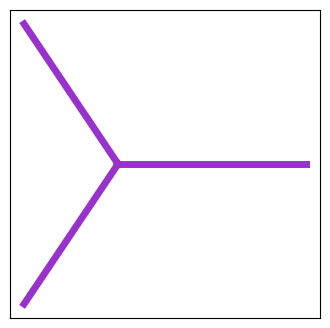

-------------
Index i = 98
Performance:  93000


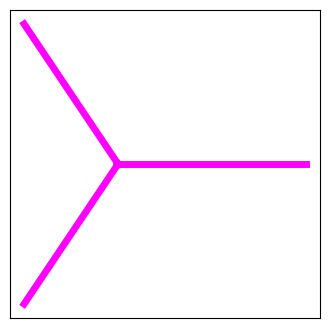

-------------
Index i = 99
Performance:  93000


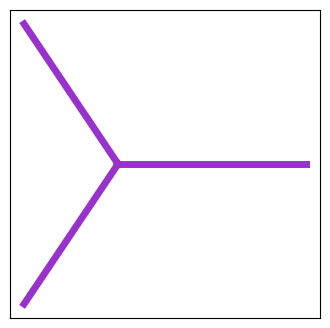

-------------


In [59]:
#Optimal colorings for k-star where k = 3 and n = 500

np.random.seed(922)
random.seed(119)

colorings_kstar_k3_n500 = []

for i in range(100):
    print('Index i =', i)
    colorings_kstar_k3_n500 += [optimize_coloring('S', 'all', random_kcoloring(3, 500), random_ordering(500))]
    print('-------------')

In [66]:
# Comparison results for k-star where k = 3 and n = 500

buckets_for_kstar_k3_n500 = [colorings_kstar_k3_n500[0], colorings_kstar_k3_n500[85]]

compare_list_to_target(colorings_kstar_k3_n500, buckets_for_kstar_k3_n500, 'all')

Index i =  0
Bucket ID: Alternating
Number of Progressions: 93000
Percent difference:  0.0 %
----------------
Index i =  1
Bucket ID: Alternating
Number of Progressions: 93000
Percent difference:  0.0 %
----------------
Index i =  2
Bucket ID: Alternating
Number of Progressions: 93000
Percent difference:  0.0 %
----------------
Index i =  3
Bucket ID: Alternating
Number of Progressions: 93000
Percent difference:  0.0 %
----------------
Index i =  4
Bucket ID: Alternating
Number of Progressions: 93000
Percent difference:  0.0 %
----------------
Index i =  5
Bucket ID: Alternating
Number of Progressions: 93000
Percent difference:  0.0 %
----------------
Index i =  6
Bucket ID: Alternating
Number of Progressions: 93000
Percent difference:  0.0 %
----------------
Index i =  7
Bucket ID: Alternating
Number of Progressions: 93000
Percent difference:  0.0 %
----------------
Index i =  8
Bucket ID: Alternating
Number of Progressions: 93000
Percent difference:  0.0 %
----------------
Index i = 

Index i = 0
Performance:  373500


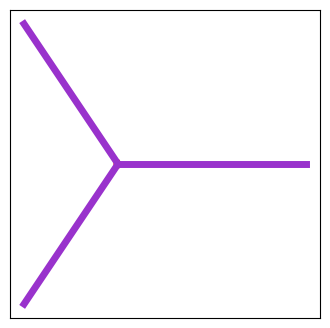

-------------
Index i = 1
Performance:  373500


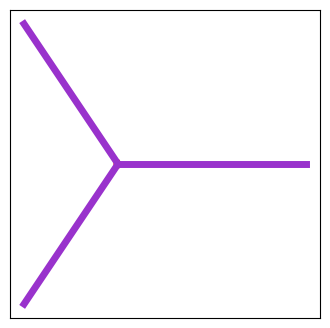

-------------
Index i = 2
Performance:  373500


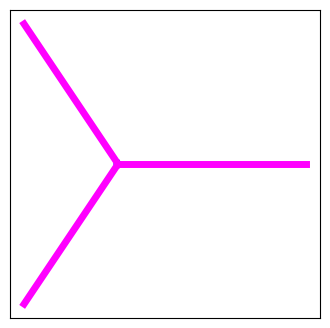

-------------
Index i = 3
Performance:  373500


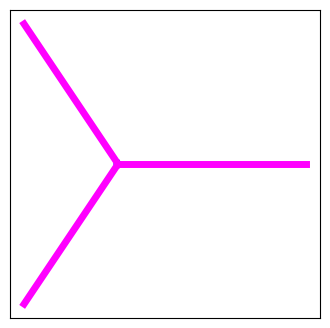

-------------
Index i = 4
Performance:  423790


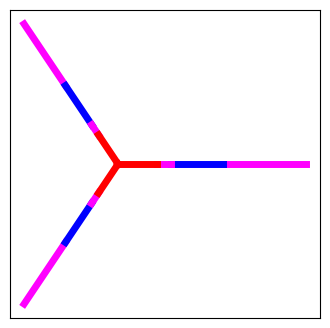

-------------
Index i = 5
Performance:  373500


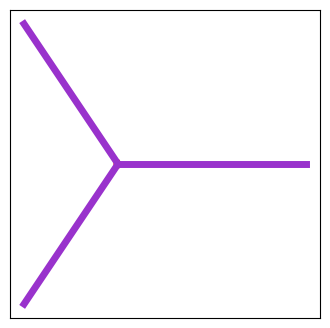

-------------
Index i = 6
Performance:  373500


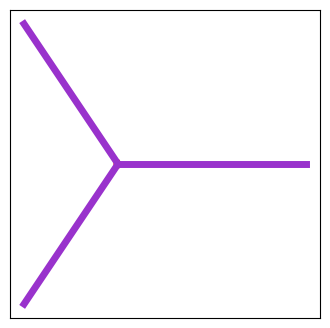

-------------
Index i = 7
Performance:  373500


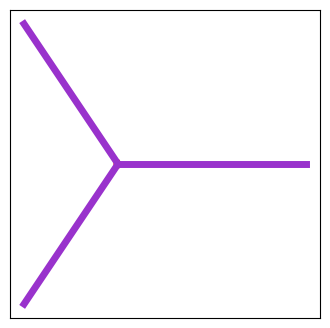

-------------
Index i = 8
Performance:  373500


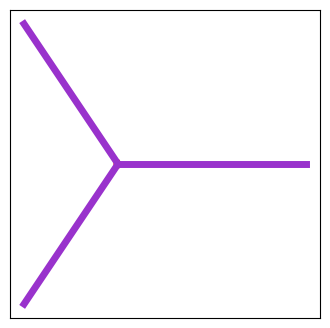

-------------
Index i = 9
Performance:  373500


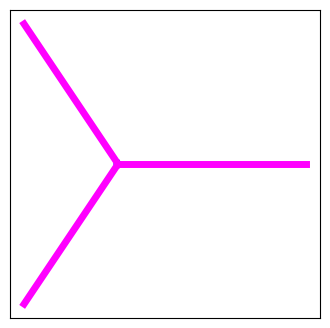

-------------
Index i = 10
Performance:  373500


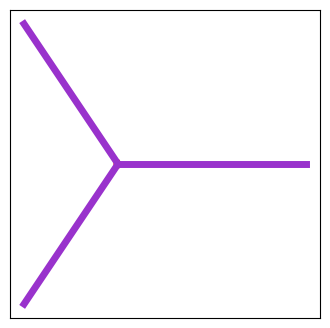

-------------
Index i = 11
Performance:  373500


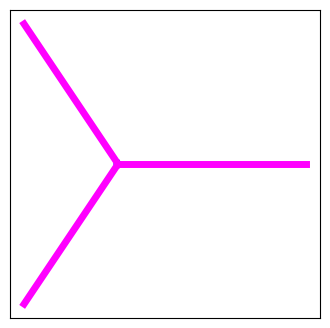

-------------
Index i = 12
Performance:  373500


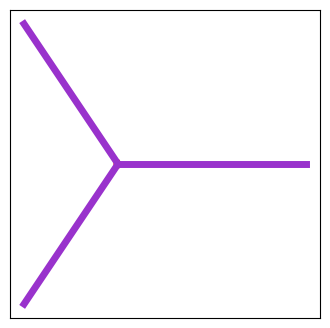

-------------
Index i = 13
Performance:  373500


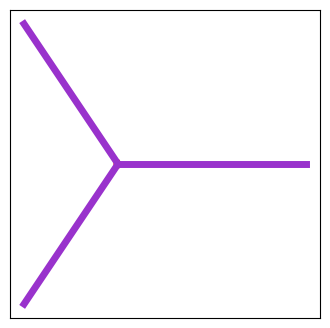

-------------
Index i = 14
Performance:  373500


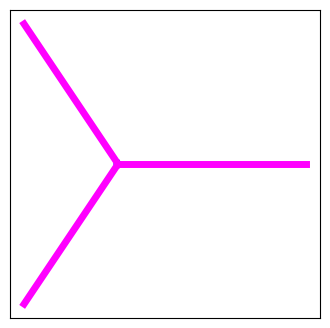

-------------
Index i = 15
Performance:  373500


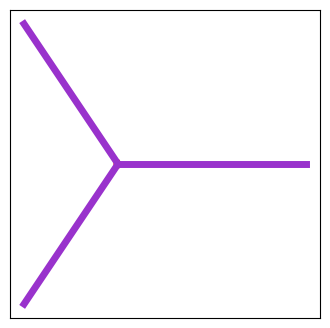

-------------
Index i = 16
Performance:  373500


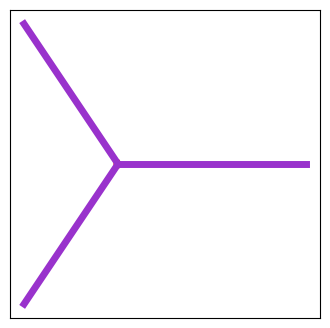

-------------
Index i = 17
Performance:  373500


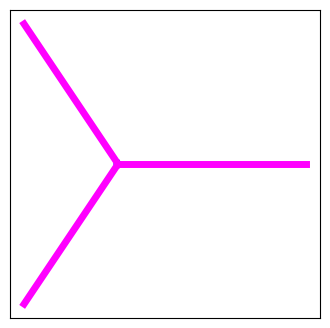

-------------
Index i = 18
Performance:  373500


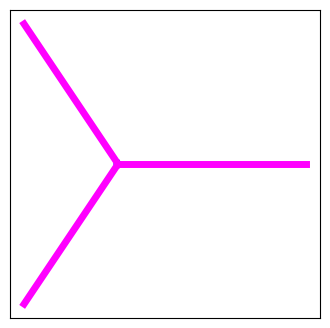

-------------
Index i = 19
Performance:  423790


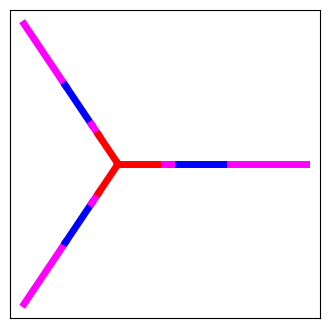

-------------
Index i = 20
Performance:  373500


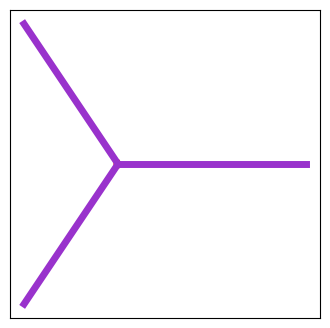

-------------
Index i = 21
Performance:  373500


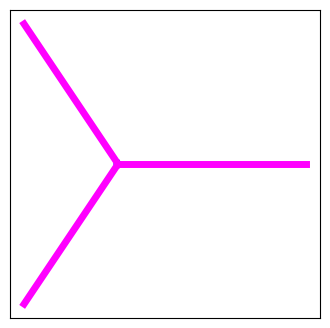

-------------
Index i = 22
Performance:  373500


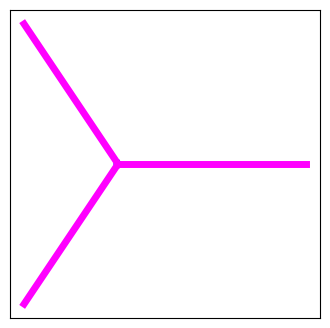

-------------
Index i = 23
Performance:  373500


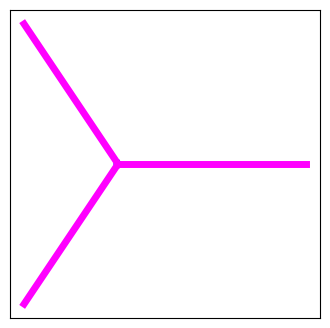

-------------
Index i = 24
Performance:  373500


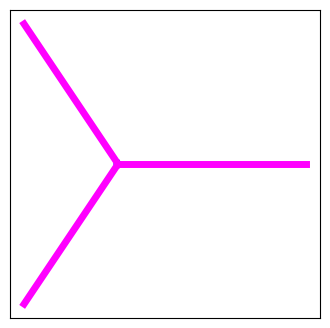

-------------
Index i = 25
Performance:  423790


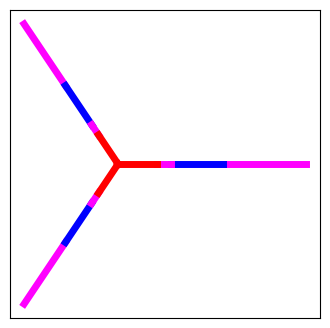

-------------
Index i = 26
Performance:  373500


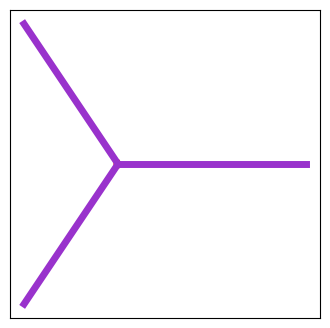

-------------
Index i = 27
Performance:  373500


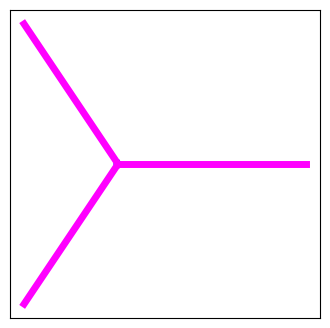

-------------
Index i = 28
Performance:  373500


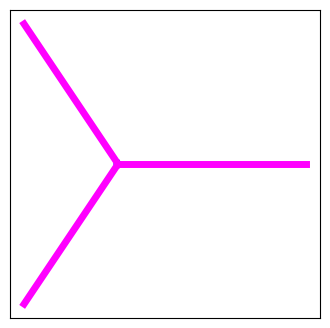

-------------
Index i = 29
Performance:  373500


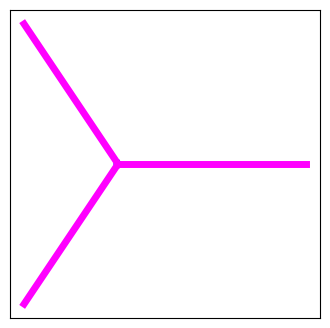

-------------
Index i = 30
Performance:  373500


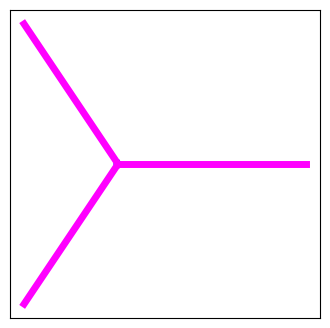

-------------
Index i = 31
Performance:  373500


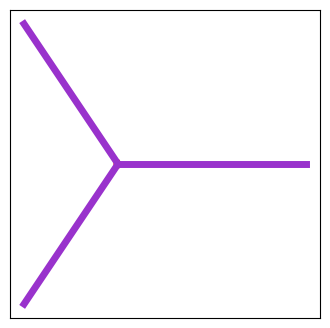

-------------
Index i = 32
Performance:  373500


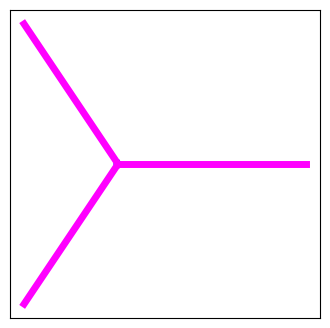

-------------
Index i = 33
Performance:  373500


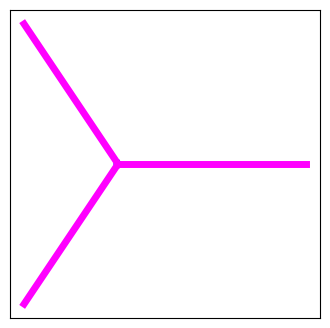

-------------
Index i = 34
Performance:  373500


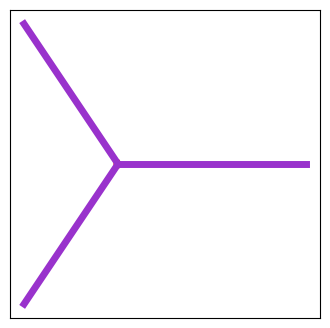

-------------
Index i = 35
Performance:  373500


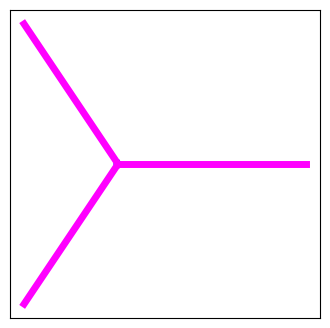

-------------
Index i = 36
Performance:  373500


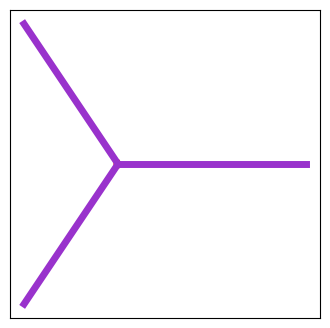

-------------
Index i = 37
Performance:  373500


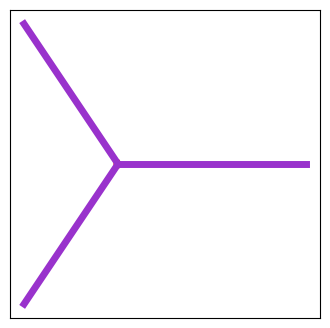

-------------
Index i = 38
Performance:  373500


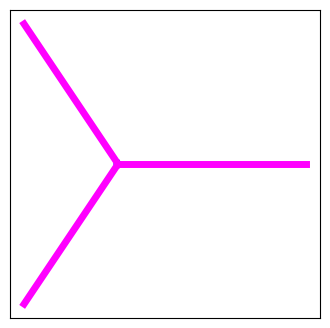

-------------
Index i = 39
Performance:  373500


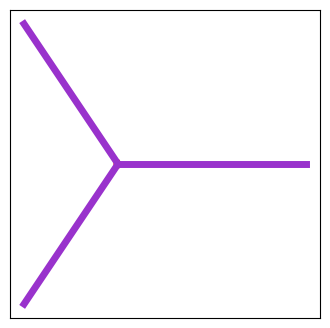

-------------
Index i = 40
Performance:  373500


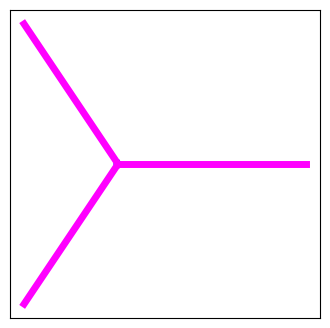

-------------
Index i = 41
Performance:  373500


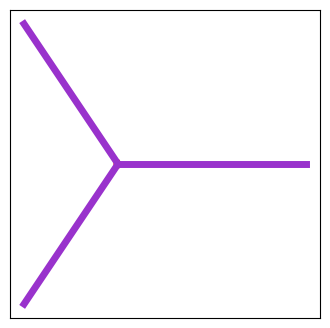

-------------
Index i = 42
Performance:  373500


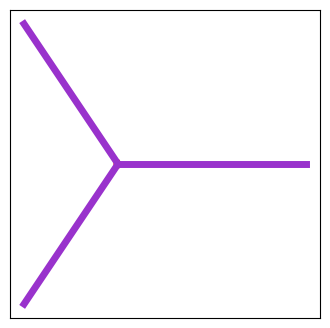

-------------
Index i = 43
Performance:  373500


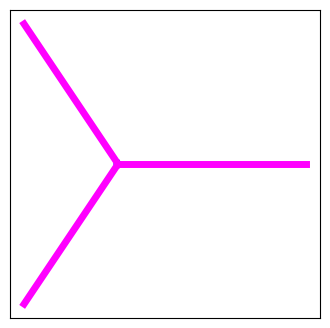

-------------
Index i = 44
Performance:  373500


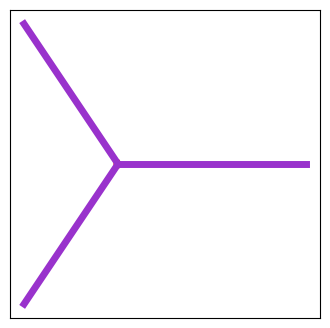

-------------
Index i = 45
Performance:  373500


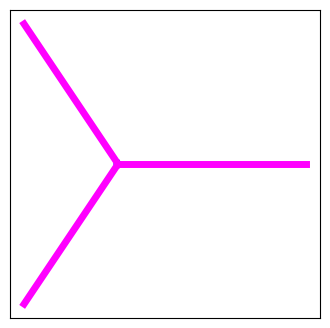

-------------
Index i = 46
Performance:  373500


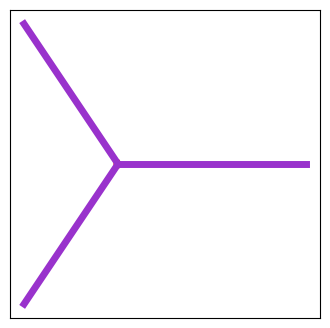

-------------
Index i = 47
Performance:  373500


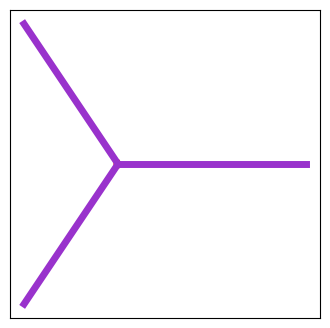

-------------
Index i = 48
Performance:  373500


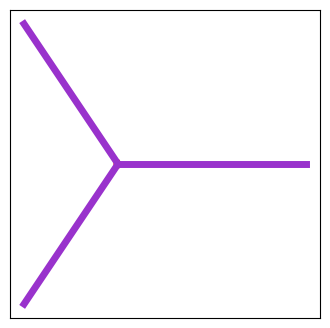

-------------
Index i = 49
Performance:  373500


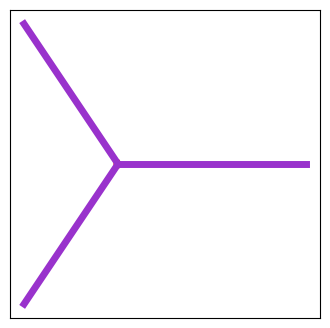

-------------
Index i = 50
Performance:  373500


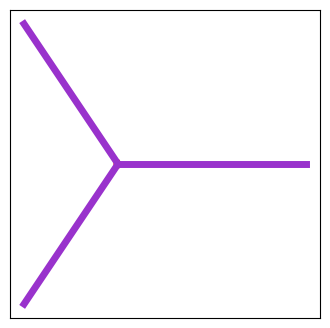

-------------
Index i = 51
Performance:  373500


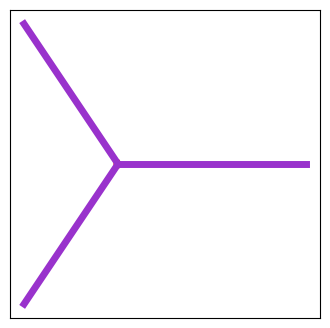

-------------
Index i = 52
Performance:  373500


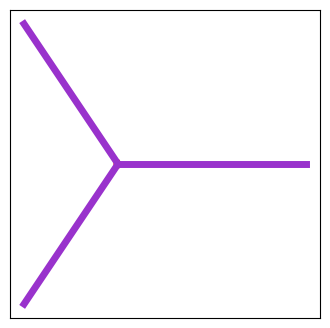

-------------
Index i = 53
Performance:  373500


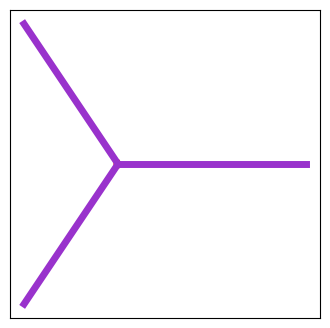

-------------
Index i = 54
Performance:  373500


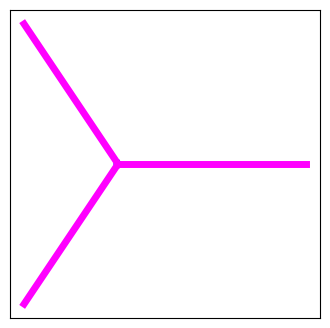

-------------
Index i = 55
Performance:  373500


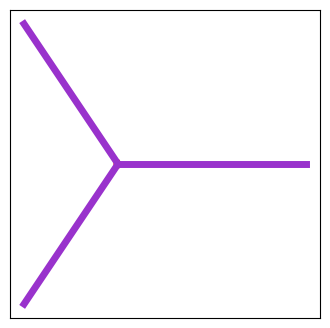

-------------
Index i = 56
Performance:  373500


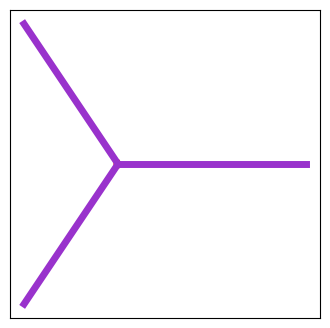

-------------
Index i = 57
Performance:  373500


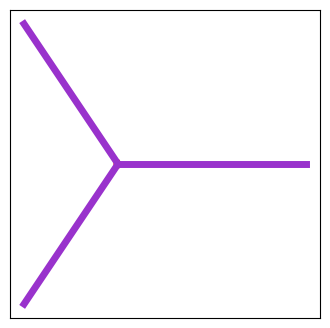

-------------
Index i = 58
Performance:  373500


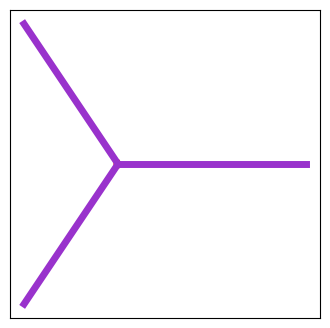

-------------
Index i = 59
Performance:  373500


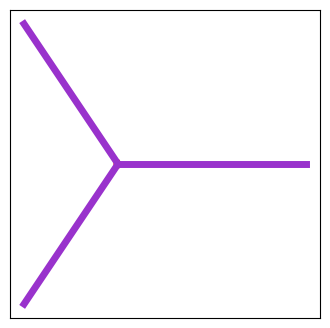

-------------
Index i = 60
Performance:  373500


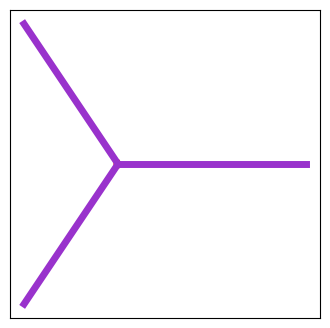

-------------
Index i = 61
Performance:  373500


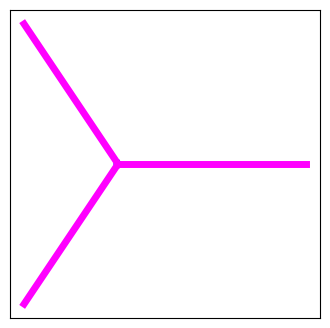

-------------
Index i = 62
Performance:  373500


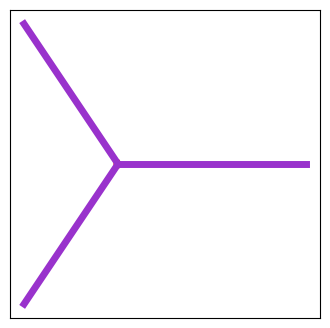

-------------
Index i = 63
Performance:  373500


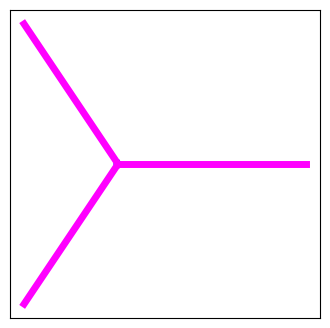

-------------
Index i = 64
Performance:  373500


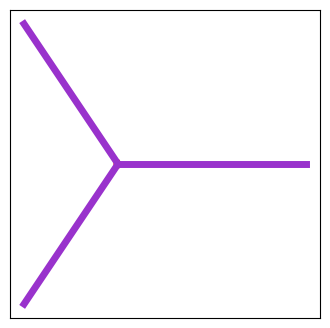

-------------
Index i = 65
Performance:  423790


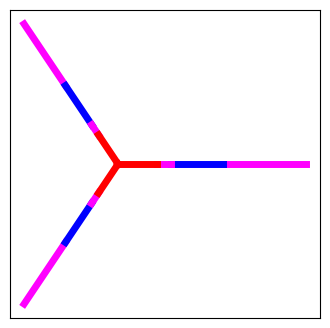

-------------
Index i = 66
Performance:  373500


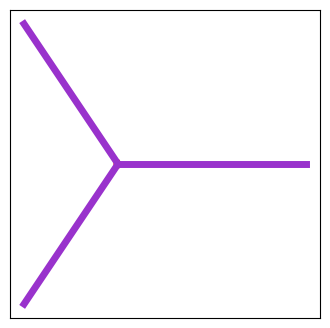

-------------
Index i = 67
Performance:  373500


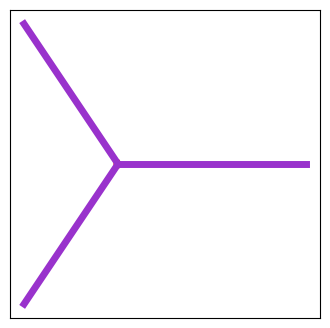

-------------
Index i = 68
Performance:  373500


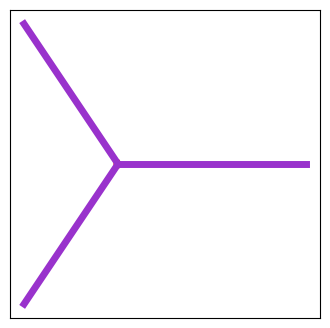

-------------
Index i = 69
Performance:  373500


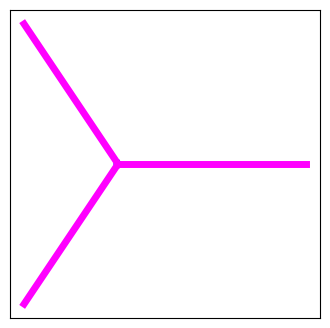

-------------
Index i = 70
Performance:  373500


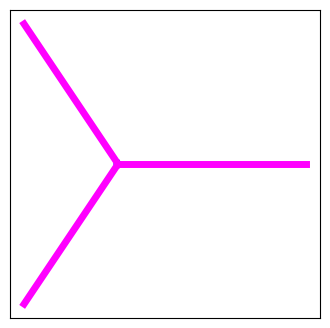

-------------
Index i = 71
Performance:  373500


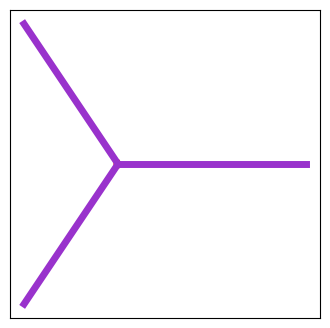

-------------
Index i = 72
Performance:  373500


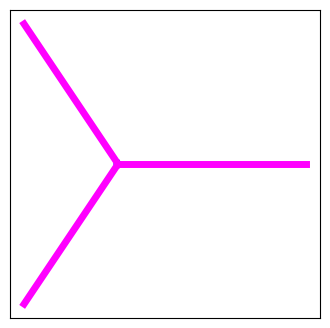

-------------
Index i = 73
Performance:  373500


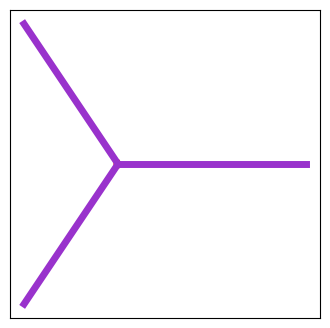

-------------
Index i = 74
Performance:  373500


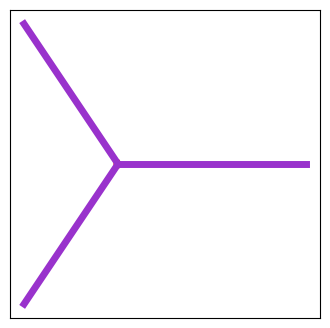

-------------
Index i = 75
Performance:  373500


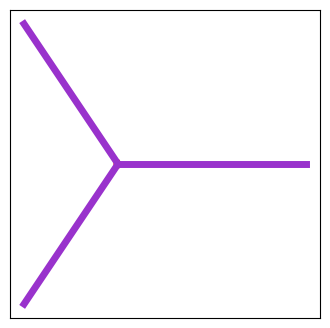

-------------
Index i = 76
Performance:  373500


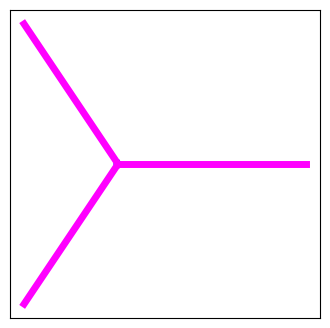

-------------
Index i = 77
Performance:  373500


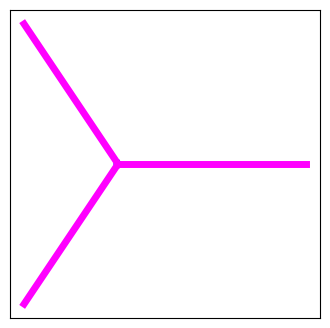

-------------
Index i = 78
Performance:  373500


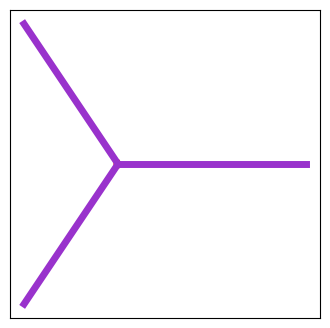

-------------
Index i = 79
Performance:  373500


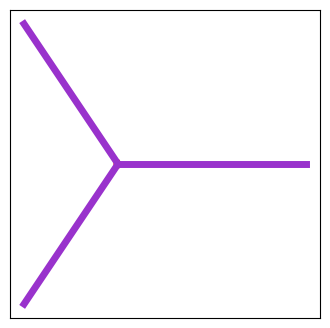

-------------
Index i = 80
Performance:  373500


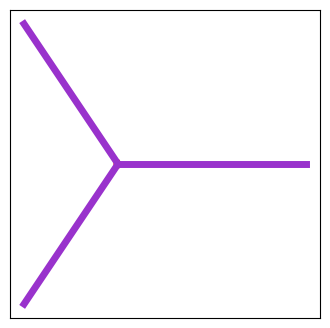

-------------
Index i = 81
Performance:  373500


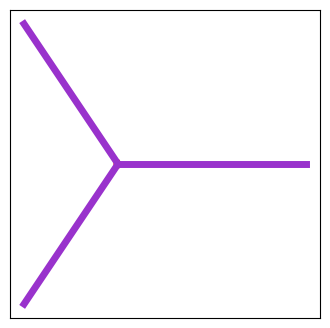

-------------
Index i = 82
Performance:  373500


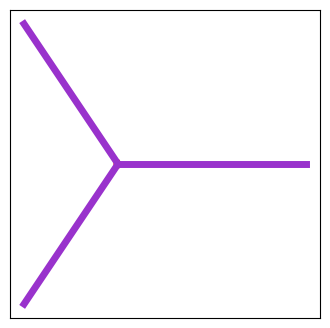

-------------
Index i = 83
Performance:  373500


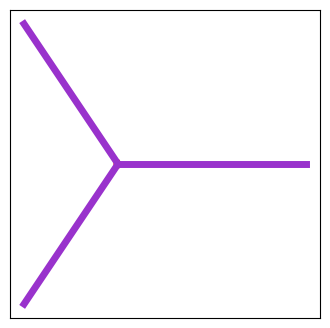

-------------
Index i = 84
Performance:  423790


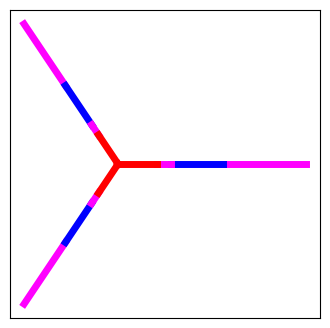

-------------
Index i = 85
Performance:  423790


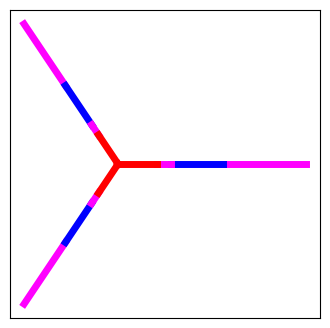

-------------
Index i = 86
Performance:  373500


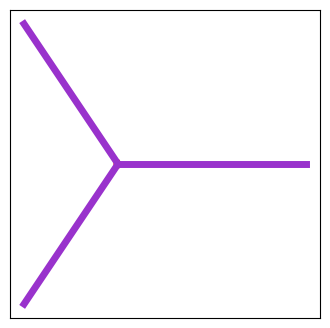

-------------
Index i = 87
Performance:  373500


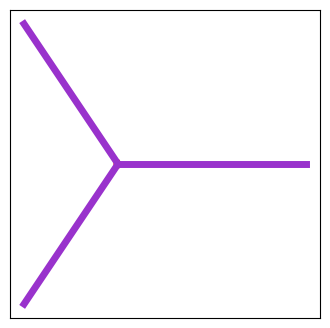

-------------
Index i = 88
Performance:  373500


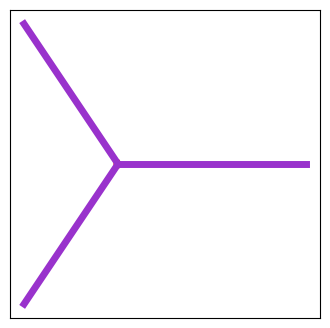

-------------
Index i = 89
Performance:  373500


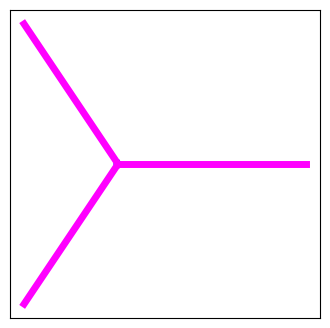

-------------
Index i = 90
Performance:  373500


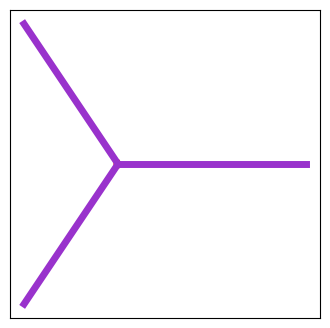

-------------
Index i = 91
Performance:  373500


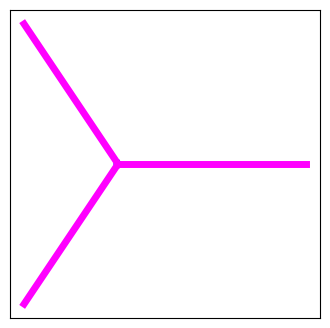

-------------
Index i = 92
Performance:  423790


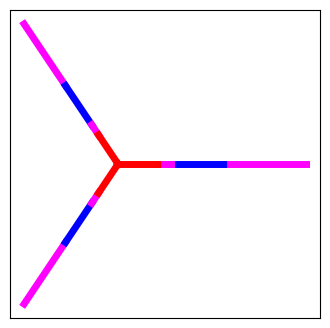

-------------
Index i = 93
Performance:  373500


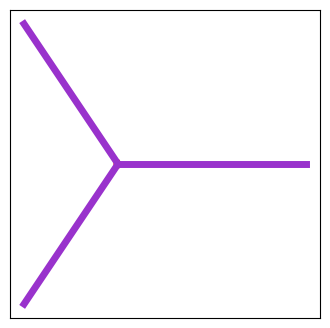

-------------
Index i = 94
Performance:  373500


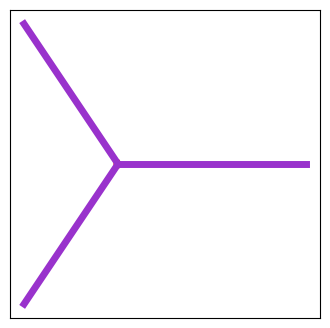

-------------
Index i = 95
Performance:  373500


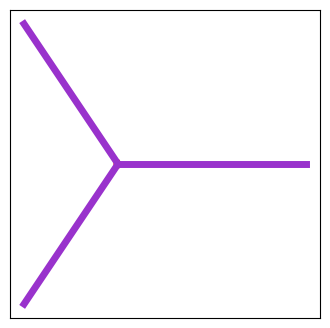

-------------
Index i = 96
Performance:  373500


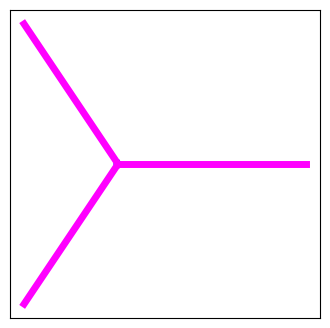

-------------
Index i = 97
Performance:  373500


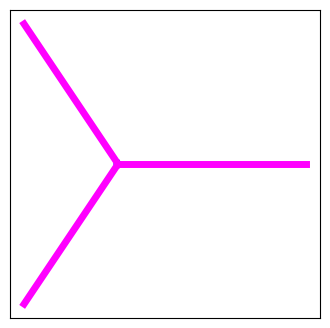

-------------
Index i = 98
Performance:  373500


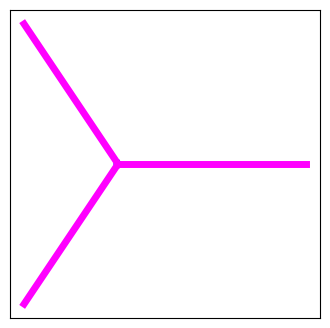

-------------
Index i = 99
Performance:  373500


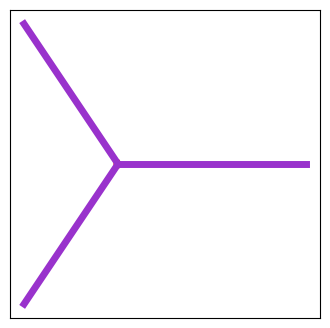

-------------


In [60]:
#Optimal colorings for k-star where k = 3 and n = 1000

np.random.seed(305)
random.seed(844)

colorings_kstar_k3_n1000 = []

for i in range(100):
    print('Index i =', i)
    colorings_kstar_k3_n1000 += [optimize_coloring('S', 'all', random_kcoloring(3, 1000), random_ordering(1000))]
    print('-------------')

In [55]:
# Comparison results for k-star where k = 3 and n = 1000

buckets_for_kstar_k3_n1000 = [colorings_kstar_k3_n1000[0], colorings_kstar_k3_n1000[4]]

compare_list_to_target(colorings_kstar_k3_n1000, buckets_for_kstar_k3_n1000, 'all')

Index i =  0
Bucket ID: Alternating
Number of Progressions: 373500
Percent difference:  0.0 %
----------------
Index i =  1
Bucket ID: Alternating
Number of Progressions: 373500
Percent difference:  0.0 %
----------------
Index i =  2
Bucket ID: Alternating
Number of Progressions: 373500
Percent difference:  0.0 %
----------------
Index i =  3
Bucket ID: Alternating
Number of Progressions: 373500
Percent difference:  0.0 %
----------------
Index i =  4
Bucket ID:  1
Number of Progressions: 423790
Percent difference:  0.0 %
----------------
Index i =  5
Bucket ID: Alternating
Number of Progressions: 373500
Percent difference:  0.0 %
----------------
Index i =  6
Bucket ID: Alternating
Number of Progressions: 373500
Percent difference:  0.0 %
----------------
Index i =  7
Bucket ID: Alternating
Number of Progressions: 373500
Percent difference:  0.0 %
----------------
Index i =  8
Bucket ID: Alternating
Number of Progressions: 373500
Percent difference:  0.0 %
----------------
Index i = 

### k=4:

Index i = 0
Performance:  118262


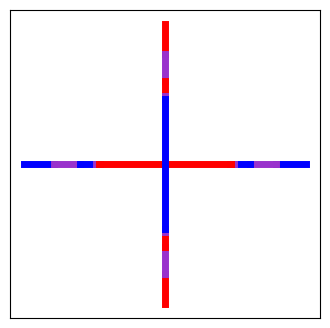

-------------
Index i = 1
Performance:  118260


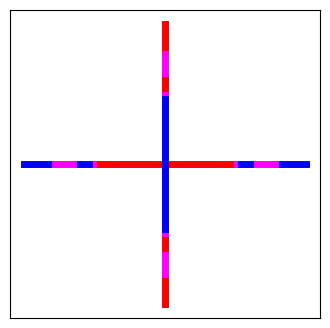

-------------
Index i = 2
Performance:  124000


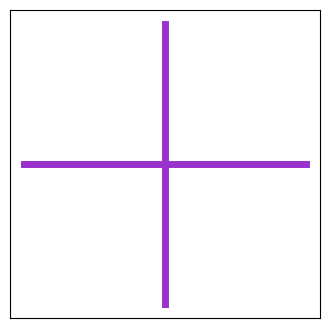

-------------
Index i = 3
Performance:  124000


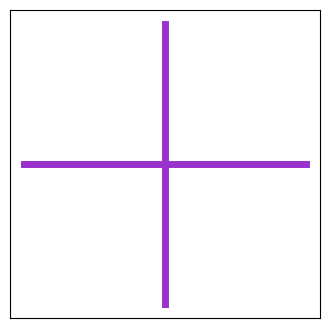

-------------
Index i = 4
Performance:  118261


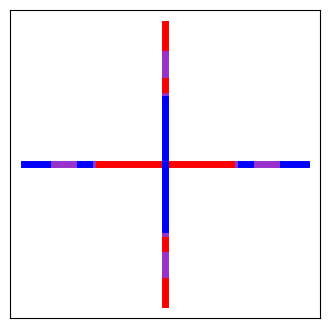

-------------
Index i = 5
Performance:  124000


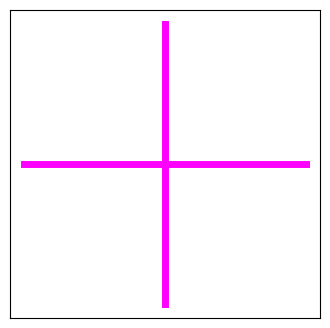

-------------
Index i = 6
Performance:  118261


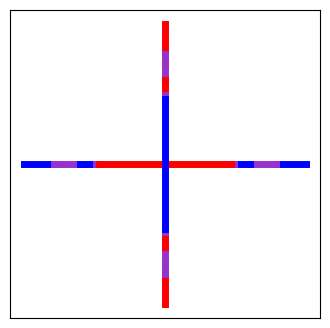

-------------
Index i = 7
Performance:  118260


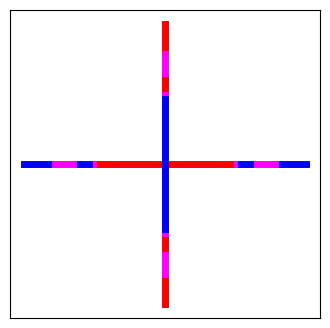

-------------
Index i = 8
Performance:  140720


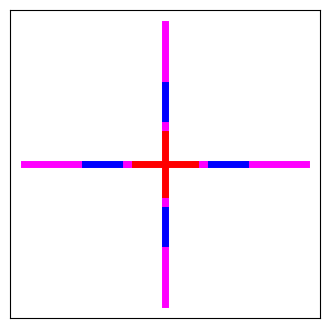

-------------
Index i = 9
Performance:  118260


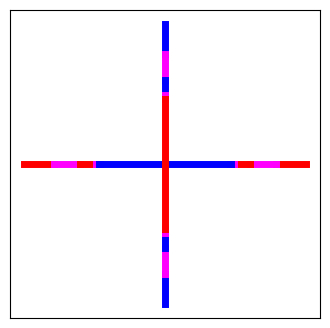

-------------
Index i = 10
Performance:  118262


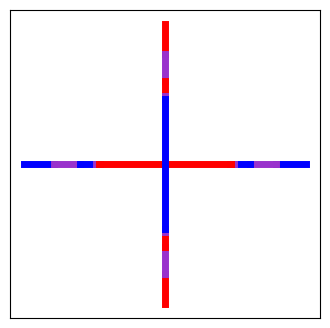

-------------
Index i = 11
Performance:  124000


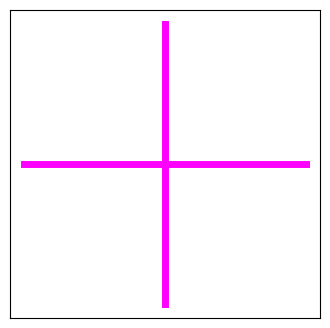

-------------
Index i = 12
Performance:  118262


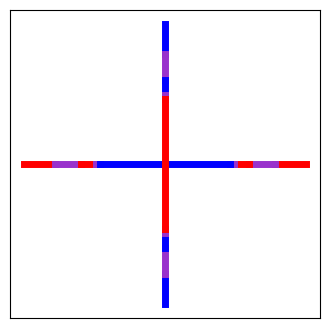

-------------
Index i = 13
Performance:  124000


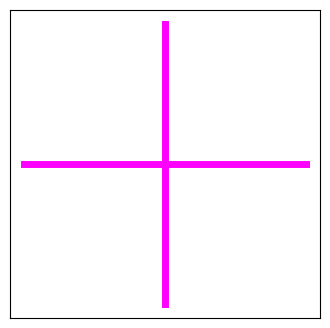

-------------
Index i = 14
Performance:  118260


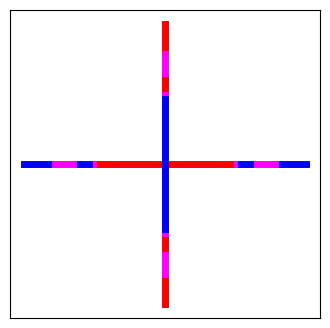

-------------
Index i = 15
Performance:  118260


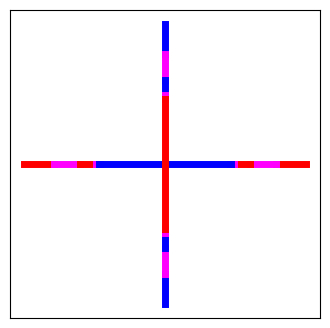

-------------
Index i = 16
Performance:  118260


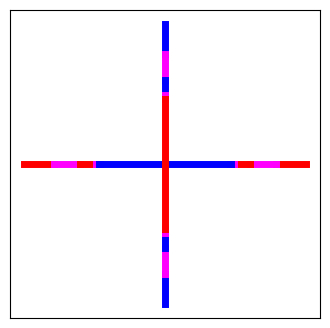

-------------
Index i = 17
Performance:  118261


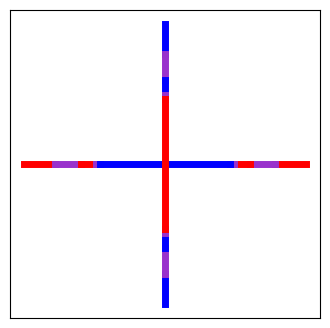

-------------
Index i = 18
Performance:  118260


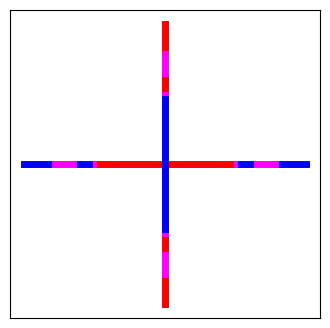

-------------
Index i = 19
Performance:  124000


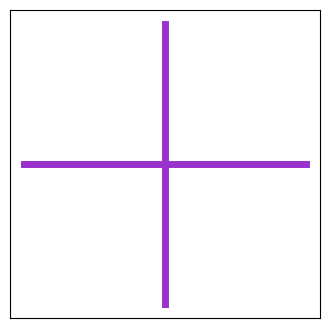

-------------
Index i = 20
Performance:  118260


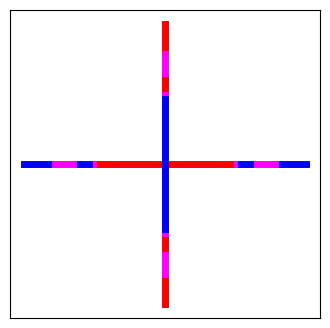

-------------
Index i = 21
Performance:  124000


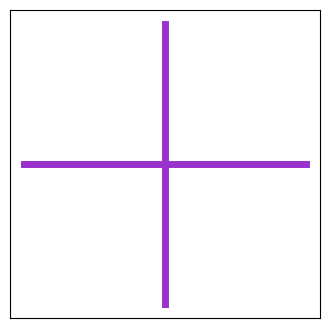

-------------
Index i = 22
Performance:  124000


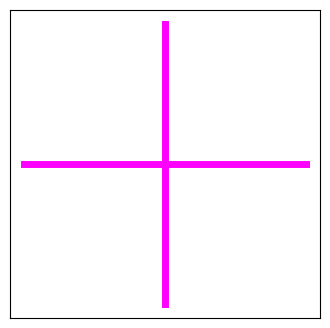

-------------
Index i = 23
Performance:  124000


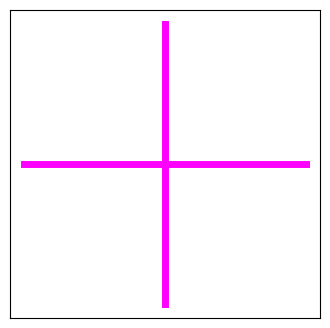

-------------
Index i = 24
Performance:  124000


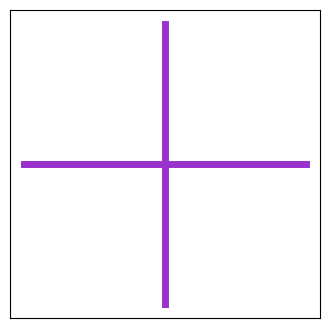

-------------
Index i = 25
Performance:  124000


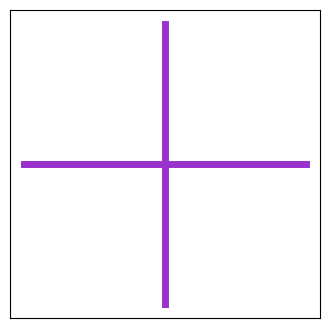

-------------
Index i = 26
Performance:  124000


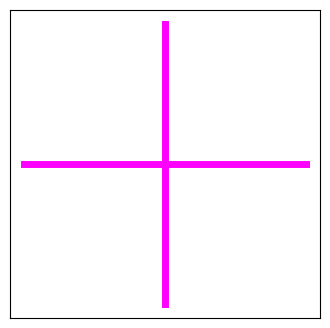

-------------
Index i = 27
Performance:  124000


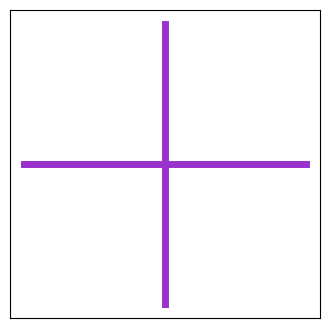

-------------
Index i = 28
Performance:  118262


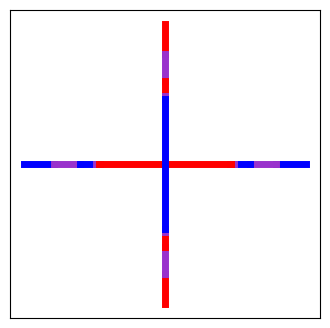

-------------
Index i = 29
Performance:  118260


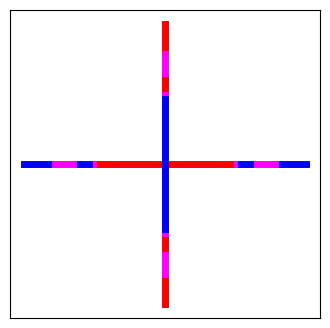

-------------
Index i = 30
Performance:  118261


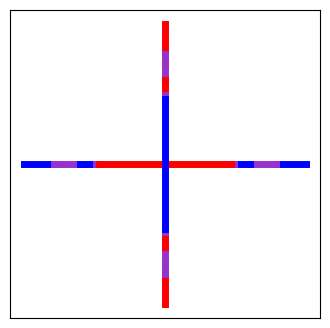

-------------
Index i = 31
Performance:  118260


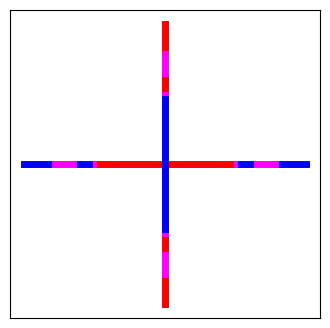

-------------
Index i = 32
Performance:  124000


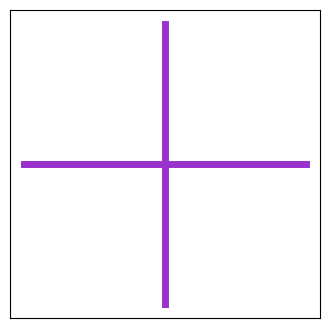

-------------
Index i = 33
Performance:  118261


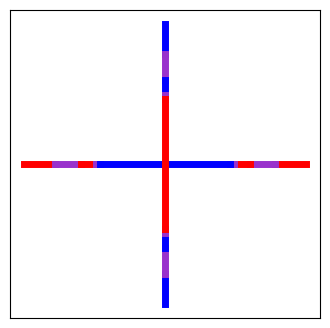

-------------
Index i = 34
Performance:  140720


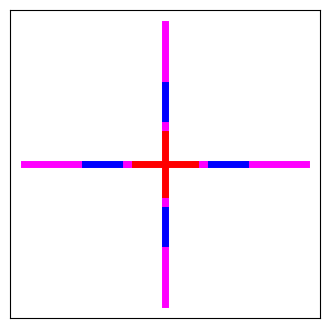

-------------
Index i = 35
Performance:  118260


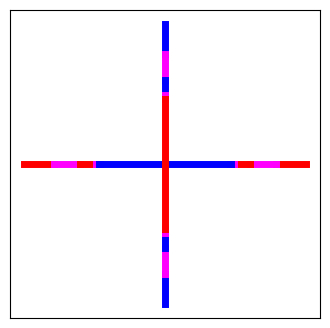

-------------
Index i = 36
Performance:  118261


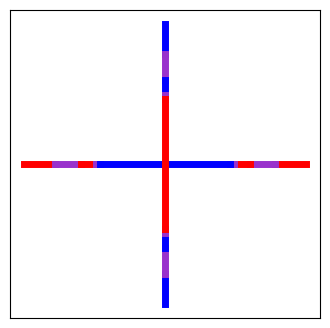

-------------
Index i = 37
Performance:  124000


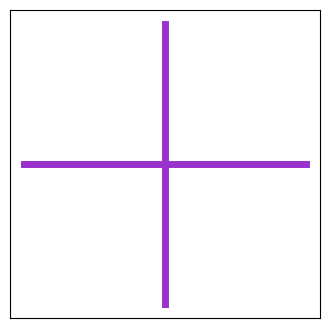

-------------
Index i = 38
Performance:  124000


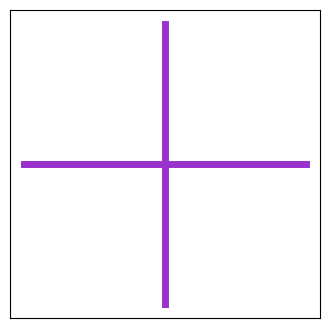

-------------
Index i = 39
Performance:  118260


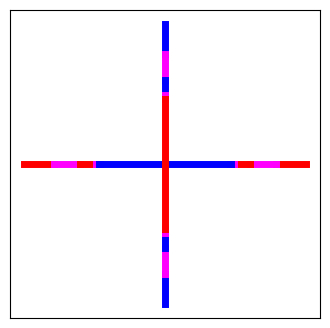

-------------
Index i = 40
Performance:  124000


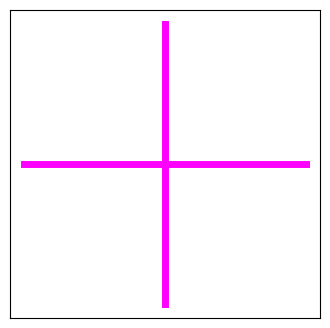

-------------
Index i = 41
Performance:  124000


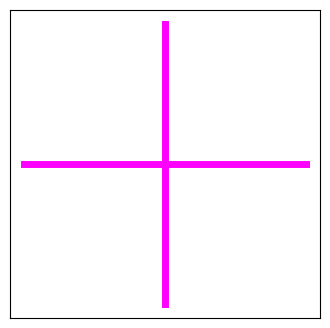

-------------
Index i = 42
Performance:  118261


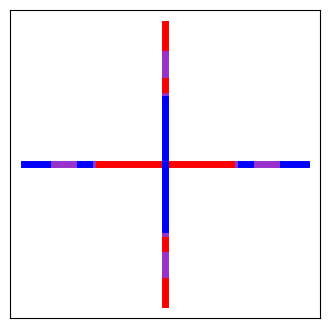

-------------
Index i = 43
Performance:  118260


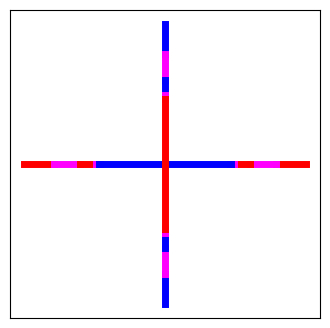

-------------
Index i = 44
Performance:  124000


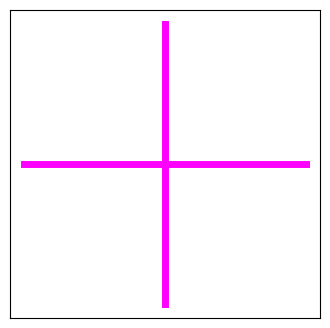

-------------
Index i = 45
Performance:  118262


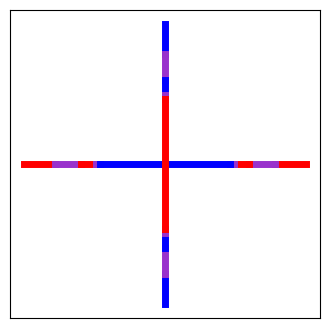

-------------
Index i = 46
Performance:  124000


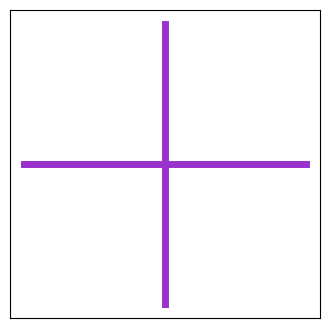

-------------
Index i = 47
Performance:  118260


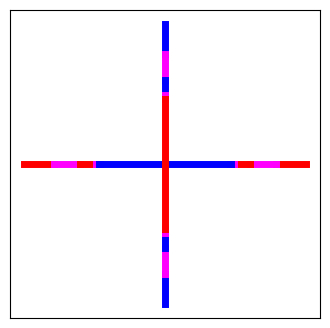

-------------
Index i = 48
Performance:  118260


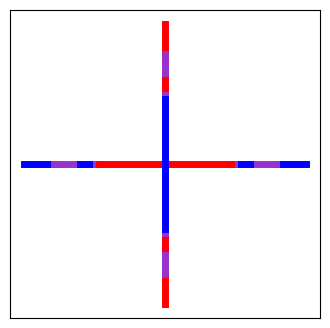

-------------
Index i = 49
Performance:  124000


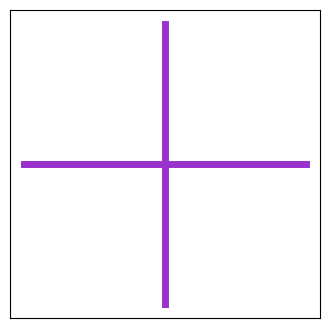

-------------
Index i = 50
Performance:  118260


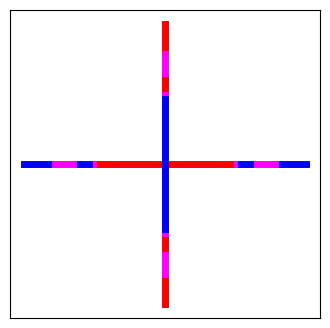

-------------
Index i = 51
Performance:  118261


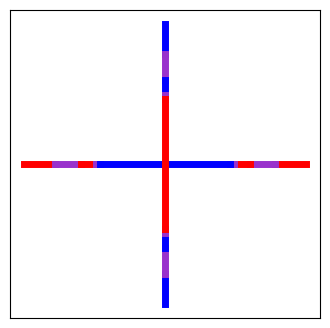

-------------
Index i = 52
Performance:  118260


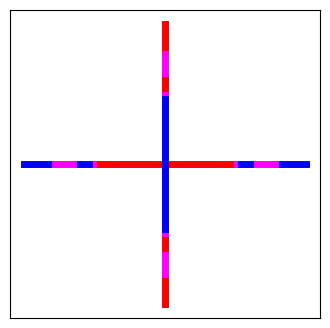

-------------
Index i = 53
Performance:  124000


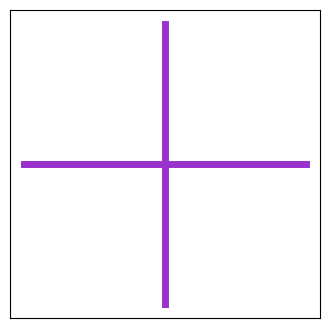

-------------
Index i = 54
Performance:  124000


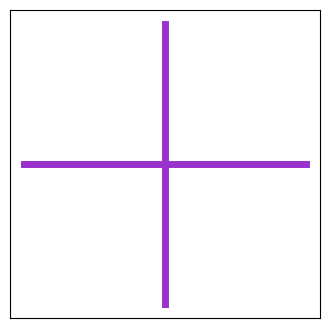

-------------
Index i = 55
Performance:  124000


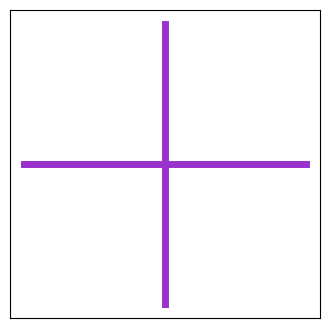

-------------
Index i = 56
Performance:  124000


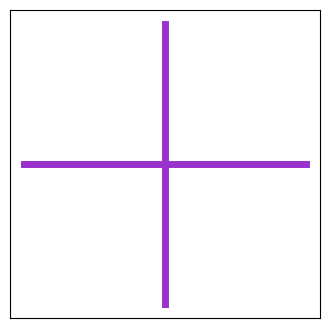

-------------
Index i = 57
Performance:  124000


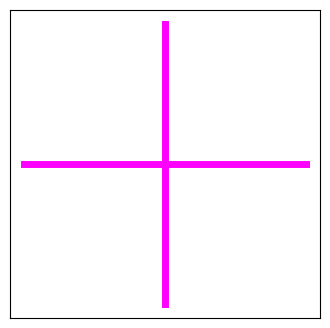

-------------
Index i = 58
Performance:  118260


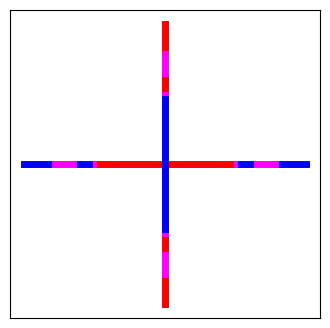

-------------
Index i = 59
Performance:  124000


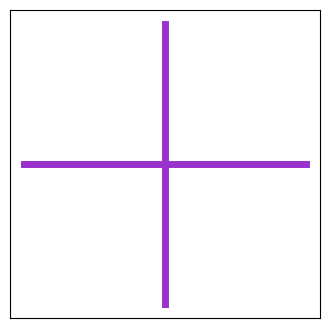

-------------
Index i = 60
Performance:  118262


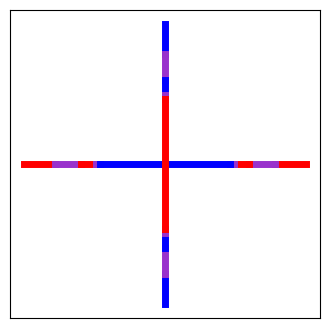

-------------
Index i = 61
Performance:  124000


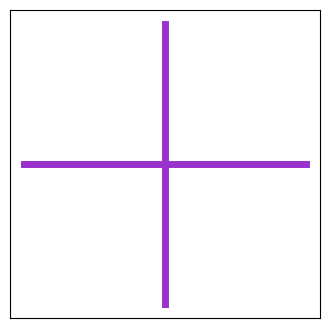

-------------
Index i = 62
Performance:  118261


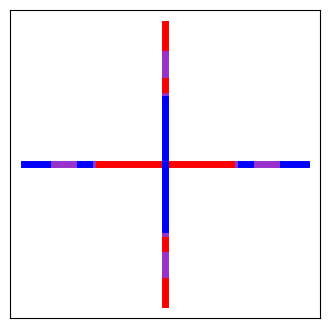

-------------
Index i = 63
Performance:  118262


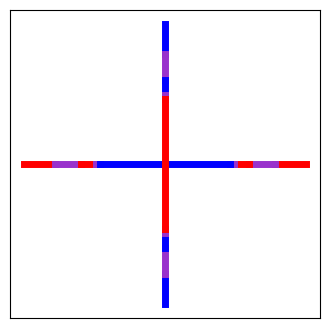

-------------
Index i = 64
Performance:  118260


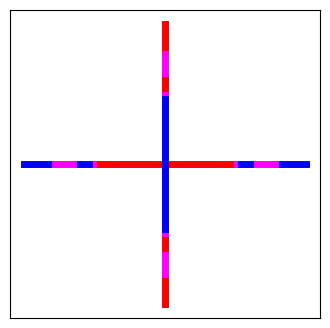

-------------
Index i = 65
Performance:  118261


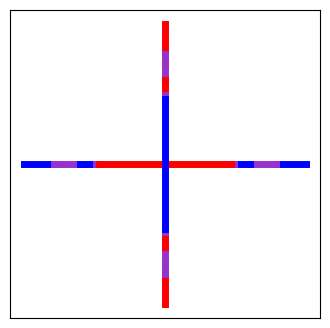

-------------
Index i = 66
Performance:  124000


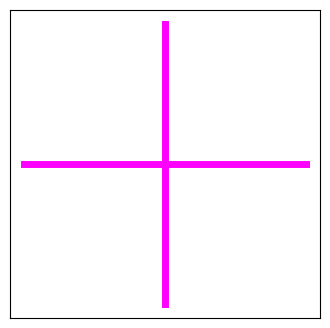

-------------
Index i = 67
Performance:  118262


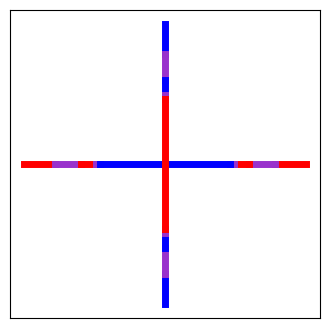

-------------
Index i = 68
Performance:  124000


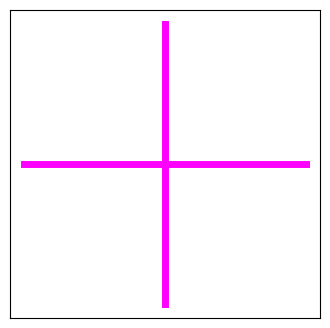

-------------
Index i = 69
Performance:  124000


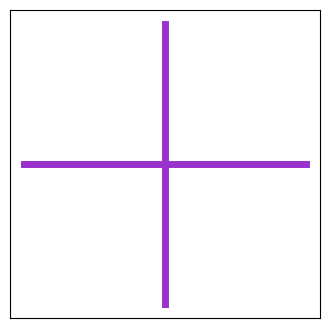

-------------
Index i = 70
Performance:  118261


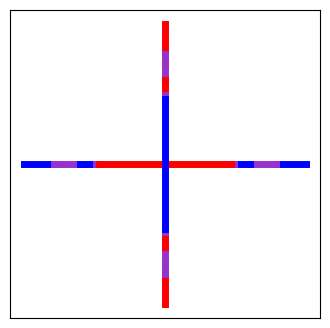

-------------
Index i = 71
Performance:  118262


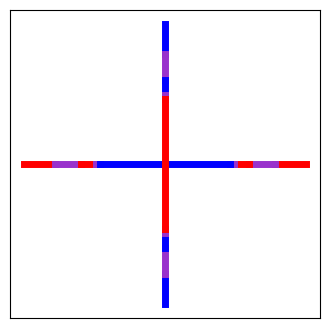

-------------
Index i = 72
Performance:  124000


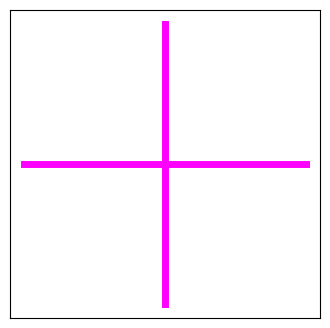

-------------
Index i = 73
Performance:  124000


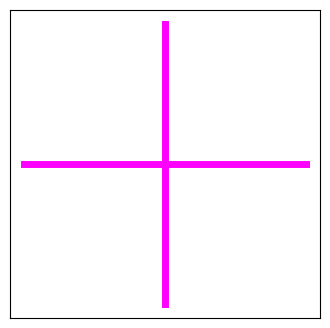

-------------
Index i = 74
Performance:  124000


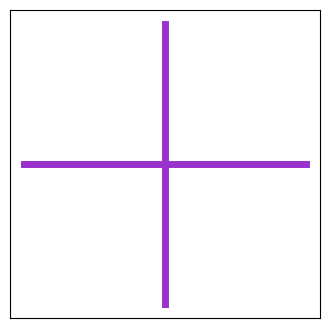

-------------
Index i = 75
Performance:  124000


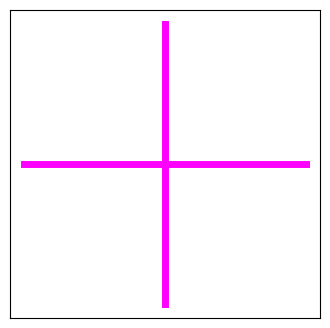

-------------
Index i = 76
Performance:  118262


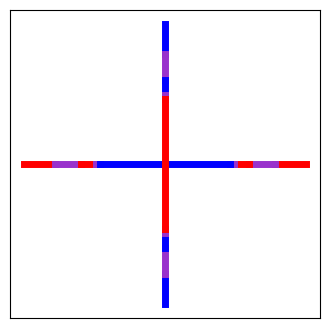

-------------
Index i = 77
Performance:  124000


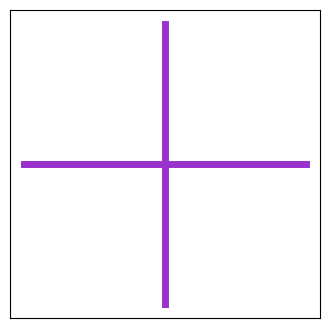

-------------
Index i = 78
Performance:  124000


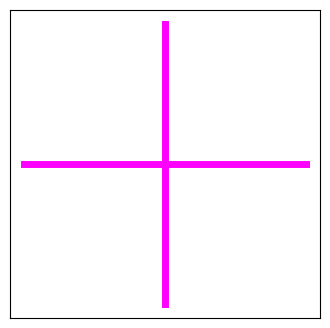

-------------
Index i = 79
Performance:  124000


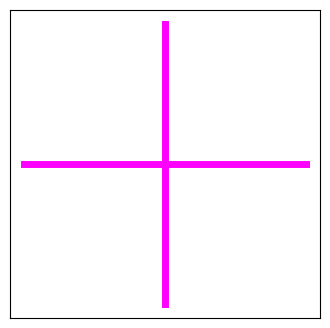

-------------
Index i = 80
Performance:  118260


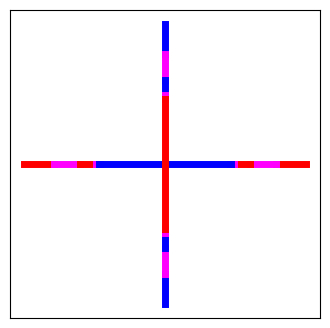

-------------
Index i = 81
Performance:  124000


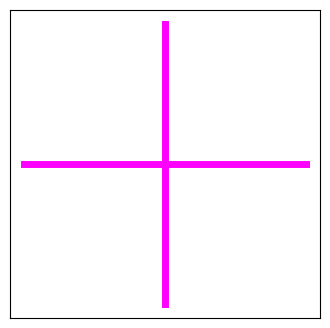

-------------
Index i = 82
Performance:  118260


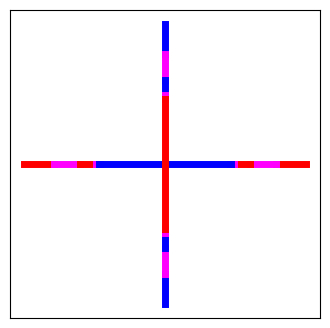

-------------
Index i = 83
Performance:  124000


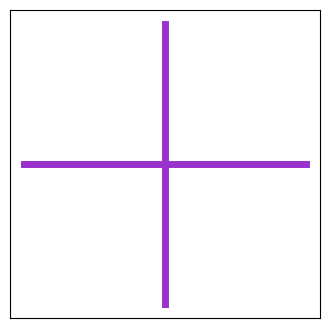

-------------
Index i = 84
Performance:  124000


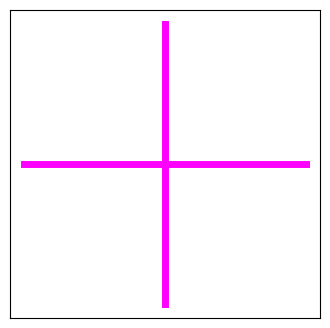

-------------
Index i = 85
Performance:  124000


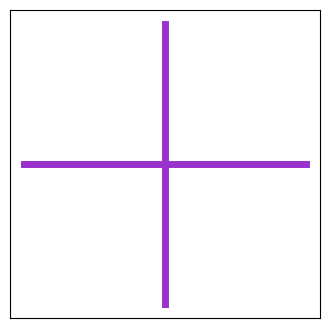

-------------
Index i = 86
Performance:  118260


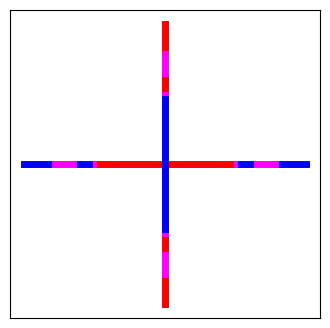

-------------
Index i = 87
Performance:  118260


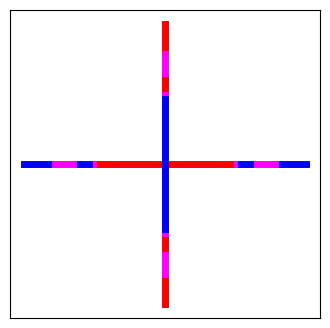

-------------
Index i = 88
Performance:  124000


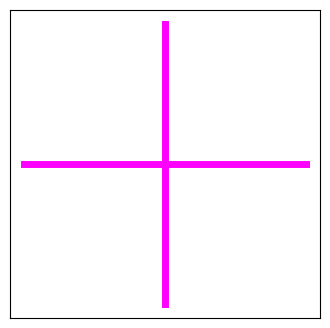

-------------
Index i = 89
Performance:  118260


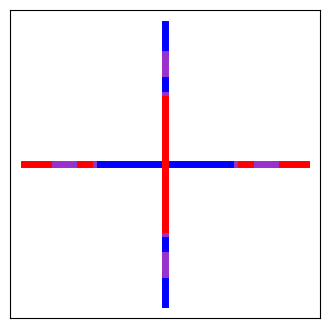

-------------
Index i = 90
Performance:  118260


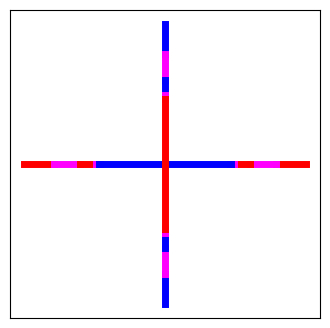

-------------
Index i = 91
Performance:  118262


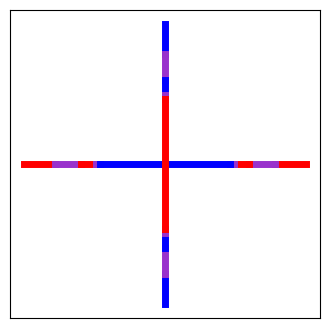

-------------
Index i = 92
Performance:  124000


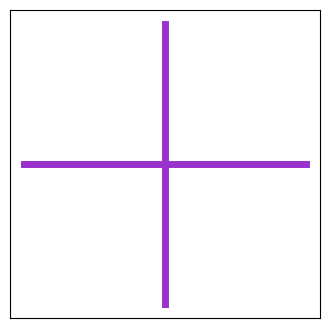

-------------
Index i = 93
Performance:  124000


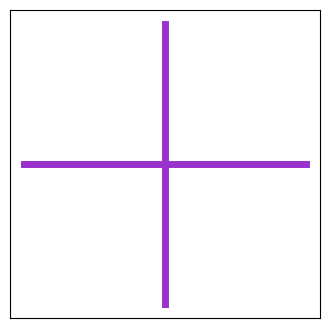

-------------
Index i = 94
Performance:  124000


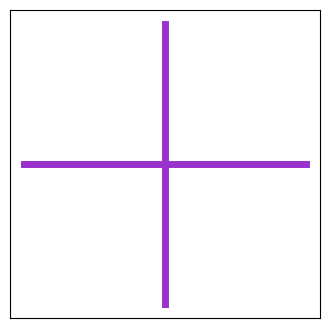

-------------
Index i = 95
Performance:  118260


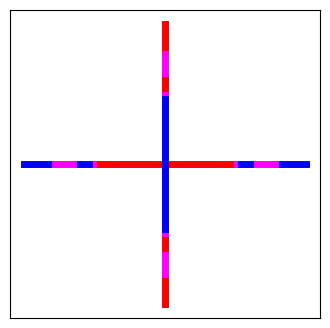

-------------
Index i = 96
Performance:  118260


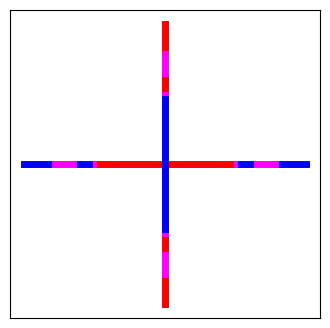

-------------
Index i = 97
Performance:  118262


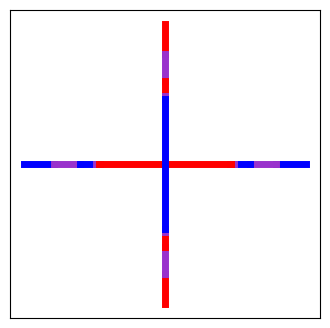

-------------
Index i = 98
Performance:  124000


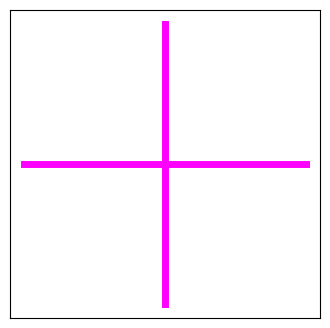

-------------
Index i = 99
Performance:  124000


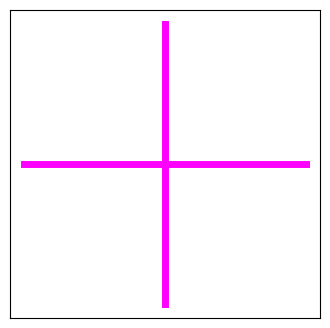

-------------


In [63]:
#Optimal colorings for k-star where k = 4 and n = 500 considering adjacent pairs of arms

np.random.seed(678)
random.seed(254)

colorings_kstar_adj_k4_n500 = []

for i in range(100):
    print('Index i =', i)
    colorings_kstar_adj_k4_n500 += [optimize_coloring('S', 'adj', random_kcoloring(4, 500), random_ordering(500))]
    print('-------------')

In [74]:
#Optimal colorings for k-star where k = 4 and n = 500 considering adjacent pairs of arms

buckets_for_kstar_adj_k4_n500 = [colorings_kstar_adj_k4_n500[2], colorings_kstar_adj_k4_n500[1], colorings_kstar_adj_k4_n500[8]]

compare_list_to_target(colorings_kstar_adj_k4_n500, buckets_for_kstar_adj_k4_n500, 'adj')

Index i =  0
Bucket ID:  1
Number of Progressions: 118262
Percent difference:  0.4 %
----------------
Index i =  1
Bucket ID:  1
Number of Progressions: 118260
Percent difference:  0.0 %
----------------
Index i =  2
Bucket ID: Alternating
Number of Progressions: 124000
Percent difference:  0.0 %
----------------
Index i =  3
Bucket ID: Alternating
Number of Progressions: 124000
Percent difference:  0.0 %
----------------
Index i =  4
Bucket ID:  1
Number of Progressions: 118261
Percent difference:  0.4 %
----------------
Index i =  5
Bucket ID: Alternating
Number of Progressions: 124000
Percent difference:  0.0 %
----------------
Index i =  6
Bucket ID:  1
Number of Progressions: 118261
Percent difference:  0.4 %
----------------
Index i =  7
Bucket ID:  1
Number of Progressions: 118260
Percent difference:  0.0 %
----------------
Index i =  8
Bucket ID:  2
Number of Progressions: 140720
Percent difference:  0.0 %
----------------
Index i =  9
Bucket ID:  1
Number of Progressions: 1182

Index i = 0
Performance:  498000


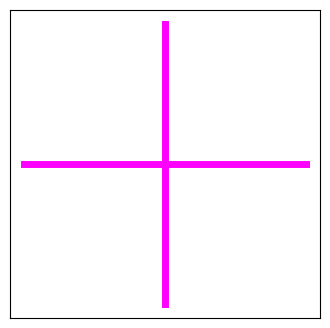

-------------
Index i = 1
Performance:  475038


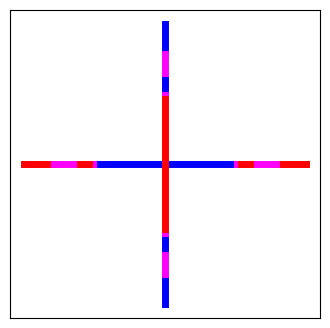

-------------
Index i = 2
Performance:  498000


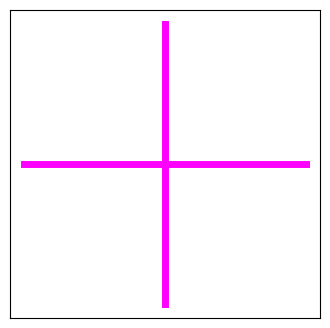

-------------
Index i = 3
Performance:  498000


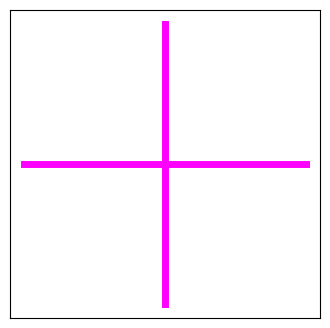

-------------
Index i = 4
Performance:  498000


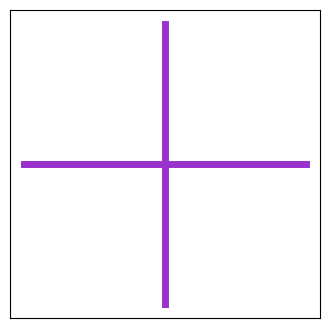

-------------
Index i = 5
Performance:  475038


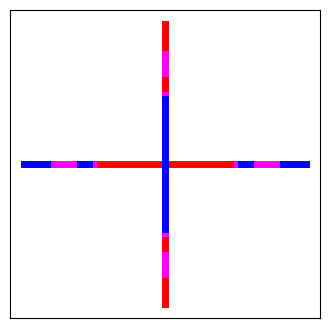

-------------
Index i = 6
Performance:  475034


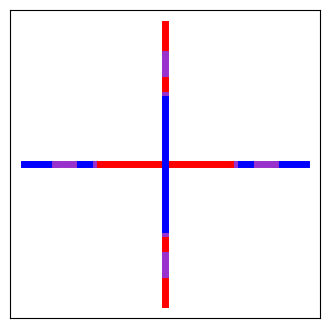

-------------
Index i = 7
Performance:  498000


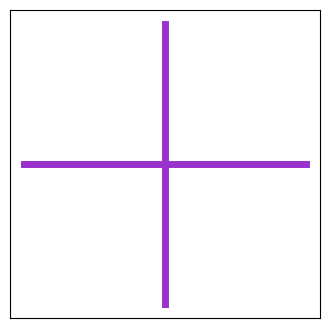

-------------
Index i = 8
Performance:  498000


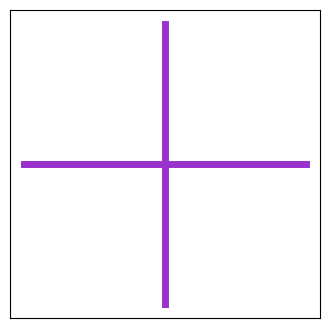

-------------
Index i = 9
Performance:  498000


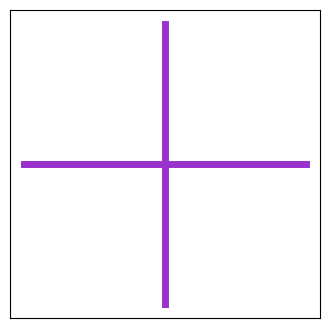

-------------
Index i = 10
Performance:  498000


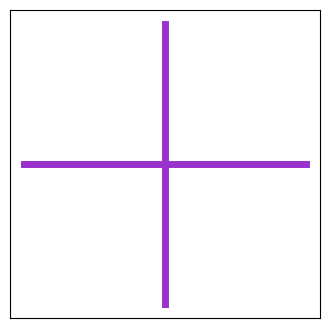

-------------
Index i = 11
Performance:  498000


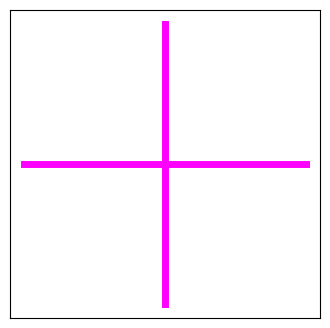

-------------
Index i = 12
Performance:  475038


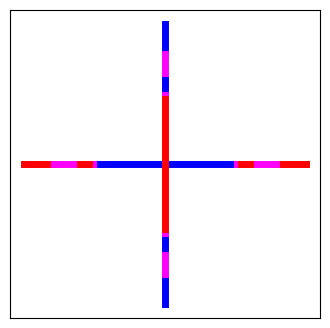

-------------
Index i = 13
Performance:  475038


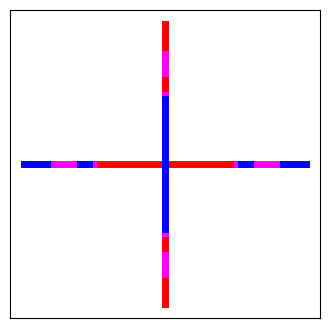

-------------
Index i = 14
Performance:  475034


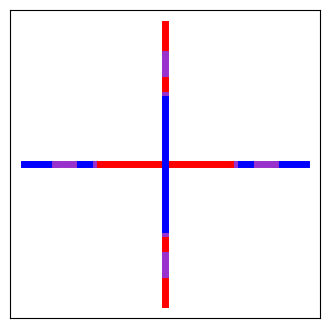

-------------
Index i = 15
Performance:  498000


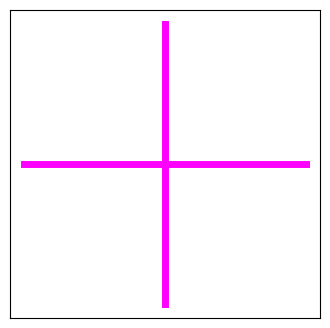

-------------
Index i = 16
Performance:  475038


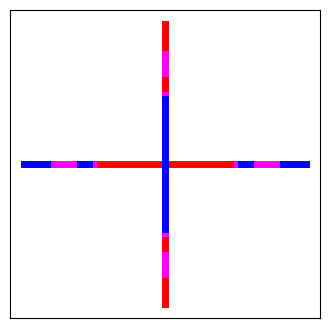

-------------
Index i = 17
Performance:  475034


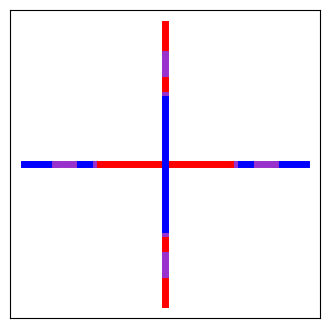

-------------
Index i = 18
Performance:  475034


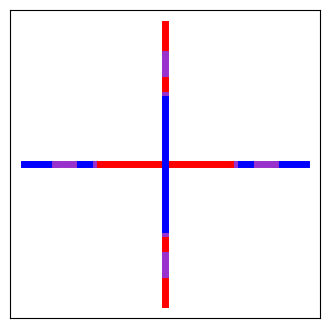

-------------
Index i = 19
Performance:  498000


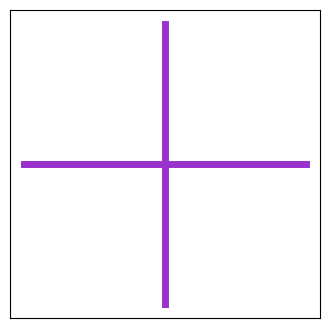

-------------
Index i = 20
Performance:  475034


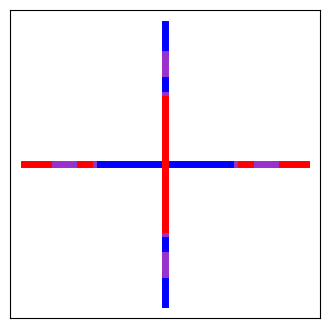

-------------
Index i = 21
Performance:  498000


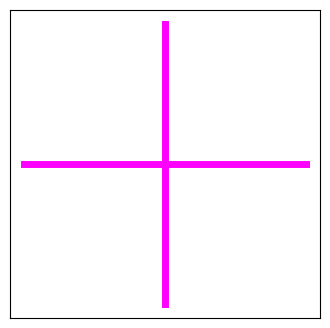

-------------
Index i = 22
Performance:  498000


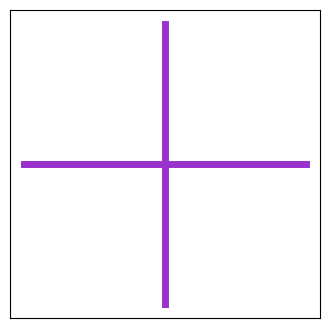

-------------
Index i = 23
Performance:  475038


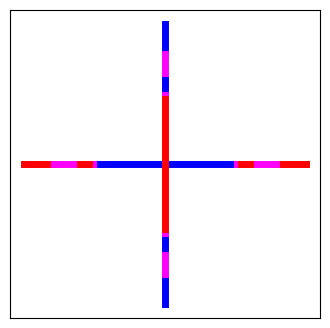

-------------
Index i = 24
Performance:  475034


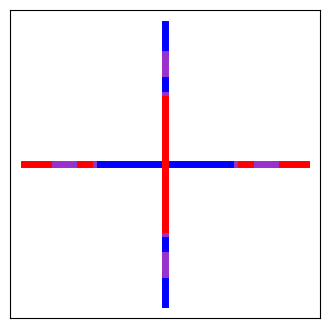

-------------
Index i = 25
Performance:  475038


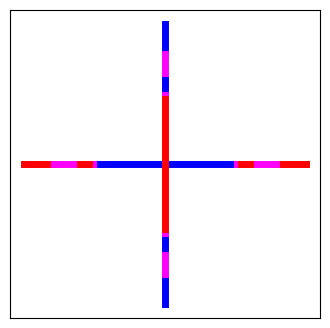

-------------
Index i = 26
Performance:  498000


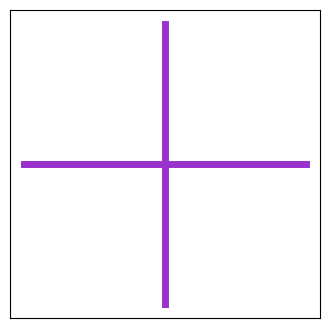

-------------
Index i = 27
Performance:  498000


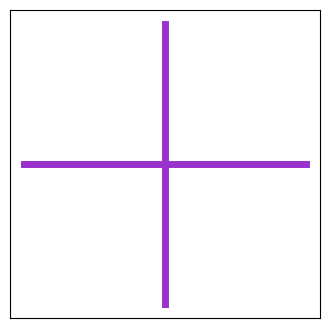

-------------
Index i = 28
Performance:  498000


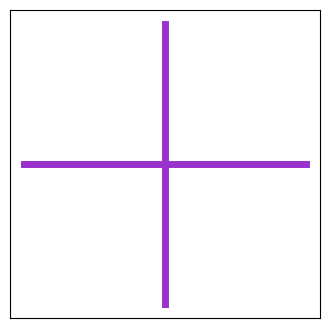

-------------
Index i = 29
Performance:  498000


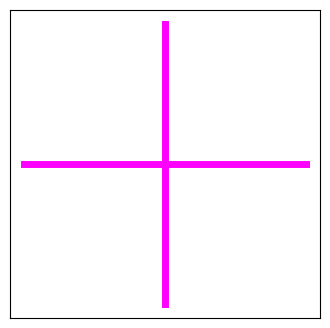

-------------
Index i = 30
Performance:  475034


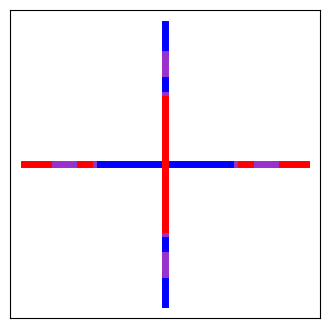

-------------
Index i = 31
Performance:  498000


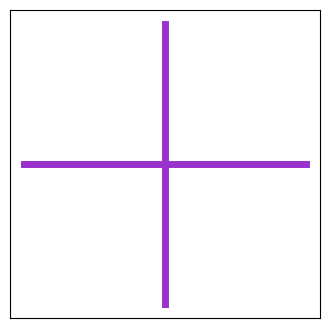

-------------
Index i = 32
Performance:  475034


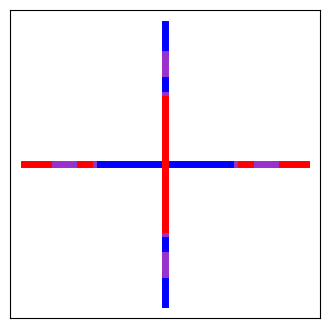

-------------
Index i = 33
Performance:  475034


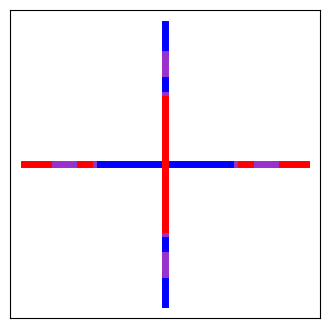

-------------
Index i = 34
Performance:  498000


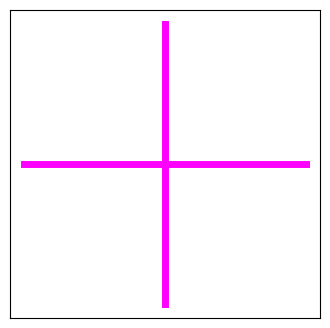

-------------
Index i = 35
Performance:  475034


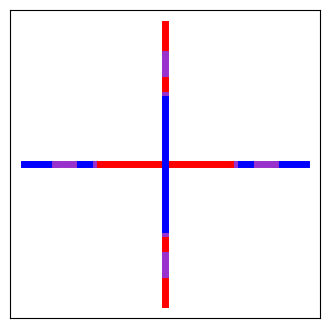

-------------
Index i = 36
Performance:  498000


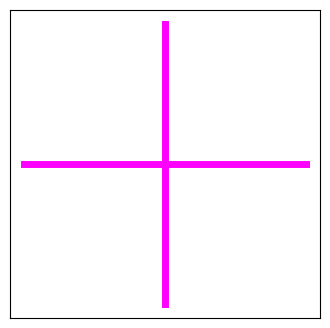

-------------
Index i = 37
Performance:  475034


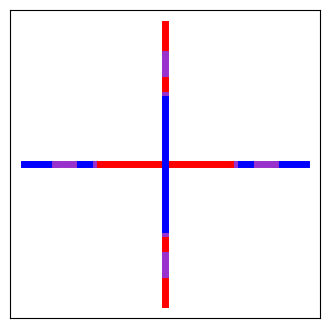

-------------
Index i = 38
Performance:  498000


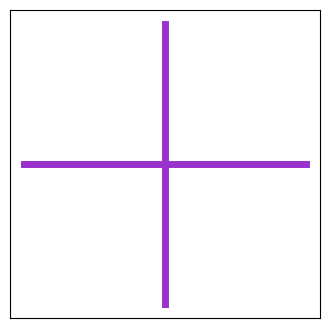

-------------
Index i = 39
Performance:  475038


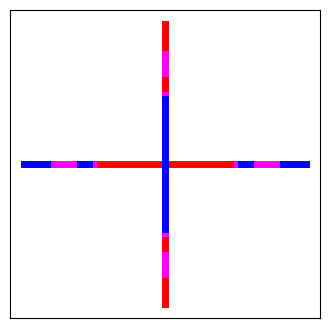

-------------
Index i = 40
Performance:  498000


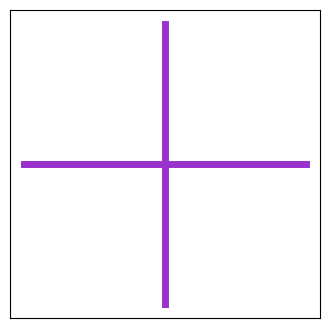

-------------
Index i = 41
Performance:  498000


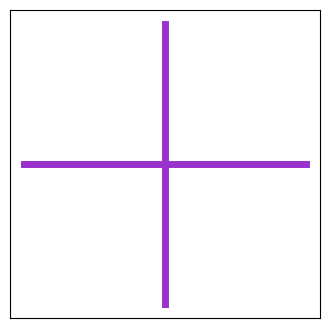

-------------
Index i = 42
Performance:  475034


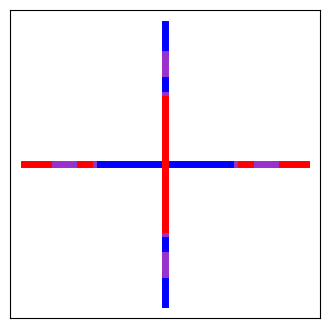

-------------
Index i = 43
Performance:  498000


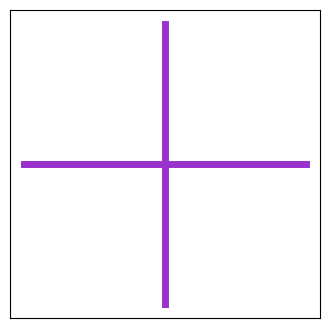

-------------
Index i = 44
Performance:  498000


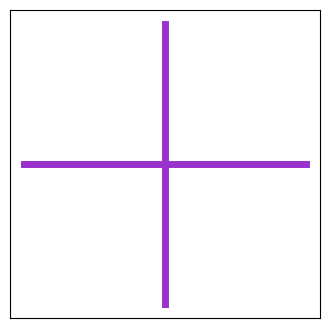

-------------
Index i = 45
Performance:  475038


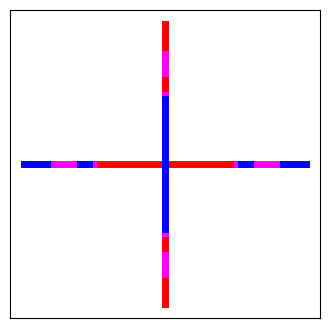

-------------
Index i = 46
Performance:  498000


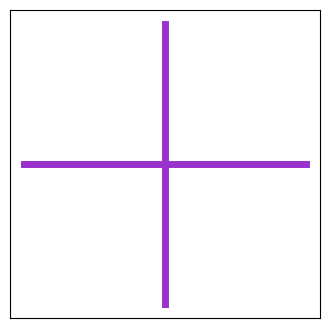

-------------
Index i = 47
Performance:  498000


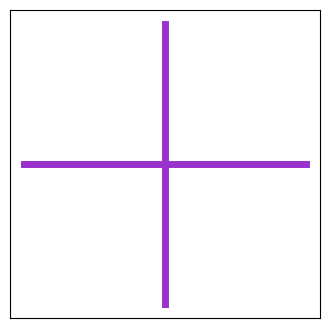

-------------
Index i = 48
Performance:  498000


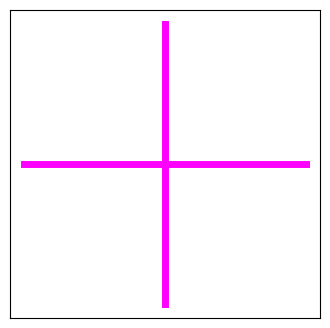

-------------
Index i = 49
Performance:  475034


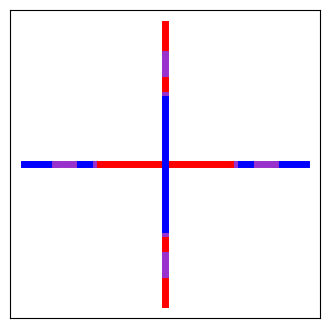

-------------
Index i = 50
Performance:  498000


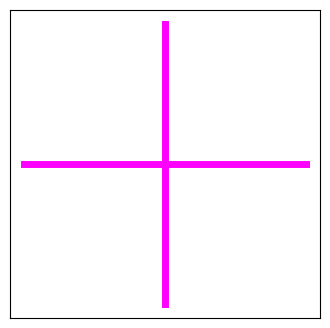

-------------
Index i = 51
Performance:  498000


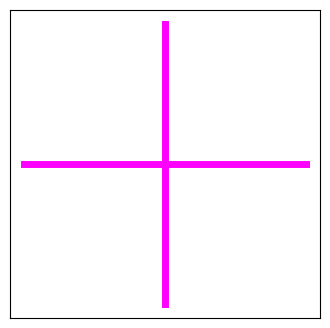

-------------
Index i = 52
Performance:  475034


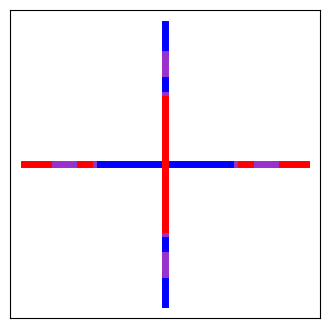

-------------
Index i = 53
Performance:  498000


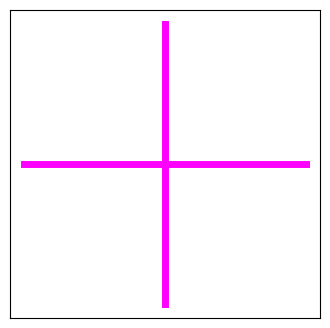

-------------
Index i = 54
Performance:  498000


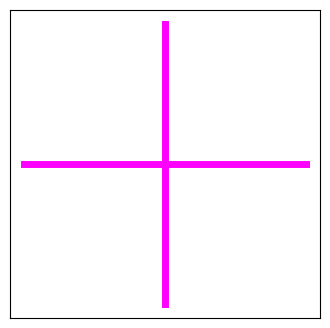

-------------
Index i = 55
Performance:  475038


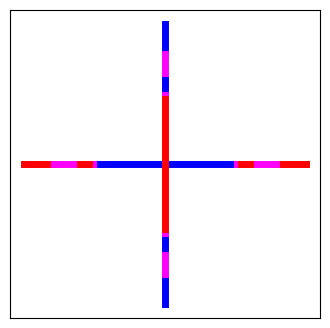

-------------
Index i = 56
Performance:  498000


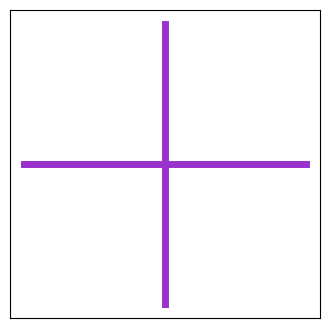

-------------
Index i = 57
Performance:  498000


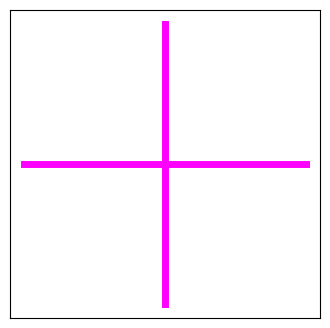

-------------
Index i = 58
Performance:  475034


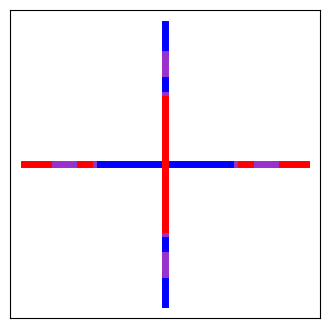

-------------
Index i = 59
Performance:  475038


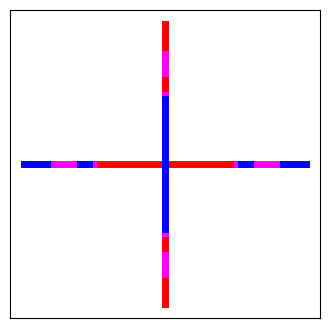

-------------
Index i = 60
Performance:  475034


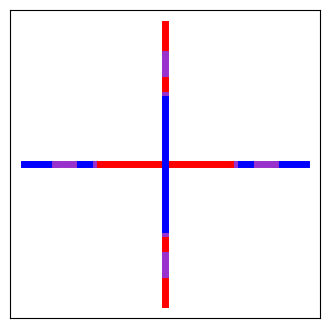

-------------
Index i = 61
Performance:  475038


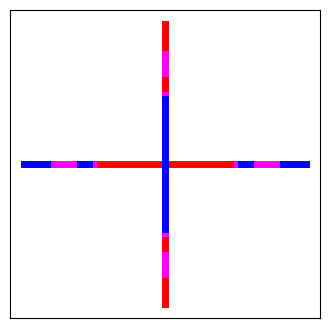

-------------
Index i = 62
Performance:  498000


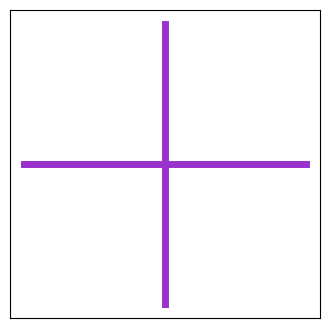

-------------
Index i = 63
Performance:  498000


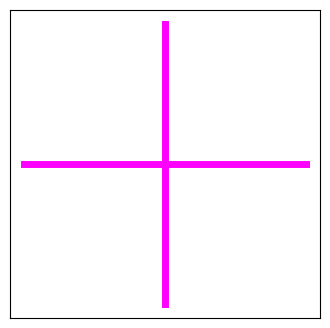

-------------
Index i = 64
Performance:  498000


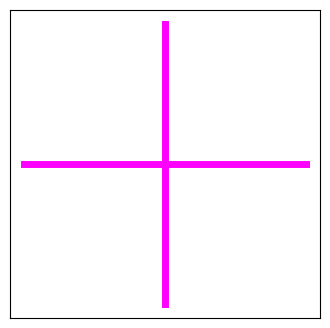

-------------
Index i = 65
Performance:  498000


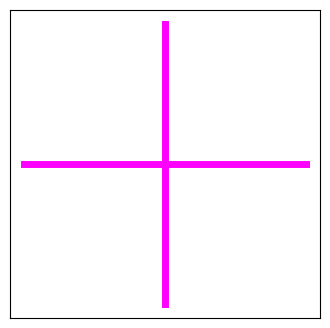

-------------
Index i = 66
Performance:  498000


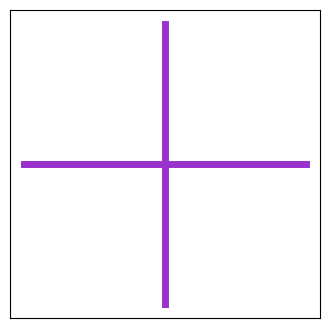

-------------
Index i = 67
Performance:  475034


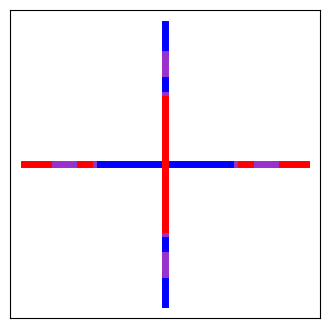

-------------
Index i = 68
Performance:  498000


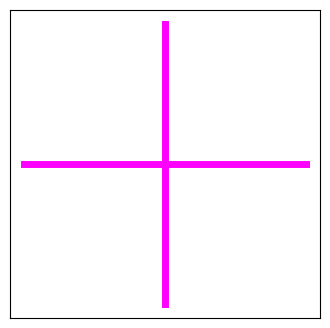

-------------
Index i = 69
Performance:  475034


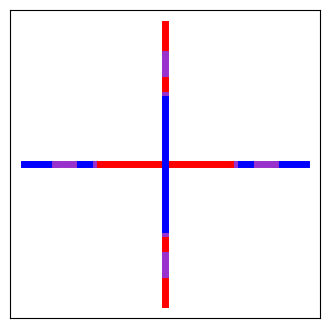

-------------
Index i = 70
Performance:  475038


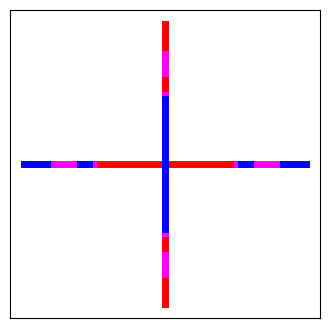

-------------
Index i = 71
Performance:  498000


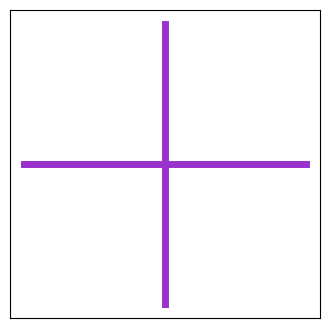

-------------
Index i = 72
Performance:  498000


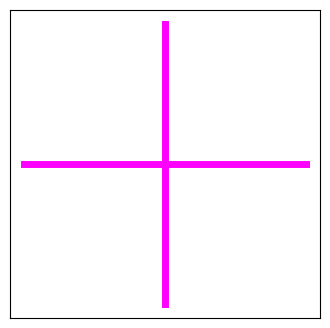

-------------
Index i = 73
Performance:  475034


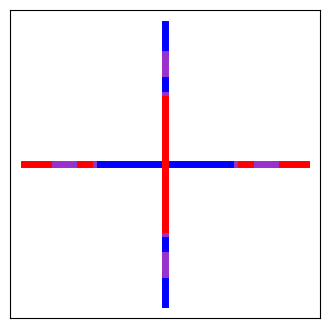

-------------
Index i = 74
Performance:  498000


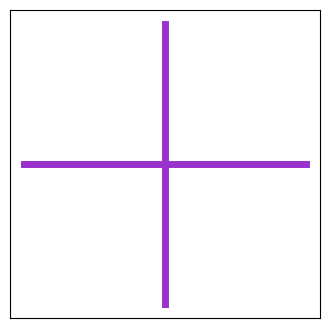

-------------
Index i = 75
Performance:  498000


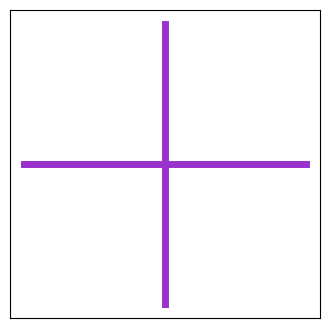

-------------
Index i = 76
Performance:  475038


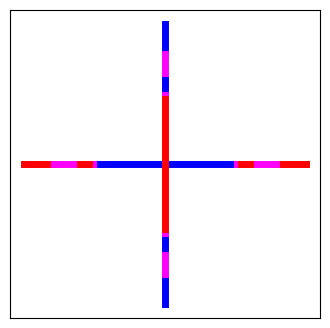

-------------
Index i = 77
Performance:  475034


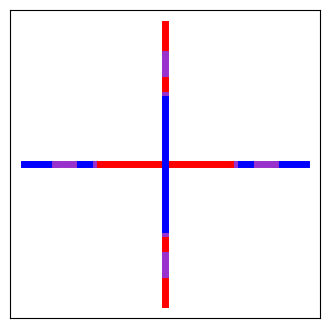

-------------
Index i = 78
Performance:  498000


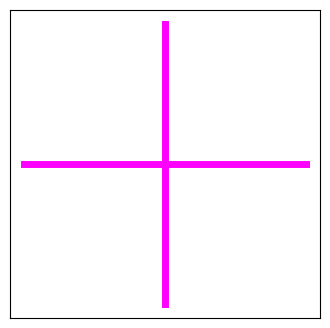

-------------
Index i = 79
Performance:  498000


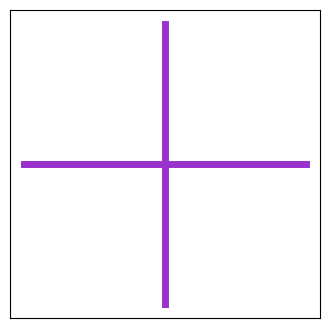

-------------
Index i = 80
Performance:  498000


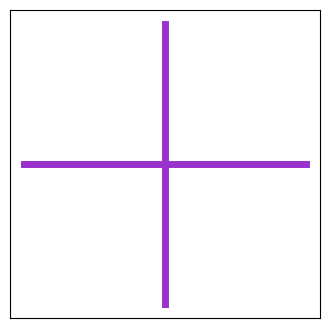

-------------
Index i = 81
Performance:  475038


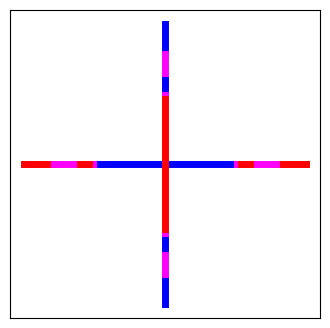

-------------
Index i = 82
Performance:  475038


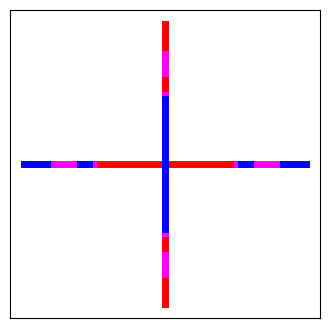

-------------
Index i = 83
Performance:  498000


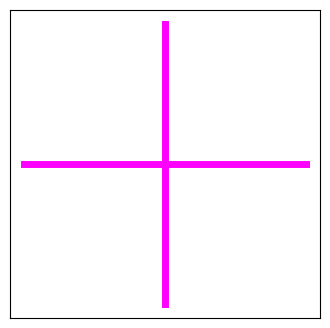

-------------
Index i = 84
Performance:  475038


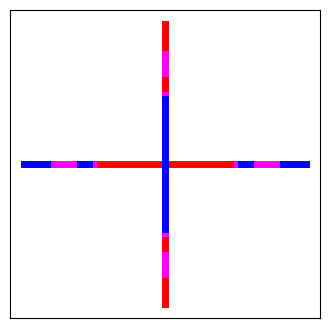

-------------
Index i = 85
Performance:  498000


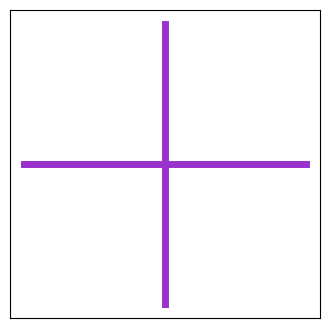

-------------
Index i = 86
Performance:  475034


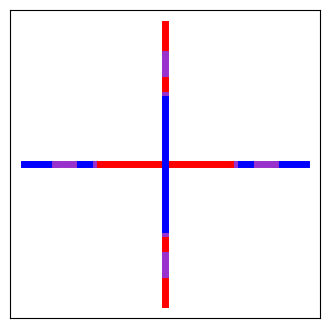

-------------
Index i = 87
Performance:  475034


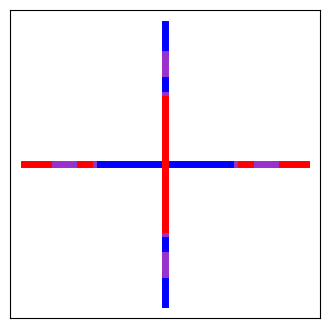

-------------
Index i = 88
Performance:  475034


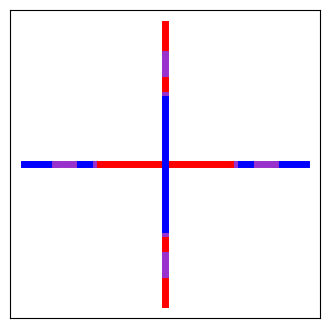

-------------
Index i = 89
Performance:  498000


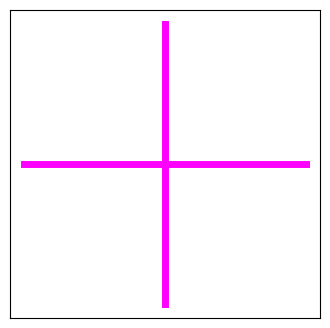

-------------
Index i = 90
Performance:  475038


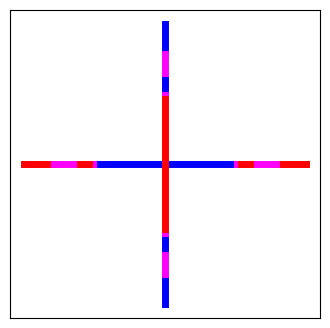

-------------
Index i = 91
Performance:  475038


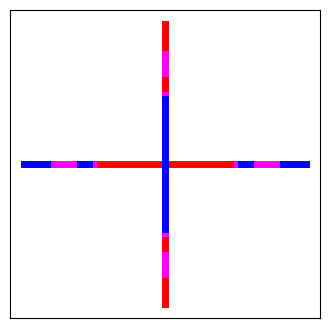

-------------
Index i = 92
Performance:  475038


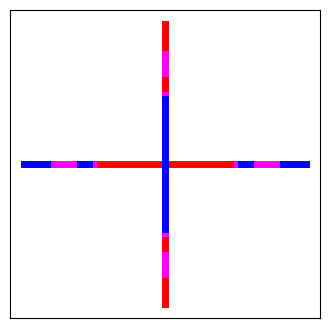

-------------
Index i = 93
Performance:  498000


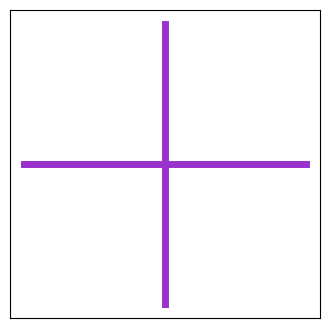

-------------
Index i = 94
Performance:  475038


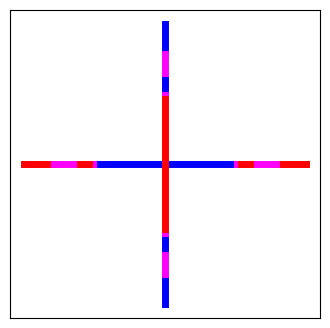

-------------
Index i = 95
Performance:  498000


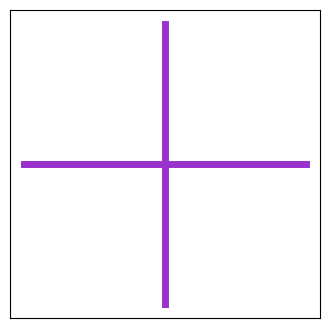

-------------
Index i = 96
Performance:  498000


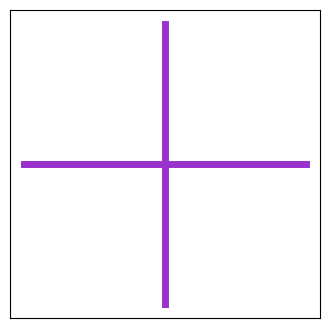

-------------
Index i = 97
Performance:  498000


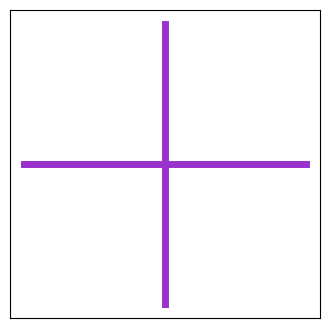

-------------
Index i = 98
Performance:  475038


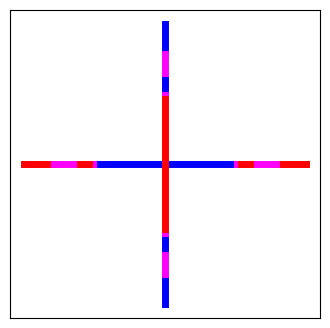

-------------
Index i = 99
Performance:  475034


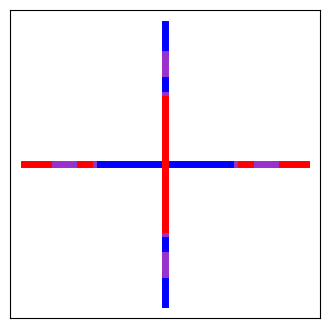

-------------


In [64]:
#Optimal colorings for k-star where k = 4 and n = 1000 considering adjacent pairs of arms

np.random.seed(965)
random.seed(623)

colorings_kstar_adj_k4_n1000 = []

for i in range(100):
    print('Index i =', i)
    colorings_kstar_adj_k4_n1000 += [optimize_coloring('S', 'adj', random_kcoloring(4, 1000), random_ordering(1000))]
    print('-------------')

In [75]:
#Optimal colorings for k-star where k = 4 and n = 1000 considering adjacent pairs of arms

buckets_for_kstar_adj_k4_n1000 = [colorings_kstar_adj_k4_n1000[0], colorings_kstar_adj_k4_n1000[6]]

compare_list_to_target(colorings_kstar_adj_k4_n1000, buckets_for_kstar_adj_k4_n1000, 'adj')

Index i =  0
Bucket ID: Alternating
Number of Progressions: 498000
Percent difference:  0.0 %
----------------
Index i =  1
Bucket ID:  1
Number of Progressions: 475038
Percent difference:  0.15 %
----------------
Index i =  2
Bucket ID: Alternating
Number of Progressions: 498000
Percent difference:  0.0 %
----------------
Index i =  3
Bucket ID: Alternating
Number of Progressions: 498000
Percent difference:  0.0 %
----------------
Index i =  4
Bucket ID: Alternating
Number of Progressions: 498000
Percent difference:  0.0 %
----------------
Index i =  5
Bucket ID:  1
Number of Progressions: 475038
Percent difference:  0.25 %
----------------
Index i =  6
Bucket ID:  1
Number of Progressions: 475034
Percent difference:  0.0 %
----------------
Index i =  7
Bucket ID: Alternating
Number of Progressions: 498000
Percent difference:  0.0 %
----------------
Index i =  8
Bucket ID: Alternating
Number of Progressions: 498000
Percent difference:  0.0 %
----------------
Index i =  9
Bucket ID: Al

### k=5:

Index i = 0
Performance:  155000


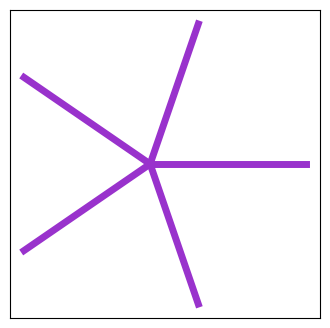

-------------
Index i = 1
Performance:  175871


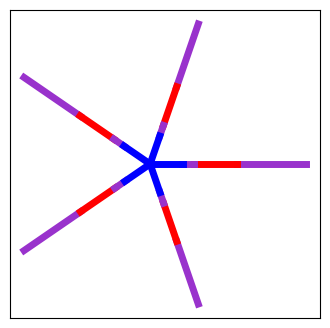

-------------
Index i = 2
Performance:  155000


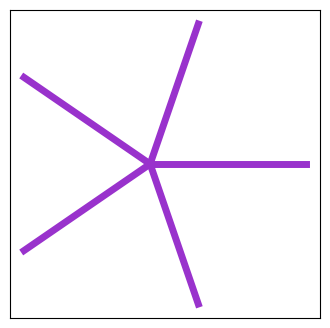

-------------
Index i = 3
Performance:  155000


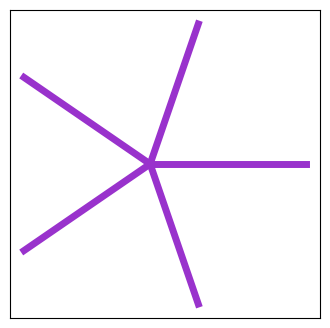

-------------
Index i = 4
Performance:  155000


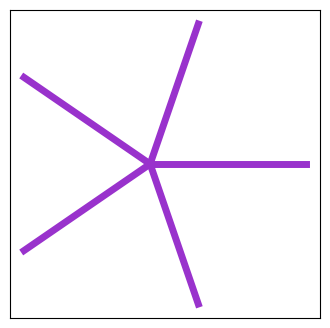

-------------
Index i = 5
Performance:  155000


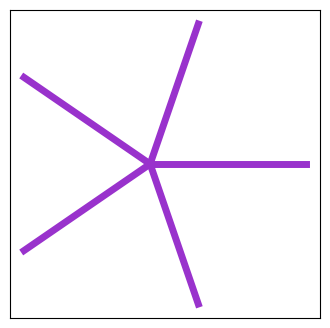

-------------
Index i = 6
Performance:  155000


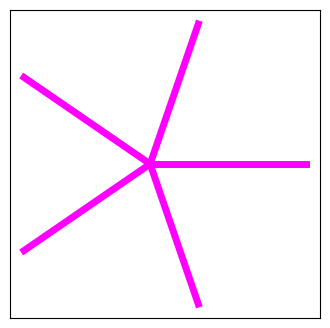

-------------
Index i = 7
Performance:  155000


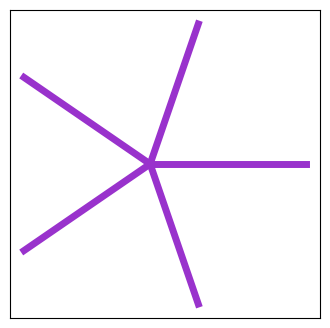

-------------
Index i = 8
Performance:  155000


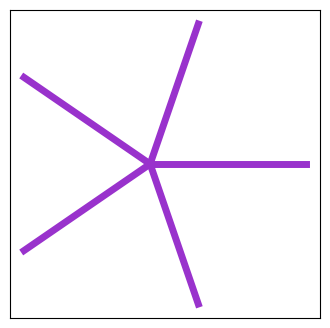

-------------
Index i = 9
Performance:  155000


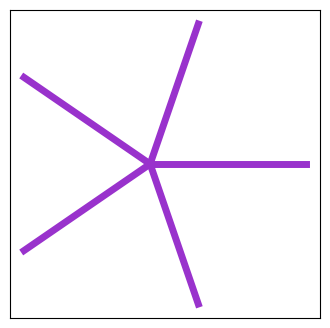

-------------
Index i = 10
Performance:  155000


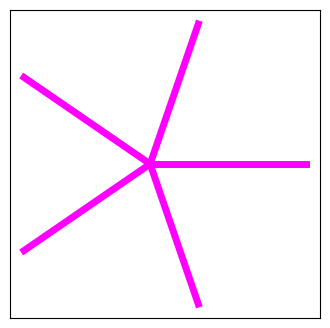

-------------
Index i = 11
Performance:  155000


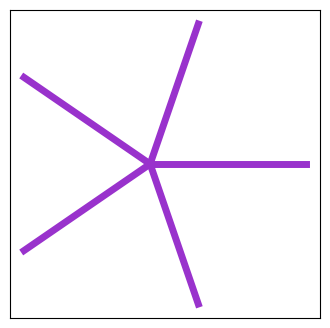

-------------
Index i = 12
Performance:  155000


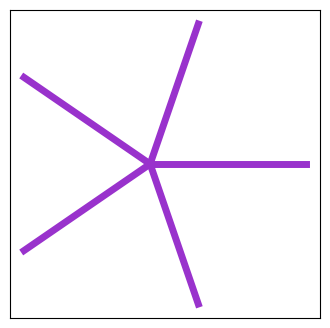

-------------
Index i = 13
Performance:  155000


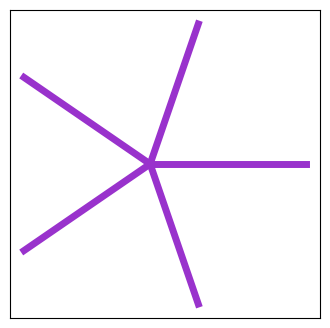

-------------
Index i = 14
Performance:  155000


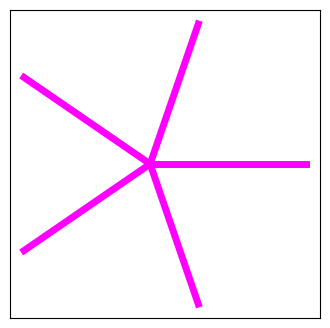

-------------
Index i = 15
Performance:  155000


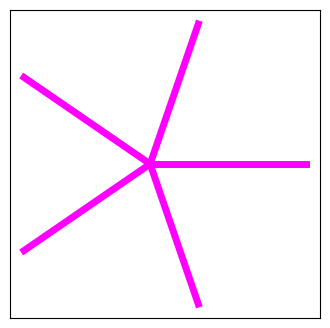

-------------
Index i = 16
Performance:  155000


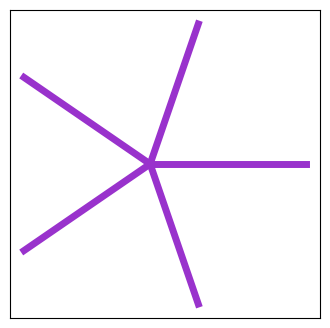

-------------
Index i = 17
Performance:  173770


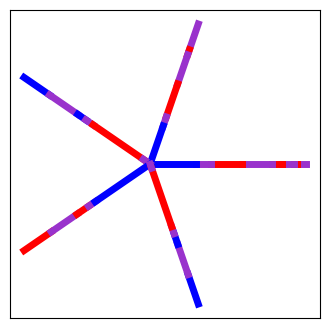

-------------
Index i = 18
Performance:  155000


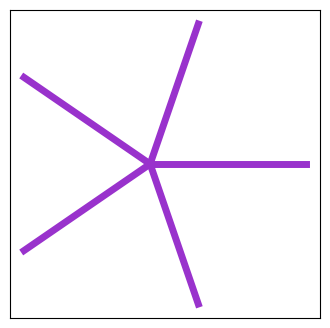

-------------
Index i = 19
Performance:  155000


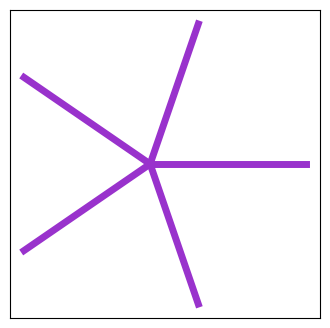

-------------
Index i = 20
Performance:  155000


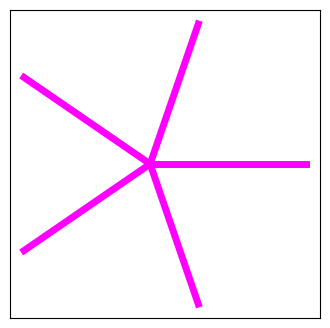

-------------
Index i = 21
Performance:  155000


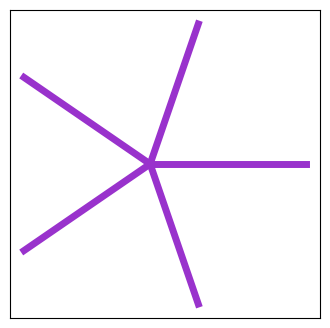

-------------
Index i = 22
Performance:  155000


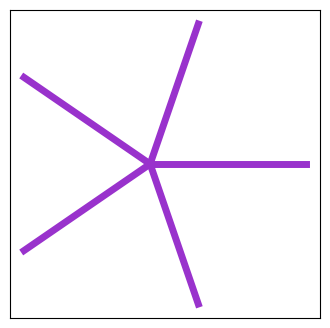

-------------
Index i = 23
Performance:  155000


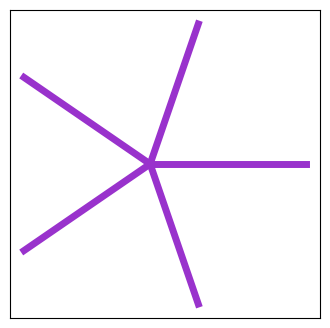

-------------
Index i = 24
Performance:  155000


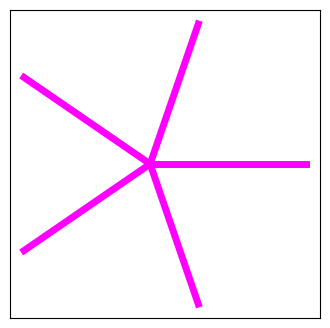

-------------
Index i = 25
Performance:  155000


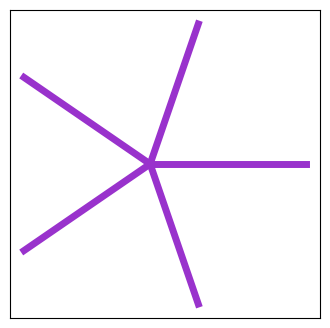

-------------
Index i = 26
Performance:  173744


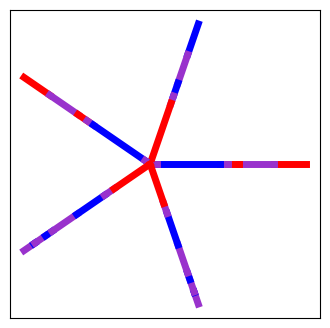

-------------
Index i = 27
Performance:  155000


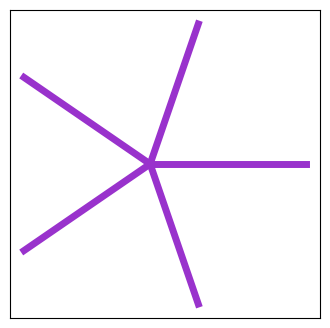

-------------
Index i = 28
Performance:  155000


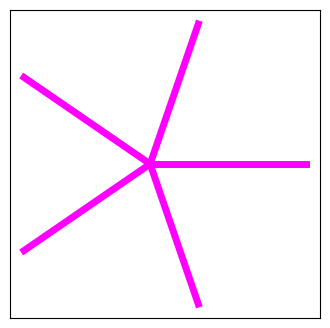

-------------
Index i = 29
Performance:  155000


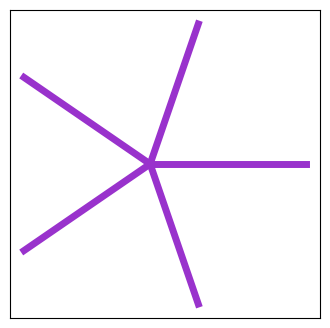

-------------
Index i = 30
Performance:  155000


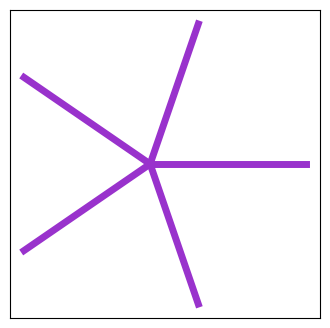

-------------
Index i = 31
Performance:  155000


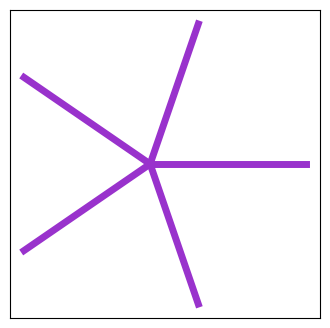

-------------
Index i = 32
Performance:  155000


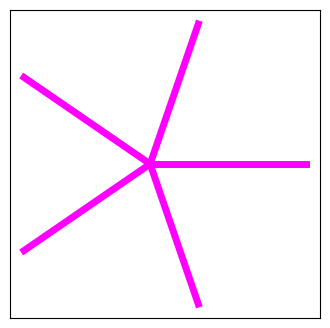

-------------
Index i = 33
Performance:  155000


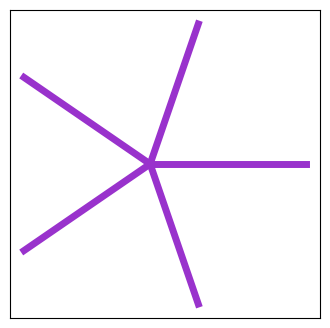

-------------
Index i = 34
Performance:  155000


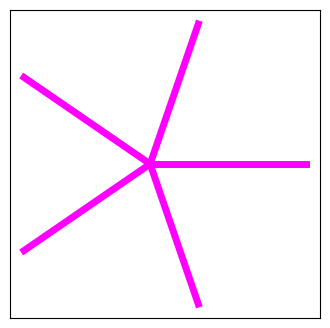

-------------
Index i = 35
Performance:  155000


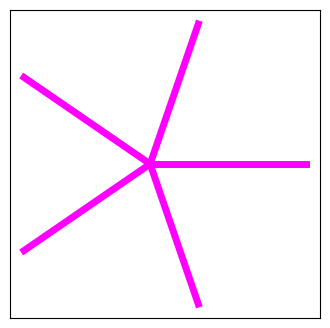

-------------
Index i = 36
Performance:  173757


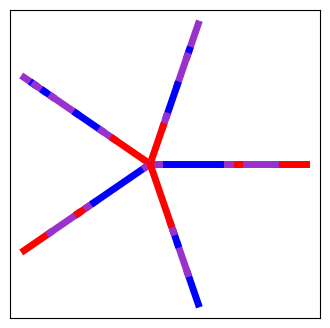

-------------
Index i = 37
Performance:  155000


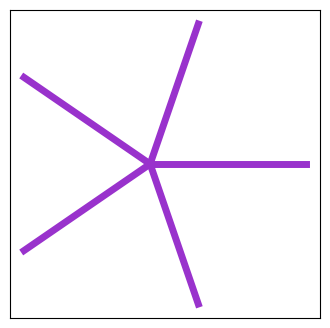

-------------
Index i = 38
Performance:  155000


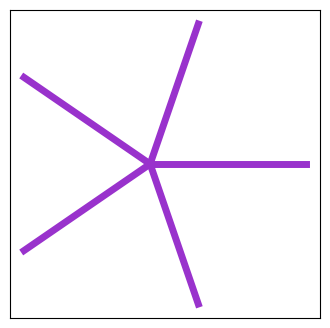

-------------
Index i = 39
Performance:  155000


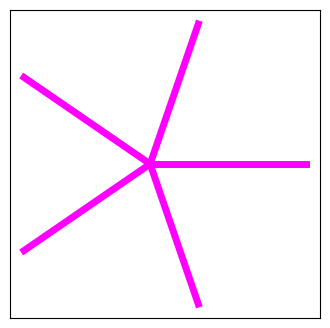

-------------
Index i = 40
Performance:  155000


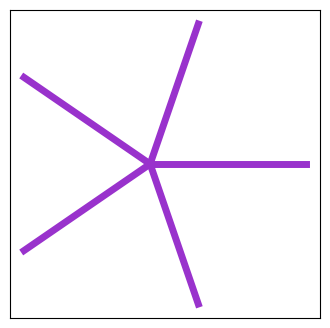

-------------
Index i = 41
Performance:  155000


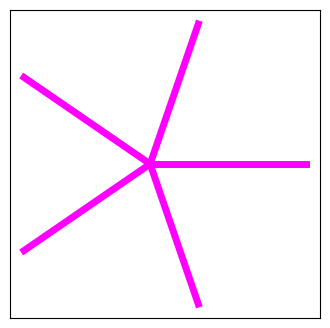

-------------
Index i = 42
Performance:  155000


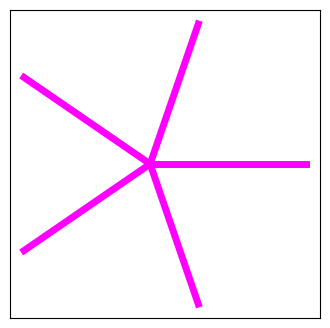

-------------
Index i = 43
Performance:  155000


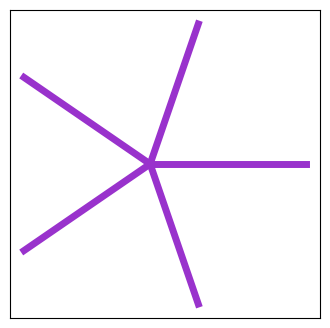

-------------
Index i = 44
Performance:  155000


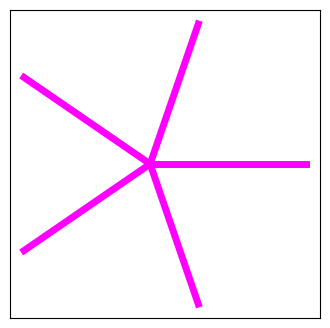

-------------
Index i = 45
Performance:  155000


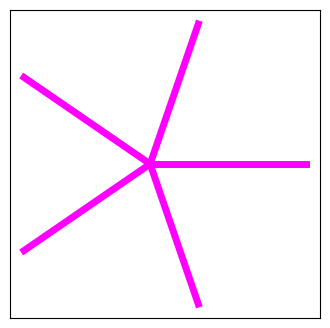

-------------
Index i = 46
Performance:  175871


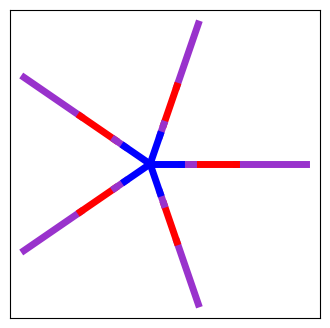

-------------
Index i = 47
Performance:  155000


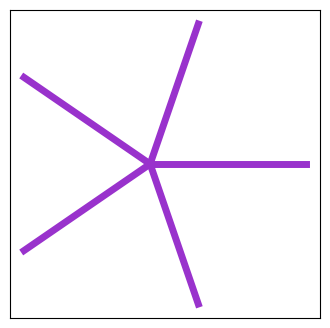

-------------
Index i = 48
Performance:  155000


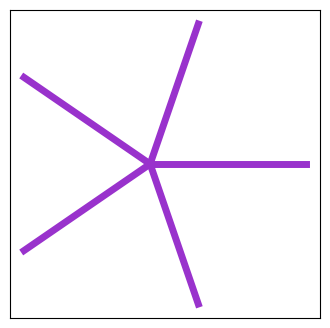

-------------
Index i = 49
Performance:  155000


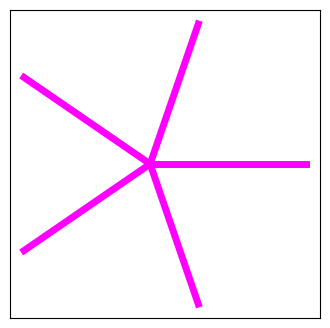

-------------
Index i = 50
Performance:  155000


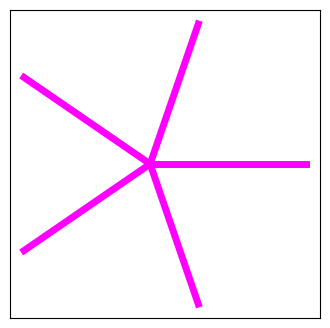

-------------
Index i = 51
Performance:  155000


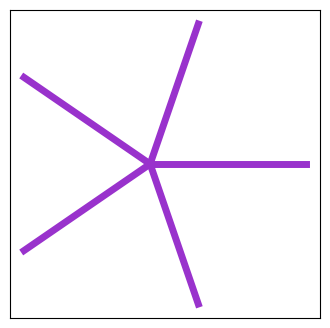

-------------
Index i = 52
Performance:  155000


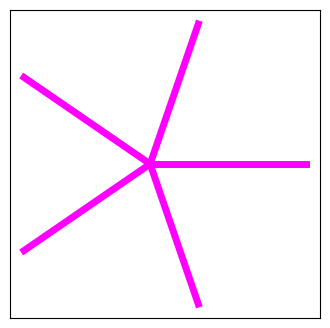

-------------
Index i = 53
Performance:  155000


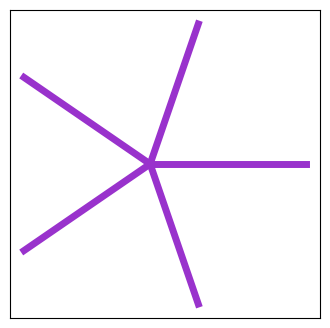

-------------
Index i = 54
Performance:  155000


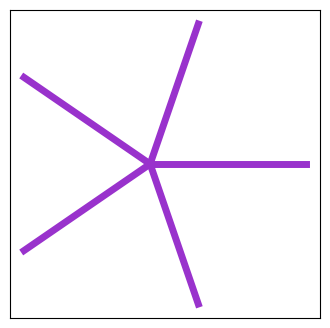

-------------
Index i = 55
Performance:  155000


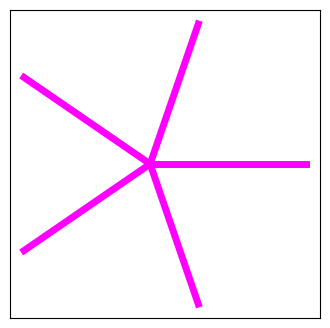

-------------
Index i = 56
Performance:  155000


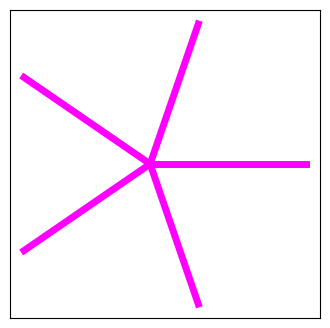

-------------
Index i = 57
Performance:  155000


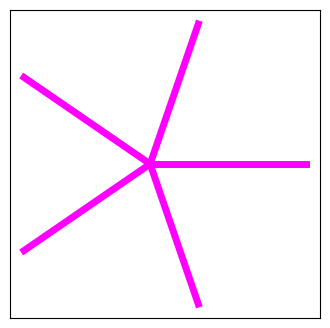

-------------
Index i = 58
Performance:  175881


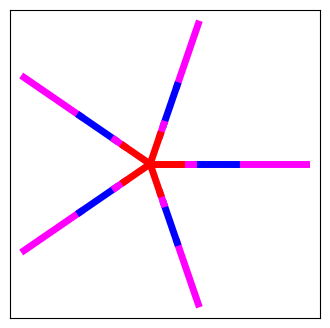

-------------
Index i = 59
Performance:  155000


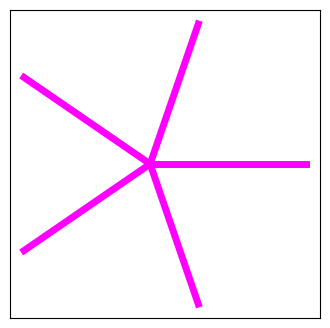

-------------
Index i = 60
Performance:  155000


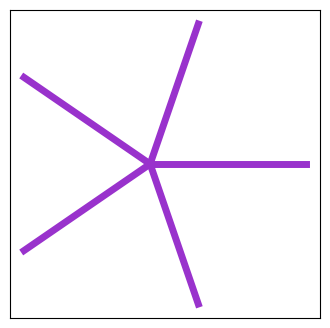

-------------
Index i = 61
Performance:  155000


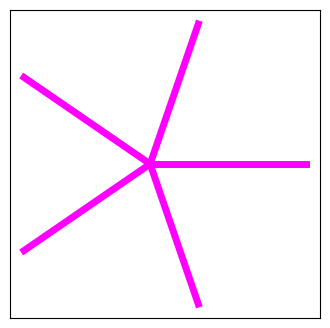

-------------
Index i = 62
Performance:  155000


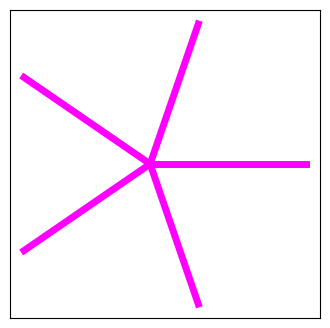

-------------
Index i = 63
Performance:  155000


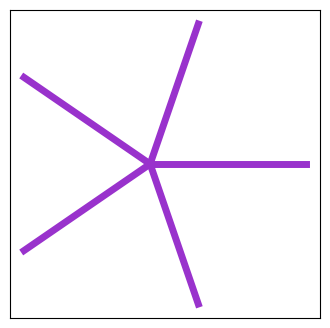

-------------
Index i = 64
Performance:  155000


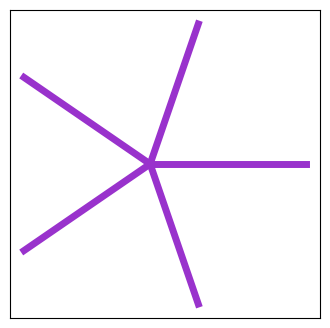

-------------
Index i = 65
Performance:  155000


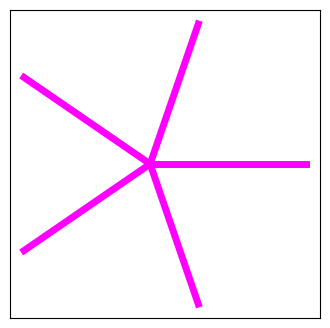

-------------
Index i = 66
Performance:  155000


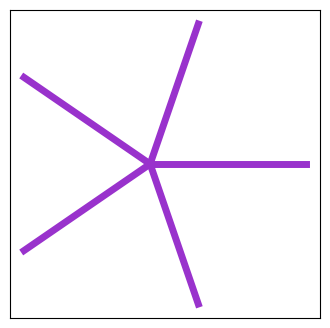

-------------
Index i = 67
Performance:  155000


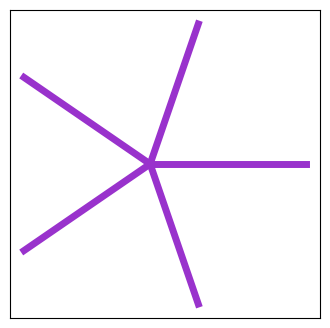

-------------
Index i = 68
Performance:  155000


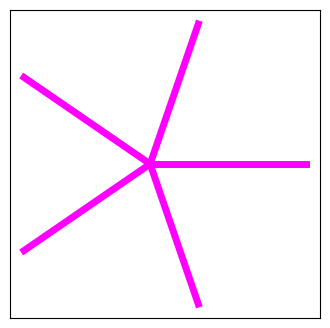

-------------
Index i = 69
Performance:  155000


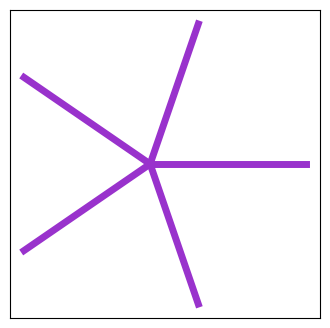

-------------
Index i = 70
Performance:  155000


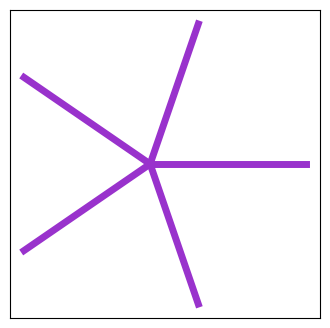

-------------
Index i = 71
Performance:  155000


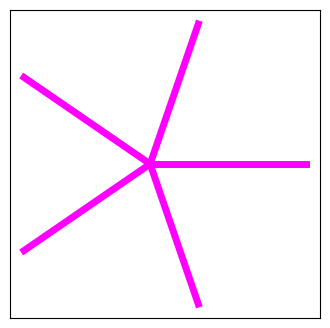

-------------
Index i = 72
Performance:  155000


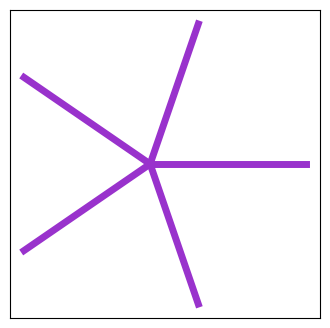

-------------
Index i = 73
Performance:  173747


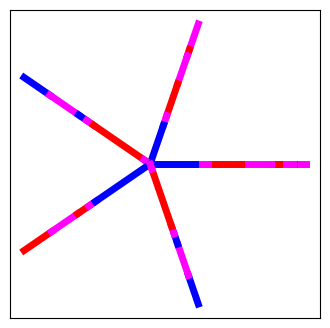

-------------
Index i = 74
Performance:  175871


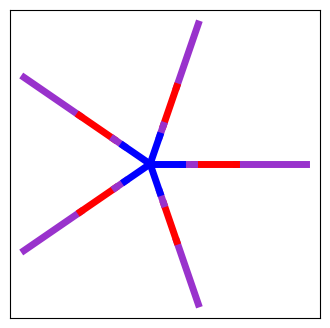

-------------
Index i = 75
Performance:  155000


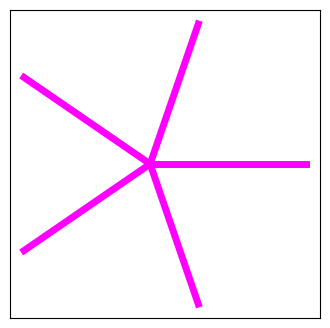

-------------
Index i = 76
Performance:  155000


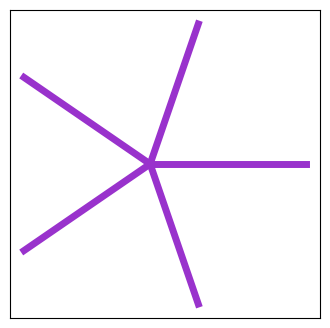

-------------
Index i = 77
Performance:  155000


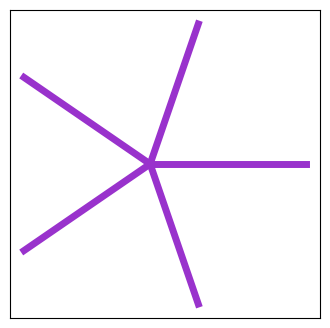

-------------
Index i = 78
Performance:  155000


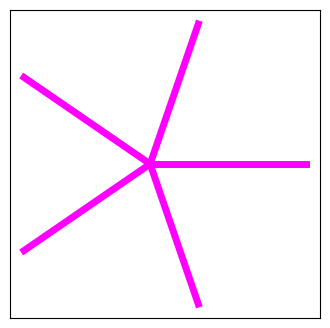

-------------
Index i = 79
Performance:  173741


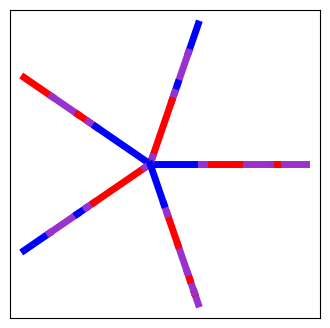

-------------
Index i = 80
Performance:  155000


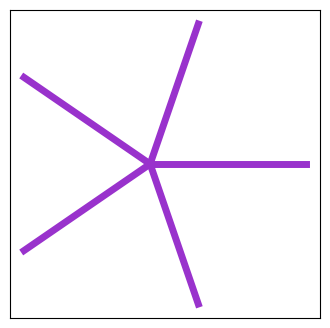

-------------
Index i = 81
Performance:  175881


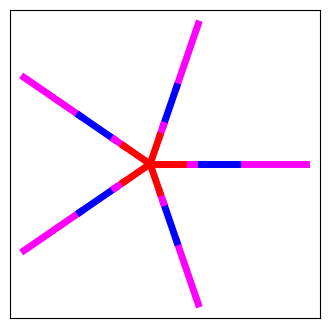

-------------
Index i = 82
Performance:  175871


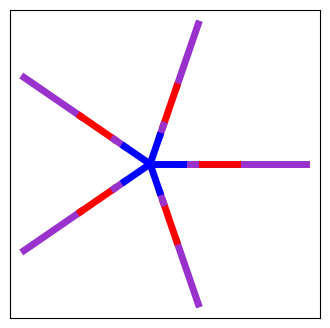

-------------
Index i = 83
Performance:  155000


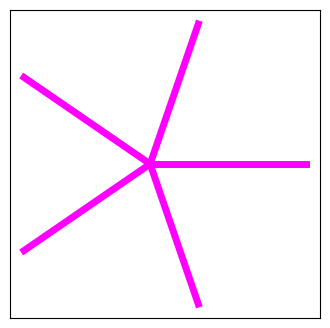

-------------
Index i = 84
Performance:  155000


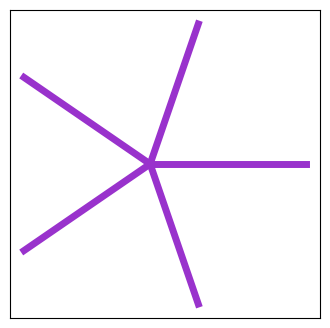

-------------
Index i = 85
Performance:  155000


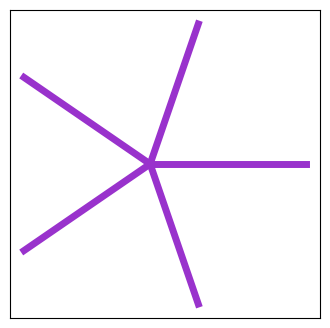

-------------
Index i = 86
Performance:  173759


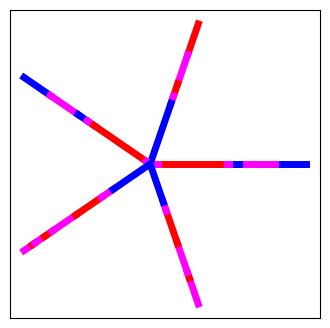

-------------
Index i = 87
Performance:  155000


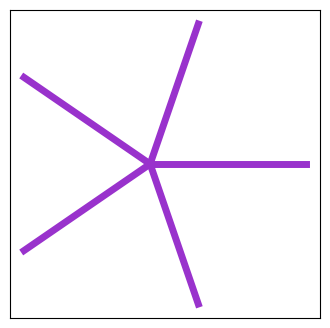

-------------
Index i = 88
Performance:  155000


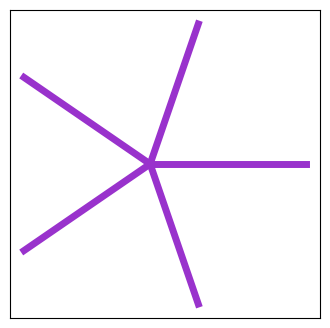

-------------
Index i = 89
Performance:  176052


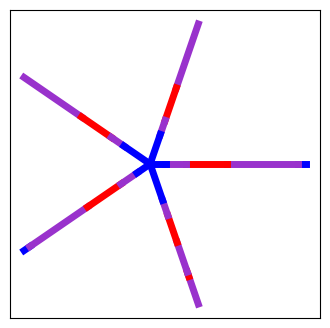

-------------
Index i = 90
Performance:  155000


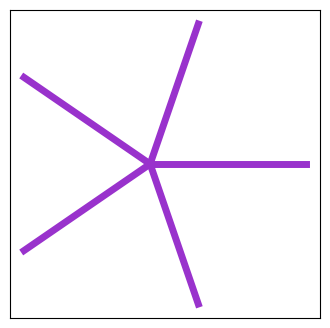

-------------
Index i = 91
Performance:  155000


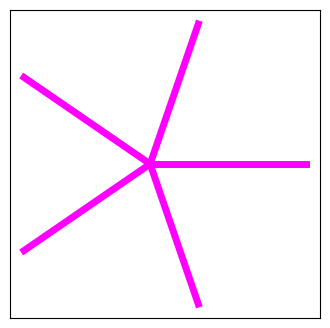

-------------
Index i = 92
Performance:  155000


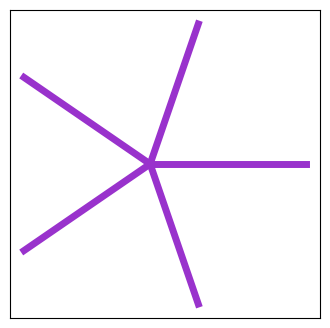

-------------
Index i = 93
Performance:  155000


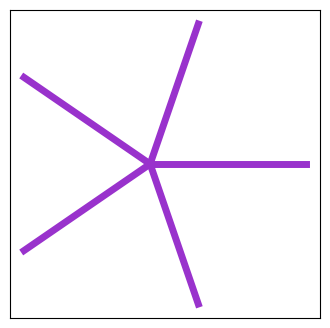

-------------
Index i = 94
Performance:  155000


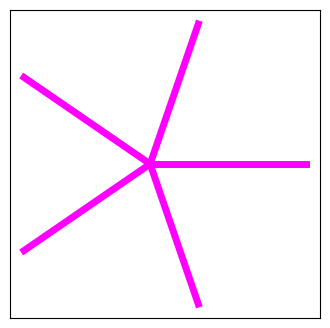

-------------
Index i = 95
Performance:  155000


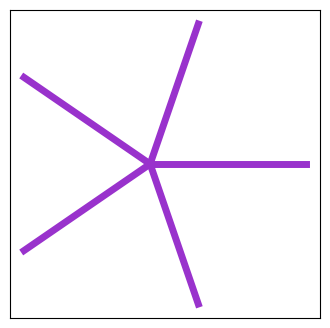

-------------
Index i = 96
Performance:  155000


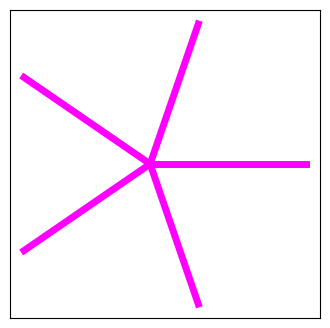

-------------
Index i = 97
Performance:  155000


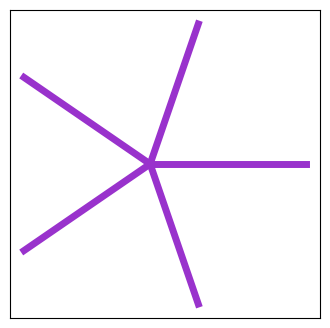

-------------
Index i = 98
Performance:  155000


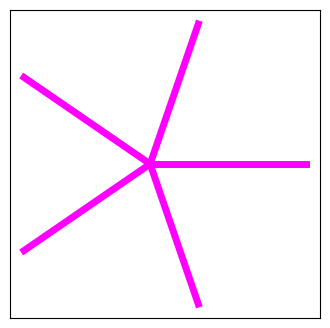

-------------
Index i = 99
Performance:  155000


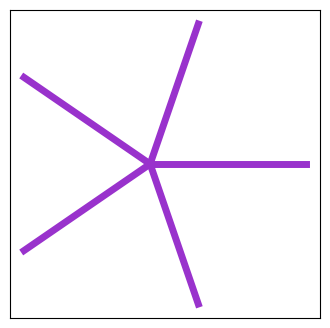

-------------


In [67]:
#Optimal colorings for k-star where k = 5 and n = 500 considering adjacent pairs of arms

np.random.seed(30)
random.seed(710)

colorings_kstar_adj_k5_n500 = []

for i in range(100):
    print('Index i =', i)
    colorings_kstar_adj_k5_n500 += [optimize_coloring('S', 'adj', random_kcoloring(5, 500), random_ordering(500))]
    print('-------------')

In [98]:
#Optimal colorings for k-star where k = 5 and n = 500 considering adjacent pairs of arms

buckets_for_kstar_adj_k5_n500 = [colorings_kstar_adj_k5_n500[0], colorings_kstar_adj_k5_n500[79], colorings_kstar_adj_k5_n500[26], colorings_kstar_adj_k5_n500[73], colorings_kstar_adj_k5_n500[36], colorings_kstar_adj_k5_n500[1], colorings_kstar_adj_k5_n500[89]]

compare_list_to_target(colorings_kstar_adj_k5_n500, buckets_for_kstar_adj_k5_n500, 'adj')

Index i =  0
Bucket ID: Alternating
Number of Progressions: 155000
Percent difference:  0.0 %
----------------
Index i =  1
Bucket ID:  5
Number of Progressions: 175871
Percent difference:  0.0 %
----------------
Index i =  2
Bucket ID: Alternating
Number of Progressions: 155000
Percent difference:  0.0 %
----------------
Index i =  3
Bucket ID: Alternating
Number of Progressions: 155000
Percent difference:  0.0 %
----------------
Index i =  4
Bucket ID: Alternating
Number of Progressions: 155000
Percent difference:  0.0 %
----------------
Index i =  5
Bucket ID: Alternating
Number of Progressions: 155000
Percent difference:  0.0 %
----------------
Index i =  6
Bucket ID: Alternating
Number of Progressions: 155000
Percent difference:  0.0 %
----------------
Index i =  7
Bucket ID: Alternating
Number of Progressions: 155000
Percent difference:  0.0 %
----------------
Index i =  8
Bucket ID: Alternating
Number of Progressions: 155000
Percent difference:  0.0 %
----------------
Index i = 

Index i = 0
Performance:  622500


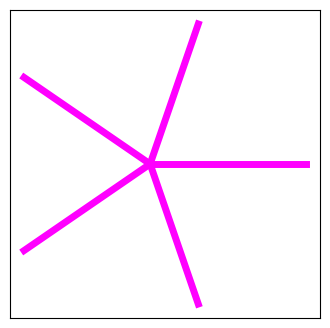

-------------
Index i = 1
Performance:  622500


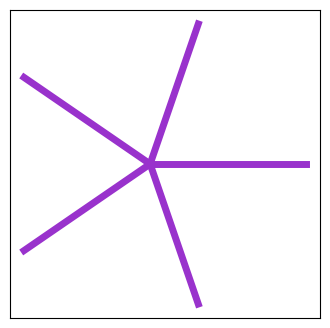

-------------
Index i = 2
Performance:  622500


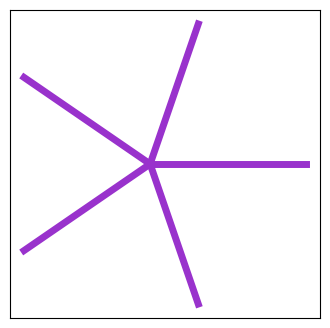

-------------
Index i = 3
Performance:  622500


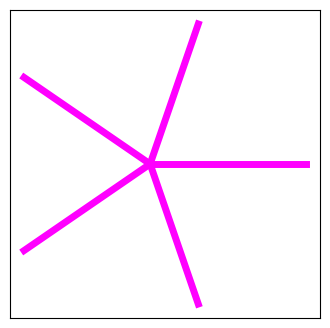

-------------
Index i = 4
Performance:  622500


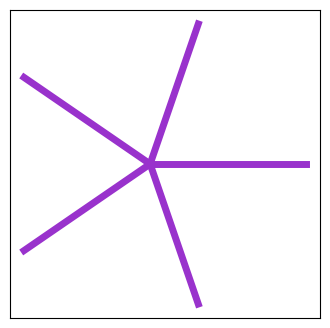

-------------
Index i = 5
Performance:  622500


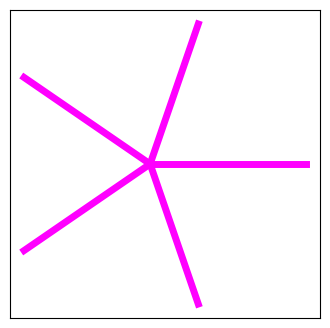

-------------
Index i = 6
Performance:  622500


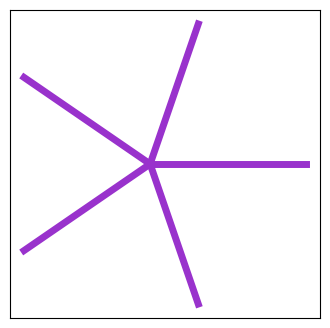

-------------
Index i = 7
Performance:  622500


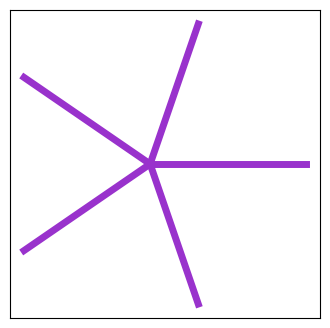

-------------
Index i = 8
Performance:  622500


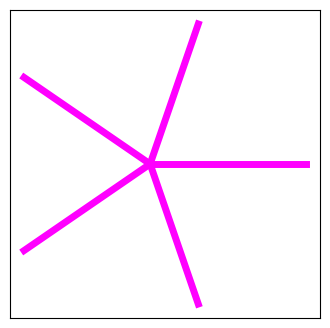

-------------
Index i = 9
Performance:  622500


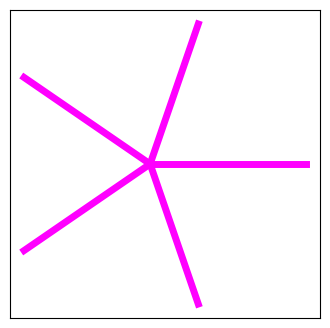

-------------
Index i = 10
Performance:  622500


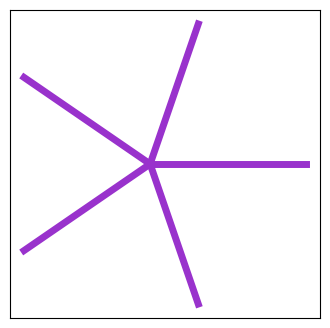

-------------
Index i = 11
Performance:  622500


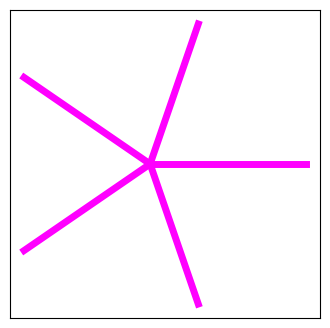

-------------
Index i = 12
Performance:  622500


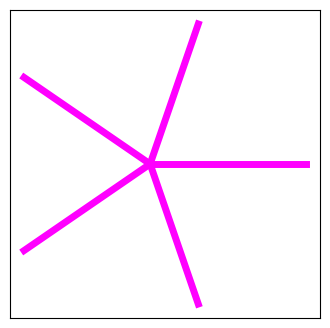

-------------
Index i = 13
Performance:  622500


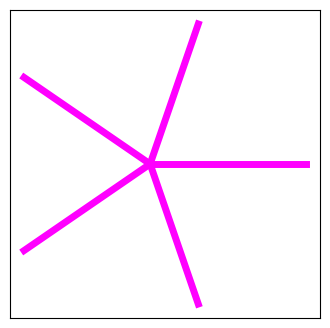

-------------
Index i = 14
Performance:  622500


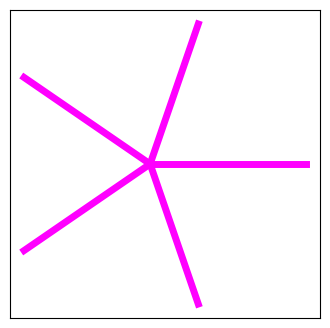

-------------
Index i = 15
Performance:  622500


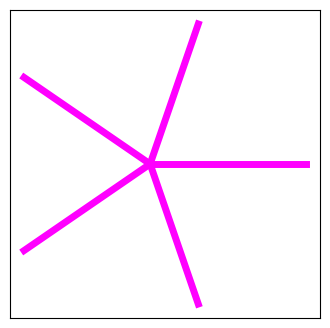

-------------
Index i = 16
Performance:  622500


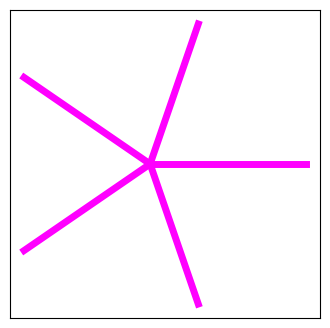

-------------
Index i = 17
Performance:  622500


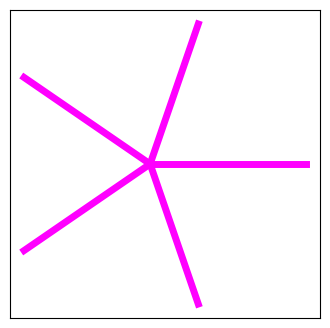

-------------
Index i = 18
Performance:  622500


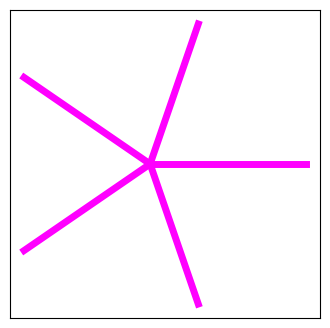

-------------
Index i = 19
Performance:  622500


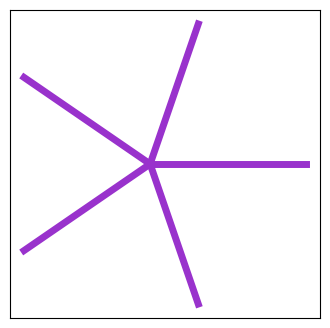

-------------
Index i = 20
Performance:  622500


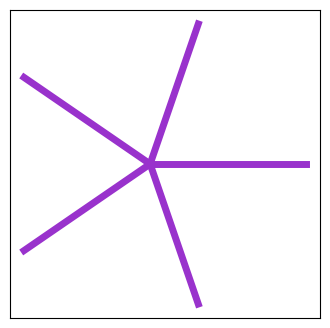

-------------
Index i = 21
Performance:  622500


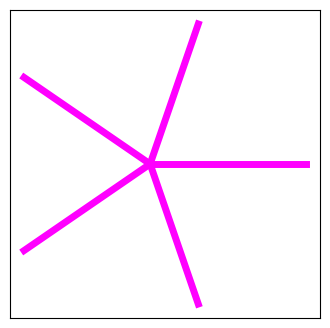

-------------
Index i = 22
Performance:  622500


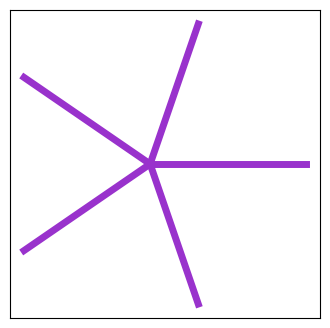

-------------
Index i = 23
Performance:  622500


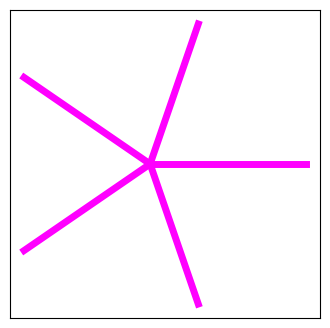

-------------
Index i = 24
Performance:  697436


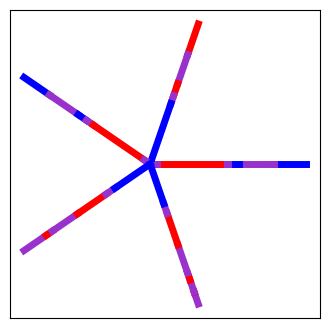

-------------
Index i = 25
Performance:  622500


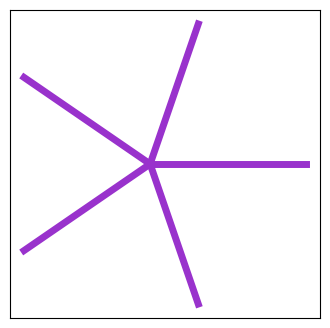

-------------
Index i = 26
Performance:  622500


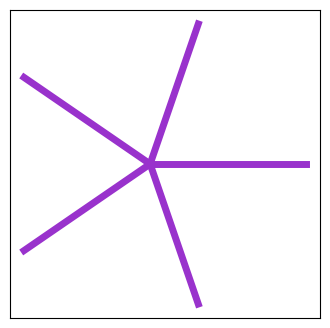

-------------
Index i = 27
Performance:  622500


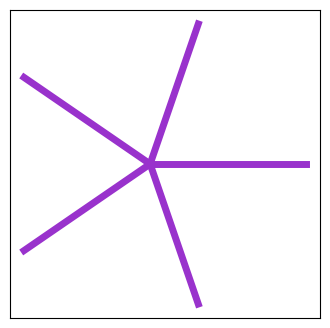

-------------
Index i = 28
Performance:  697446


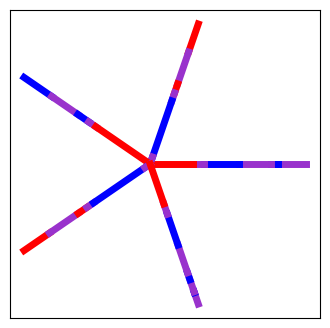

-------------
Index i = 29
Performance:  622500


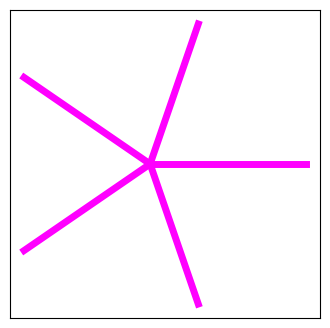

-------------
Index i = 30
Performance:  622500


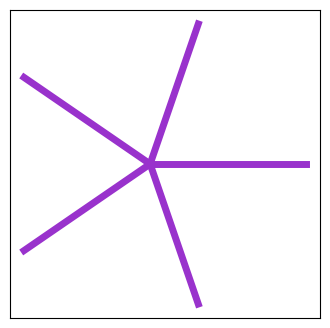

-------------
Index i = 31
Performance:  622500


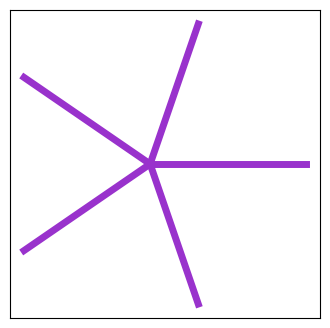

-------------
Index i = 32
Performance:  622500


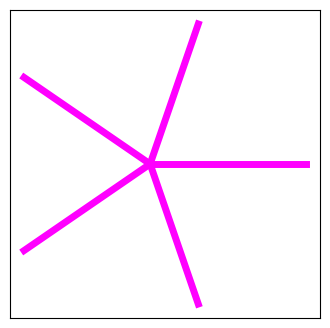

-------------
Index i = 33
Performance:  622500


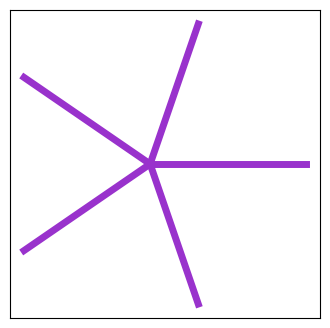

-------------
Index i = 34
Performance:  622500


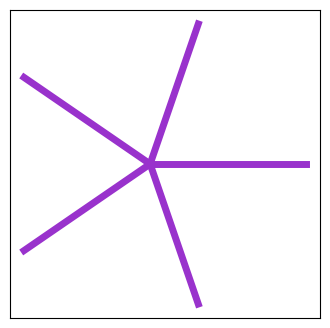

-------------
Index i = 35
Performance:  622500


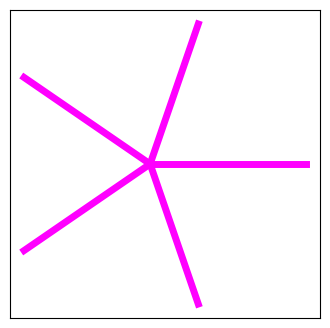

-------------
Index i = 36
Performance:  622500


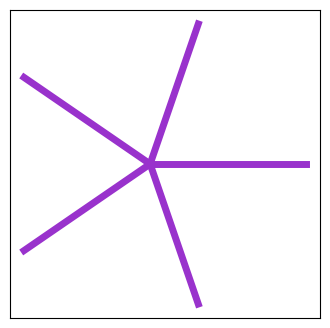

-------------
Index i = 37
Performance:  702497


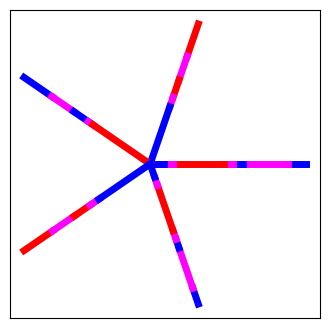

-------------
Index i = 38
Performance:  622500


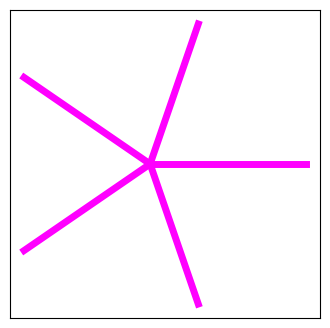

-------------
Index i = 39
Performance:  622500


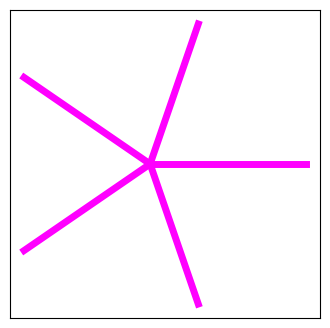

-------------
Index i = 40
Performance:  622500


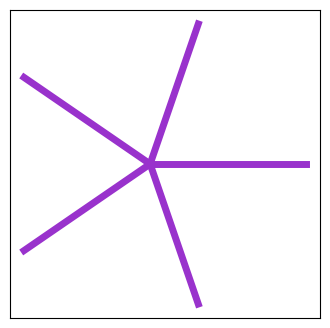

-------------
Index i = 41
Performance:  697442


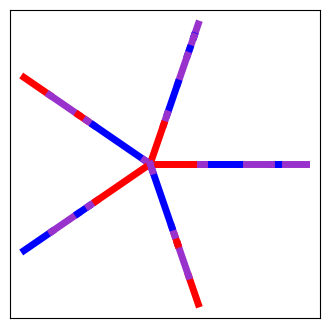

-------------
Index i = 42
Performance:  622500


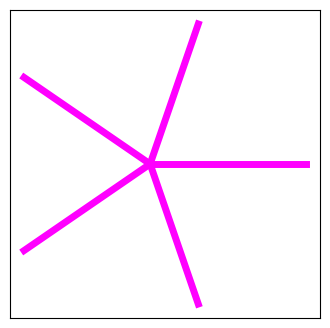

-------------
Index i = 43
Performance:  622500


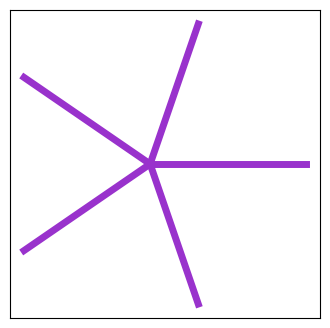

-------------
Index i = 44
Performance:  697439


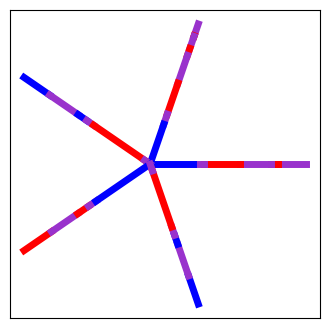

-------------
Index i = 45
Performance:  622500


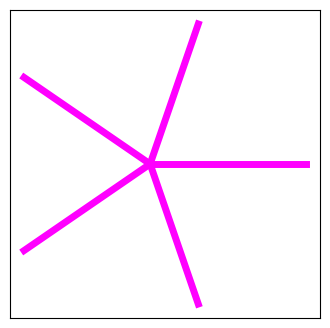

-------------
Index i = 46
Performance:  622500


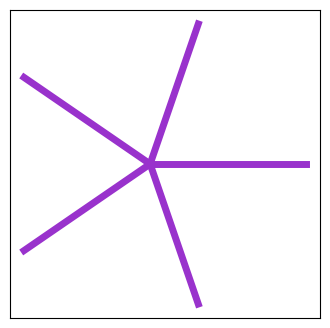

-------------
Index i = 47
Performance:  622500


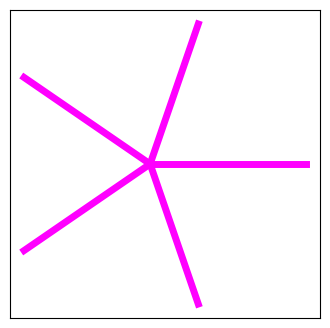

-------------
Index i = 48
Performance:  622500


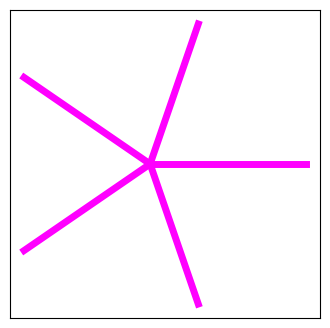

-------------
Index i = 49
Performance:  622500


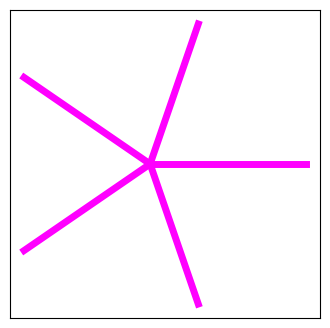

-------------
Index i = 50
Performance:  622500


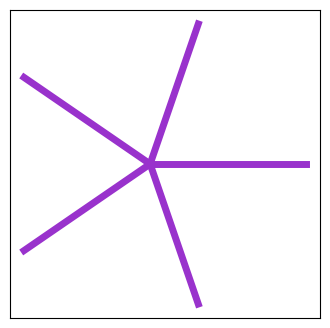

-------------
Index i = 51
Performance:  622500


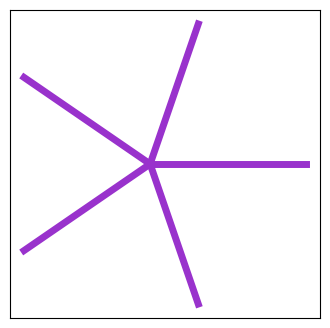

-------------
Index i = 52
Performance:  622500


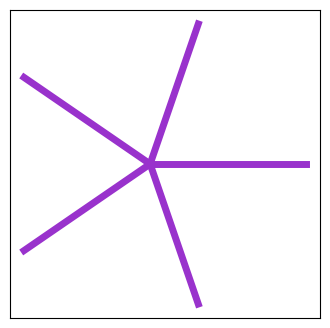

-------------
Index i = 53
Performance:  622500


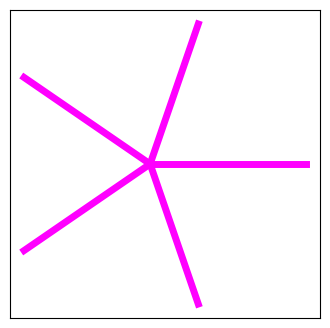

-------------
Index i = 54
Performance:  622500


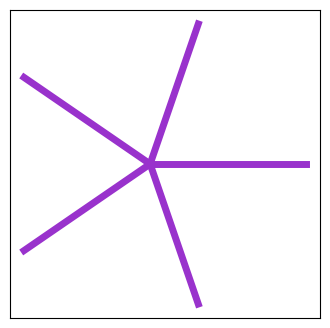

-------------
Index i = 55
Performance:  622500


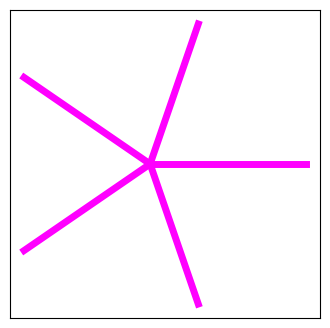

-------------
Index i = 56
Performance:  622500


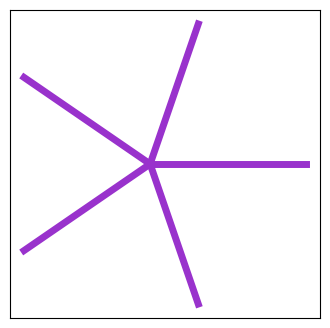

-------------
Index i = 57
Performance:  622500


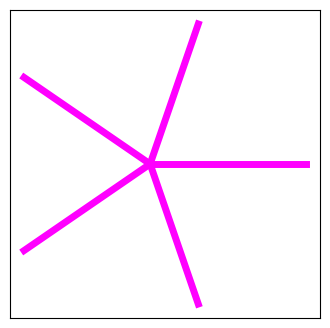

-------------
Index i = 58
Performance:  622500


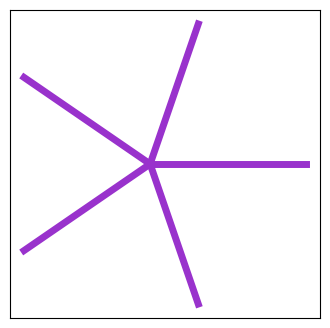

-------------
Index i = 59
Performance:  697448


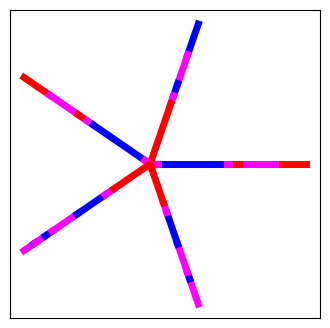

-------------
Index i = 60
Performance:  622500


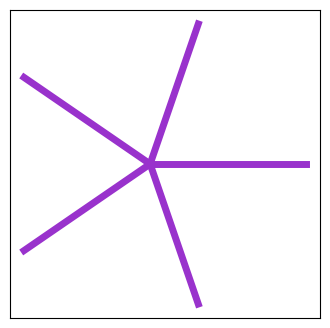

-------------
Index i = 61
Performance:  622500


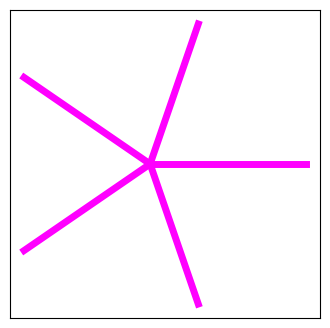

-------------
Index i = 62
Performance:  622500


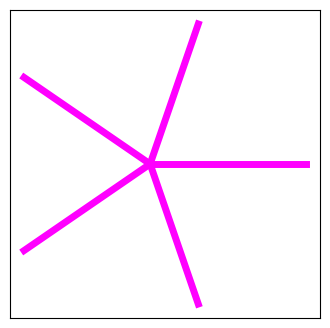

-------------
Index i = 63
Performance:  622500


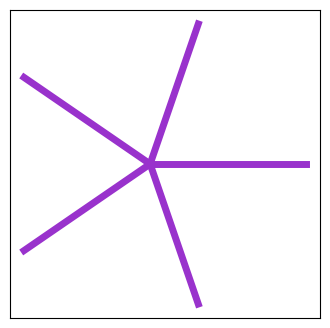

-------------
Index i = 64
Performance:  622500


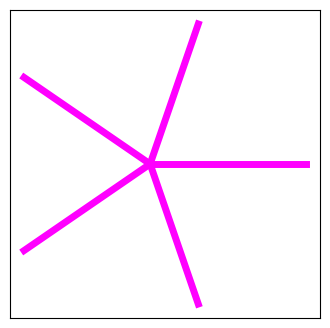

-------------
Index i = 65
Performance:  622500


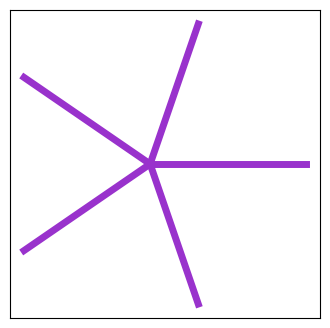

-------------
Index i = 66
Performance:  622500


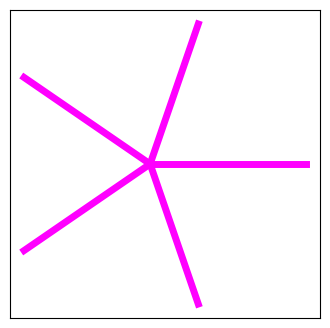

-------------
Index i = 67
Performance:  622500


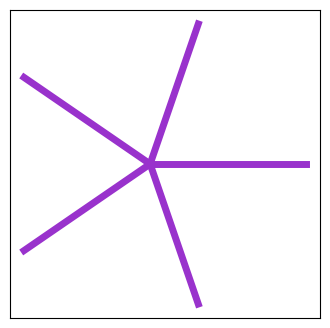

-------------
Index i = 68
Performance:  622500


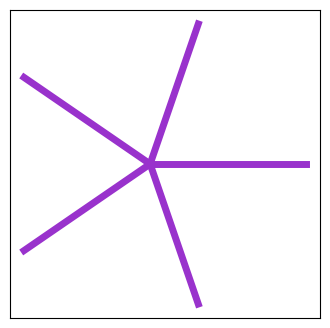

-------------
Index i = 69
Performance:  622500


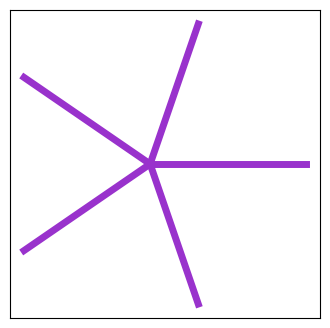

-------------
Index i = 70
Performance:  622500


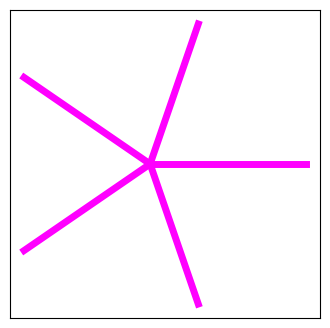

-------------
Index i = 71
Performance:  697448


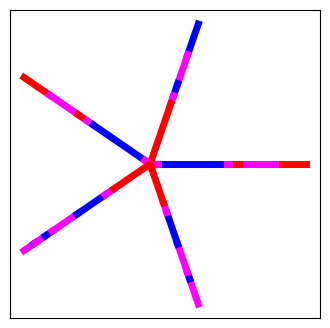

-------------
Index i = 72
Performance:  622500


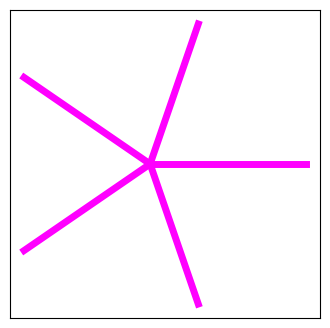

-------------
Index i = 73
Performance:  622500


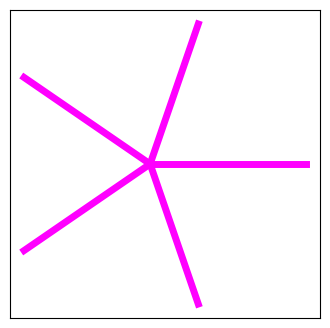

-------------
Index i = 74
Performance:  622500


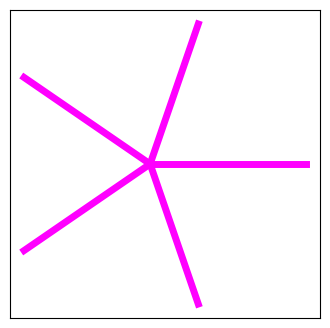

-------------
Index i = 75
Performance:  622500


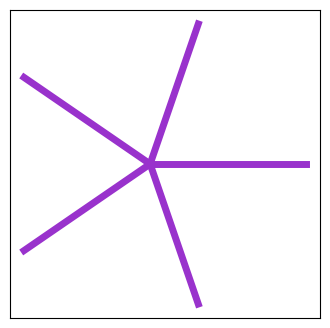

-------------
Index i = 76
Performance:  622500


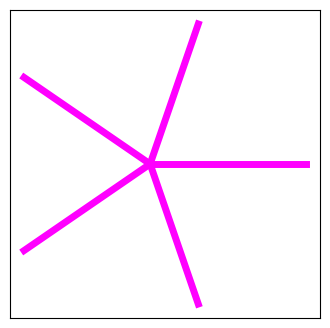

-------------
Index i = 77
Performance:  622500


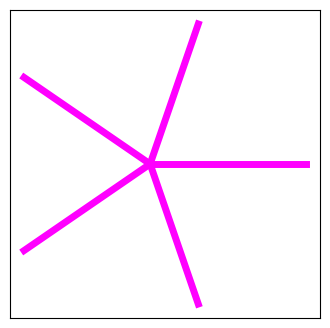

-------------
Index i = 78
Performance:  622500


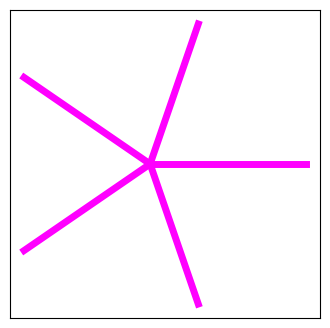

-------------
Index i = 79
Performance:  622500


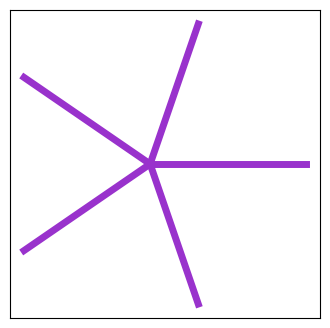

-------------
Index i = 80
Performance:  622500


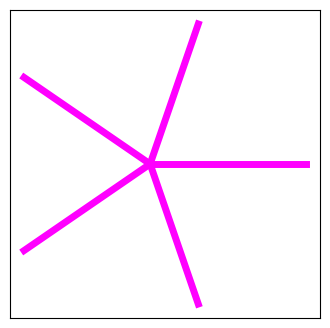

-------------
Index i = 81
Performance:  622500


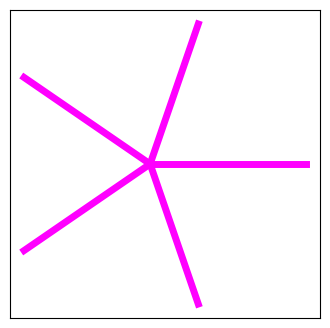

-------------
Index i = 82
Performance:  622500


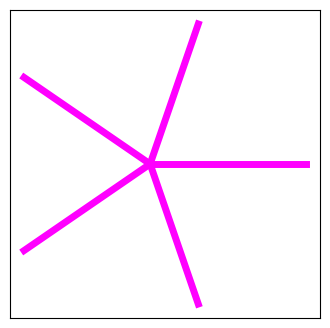

-------------
Index i = 83
Performance:  622500


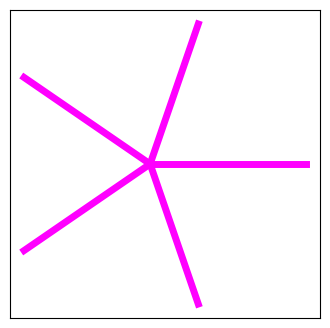

-------------
Index i = 84
Performance:  622500


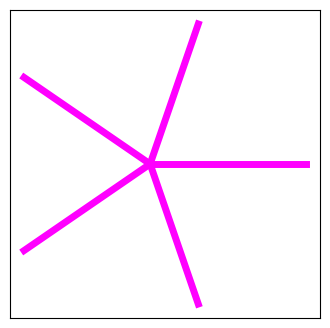

-------------
Index i = 85
Performance:  622500


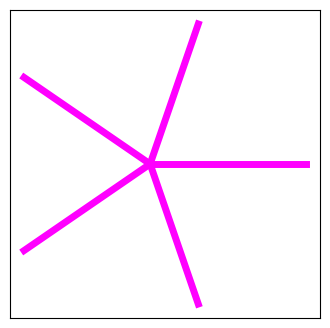

-------------
Index i = 86
Performance:  622500


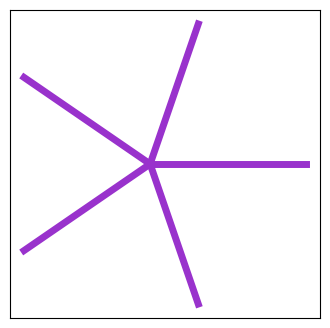

-------------
Index i = 87
Performance:  622500


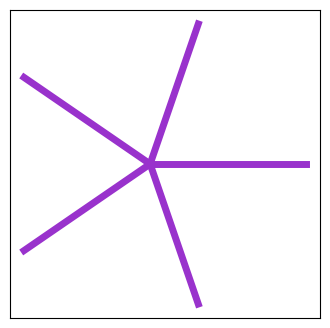

-------------
Index i = 88
Performance:  622500


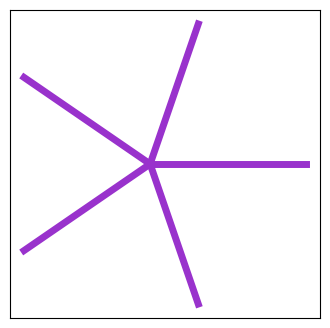

-------------
Index i = 89
Performance:  622500


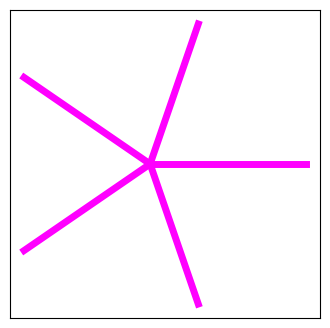

-------------
Index i = 90
Performance:  622500


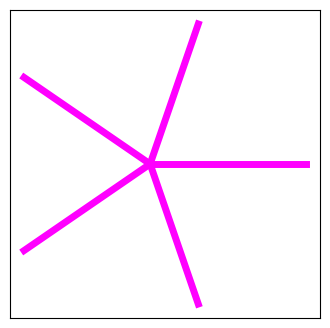

-------------
Index i = 91
Performance:  622500


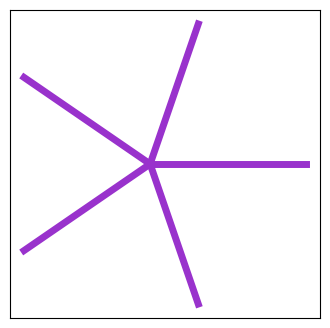

-------------
Index i = 92
Performance:  622500


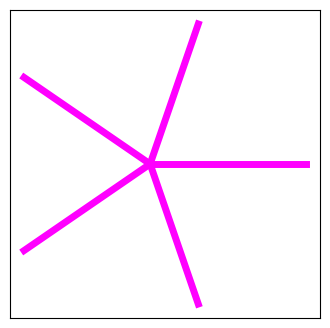

-------------
Index i = 93
Performance:  622500


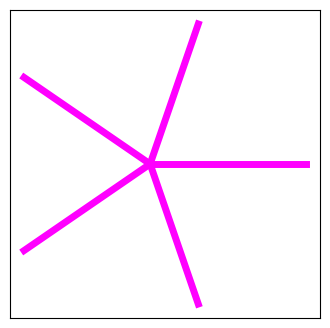

-------------
Index i = 94
Performance:  622500


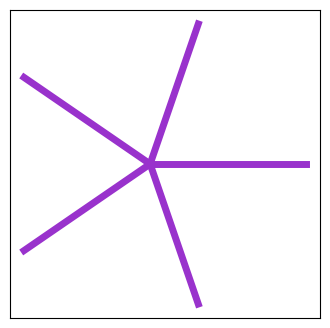

-------------
Index i = 95
Performance:  622500


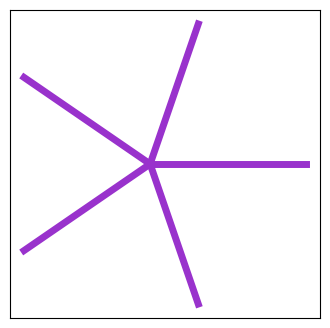

-------------
Index i = 96
Performance:  697449


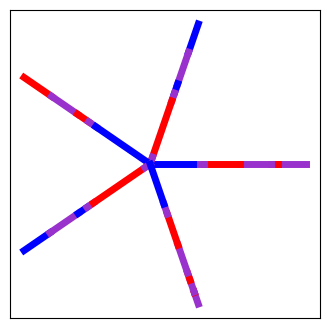

-------------
Index i = 97
Performance:  622500


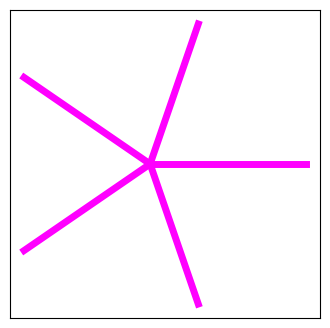

-------------
Index i = 98
Performance:  622500


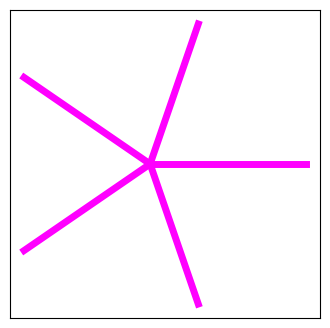

-------------
Index i = 99
Performance:  622500


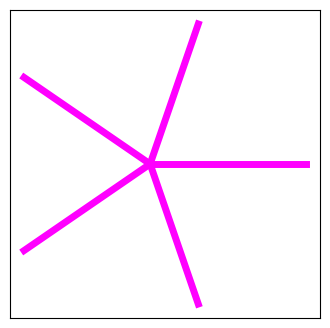

-------------


In [68]:
#Optimal colorings for k-star where k = 5 and n = 1000 considering adjacent pairs of arms

np.random.seed(383)
random.seed(40)

colorings_kstar_adj_k5_n1000 = []

for i in range(100):
    print('Index i =', i)
    colorings_kstar_adj_k5_n1000 += [optimize_coloring('S', 'adj', random_kcoloring(5, 1000), random_ordering(1000))]
    print('-------------')

In [103]:
#Optimal colorings for k-star where k = 5 and n = 1000 considering adjacent pairs of arms

buckets_for_kstar_adj_k5_n1000 = [colorings_kstar_adj_k5_n1000[0], colorings_kstar_adj_k5_n1000[24], colorings_kstar_adj_k5_n1000[44], colorings_kstar_adj_k5_n1000[41], colorings_kstar_adj_k5_n1000[28], colorings_kstar_adj_k5_n1000[37]]

compare_list_to_target(colorings_kstar_adj_k5_n1000, buckets_for_kstar_adj_k5_n1000, 'adj')

Index i =  0
Bucket ID: Alternating
Number of Progressions: 622500
Percent difference:  0.0 %
----------------
Index i =  1
Bucket ID: Alternating
Number of Progressions: 622500
Percent difference:  0.0 %
----------------
Index i =  2
Bucket ID: Alternating
Number of Progressions: 622500
Percent difference:  0.0 %
----------------
Index i =  3
Bucket ID: Alternating
Number of Progressions: 622500
Percent difference:  0.0 %
----------------
Index i =  4
Bucket ID: Alternating
Number of Progressions: 622500
Percent difference:  0.0 %
----------------
Index i =  5
Bucket ID: Alternating
Number of Progressions: 622500
Percent difference:  0.0 %
----------------
Index i =  6
Bucket ID: Alternating
Number of Progressions: 622500
Percent difference:  0.0 %
----------------
Index i =  7
Bucket ID: Alternating
Number of Progressions: 622500
Percent difference:  0.0 %
----------------
Index i =  8
Bucket ID: Alternating
Number of Progressions: 622500
Percent difference:  0.0 %
----------------
I

### k=6:

Index i = 0
Performance:  177390


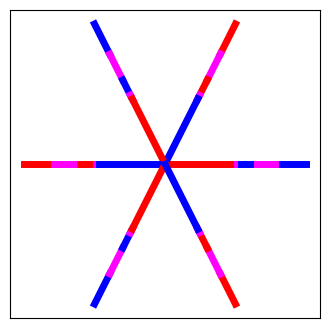

-------------
Index i = 1
Performance:  186000


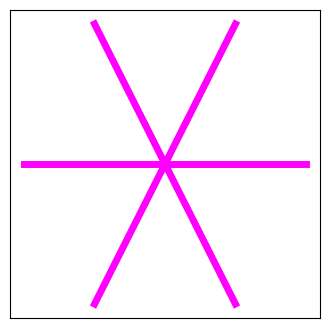

-------------
Index i = 2
Performance:  186000


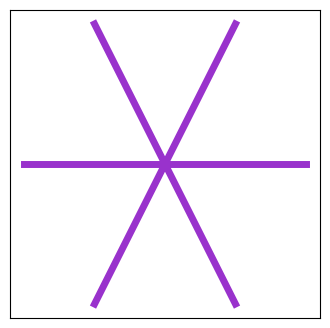

-------------
Index i = 3
Performance:  177390


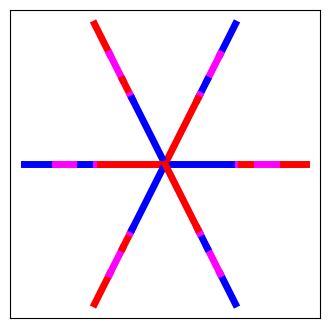

-------------
Index i = 4
Performance:  177390


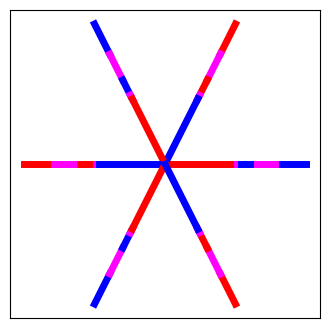

-------------
Index i = 5
Performance:  177390


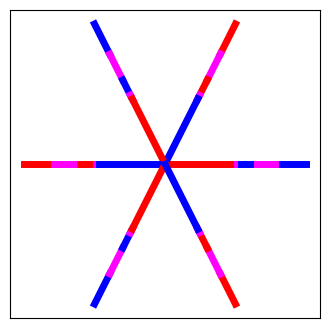

-------------
Index i = 6
Performance:  177392


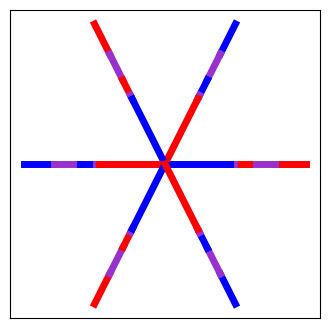

-------------
Index i = 7
Performance:  186000


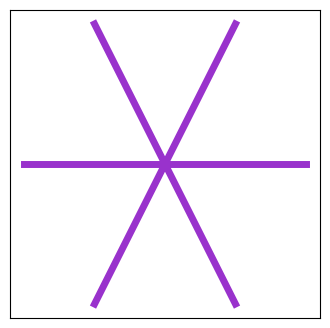

-------------
Index i = 8
Performance:  186000


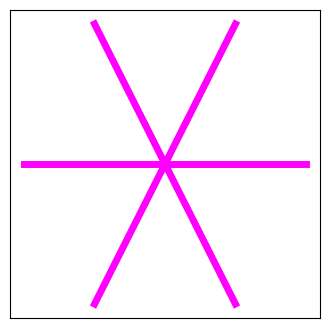

-------------
Index i = 9
Performance:  177390


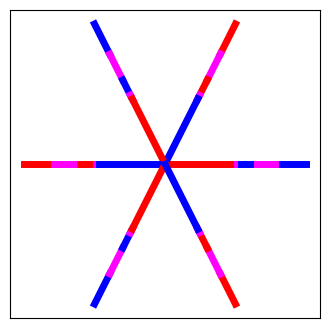

-------------
Index i = 10
Performance:  177391


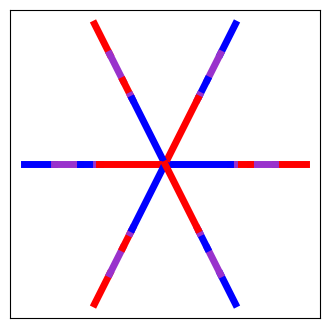

-------------
Index i = 11
Performance:  177392


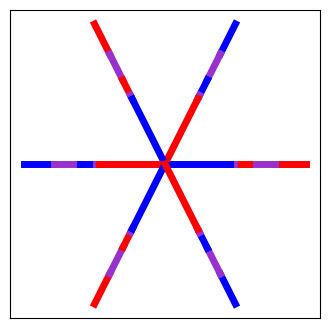

-------------
Index i = 12
Performance:  177393


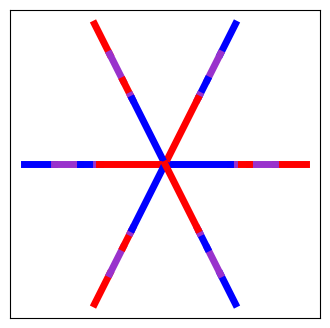

-------------
Index i = 13
Performance:  186000


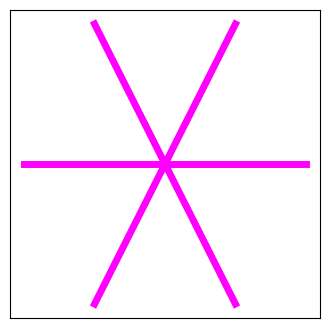

-------------
Index i = 14
Performance:  177390


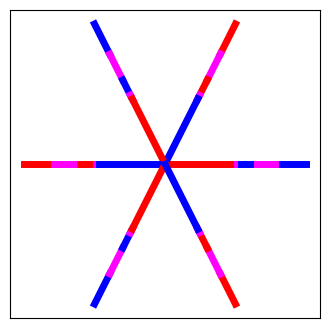

-------------
Index i = 15
Performance:  177390


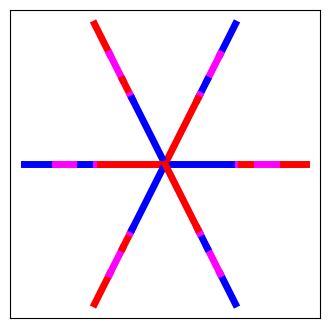

-------------
Index i = 16
Performance:  186000


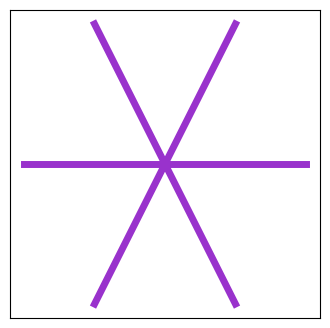

-------------
Index i = 17
Performance:  177392


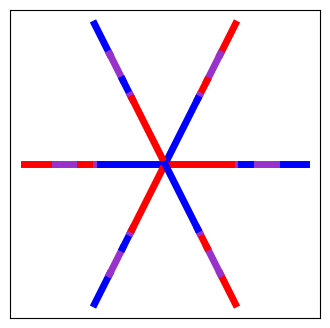

-------------
Index i = 18
Performance:  177392


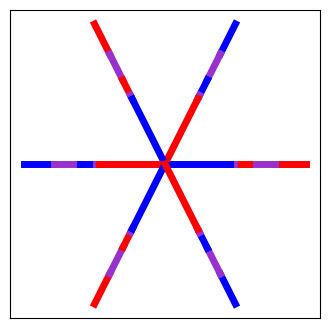

-------------
Index i = 19
Performance:  186000


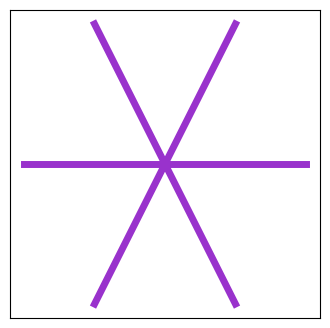

-------------
Index i = 20
Performance:  177392


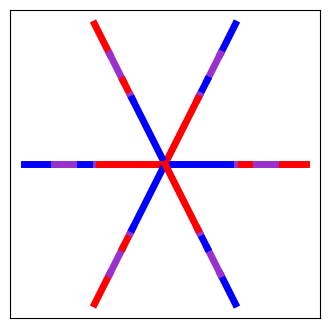

-------------
Index i = 21
Performance:  177392


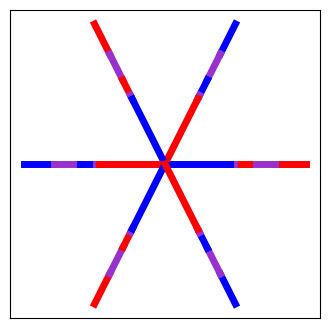

-------------
Index i = 22
Performance:  186000


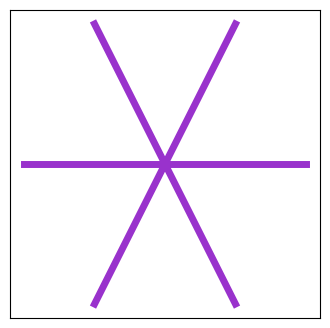

-------------
Index i = 23
Performance:  177390


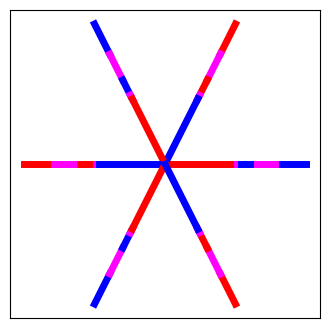

-------------
Index i = 24
Performance:  186000


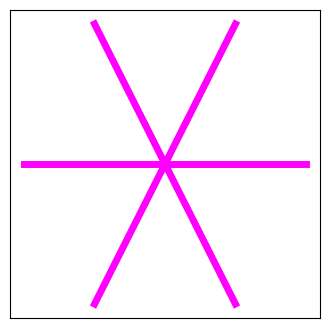

-------------
Index i = 25
Performance:  186000


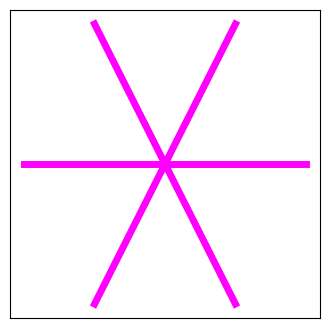

-------------
Index i = 26
Performance:  186000


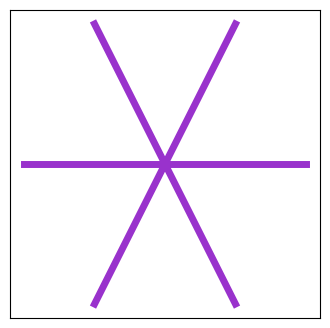

-------------
Index i = 27
Performance:  177390


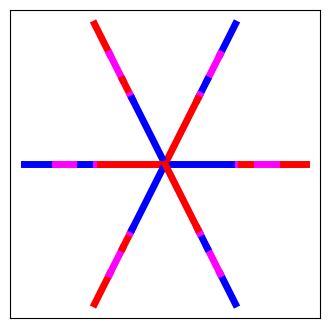

-------------
Index i = 28
Performance:  177393


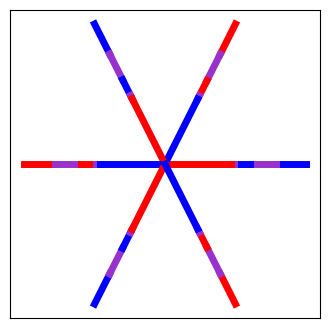

-------------
Index i = 29
Performance:  186000


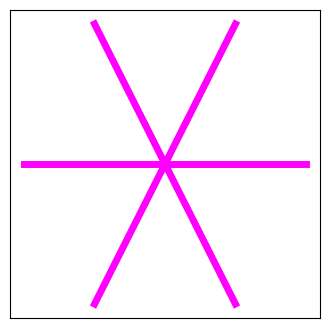

-------------
Index i = 30
Performance:  186000


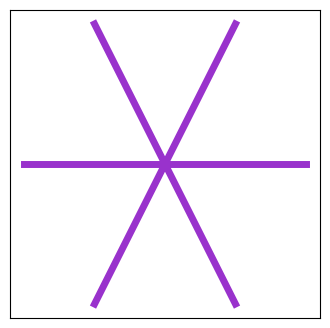

-------------
Index i = 31
Performance:  177393


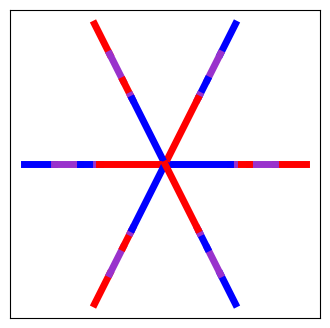

-------------
Index i = 32
Performance:  177393


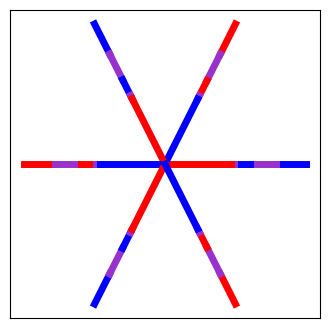

-------------
Index i = 33
Performance:  186000


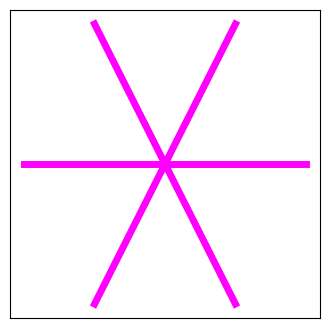

-------------
Index i = 34
Performance:  186000


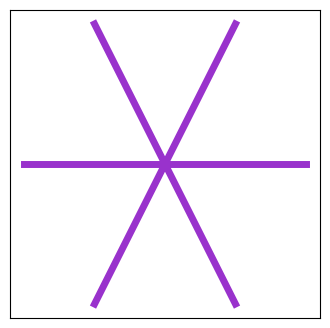

-------------
Index i = 35
Performance:  177390


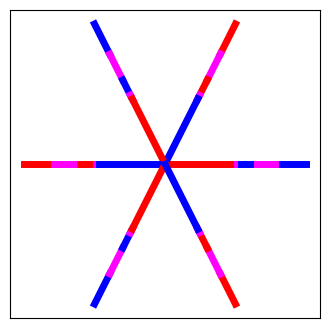

-------------
Index i = 36
Performance:  186000


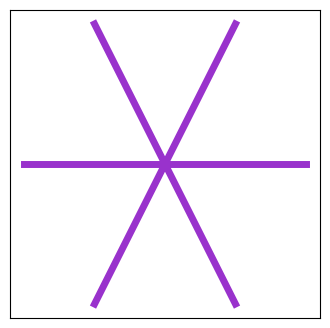

-------------
Index i = 37
Performance:  186000


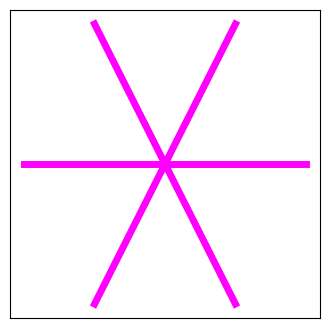

-------------
Index i = 38
Performance:  177392


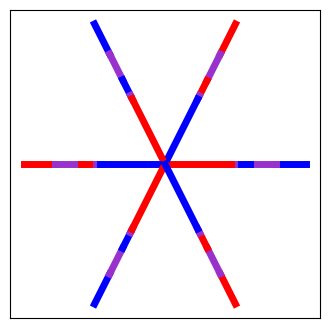

-------------
Index i = 39
Performance:  177390


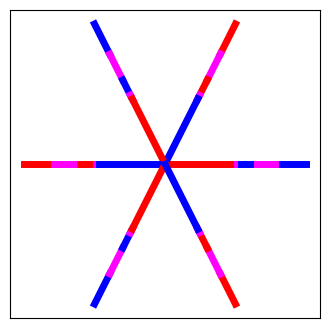

-------------
Index i = 40
Performance:  186000


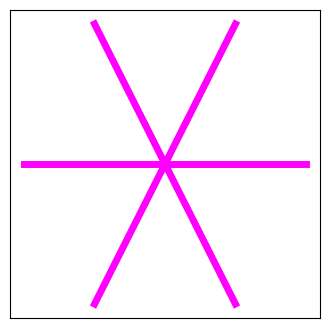

-------------
Index i = 41
Performance:  177390


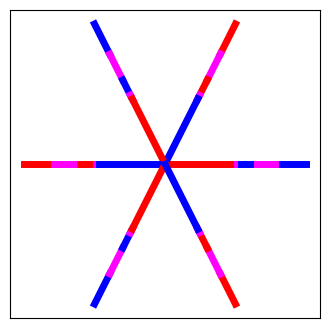

-------------
Index i = 42
Performance:  177390


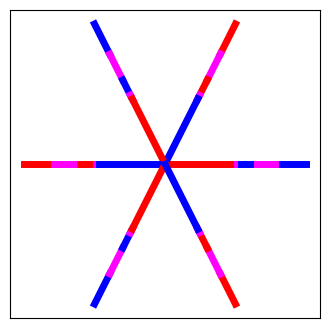

-------------
Index i = 43
Performance:  186000


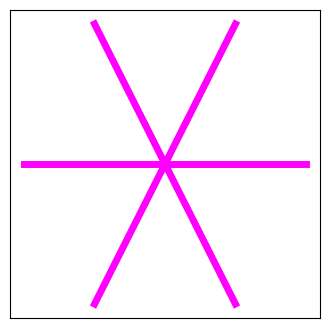

-------------
Index i = 44
Performance:  186000


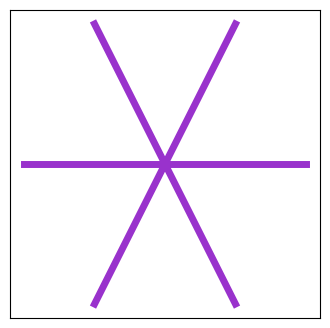

-------------
Index i = 45
Performance:  186000


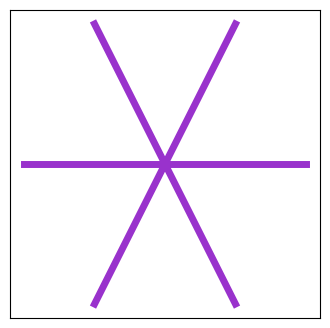

-------------
Index i = 46
Performance:  186000


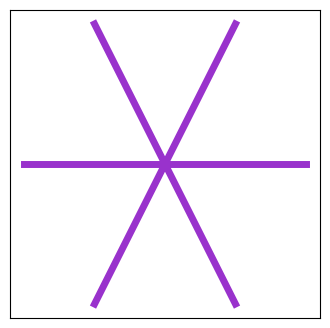

-------------
Index i = 47
Performance:  186000


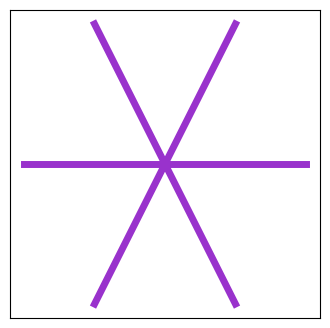

-------------
Index i = 48
Performance:  186000


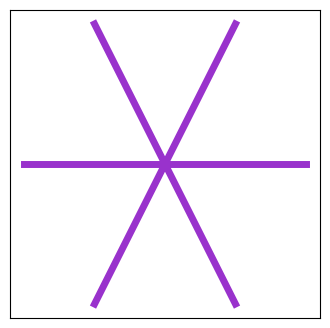

-------------
Index i = 49
Performance:  186000


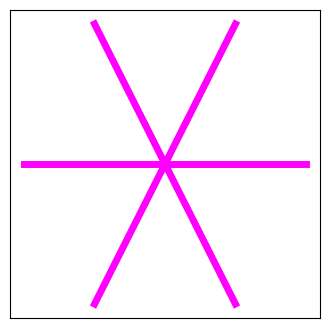

-------------
Index i = 50
Performance:  186000


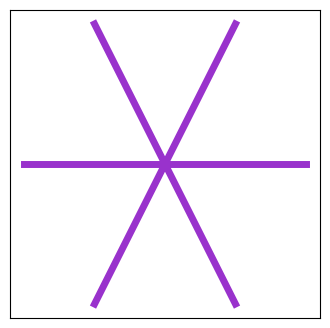

-------------
Index i = 51
Performance:  177392


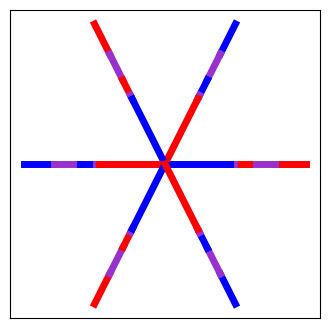

-------------
Index i = 52
Performance:  186000


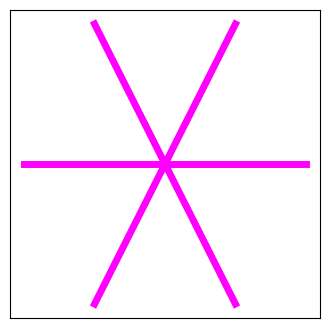

-------------
Index i = 53
Performance:  177392


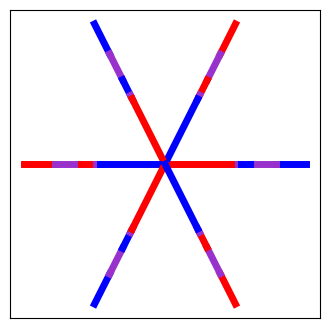

-------------
Index i = 54
Performance:  186000


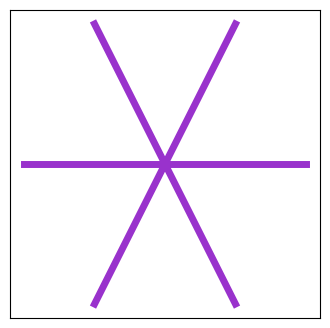

-------------
Index i = 55
Performance:  186000


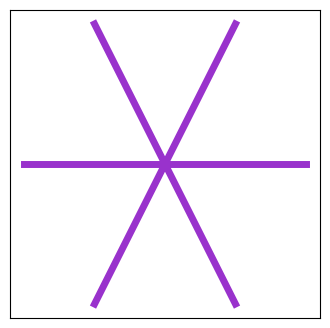

-------------
Index i = 56
Performance:  186000


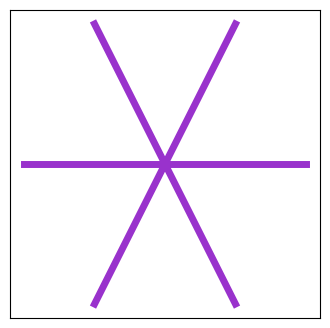

-------------
Index i = 57
Performance:  177390


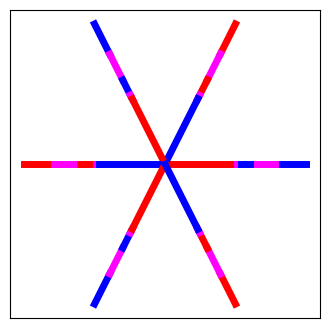

-------------
Index i = 58
Performance:  186000


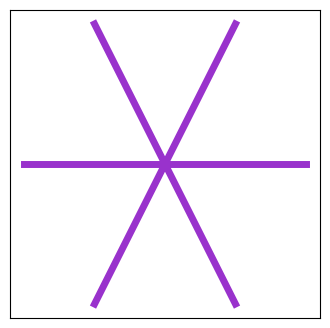

-------------
Index i = 59
Performance:  186000


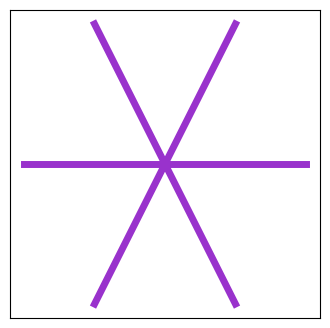

-------------
Index i = 60
Performance:  186000


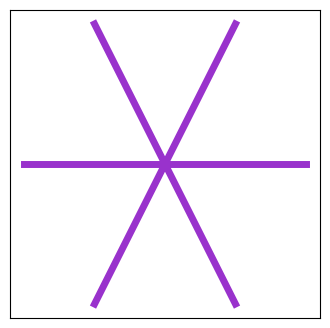

-------------
Index i = 61
Performance:  177393


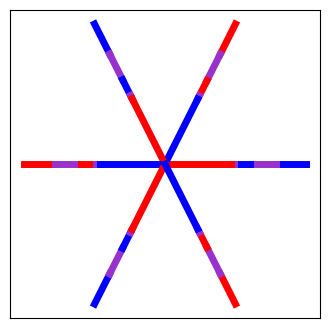

-------------
Index i = 62
Performance:  177390


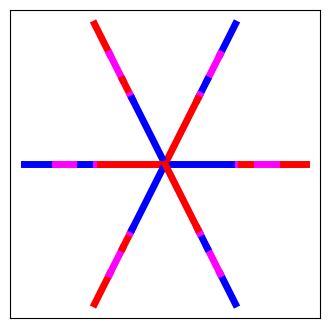

-------------
Index i = 63
Performance:  186000


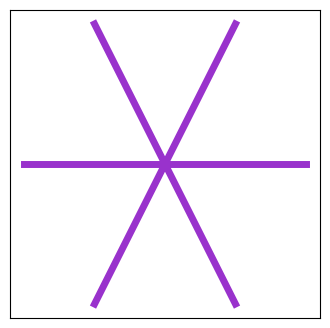

-------------
Index i = 64
Performance:  186000


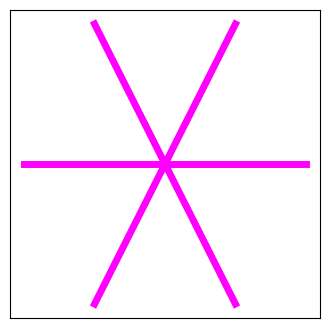

-------------
Index i = 65
Performance:  186000


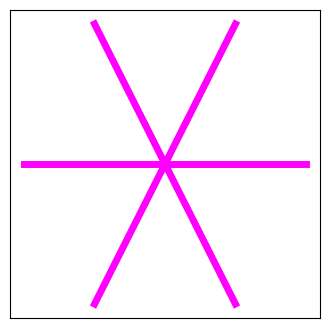

-------------
Index i = 66
Performance:  186000


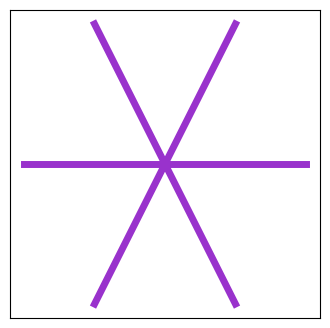

-------------
Index i = 67
Performance:  177391


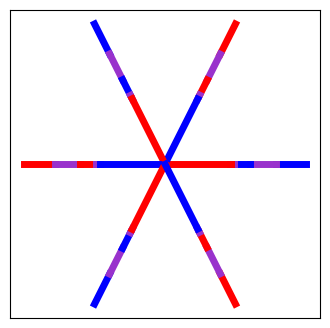

-------------
Index i = 68
Performance:  186000


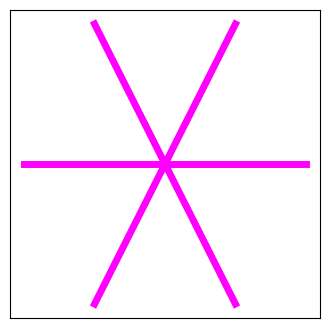

-------------
Index i = 69
Performance:  186000


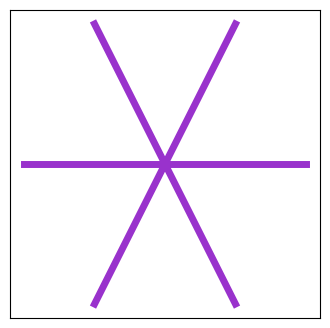

-------------
Index i = 70
Performance:  186000


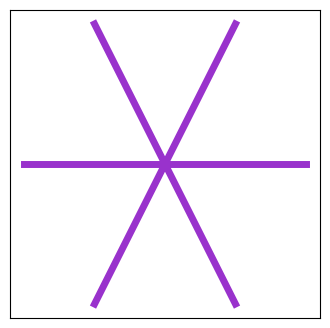

-------------
Index i = 71
Performance:  177390


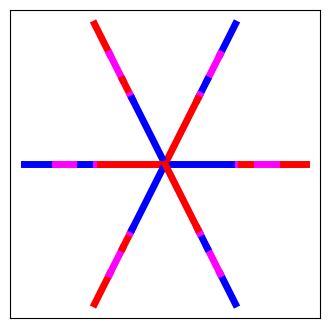

-------------
Index i = 72
Performance:  186000


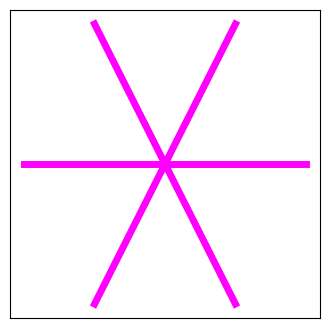

-------------
Index i = 73
Performance:  177392


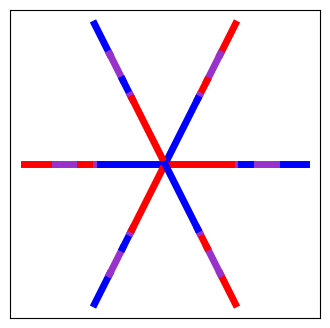

-------------
Index i = 74
Performance:  177393


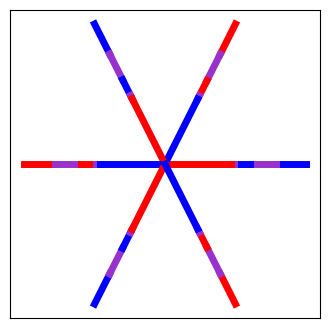

-------------
Index i = 75
Performance:  186000


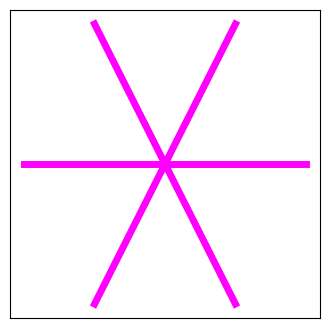

-------------
Index i = 76
Performance:  177390


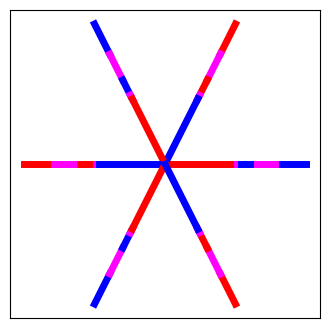

-------------
Index i = 77
Performance:  186000


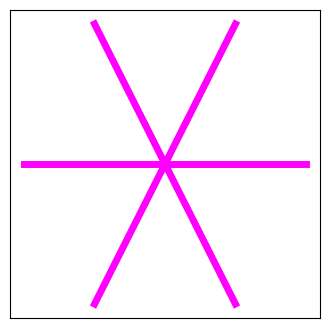

-------------
Index i = 78
Performance:  186000


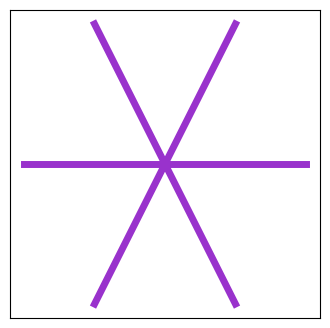

-------------
Index i = 79
Performance:  186000


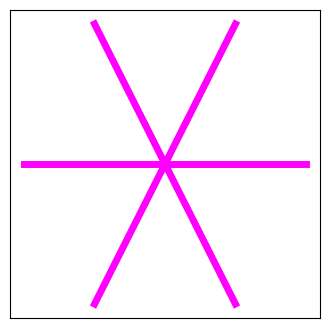

-------------
Index i = 80
Performance:  177390


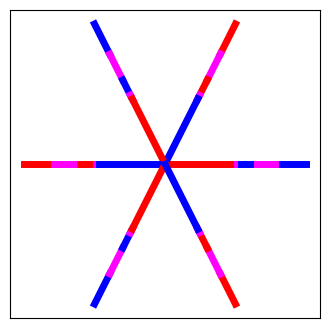

-------------
Index i = 81
Performance:  186000


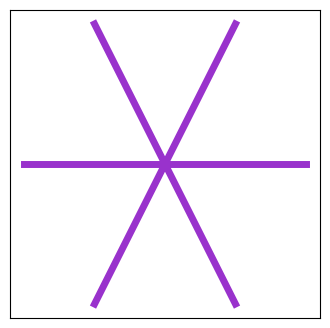

-------------
Index i = 82
Performance:  177390


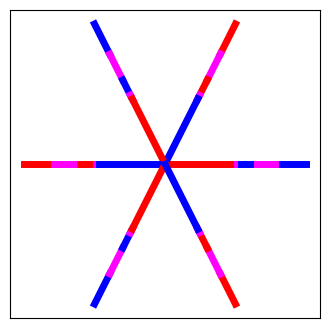

-------------
Index i = 83
Performance:  177393


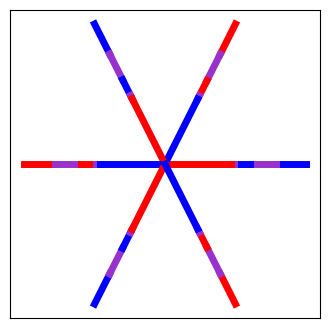

-------------
Index i = 84
Performance:  186000


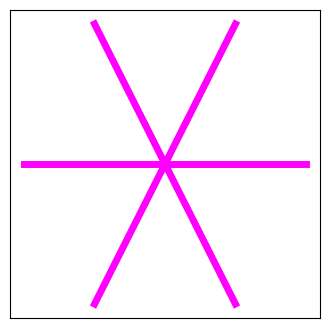

-------------
Index i = 85
Performance:  177390


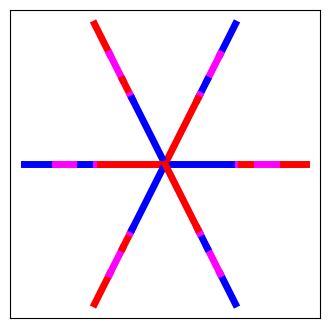

-------------
Index i = 86
Performance:  186000


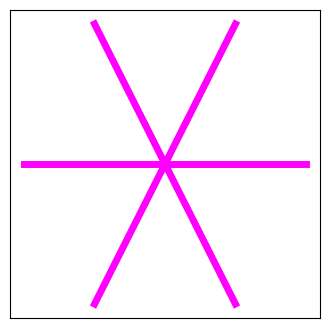

-------------
Index i = 87
Performance:  186000


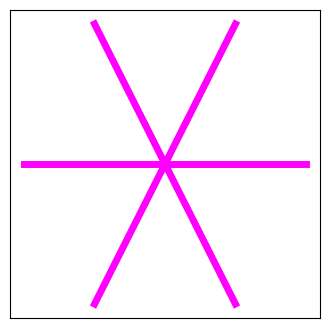

-------------
Index i = 88
Performance:  177392


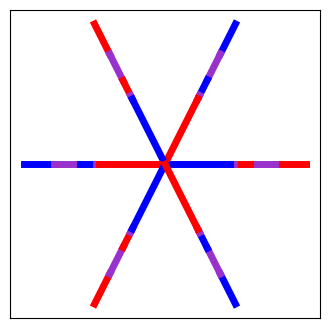

-------------
Index i = 89
Performance:  186000


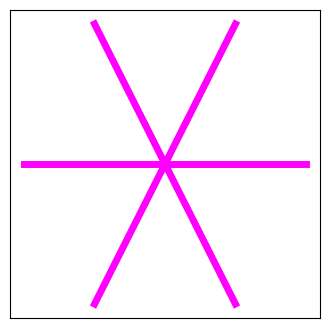

-------------
Index i = 90
Performance:  177390


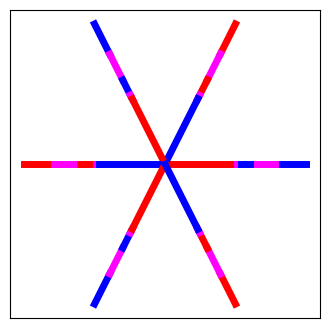

-------------
Index i = 91
Performance:  186000


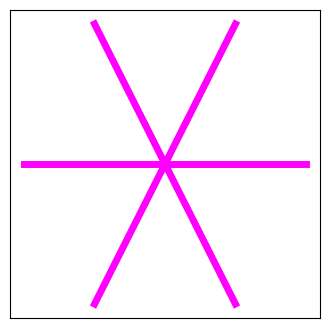

-------------
Index i = 92
Performance:  177390


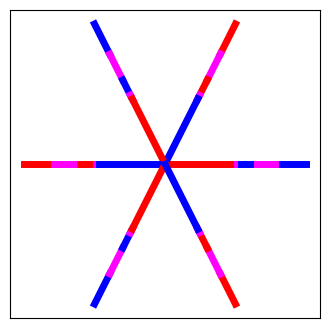

-------------
Index i = 93
Performance:  177390


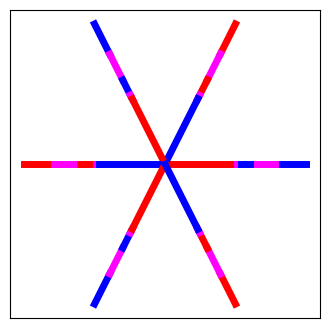

-------------
Index i = 94
Performance:  177391


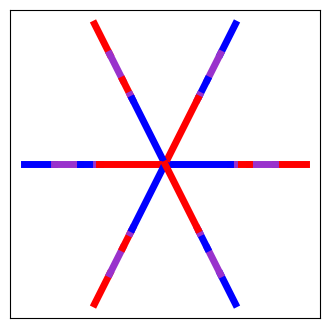

-------------
Index i = 95
Performance:  177390


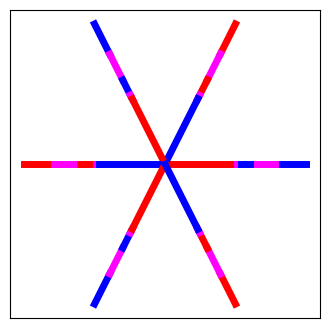

-------------
Index i = 96
Performance:  186000


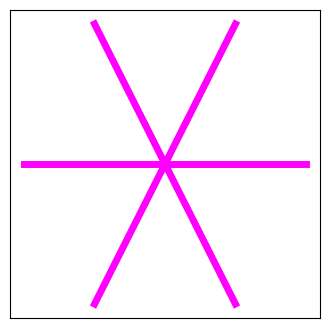

-------------
Index i = 97
Performance:  186000


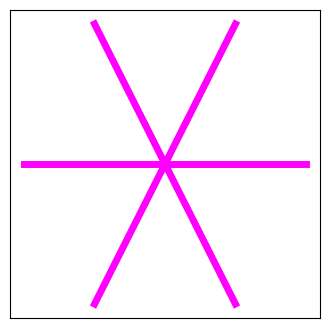

-------------
Index i = 98
Performance:  186000


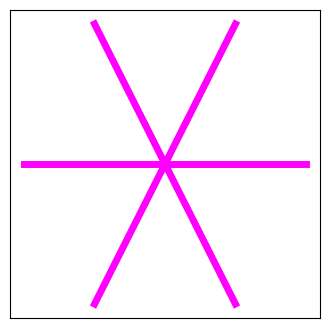

-------------
Index i = 99
Performance:  186000


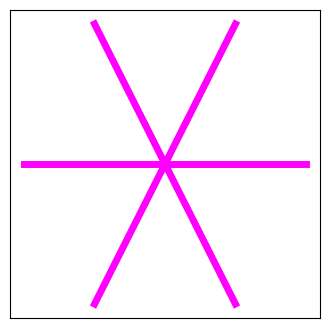

-------------


In [72]:
np.random.seed(327)
random.seed(394)

colorings_kstar_adj_k6_n500 = []

for i in range(100):
    print('Index i =', i)
    colorings_kstar_adj_k6_n500 += [optimize_coloring('S', 'adj', random_kcoloring(6, 500), random_ordering(500))]
    print('-------------')

In [114]:
#Optimal colorings for k-star where k = 6 and n = 500 considering adjacent pairs of arms

buckets_for_kstar_adj_k6_n500 = [colorings_kstar_adj_k6_n500[1], colorings_kstar_adj_k6_n500[0]]

compare_list_to_target(colorings_kstar_adj_k6_n500, buckets_for_kstar_adj_k6_n500, 'adj')

Index i =  0
Bucket ID:  1
Number of Progressions: 177390
Percent difference:  0.0 %
----------------
Index i =  1
Bucket ID: Alternating
Number of Progressions: 186000
Percent difference:  0.0 %
----------------
Index i =  2
Bucket ID: Alternating
Number of Progressions: 186000
Percent difference:  0.0 %
----------------
Index i =  3
Bucket ID:  1
Number of Progressions: 177390
Percent difference:  0.4 %
----------------
Index i =  4
Bucket ID:  1
Number of Progressions: 177390
Percent difference:  0.0 %
----------------
Index i =  5
Bucket ID:  1
Number of Progressions: 177390
Percent difference:  0.0 %
----------------
Index i =  6
Bucket ID:  1
Number of Progressions: 177392
Percent difference:  0.13333333333333333 %
----------------
Index i =  7
Bucket ID: Alternating
Number of Progressions: 186000
Percent difference:  0.0 %
----------------
Index i =  8
Bucket ID: Alternating
Number of Progressions: 186000
Percent difference:  0.0 %
----------------
Index i =  9
Bucket ID:  1
Num

Index i = 0
Performance:  712551


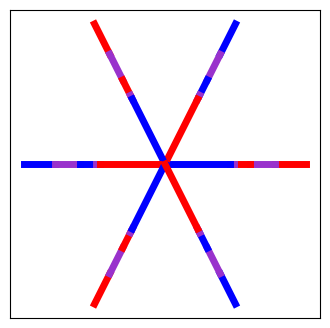

-------------
Index i = 1
Performance:  747000


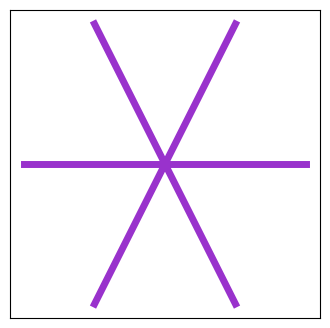

-------------
Index i = 2
Performance:  712557


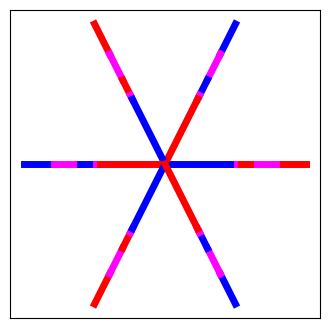

-------------
Index i = 3
Performance:  747000


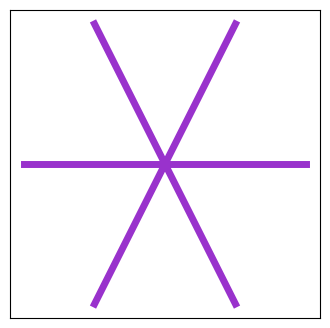

-------------
Index i = 4
Performance:  747000


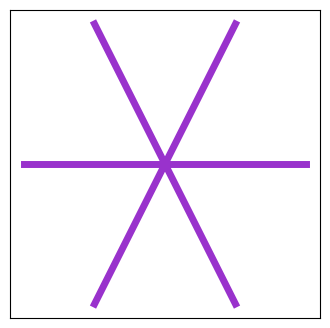

-------------
Index i = 5
Performance:  747000


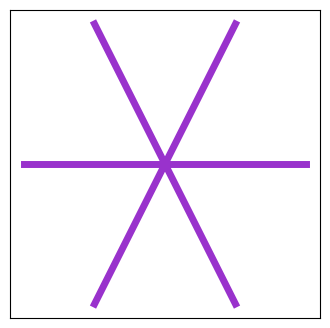

-------------
Index i = 6
Performance:  712551


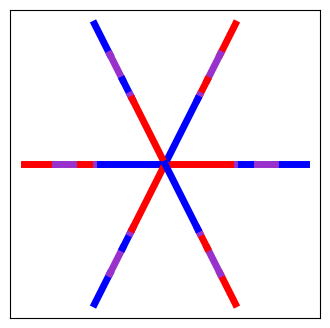

-------------
Index i = 7
Performance:  712557


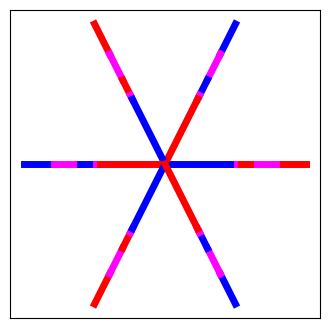

-------------
Index i = 8
Performance:  712557


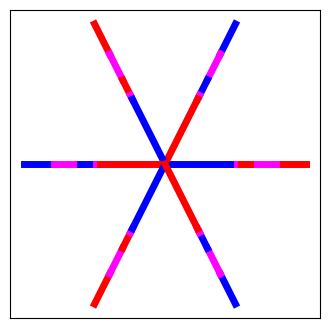

-------------
Index i = 9
Performance:  712551


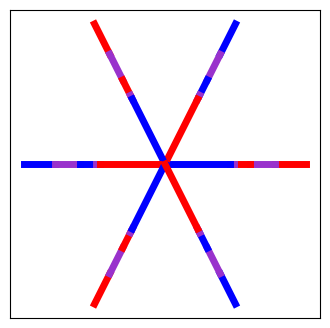

-------------
Index i = 10
Performance:  712557


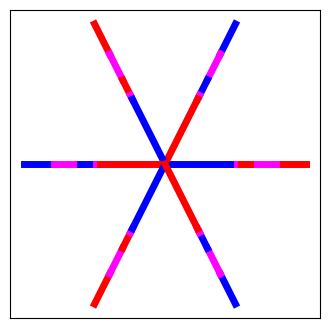

-------------
Index i = 11
Performance:  747000


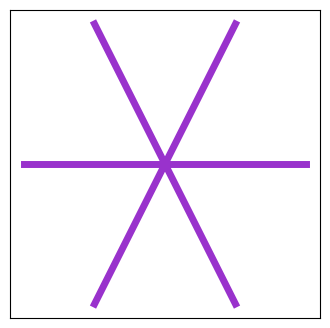

-------------
Index i = 12
Performance:  747000


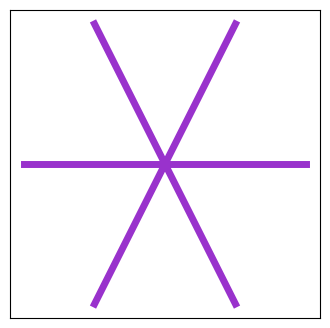

-------------
Index i = 13
Performance:  747000


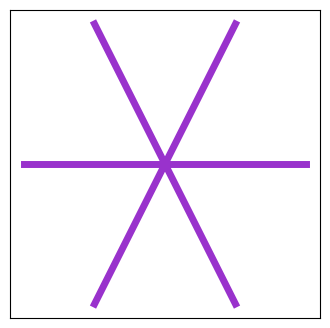

-------------
Index i = 14
Performance:  747000


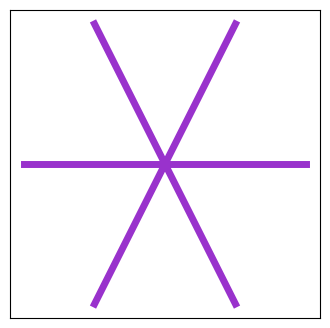

-------------
Index i = 15
Performance:  747000


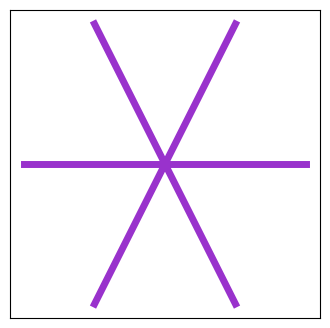

-------------
Index i = 16
Performance:  712551


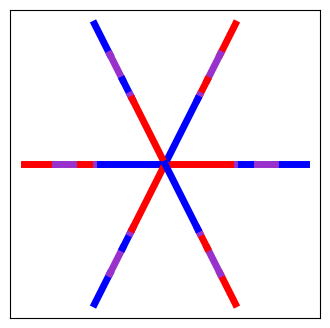

-------------
Index i = 17
Performance:  747000


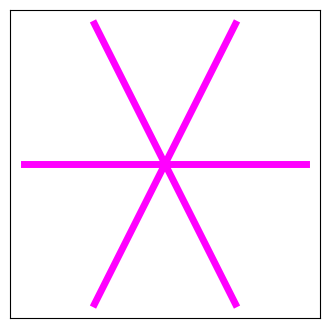

-------------
Index i = 18
Performance:  747000


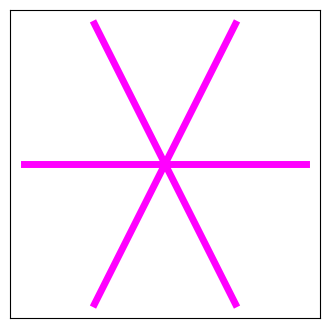

-------------
Index i = 19
Performance:  747000


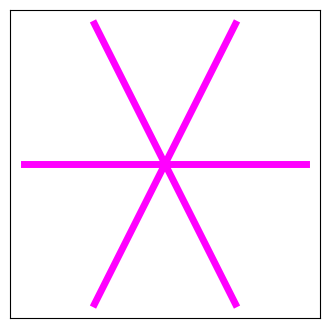

-------------
Index i = 20
Performance:  712557


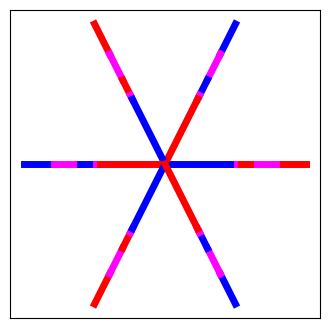

-------------
Index i = 21
Performance:  747000


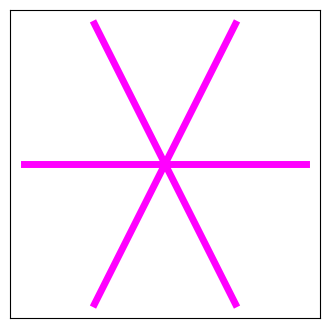

-------------
Index i = 22
Performance:  747000


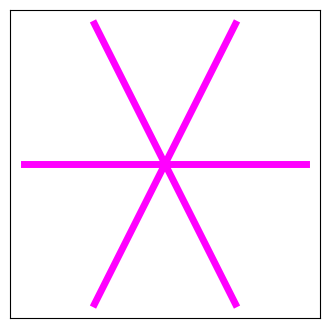

-------------
Index i = 23
Performance:  747000


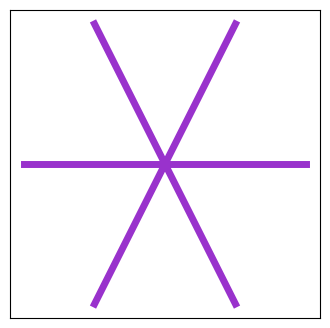

-------------
Index i = 24
Performance:  712557


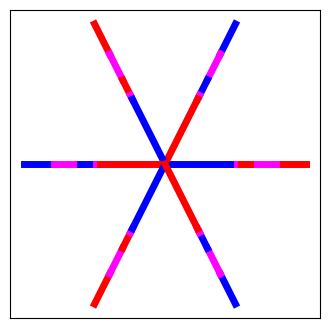

-------------
Index i = 25
Performance:  747000


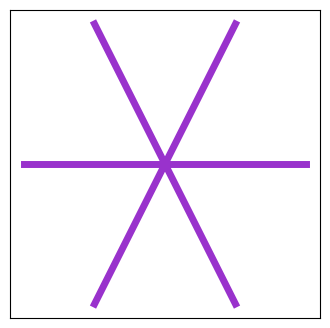

-------------
Index i = 26
Performance:  747000


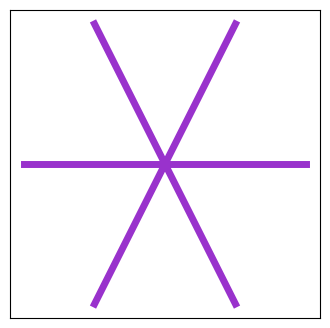

-------------
Index i = 27
Performance:  747000


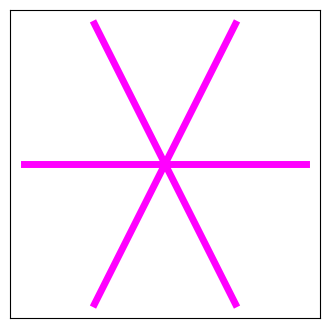

-------------
Index i = 28
Performance:  747000


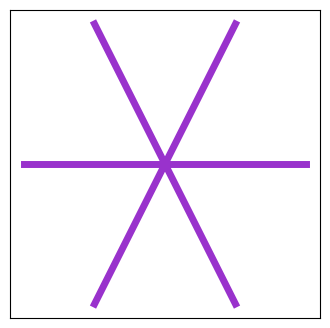

-------------
Index i = 29
Performance:  712557


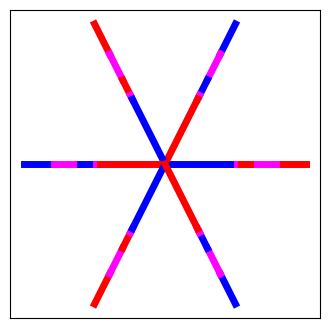

-------------
Index i = 30
Performance:  712557


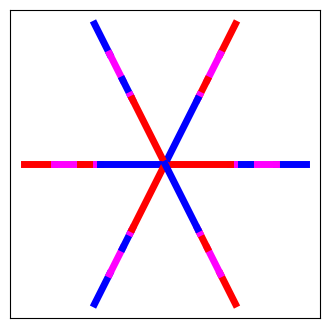

-------------
Index i = 31
Performance:  747000


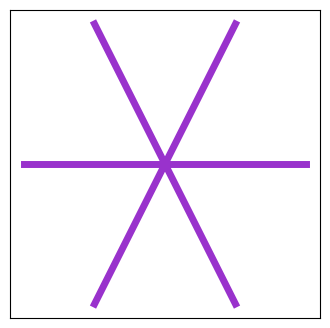

-------------
Index i = 32
Performance:  747000


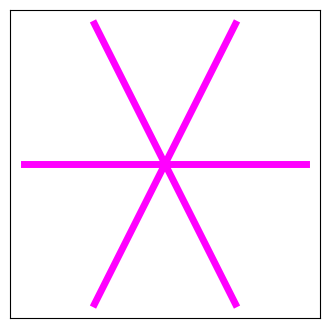

-------------
Index i = 33
Performance:  712551


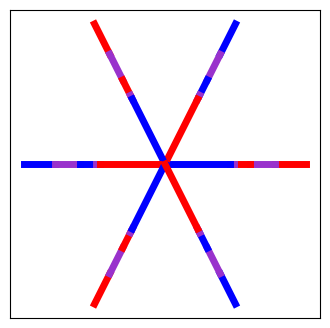

-------------
Index i = 34
Performance:  747000


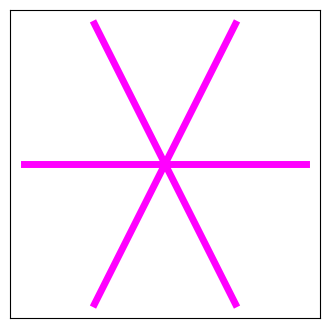

-------------
Index i = 35
Performance:  712557


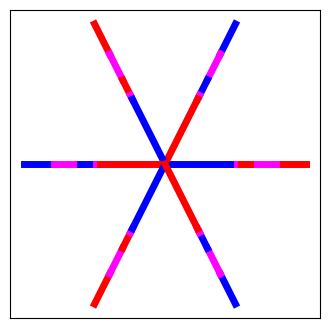

-------------
Index i = 36
Performance:  712551


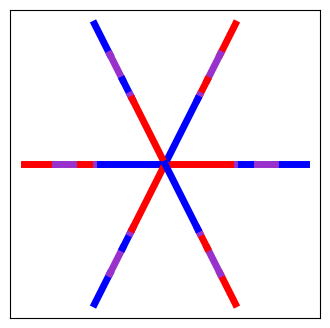

-------------
Index i = 37
Performance:  712557


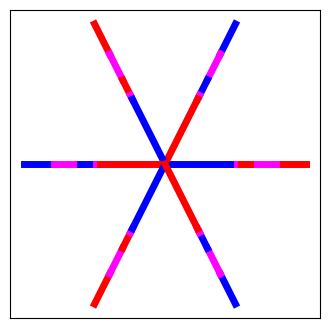

-------------
Index i = 38
Performance:  712551


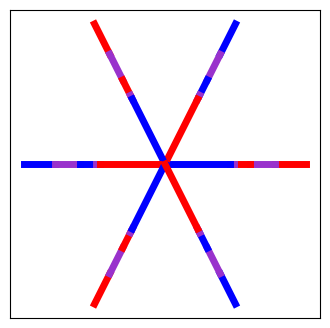

-------------
Index i = 39
Performance:  747000


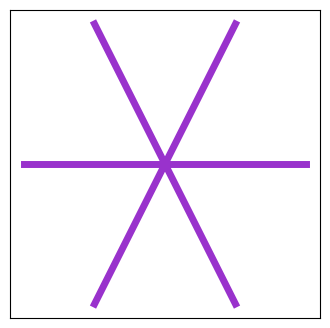

-------------
Index i = 40
Performance:  712557


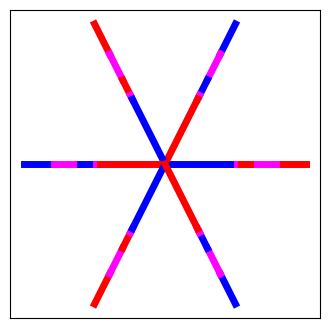

-------------
Index i = 41
Performance:  747000


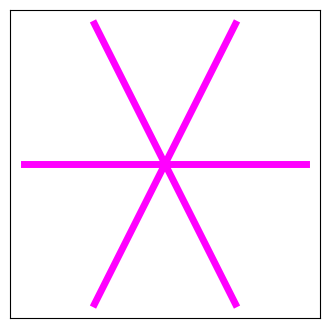

-------------
Index i = 42
Performance:  747000


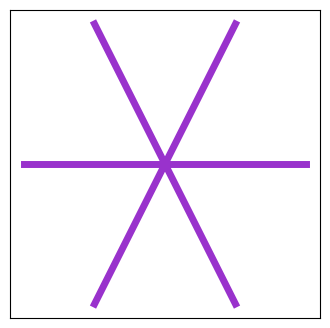

-------------
Index i = 43
Performance:  747000


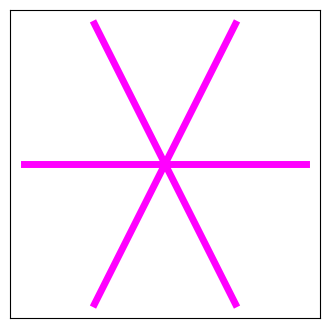

-------------
Index i = 44
Performance:  747000


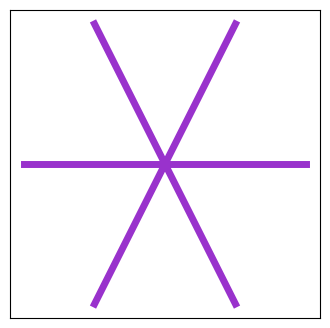

-------------
Index i = 45
Performance:  747000


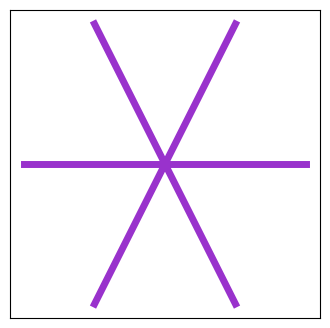

-------------
Index i = 46
Performance:  712551


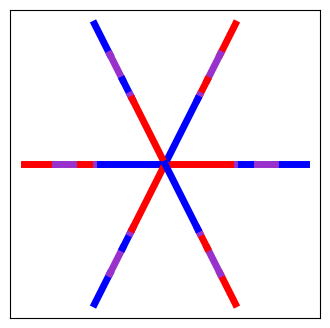

-------------
Index i = 47
Performance:  747000


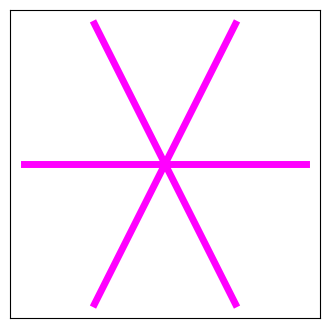

-------------
Index i = 48
Performance:  747000


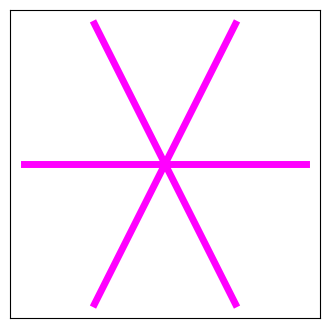

-------------
Index i = 49
Performance:  747000


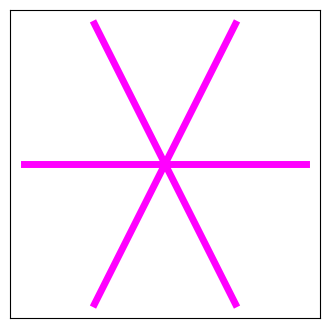

-------------
Index i = 50
Performance:  747000


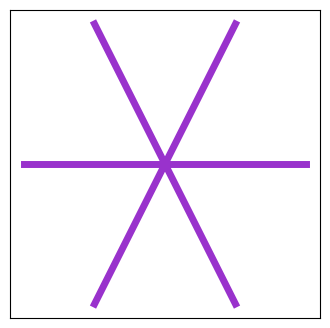

-------------
Index i = 51
Performance:  712557


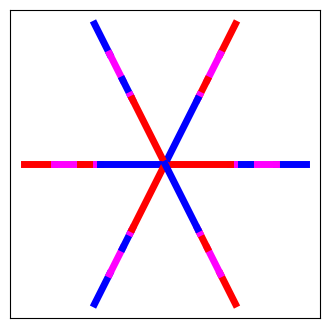

-------------
Index i = 52
Performance:  747000


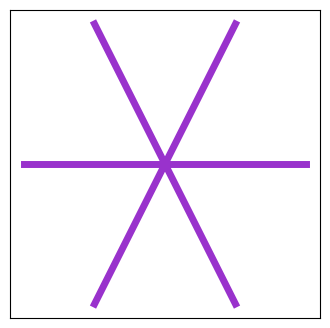

-------------
Index i = 53
Performance:  747000


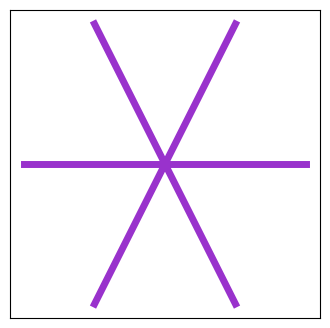

-------------
Index i = 54
Performance:  747000


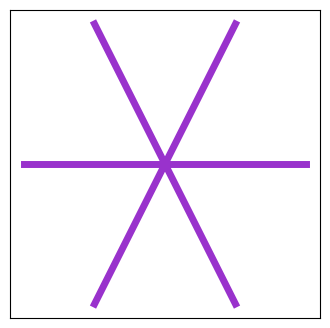

-------------
Index i = 55
Performance:  712557


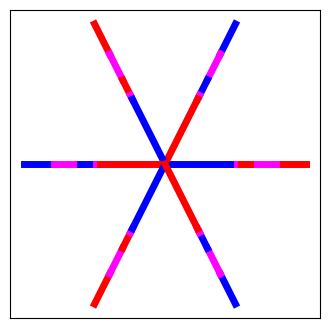

-------------
Index i = 56
Performance:  747000


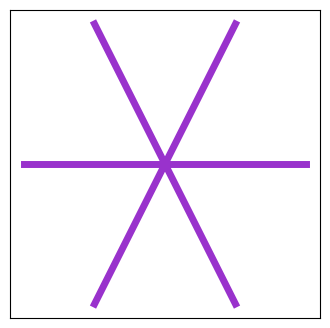

-------------
Index i = 57
Performance:  747000


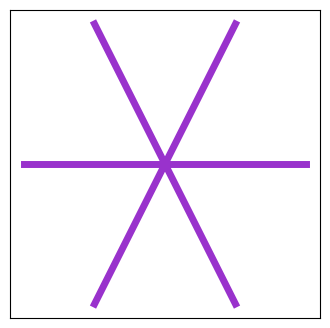

-------------
Index i = 58
Performance:  747000


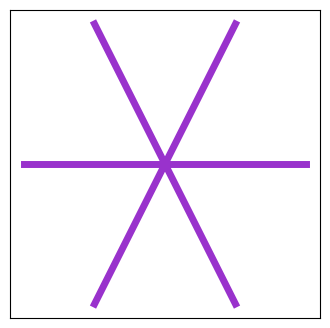

-------------
Index i = 59
Performance:  712551


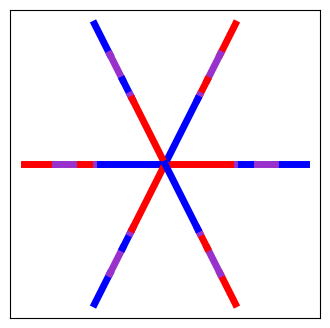

-------------
Index i = 60
Performance:  747000


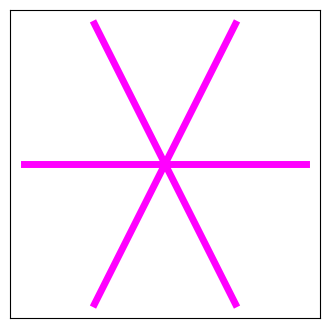

-------------
Index i = 61
Performance:  747000


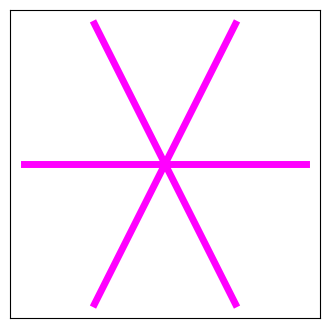

-------------
Index i = 62
Performance:  747000


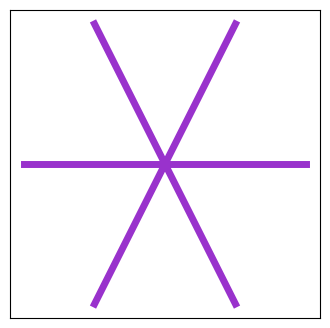

-------------
Index i = 63
Performance:  712557


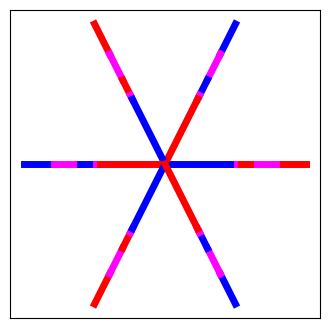

-------------
Index i = 64
Performance:  747000


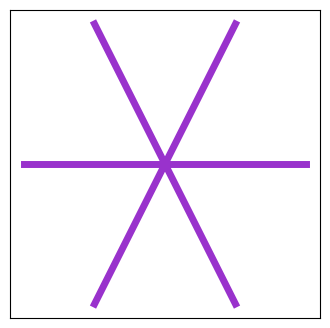

-------------
Index i = 65
Performance:  712551


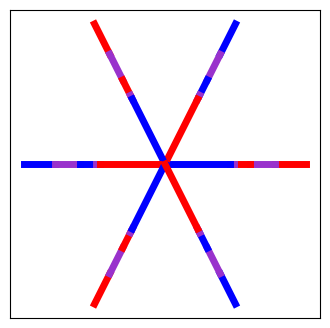

-------------
Index i = 66
Performance:  747000


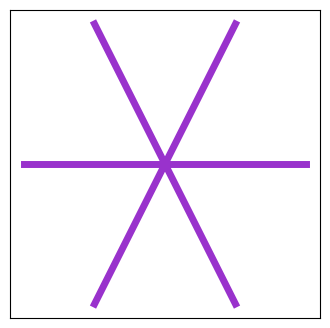

-------------
Index i = 67
Performance:  747000


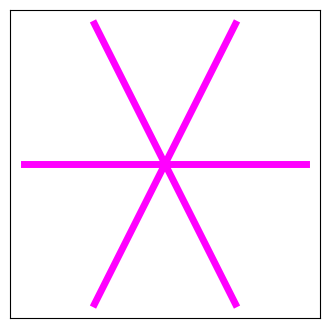

-------------
Index i = 68
Performance:  712557


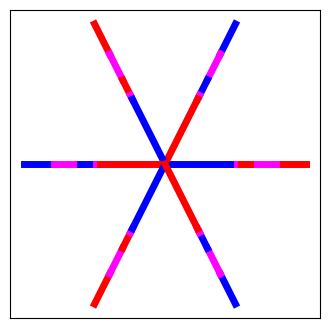

-------------
Index i = 69
Performance:  712557


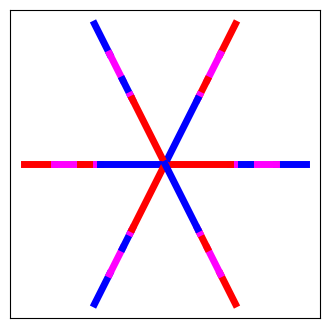

-------------
Index i = 70
Performance:  712557


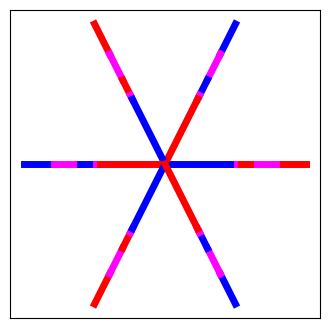

-------------
Index i = 71
Performance:  712551


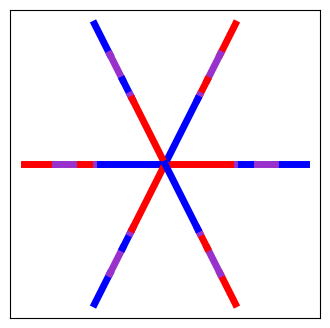

-------------
Index i = 72
Performance:  712557


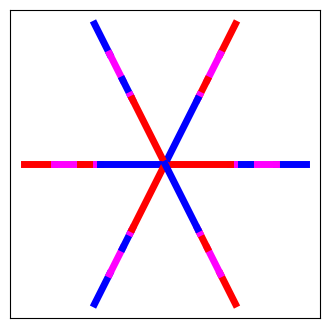

-------------
Index i = 73
Performance:  747000


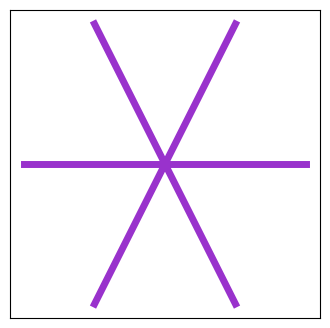

-------------
Index i = 74
Performance:  712554


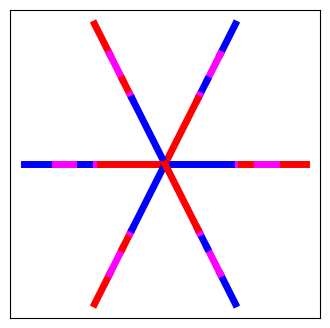

-------------
Index i = 75
Performance:  747000


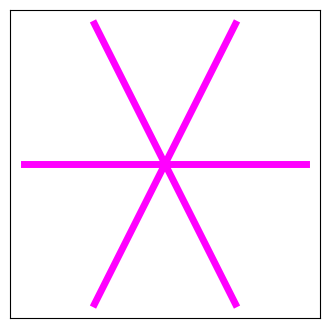

-------------
Index i = 76
Performance:  747000


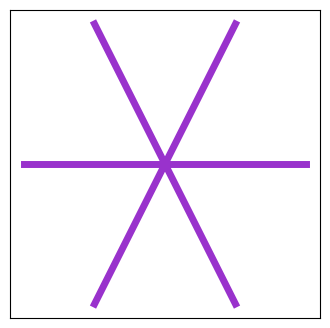

-------------
Index i = 77
Performance:  712551


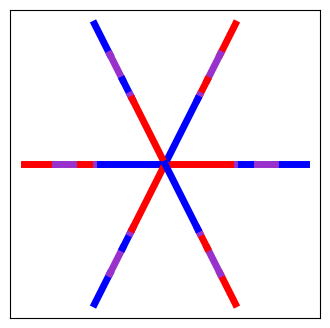

-------------
Index i = 78
Performance:  747000


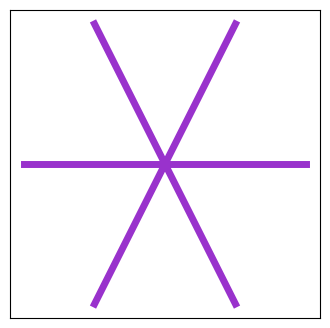

-------------
Index i = 79
Performance:  712554


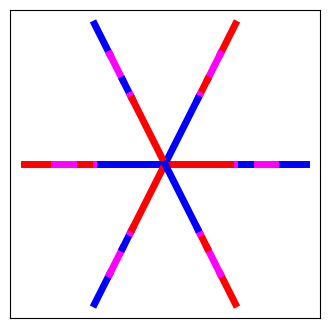

-------------
Index i = 80
Performance:  712557


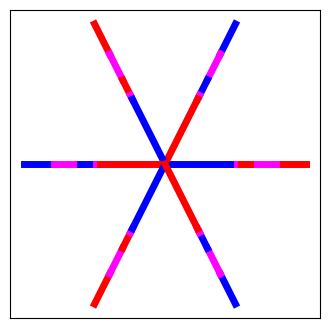

-------------
Index i = 81
Performance:  747000


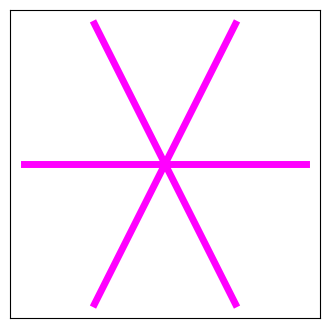

-------------
Index i = 82
Performance:  747000


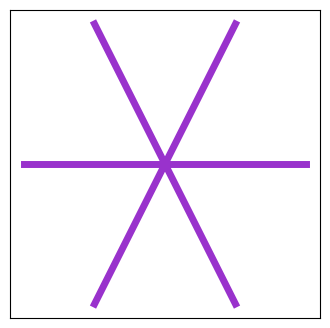

-------------
Index i = 83
Performance:  712551


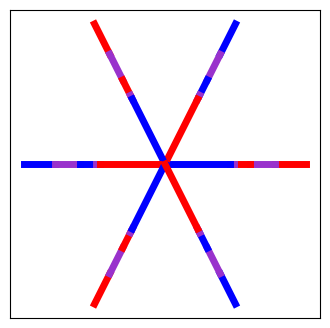

-------------
Index i = 84
Performance:  712551


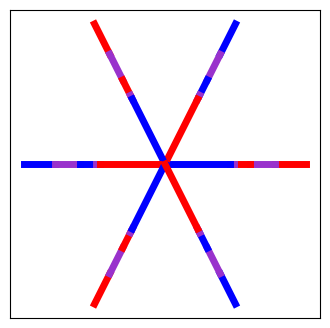

-------------
Index i = 85
Performance:  747000


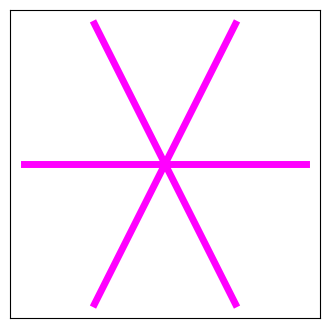

-------------
Index i = 86
Performance:  712554


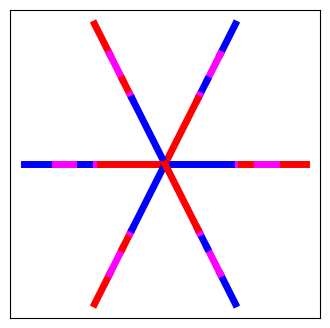

-------------
Index i = 87
Performance:  747000


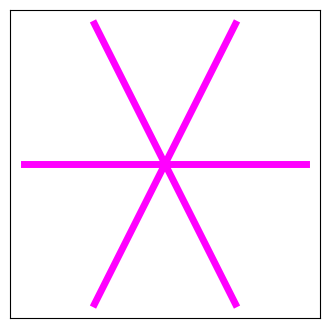

-------------
Index i = 88
Performance:  747000


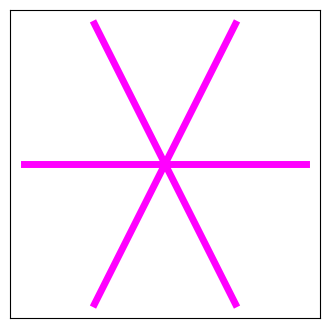

-------------
Index i = 89
Performance:  747000


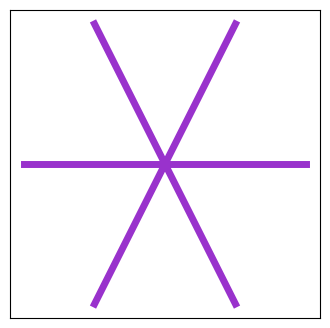

-------------
Index i = 90
Performance:  712551


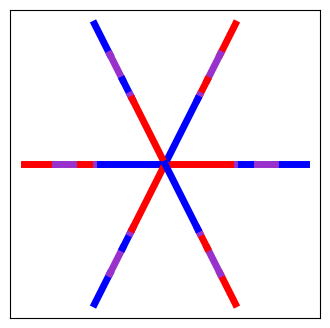

-------------
Index i = 91
Performance:  747000


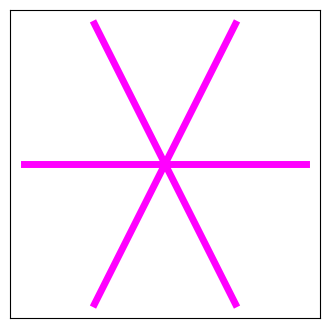

-------------
Index i = 92
Performance:  747000


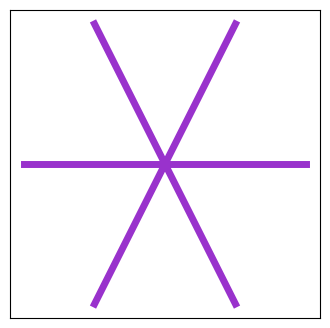

-------------
Index i = 93
Performance:  747000


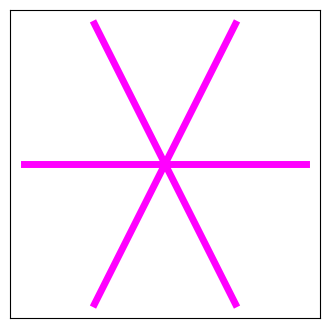

-------------
Index i = 94
Performance:  747000


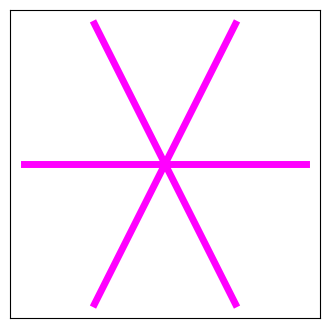

-------------
Index i = 95
Performance:  712557


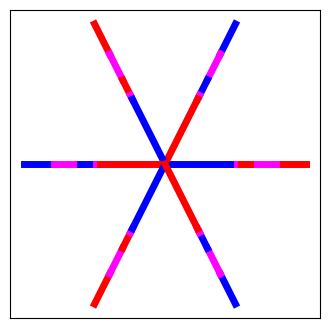

-------------
Index i = 96
Performance:  712551


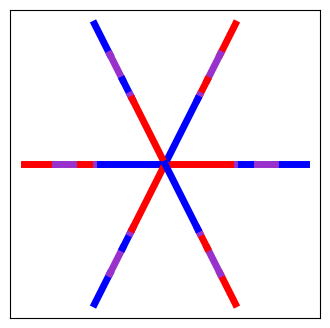

-------------
Index i = 97
Performance:  712554


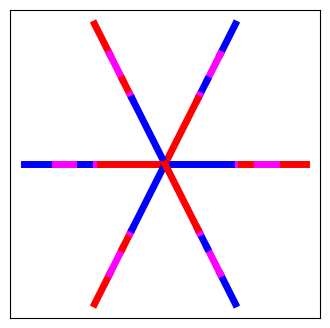

-------------
Index i = 98
Performance:  747000


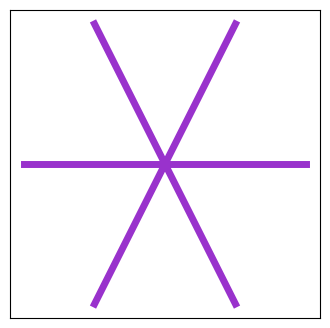

-------------
Index i = 99
Performance:  712551


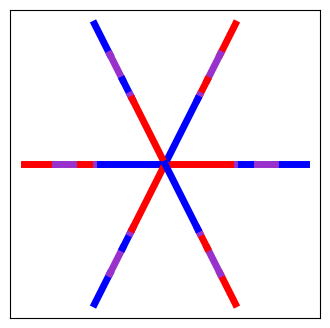

-------------


In [73]:
np.random.seed(67)
random.seed(494)

colorings_kstar_adj_k6_n1000 = []

for i in range(100):
    print('Index i =', i)
    colorings_kstar_adj_k6_n1000 += [optimize_coloring('S', 'adj', random_kcoloring(6, 1000), random_ordering(1000))]
    print('-------------')

In [26]:
#Optimal colorings for k-star where k = 6 and n = 1000 considering adjacent pairs of arms

buckets_for_kstar_adj_k6_n1000 = [colorings_kstar_adj_k6_n1000[1], colorings_kstar_adj_k6_n1000[0]]

compare_list_to_target(colorings_kstar_adj_k6_n1000, buckets_for_kstar_adj_k6_n1000, 'adj')

Index i =  0
Bucket ID:  1
Number of Progressions: 712551
Percent difference:  0.0 %
----------------
Index i =  1
Bucket ID: Alternating
Number of Progressions: 747000
Percent difference:  0.0 %
----------------
Index i =  2
Bucket ID:  1
Number of Progressions: 712557
Percent difference:  0.25 %
----------------
Index i =  3
Bucket ID: Alternating
Number of Progressions: 747000
Percent difference:  0.0 %
----------------
Index i =  4
Bucket ID: Alternating
Number of Progressions: 747000
Percent difference:  0.0 %
----------------
Index i =  5
Bucket ID: Alternating
Number of Progressions: 747000
Percent difference:  0.0 %
----------------
Index i =  6
Bucket ID:  1
Number of Progressions: 712551
Percent difference:  0.2 %
----------------
Index i =  7
Bucket ID:  1
Number of Progressions: 712557
Percent difference:  0.25 %
----------------
Index i =  8
Bucket ID:  1
Number of Progressions: 712557
Percent difference:  0.25 %
----------------
Index i =  9
Bucket ID:  1
Number of Progre

### k=7:

Index i = 0
Performance:  217000


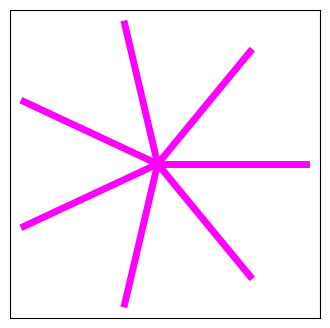

-------------
Index i = 1
Performance:  217000


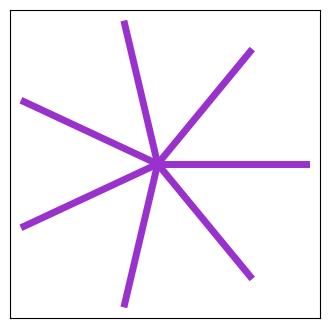

-------------
Index i = 2
Performance:  217000


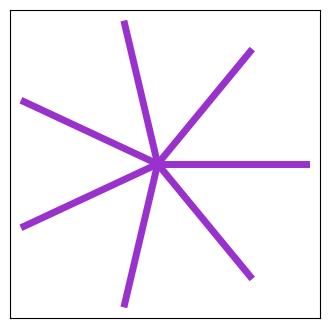

-------------
Index i = 3
Performance:  217000


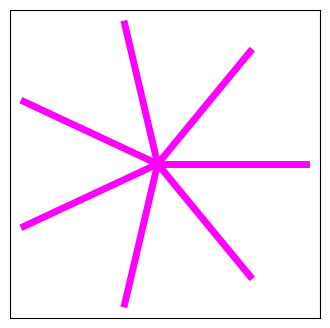

-------------
Index i = 4
Performance:  217000


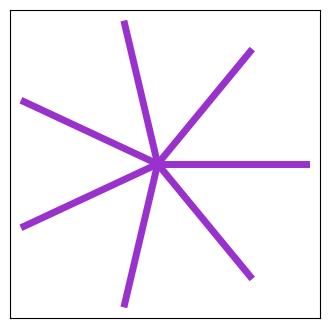

-------------
Index i = 5
Performance:  217000


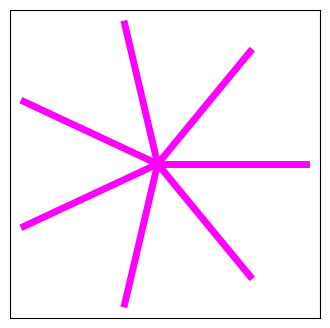

-------------
Index i = 6
Performance:  233799


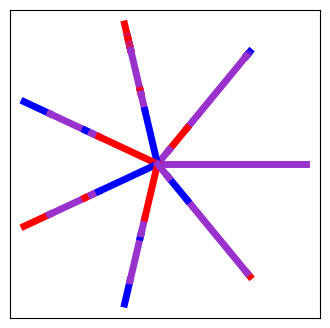

-------------
Index i = 7
Performance:  232995


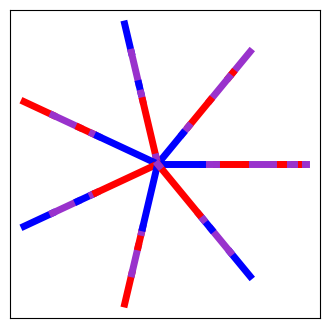

-------------
Index i = 8
Performance:  217000


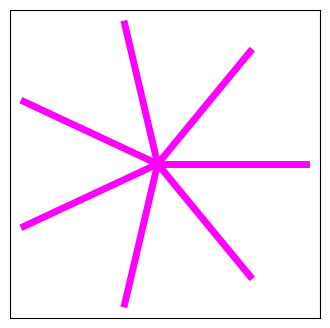

-------------
Index i = 9
Performance:  217000


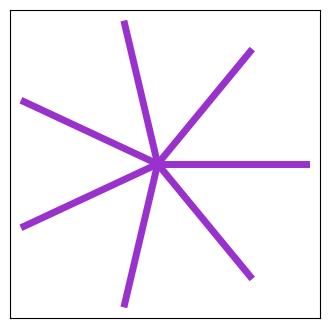

-------------
Index i = 10
Performance:  217000


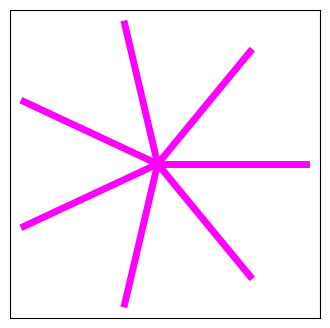

-------------
Index i = 11
Performance:  217000


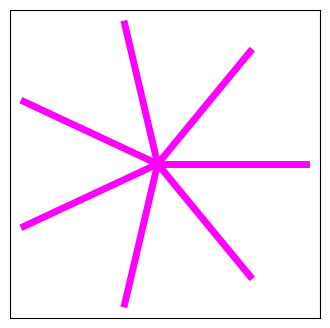

-------------
Index i = 12
Performance:  217000


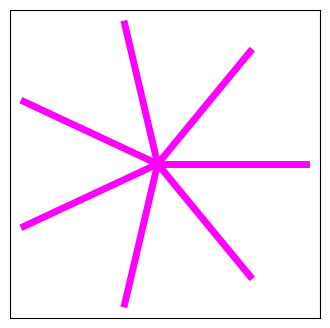

-------------
Index i = 13
Performance:  217000


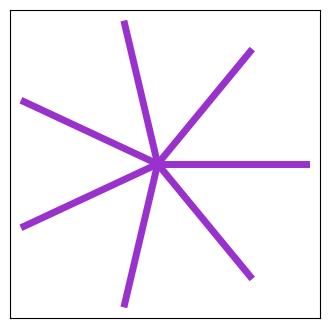

-------------
Index i = 14
Performance:  217000


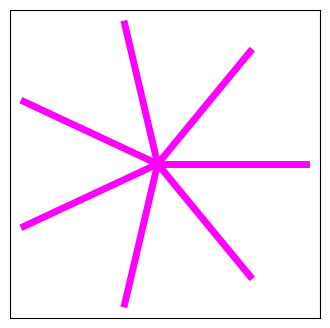

-------------
Index i = 15
Performance:  217000


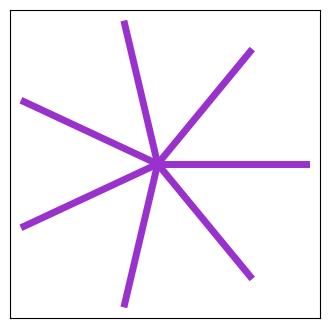

-------------
Index i = 16
Performance:  217000


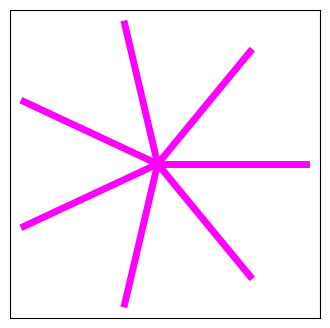

-------------
Index i = 17
Performance:  217000


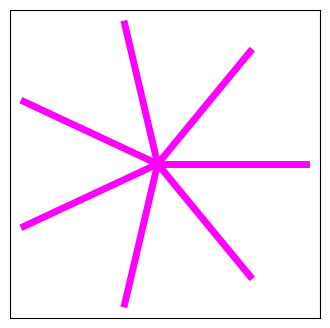

-------------
Index i = 18
Performance:  217000


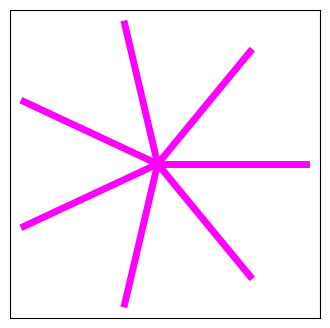

-------------
Index i = 19
Performance:  217000


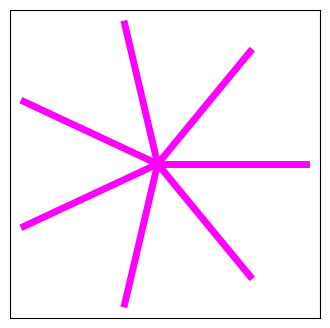

-------------
Index i = 20
Performance:  217000


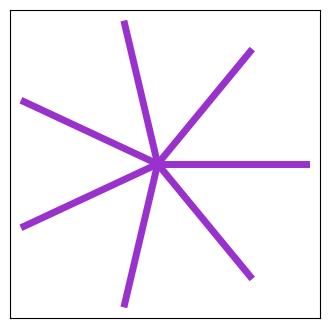

-------------
Index i = 21
Performance:  217000


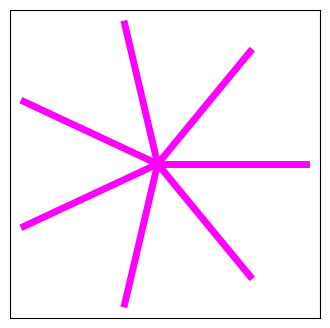

-------------
Index i = 22
Performance:  217000


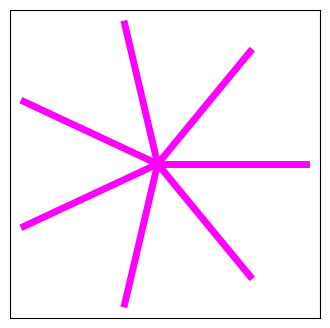

-------------
Index i = 23
Performance:  217000


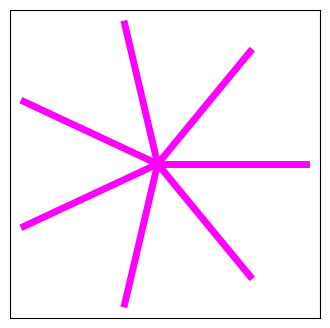

-------------
Index i = 24
Performance:  217000


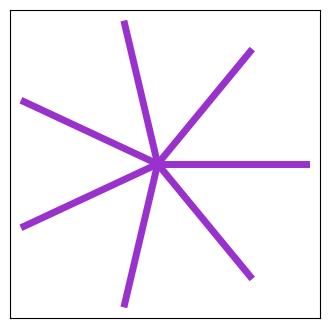

-------------
Index i = 25
Performance:  217000


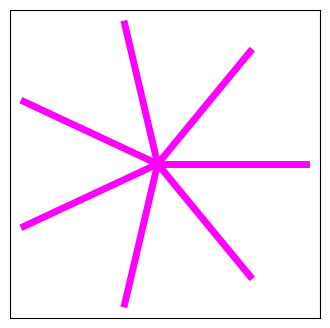

-------------
Index i = 26
Performance:  217000


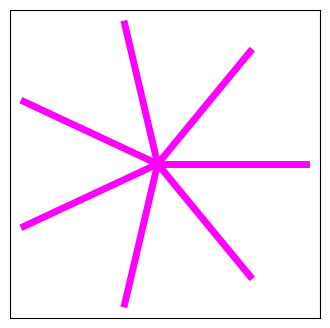

-------------
Index i = 27
Performance:  233822


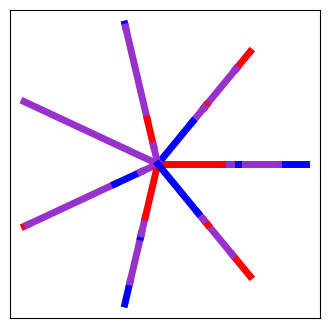

-------------
Index i = 28
Performance:  217000


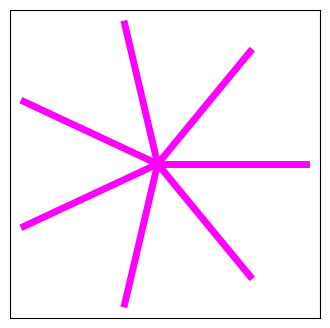

-------------
Index i = 29
Performance:  233003


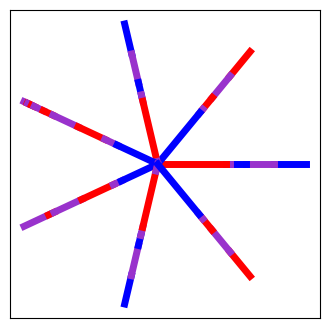

-------------
Index i = 30
Performance:  232995


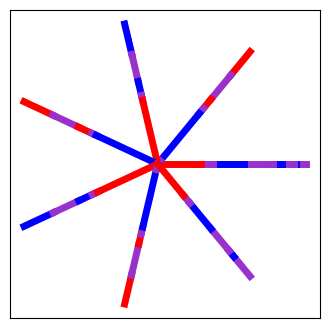

-------------
Index i = 31
Performance:  233822


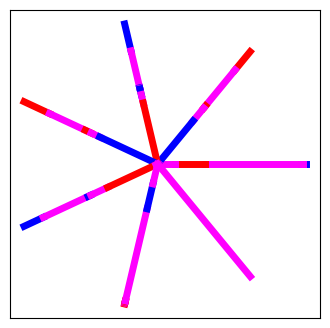

-------------
Index i = 32
Performance:  217000


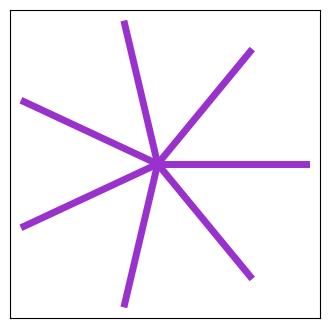

-------------
Index i = 33
Performance:  217000


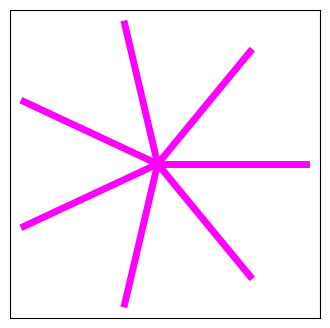

-------------
Index i = 34
Performance:  217000


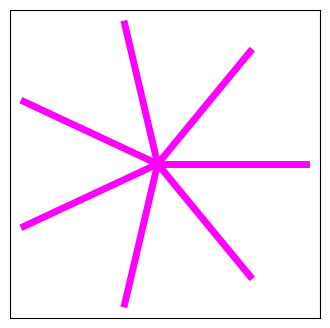

-------------
Index i = 35
Performance:  217000


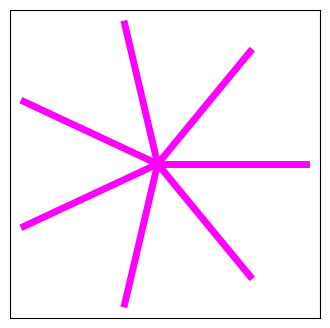

-------------
Index i = 36
Performance:  217000


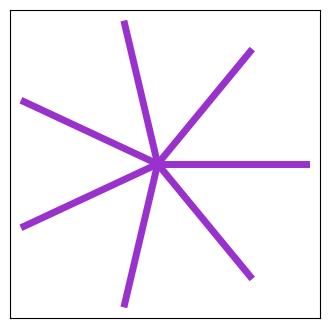

-------------
Index i = 37
Performance:  217000


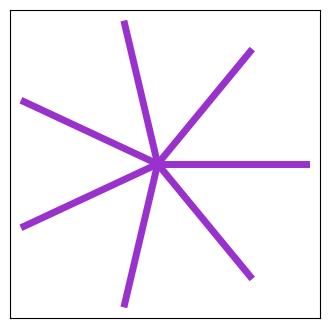

-------------
Index i = 38
Performance:  217000


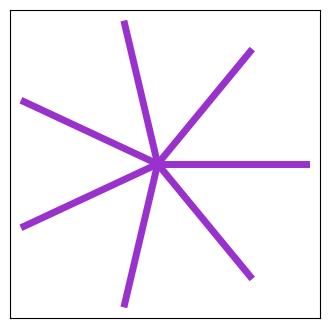

-------------
Index i = 39
Performance:  217000


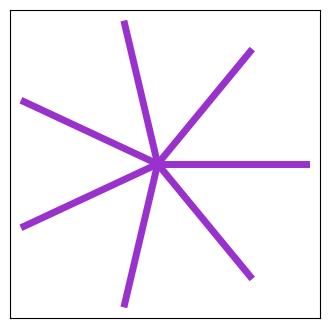

-------------
Index i = 40
Performance:  233017


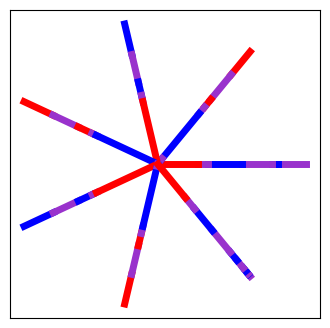

-------------
Index i = 41
Performance:  217000


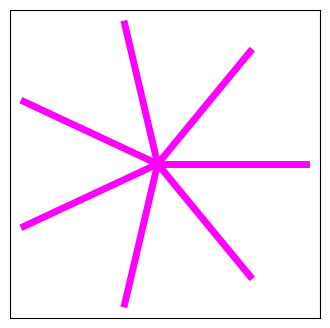

-------------
Index i = 42
Performance:  217000


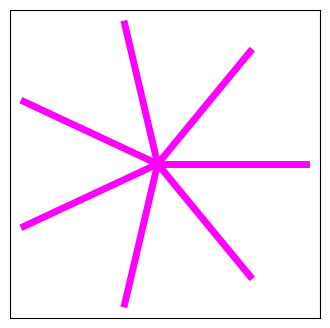

-------------
Index i = 43
Performance:  217000


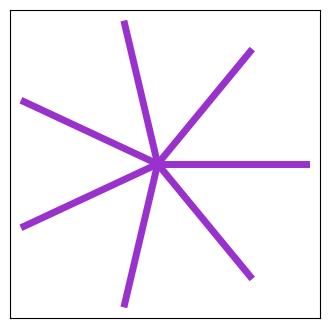

-------------
Index i = 44
Performance:  217000


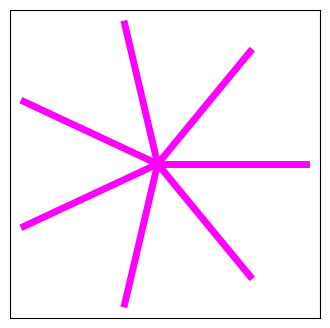

-------------
Index i = 45
Performance:  217000


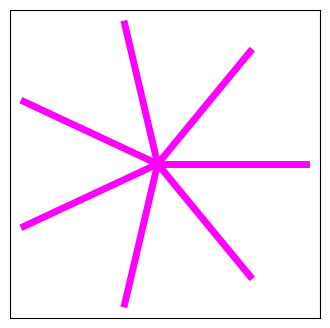

-------------
Index i = 46
Performance:  233794


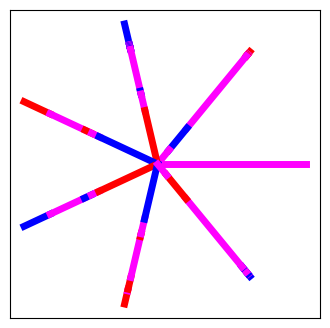

-------------
Index i = 47
Performance:  217000


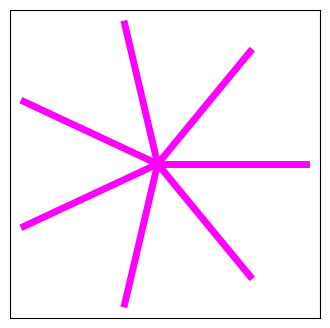

-------------
Index i = 48
Performance:  217000


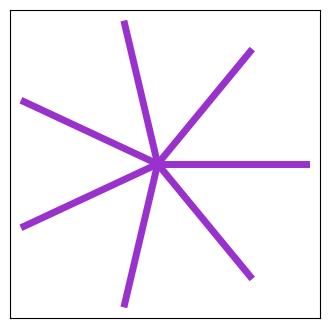

-------------
Index i = 49
Performance:  217000


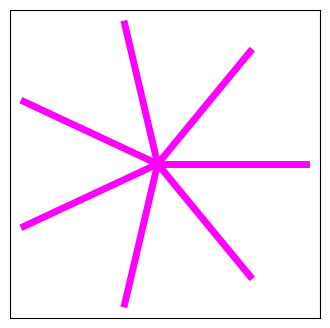

-------------
Index i = 50
Performance:  217000


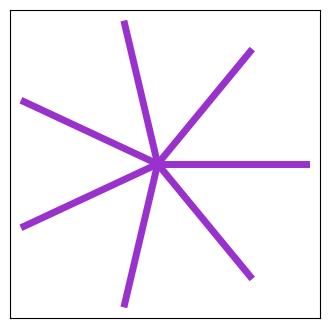

-------------
Index i = 51
Performance:  233013


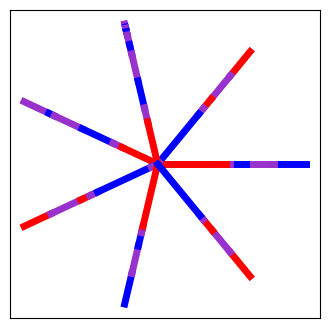

-------------
Index i = 52
Performance:  217000


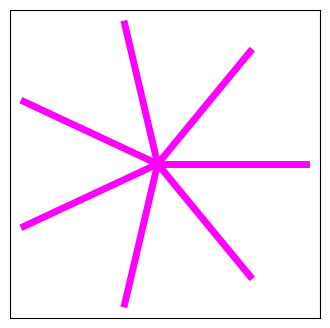

-------------
Index i = 53
Performance:  232996


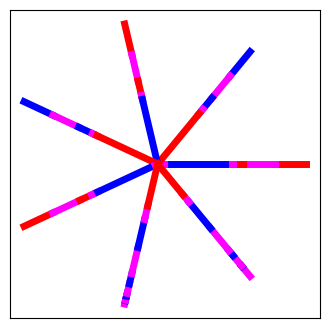

-------------
Index i = 54
Performance:  217000


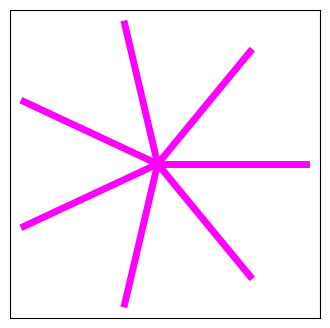

-------------
Index i = 55
Performance:  217000


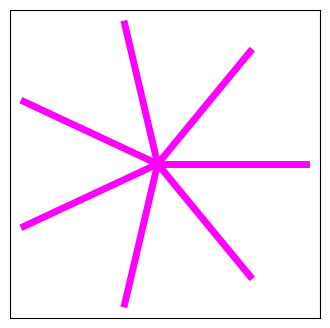

-------------
Index i = 56
Performance:  233819


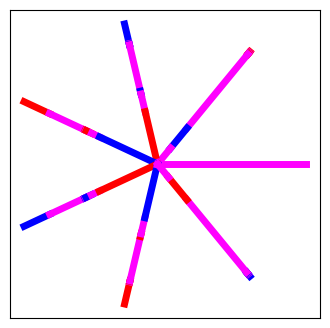

-------------
Index i = 57
Performance:  217000


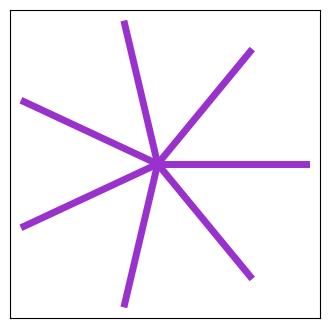

-------------
Index i = 58
Performance:  217000


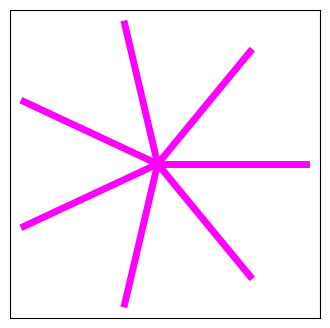

-------------
Index i = 59
Performance:  217000


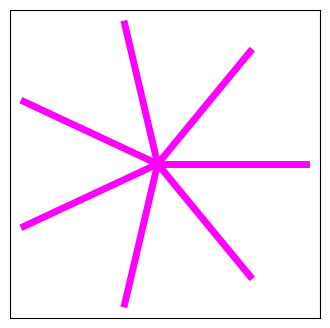

-------------
Index i = 60
Performance:  217000


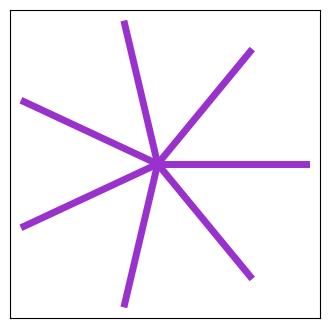

-------------
Index i = 61
Performance:  233786


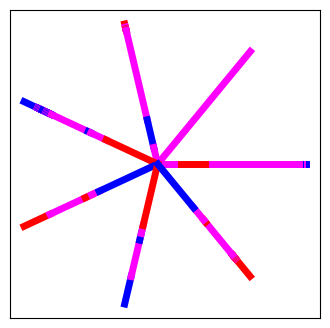

-------------
Index i = 62
Performance:  217000


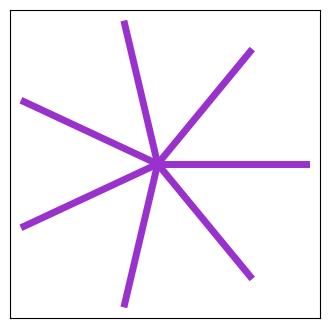

-------------
Index i = 63
Performance:  233000


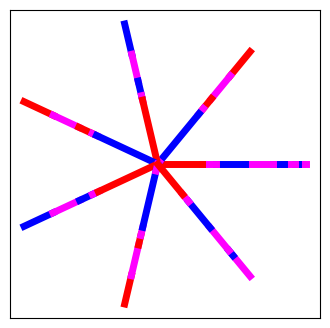

-------------
Index i = 64
Performance:  232994


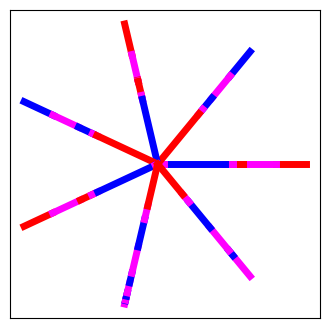

-------------
Index i = 65
Performance:  233784


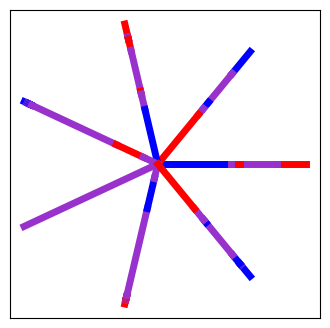

-------------
Index i = 66
Performance:  217000


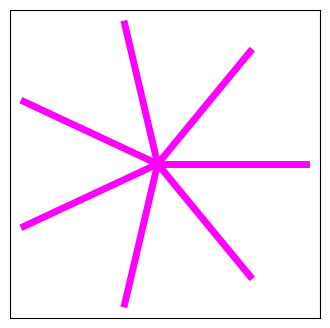

-------------
Index i = 67
Performance:  217000


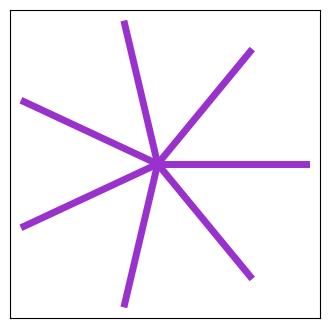

-------------
Index i = 68
Performance:  233803


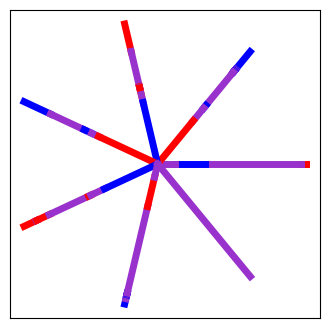

-------------
Index i = 69
Performance:  217000


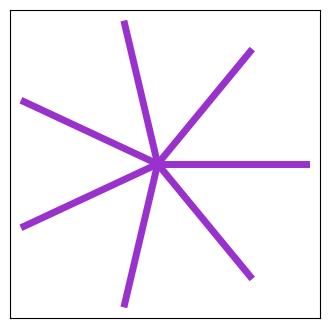

-------------
Index i = 70
Performance:  217000


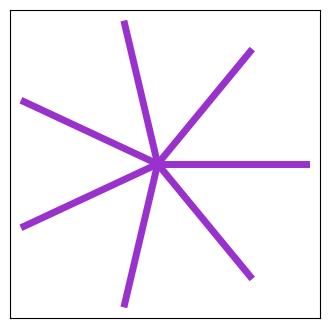

-------------
Index i = 71
Performance:  217000


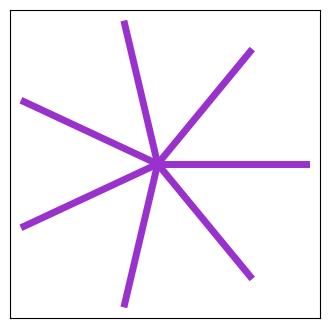

-------------
Index i = 72
Performance:  232991


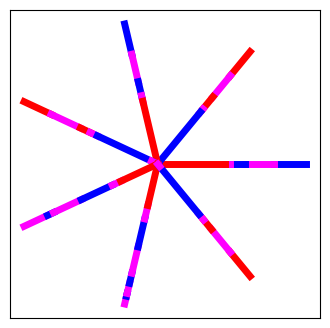

-------------
Index i = 73
Performance:  217000


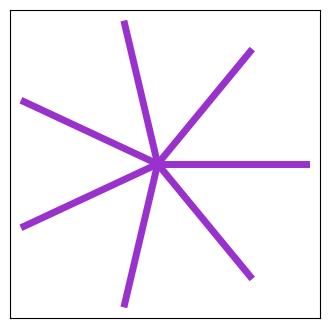

-------------
Index i = 74
Performance:  217000


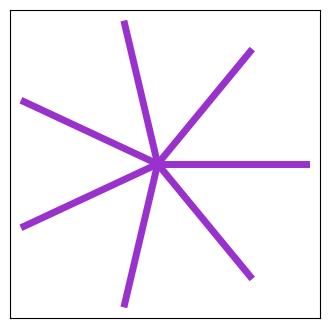

-------------
Index i = 75
Performance:  217000


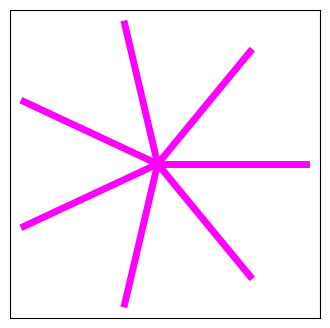

-------------
Index i = 76
Performance:  217000


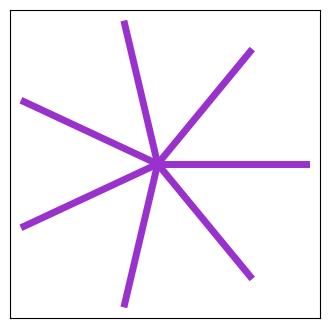

-------------
Index i = 77
Performance:  233003


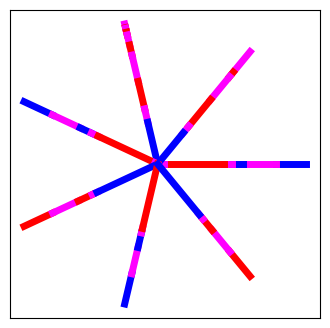

-------------
Index i = 78
Performance:  217000


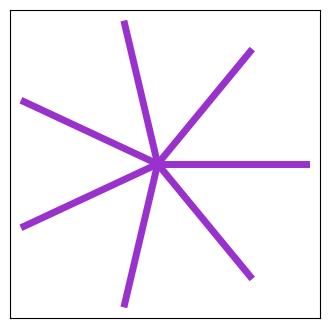

-------------
Index i = 79
Performance:  217000


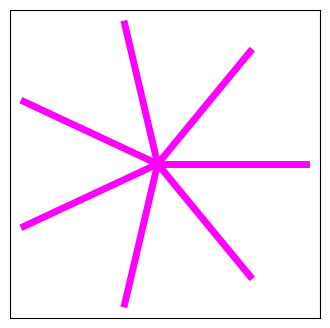

-------------
Index i = 80
Performance:  217000


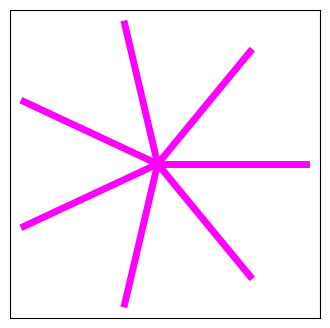

-------------
Index i = 81
Performance:  217000


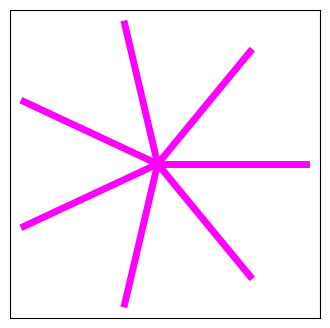

-------------
Index i = 82
Performance:  217000


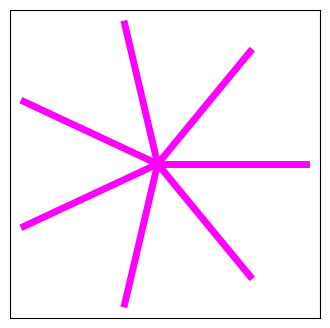

-------------
Index i = 83
Performance:  217000


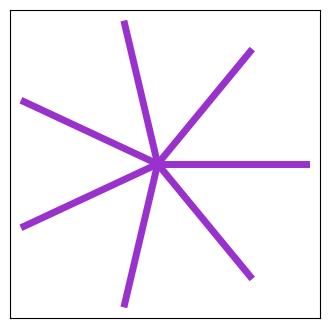

-------------
Index i = 84
Performance:  217000


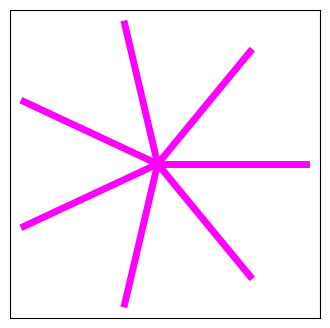

-------------
Index i = 85
Performance:  217000


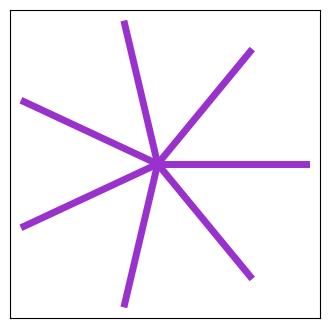

-------------
Index i = 86
Performance:  217000


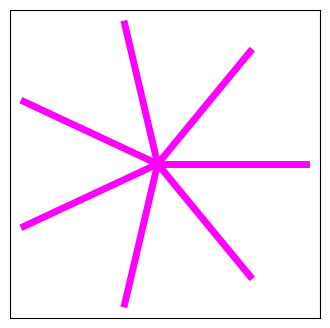

-------------
Index i = 87
Performance:  217000


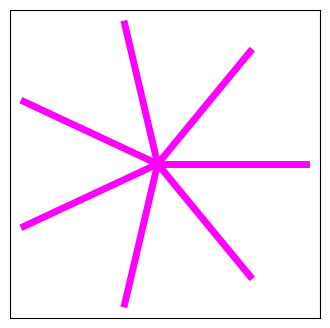

-------------
Index i = 88
Performance:  232988


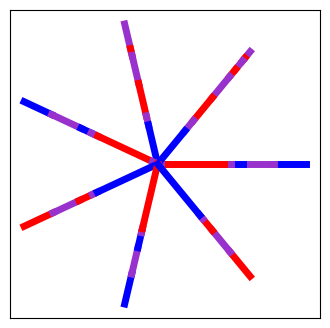

-------------
Index i = 89
Performance:  217000


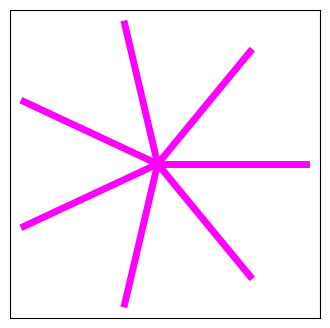

-------------
Index i = 90
Performance:  217000


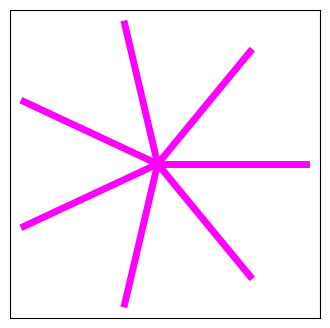

-------------
Index i = 91
Performance:  217000


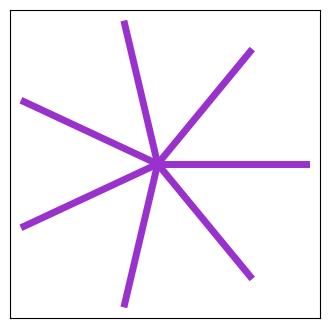

-------------
Index i = 92
Performance:  217000


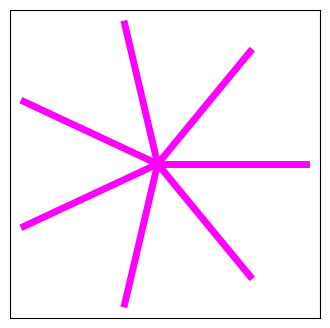

-------------
Index i = 93
Performance:  217000


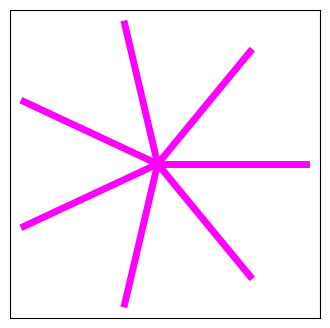

-------------
Index i = 94
Performance:  217000


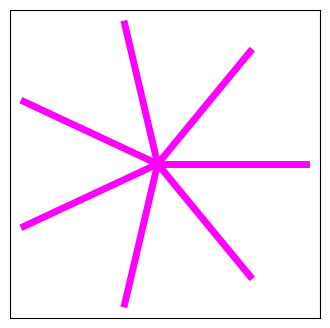

-------------
Index i = 95
Performance:  217000


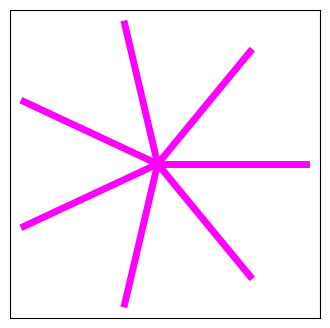

-------------
Index i = 96
Performance:  217000


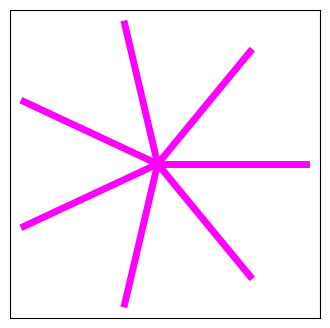

-------------
Index i = 97
Performance:  217000


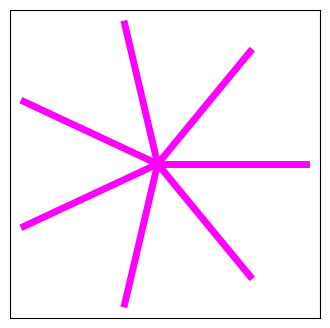

-------------
Index i = 98
Performance:  217000


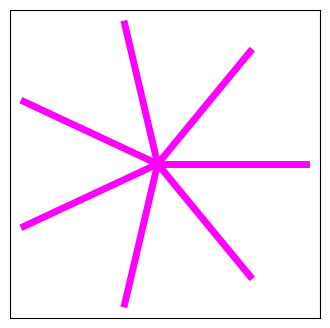

-------------
Index i = 99
Performance:  233792


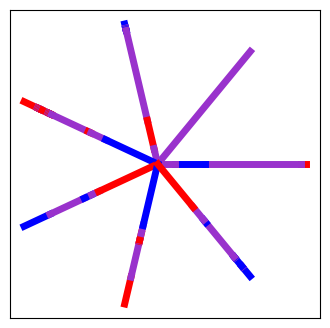

-------------


In [76]:
#Optimal colorings for k-star where k = 7 and n = 500 considering adjacent pairs of arms

np.random.seed(301)
random.seed(902)

colorings_kstar_adj_k7_n500 = []

for i in range(100):
    print('Index i =', i)
    colorings_kstar_adj_k7_n500 += [optimize_coloring('S', 'adj', random_kcoloring(7, 500), random_ordering(500))]
    print('-------------')

In [56]:
#Optimal colorings for k-star where k = 7 and n = 500 considering adjacent pairs of arms

buckets_for_kstar_adj_k7_n500 = [colorings_kstar_adj_k7_n500[0], colorings_kstar_adj_k7_n500[88], colorings_kstar_adj_k7_n500[72], colorings_kstar_adj_k7_n500[64], colorings_kstar_adj_k7_n500[7], colorings_kstar_adj_k7_n500[63], colorings_kstar_adj_k7_n500[29], colorings_kstar_adj_k7_n500[51], colorings_kstar_adj_k7_n500[40], colorings_kstar_adj_k7_n500[65], colorings_kstar_adj_k7_n500[61], colorings_kstar_adj_k7_n500[46], colorings_kstar_adj_k7_n500[68], colorings_kstar_adj_k7_n500[27], colorings_kstar_adj_k7_n500[77]]

compare_list_to_target(colorings_kstar_adj_k7_n500, buckets_for_kstar_adj_k7_n500, 'adj')

Index i =  0
Bucket ID: Alternating
Number of Progressions: 217000
Percent difference:  0.0 %
----------------
Index i =  1
Bucket ID: Alternating
Number of Progressions: 217000
Percent difference:  0.0 %
----------------
Index i =  2
Bucket ID: Alternating
Number of Progressions: 217000
Percent difference:  0.0 %
----------------
Index i =  3
Bucket ID: Alternating
Number of Progressions: 217000
Percent difference:  0.0 %
----------------
Index i =  4
Bucket ID: Alternating
Number of Progressions: 217000
Percent difference:  0.0 %
----------------
Index i =  5
Bucket ID: Alternating
Number of Progressions: 217000
Percent difference:  0.0 %
----------------
Index i =  6
Bucket ID:  11
Number of Progressions: 233799
Percent difference:  0.8571428571428572 %
----------------
Index i =  7
Bucket ID:  4
Number of Progressions: 232995
Percent difference:  0.0 %
----------------
Index i =  8
Bucket ID: Alternating
Number of Progressions: 217000
Percent difference:  0.0 %
----------------
Ind

Index i = 0
Performance:  871500


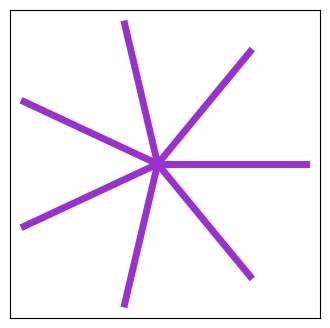

-------------
Index i = 1
Performance:  871500


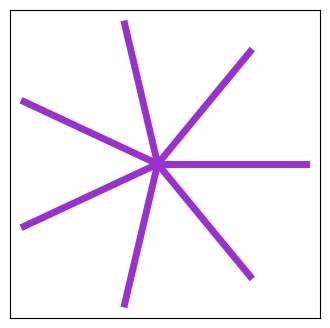

-------------
Index i = 2
Performance:  871500


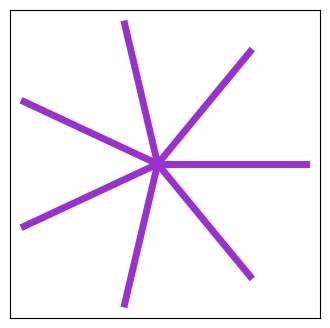

-------------
Index i = 3
Performance:  871500


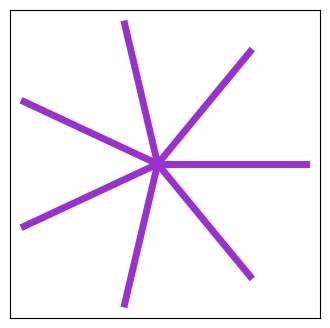

-------------
Index i = 4
Performance:  871500


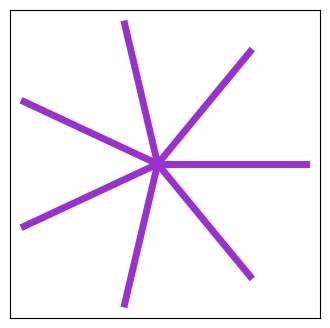

-------------
Index i = 5
Performance:  871500


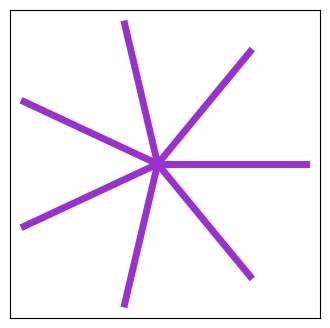

-------------
Index i = 6
Performance:  871500


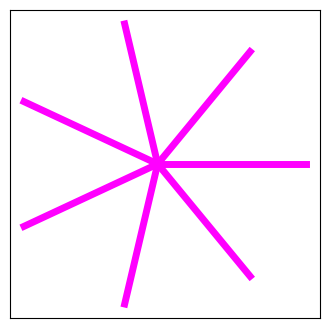

-------------
Index i = 7
Performance:  871500


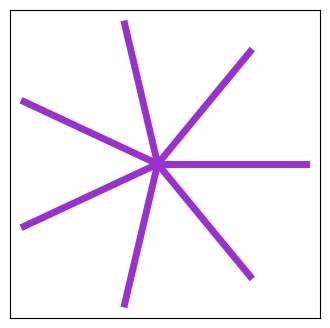

-------------
Index i = 8
Performance:  871500


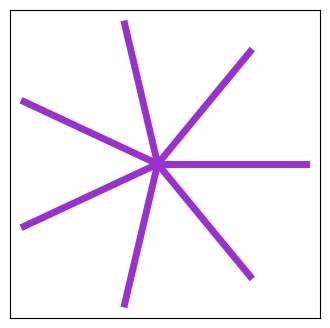

-------------
Index i = 9
Performance:  871500


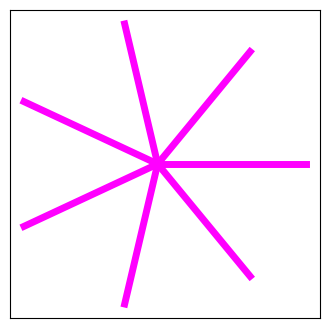

-------------
Index i = 10
Performance:  871500


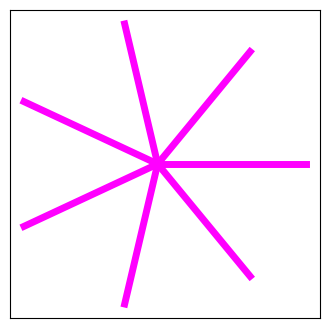

-------------
Index i = 11
Performance:  871500


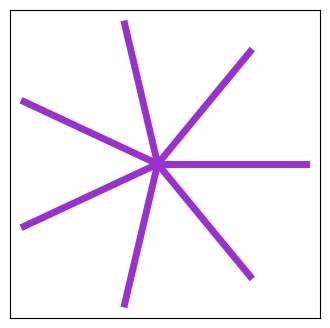

-------------
Index i = 12
Performance:  871500


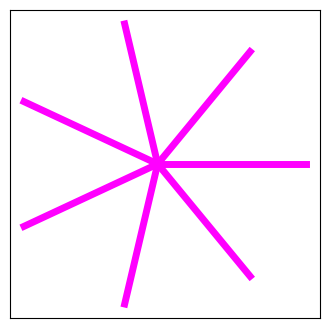

-------------
Index i = 13
Performance:  871500


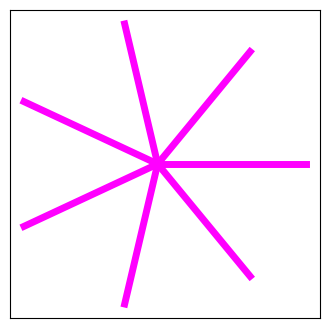

-------------
Index i = 14
Performance:  938677


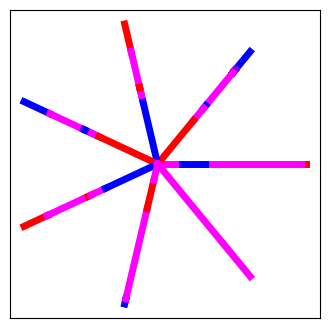

-------------
Index i = 15
Performance:  871500


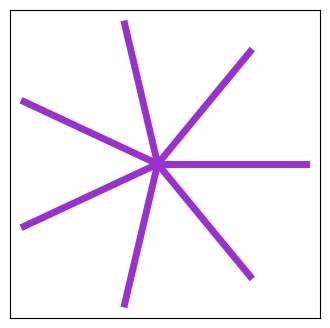

-------------
Index i = 16
Performance:  871500


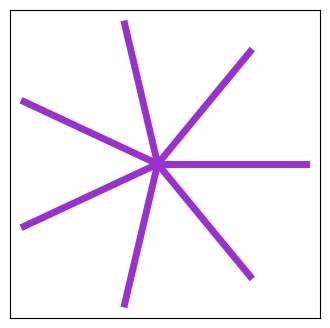

-------------
Index i = 17
Performance:  871500


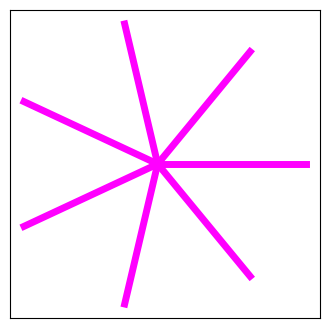

-------------
Index i = 18
Performance:  871500


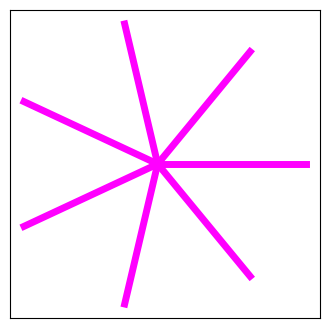

-------------
Index i = 19
Performance:  871500


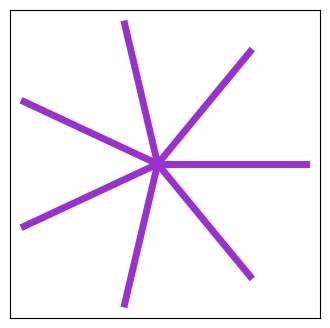

-------------
Index i = 20
Performance:  871500


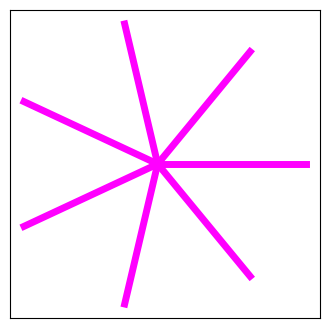

-------------
Index i = 21
Performance:  871500


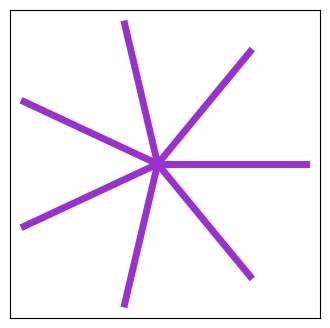

-------------
Index i = 22
Performance:  871500


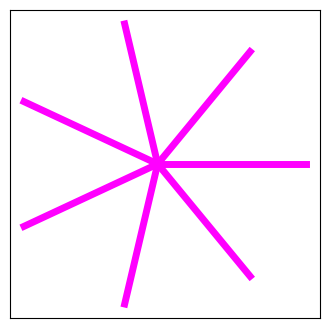

-------------
Index i = 23
Performance:  871500


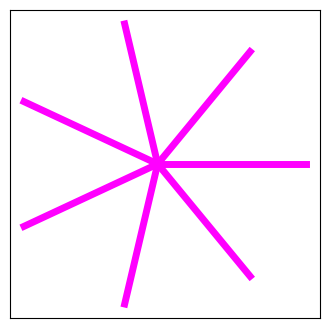

-------------
Index i = 24
Performance:  871500


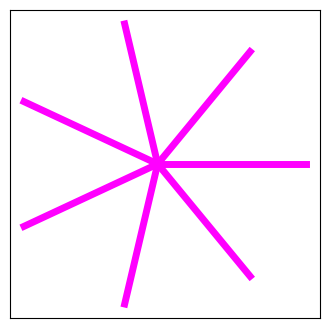

-------------
Index i = 25
Performance:  935420


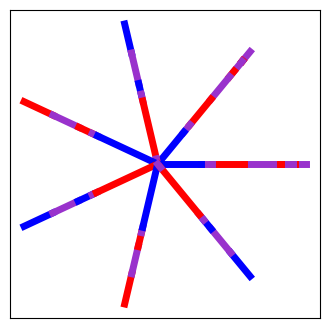

-------------
Index i = 26
Performance:  871500


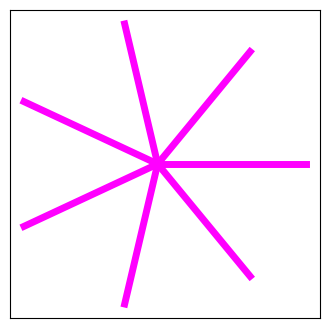

-------------
Index i = 27
Performance:  871500


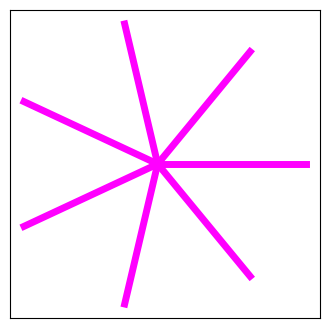

-------------
Index i = 28
Performance:  938665


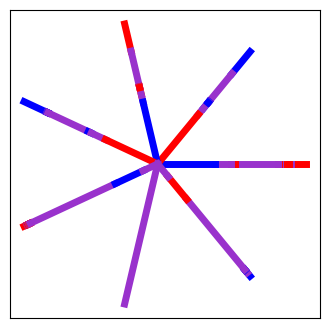

-------------
Index i = 29
Performance:  871500


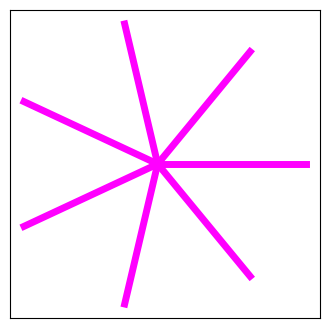

-------------
Index i = 30
Performance:  871500


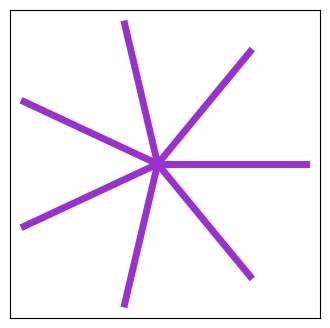

-------------
Index i = 31
Performance:  871500


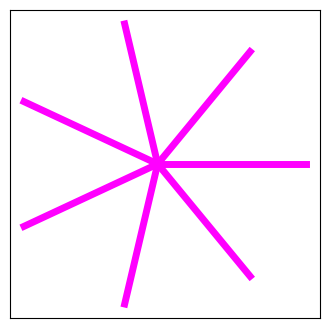

-------------
Index i = 32
Performance:  935443


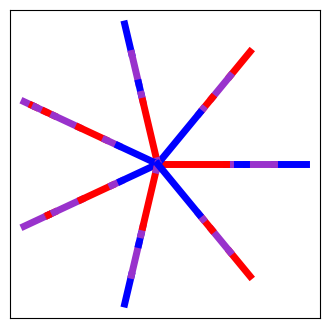

-------------
Index i = 33
Performance:  871500


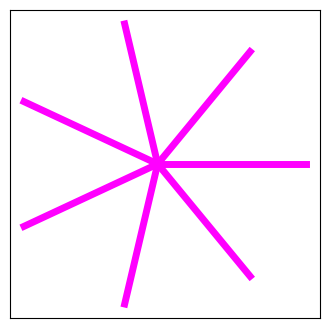

-------------
Index i = 34
Performance:  871500


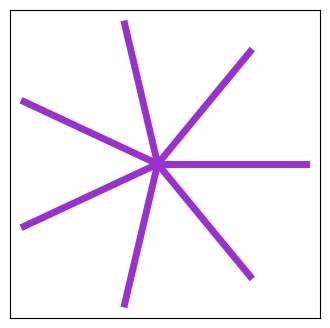

-------------
Index i = 35
Performance:  871500


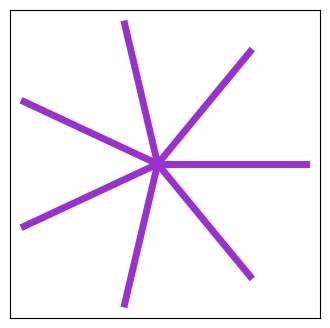

-------------
Index i = 36
Performance:  871500


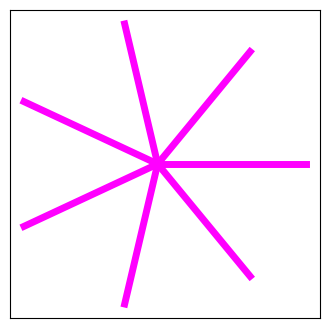

-------------
Index i = 37
Performance:  871500


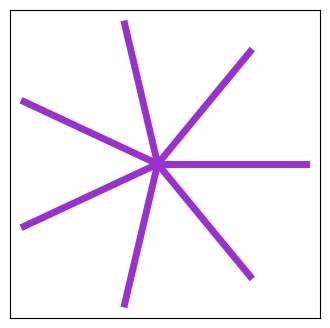

-------------
Index i = 38
Performance:  871500


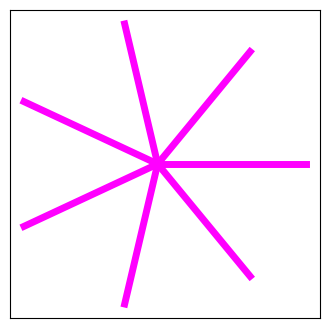

-------------
Index i = 39
Performance:  871500


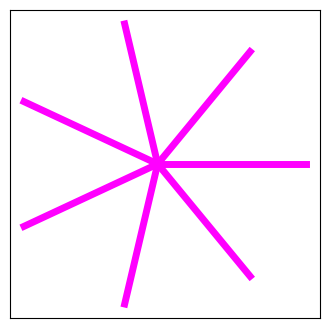

-------------
Index i = 40
Performance:  871500


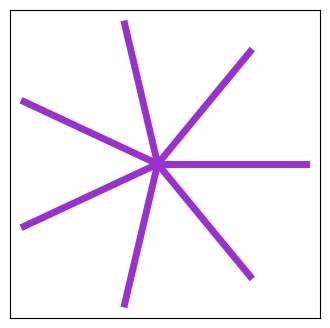

-------------
Index i = 41
Performance:  938673


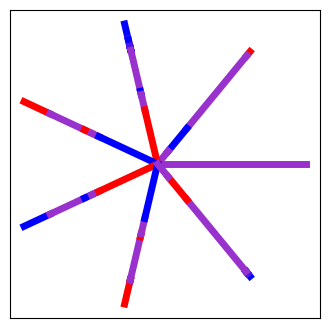

-------------
Index i = 42
Performance:  871500


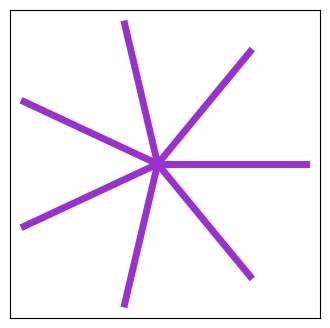

-------------
Index i = 43
Performance:  871500


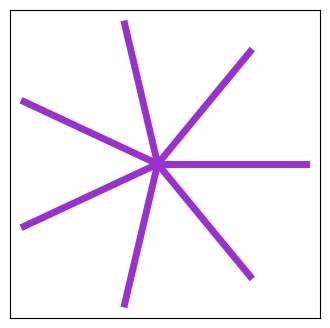

-------------
Index i = 44
Performance:  871500


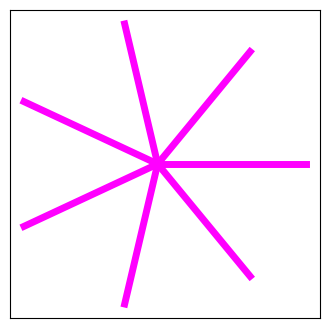

-------------
Index i = 45
Performance:  871500


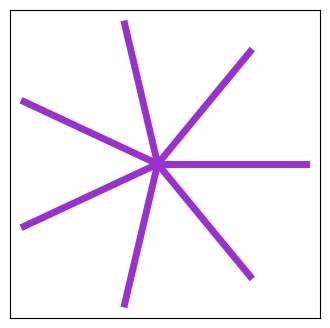

-------------
Index i = 46
Performance:  871500


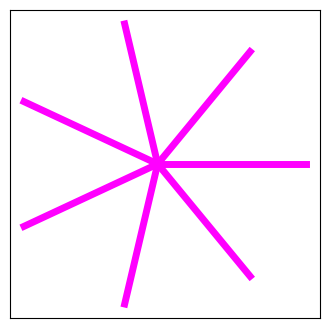

-------------
Index i = 47
Performance:  871500


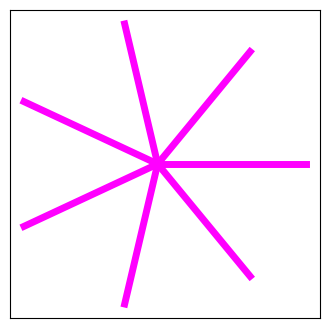

-------------
Index i = 48
Performance:  940368


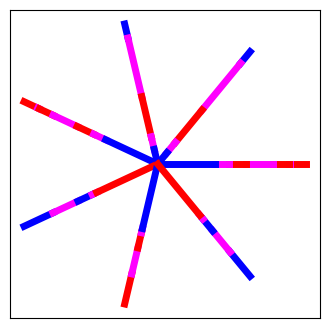

-------------
Index i = 49
Performance:  871500


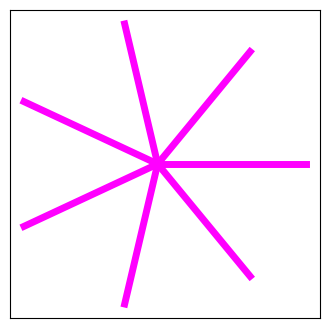

-------------
Index i = 50
Performance:  935470


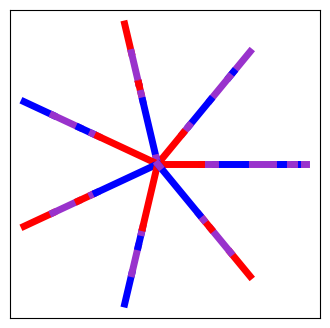

-------------
Index i = 51
Performance:  871500


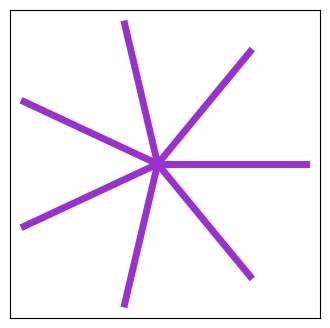

-------------
Index i = 52
Performance:  871500


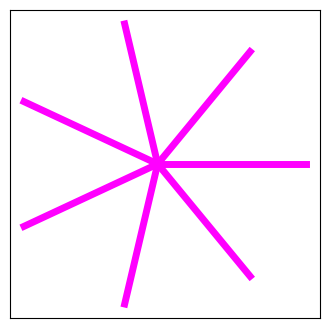

-------------
Index i = 53
Performance:  871500


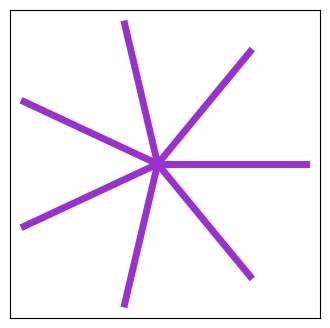

-------------
Index i = 54
Performance:  871500


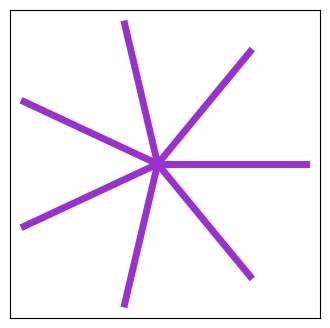

-------------
Index i = 55
Performance:  871500


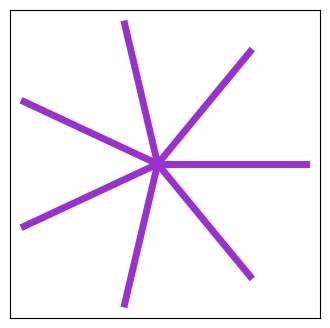

-------------
Index i = 56
Performance:  938669


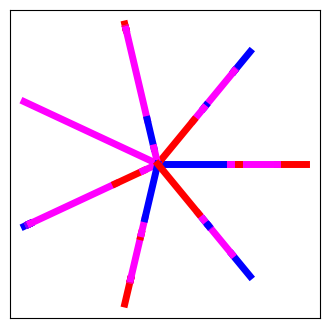

-------------
Index i = 57
Performance:  935448


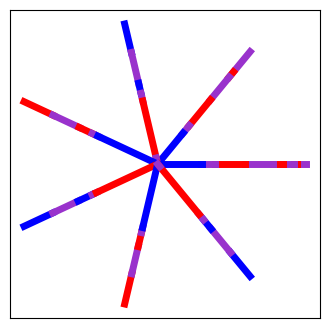

-------------
Index i = 58
Performance:  871500


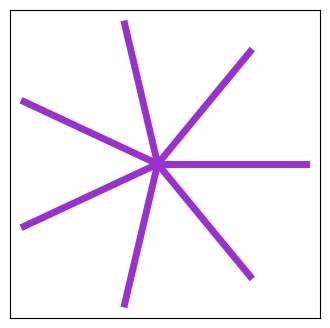

-------------
Index i = 59
Performance:  871500


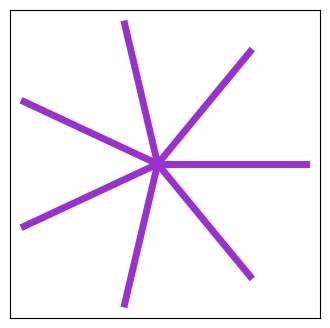

-------------
Index i = 60
Performance:  871500


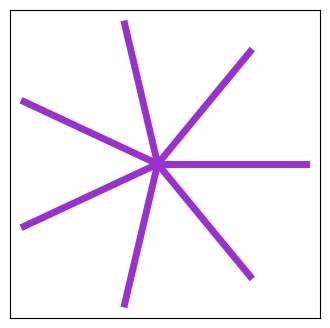

-------------
Index i = 61
Performance:  871500


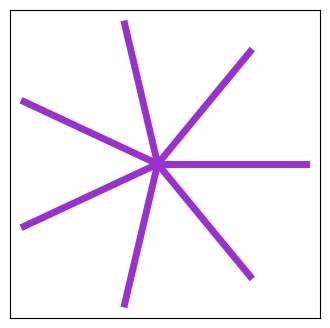

-------------
Index i = 62
Performance:  871500


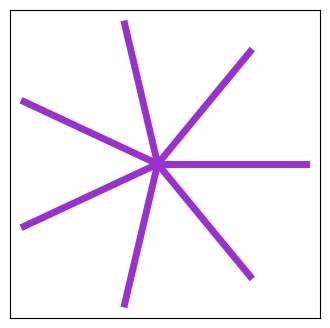

-------------
Index i = 63
Performance:  871500


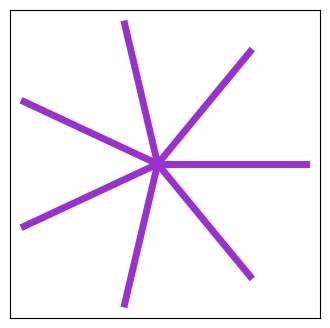

-------------
Index i = 64
Performance:  871500


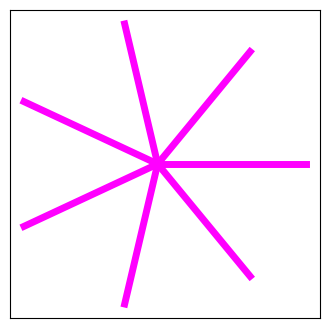

-------------
Index i = 65
Performance:  871500


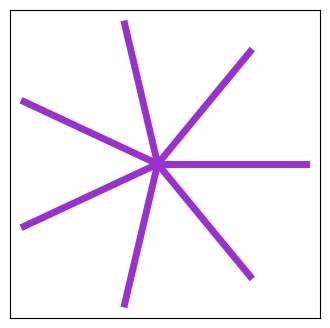

-------------
Index i = 66
Performance:  871500


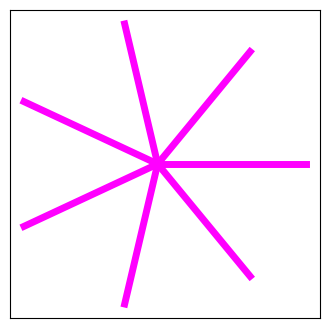

-------------
Index i = 67
Performance:  871500


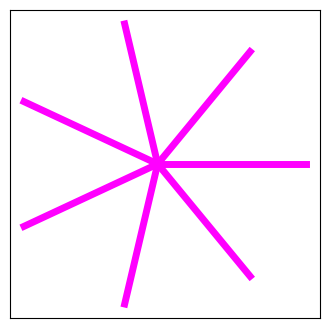

-------------
Index i = 68
Performance:  935447


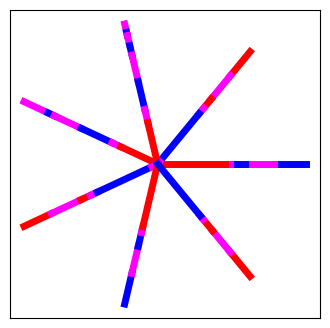

-------------
Index i = 69
Performance:  871500


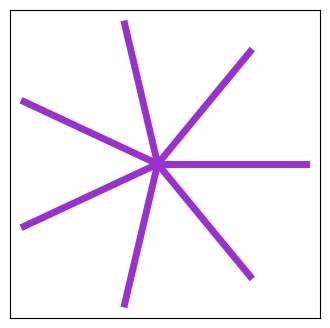

-------------
Index i = 70
Performance:  871500


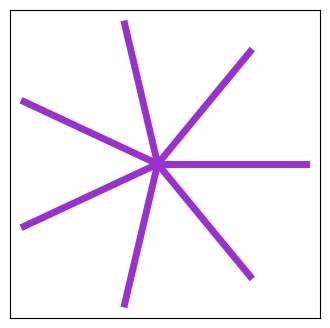

-------------
Index i = 71
Performance:  871500


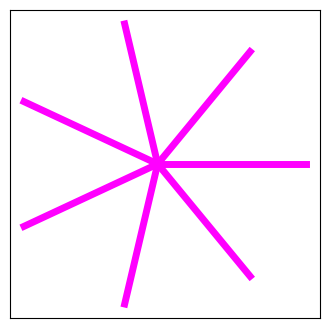

-------------
Index i = 72
Performance:  871500


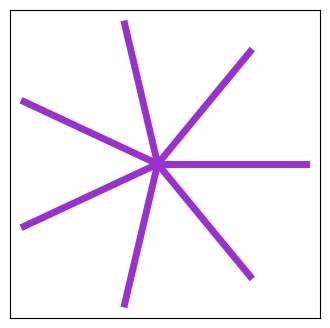

-------------
Index i = 73
Performance:  871500


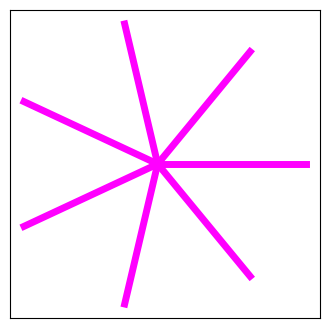

-------------
Index i = 74
Performance:  871500


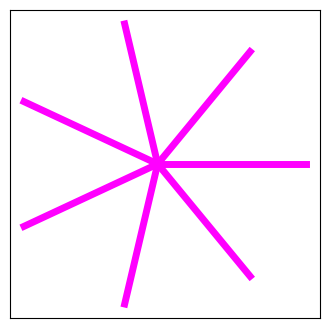

-------------
Index i = 75
Performance:  871500


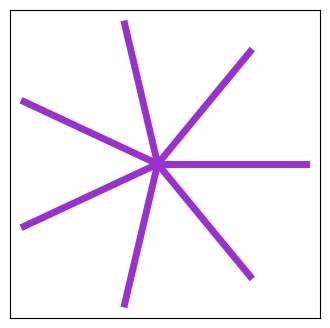

-------------
Index i = 76
Performance:  871500


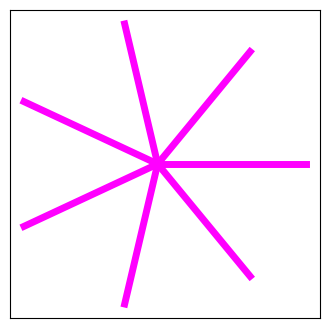

-------------
Index i = 77
Performance:  871500


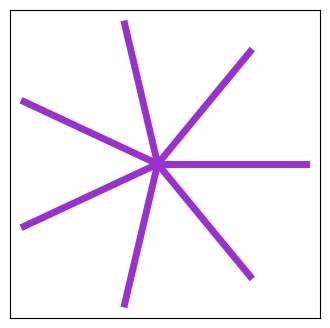

-------------
Index i = 78
Performance:  871500


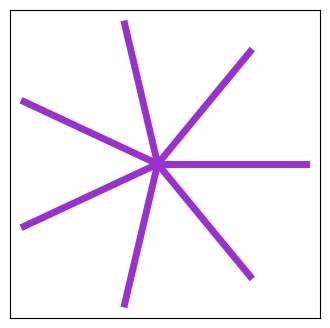

-------------
Index i = 79
Performance:  871500


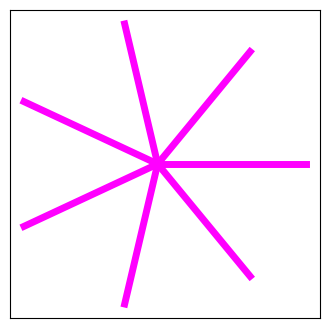

-------------
Index i = 80
Performance:  871500


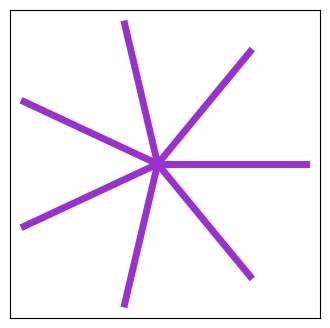

-------------
Index i = 81
Performance:  871500


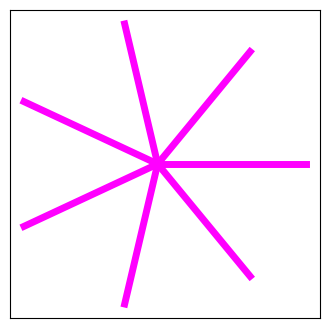

-------------
Index i = 82
Performance:  871500


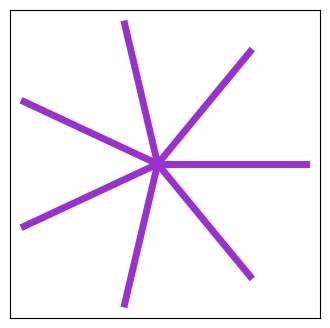

-------------
Index i = 83
Performance:  871500


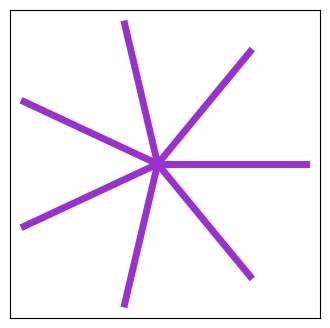

-------------
Index i = 84
Performance:  871500


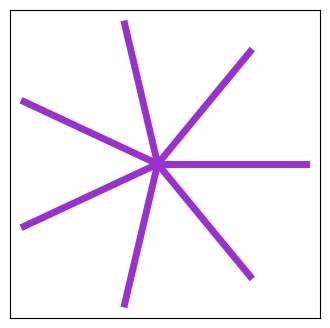

-------------
Index i = 85
Performance:  935442


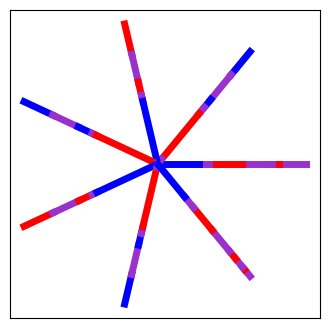

-------------
Index i = 86
Performance:  935457


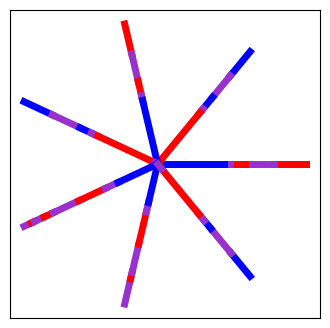

-------------
Index i = 87
Performance:  871500


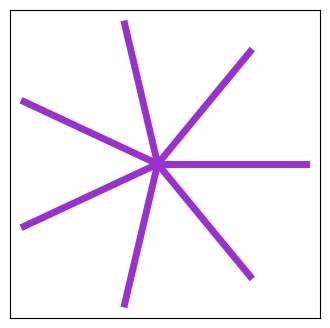

-------------
Index i = 88
Performance:  871500


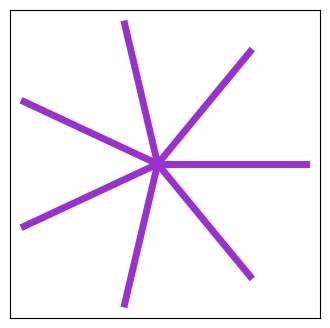

-------------
Index i = 89
Performance:  871500


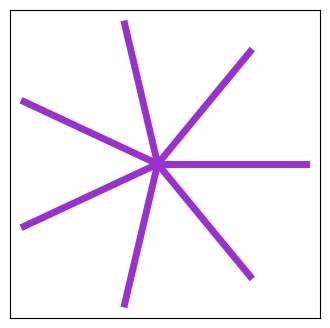

-------------
Index i = 90
Performance:  935439


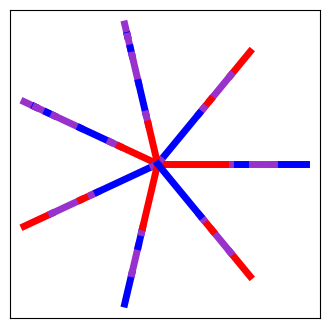

-------------
Index i = 91
Performance:  871500


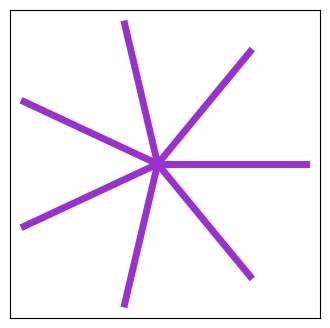

-------------
Index i = 92
Performance:  871500


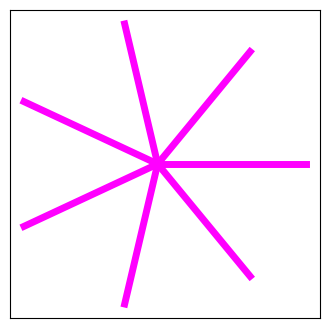

-------------
Index i = 93
Performance:  871500


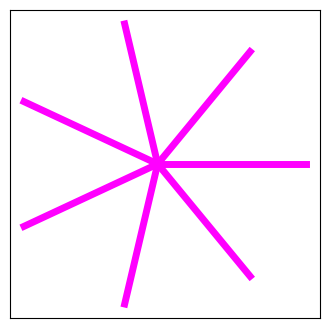

-------------
Index i = 94
Performance:  871500


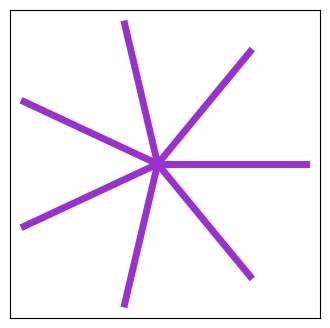

-------------
Index i = 95
Performance:  871500


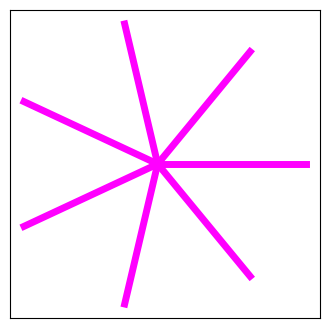

-------------
Index i = 96
Performance:  871500


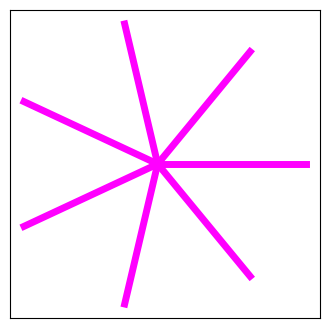

-------------
Index i = 97
Performance:  871500


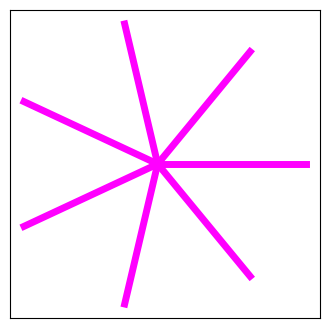

-------------
Index i = 98
Performance:  871500


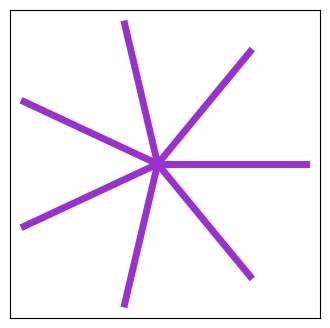

-------------
Index i = 99
Performance:  871500


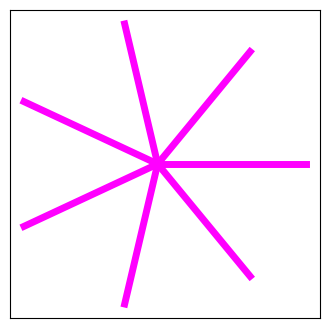

-------------


In [77]:
#Optimal colorings for k-star where k = 7 and n = 1000 considering adjacent pairs of arms

np.random.seed(124)
random.seed(491)

colorings_kstar_adj_k7_n1000 = []

for i in range(100):
    print('Index i =', i)
    colorings_kstar_adj_k7_n1000 += [optimize_coloring('S', 'adj', random_kcoloring(7, 1000), random_ordering(1000))]
    print('-------------')

In [98]:
#Optimal colorings for k-star where k = 7 and n = 1000 considering adjcent pairs of arms

buckets_for_kstar_adj_k7_n1000 = [colorings_kstar_adj_k7_n1000[0], colorings_kstar_adj_k7_n1000[25], colorings_kstar_adj_k7_n1000[90], colorings_kstar_adj_k7_n1000[85], colorings_kstar_adj_k7_n1000[32], colorings_kstar_adj_k7_n1000[86], colorings_kstar_adj_k7_n1000[28], colorings_kstar_adj_k7_n1000[56], colorings_kstar_adj_k7_n1000[41], colorings_kstar_adj_k7_n1000[14], colorings_kstar_adj_k7_n1000[48]]

compare_list_to_target(colorings_kstar_adj_k7_n1000, buckets_for_kstar_adj_k7_n1000, 'adj')

Index i =  0
Bucket ID: Alternating
Number of Progressions: 871500
Percent difference:  0.0 %
----------------
Index i =  1
Bucket ID: Alternating
Number of Progressions: 871500
Percent difference:  0.0 %
----------------
Index i =  2
Bucket ID: Alternating
Number of Progressions: 871500
Percent difference:  0.0 %
----------------
Index i =  3
Bucket ID: Alternating
Number of Progressions: 871500
Percent difference:  0.0 %
----------------
Index i =  4
Bucket ID: Alternating
Number of Progressions: 871500
Percent difference:  0.0 %
----------------
Index i =  5
Bucket ID: Alternating
Number of Progressions: 871500
Percent difference:  0.0 %
----------------
Index i =  6
Bucket ID: Alternating
Number of Progressions: 871500
Percent difference:  0.0 %
----------------
Index i =  7
Bucket ID: Alternating
Number of Progressions: 871500
Percent difference:  0.0 %
----------------
Index i =  8
Bucket ID: Alternating
Number of Progressions: 871500
Percent difference:  0.0 %
----------------
I

### k=8:

Index i = 0
Performance:  236523


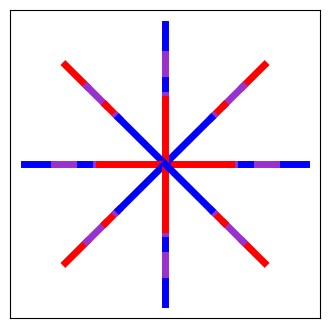

-------------
Index i = 1
Performance:  236523


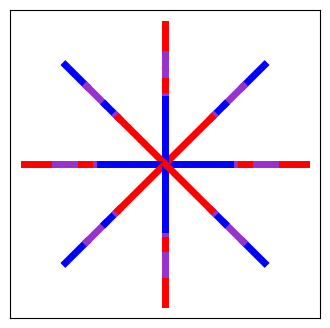

-------------
Index i = 2
Performance:  248000


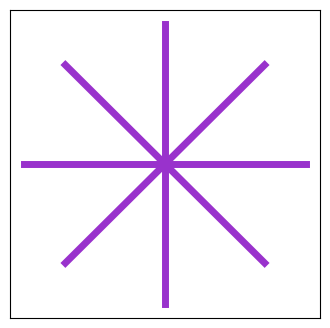

-------------
Index i = 3
Performance:  248000


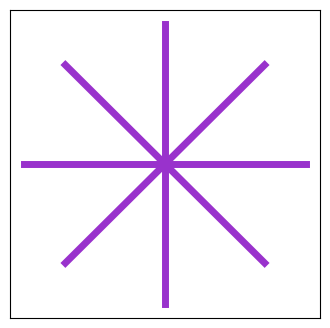

-------------
Index i = 4
Performance:  248000


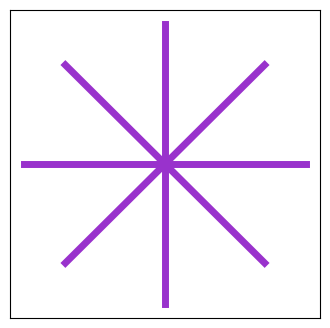

-------------
Index i = 5
Performance:  248000


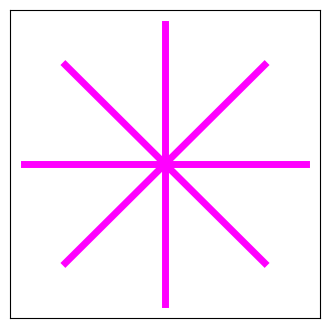

-------------
Index i = 6
Performance:  248000


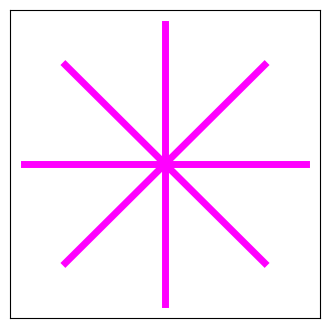

-------------
Index i = 7
Performance:  248000


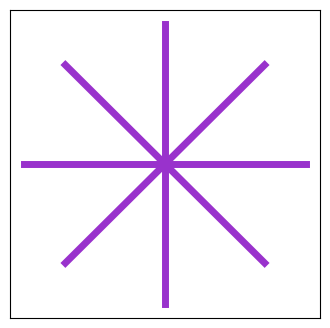

-------------
Index i = 8
Performance:  236520


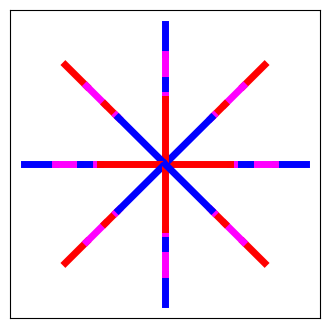

-------------
Index i = 9
Performance:  236522


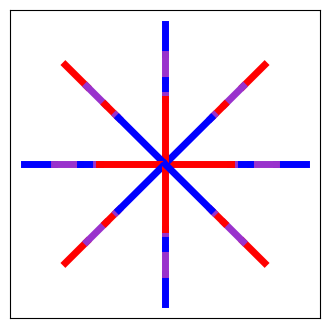

-------------
Index i = 10
Performance:  236520


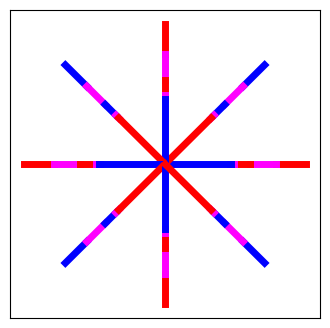

-------------
Index i = 11
Performance:  248000


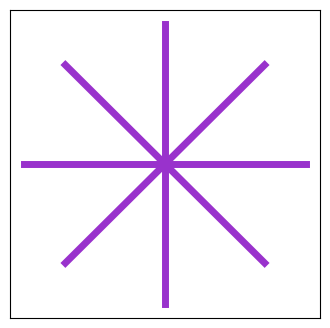

-------------
Index i = 12
Performance:  236523


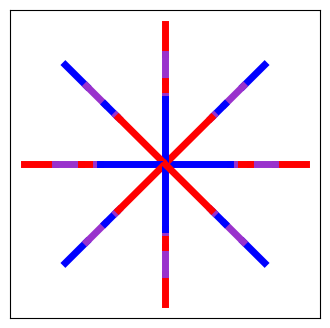

-------------
Index i = 13
Performance:  236520


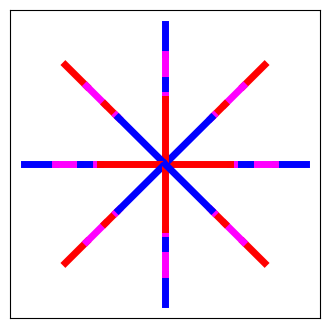

-------------
Index i = 14
Performance:  236524


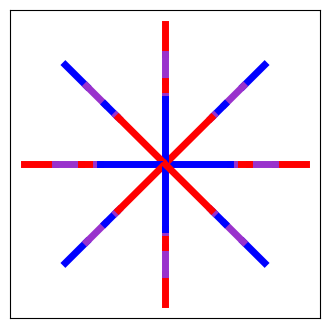

-------------
Index i = 15
Performance:  236520


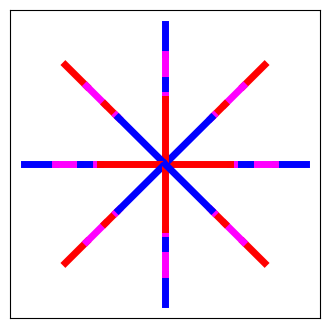

-------------
Index i = 16
Performance:  236521


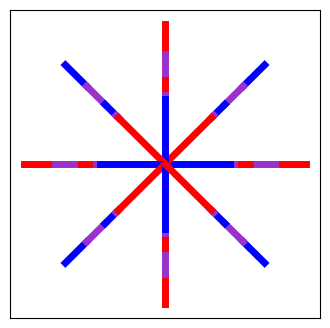

-------------
Index i = 17
Performance:  248000


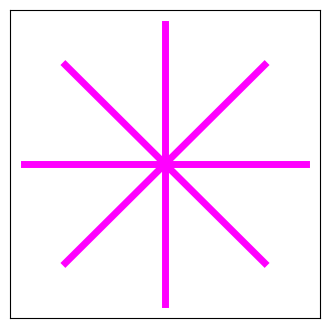

-------------
Index i = 18
Performance:  248000


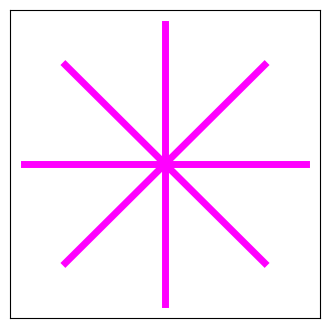

-------------
Index i = 19
Performance:  248000


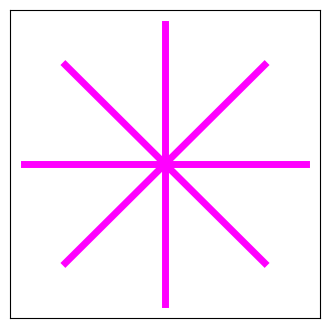

-------------
Index i = 20
Performance:  248000


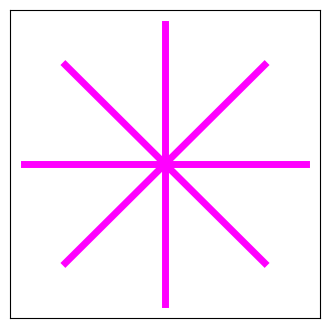

-------------
Index i = 21
Performance:  236520


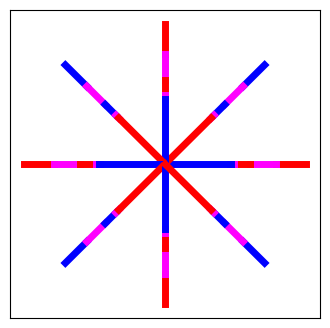

-------------
Index i = 22
Performance:  248000


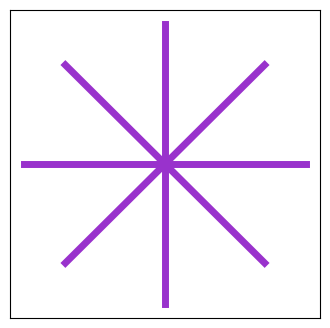

-------------
Index i = 23
Performance:  248000


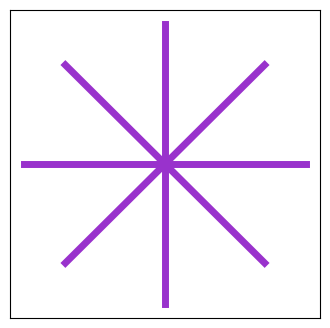

-------------
Index i = 24
Performance:  236520


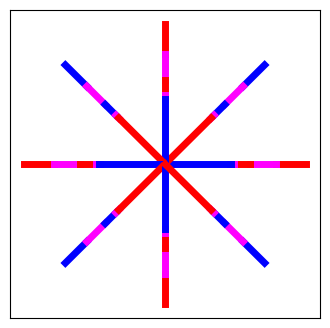

-------------
Index i = 25
Performance:  248000


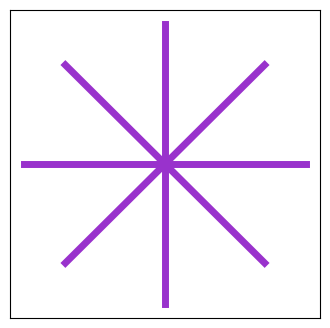

-------------
Index i = 26
Performance:  248000


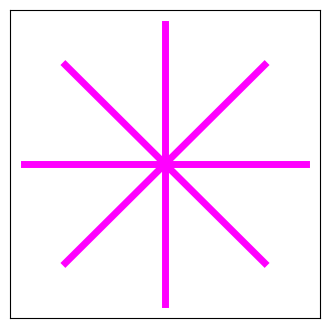

-------------
Index i = 27
Performance:  248000


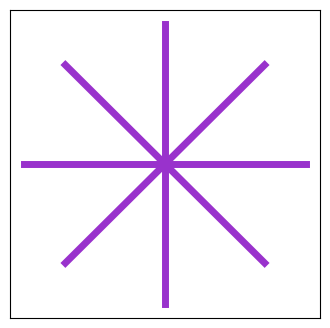

-------------
Index i = 28
Performance:  236522


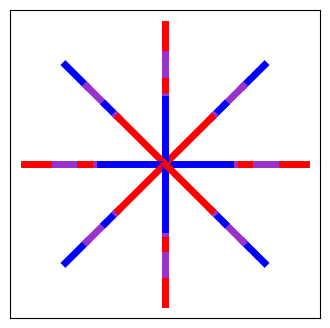

-------------
Index i = 29
Performance:  248000


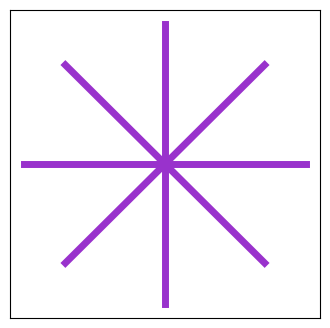

-------------
Index i = 30
Performance:  248000


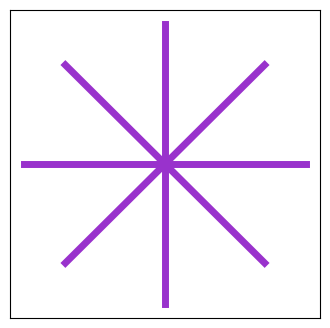

-------------
Index i = 31
Performance:  248000


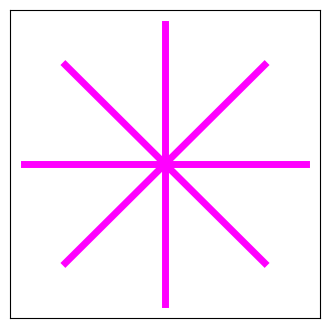

-------------
Index i = 32
Performance:  236520


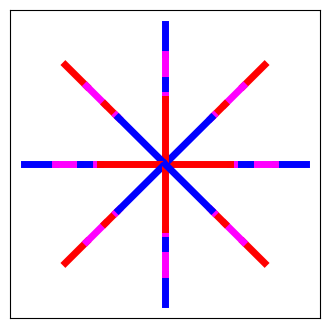

-------------
Index i = 33
Performance:  248000


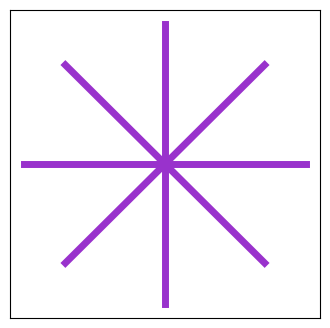

-------------
Index i = 34
Performance:  248000


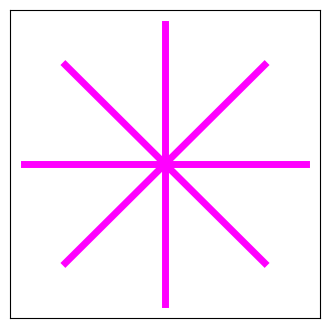

-------------
Index i = 35
Performance:  248000


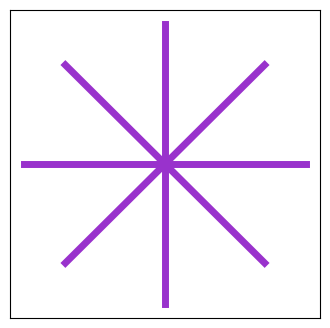

-------------
Index i = 36
Performance:  248000


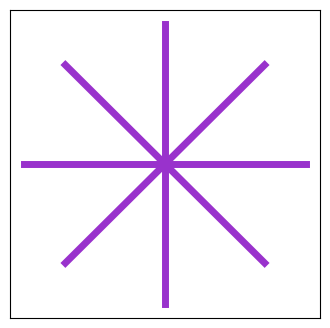

-------------
Index i = 37
Performance:  236520


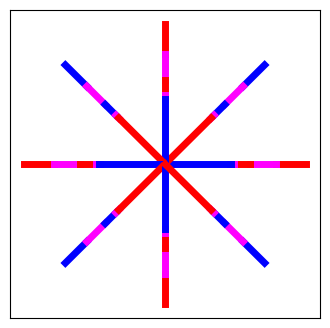

-------------
Index i = 38
Performance:  248000


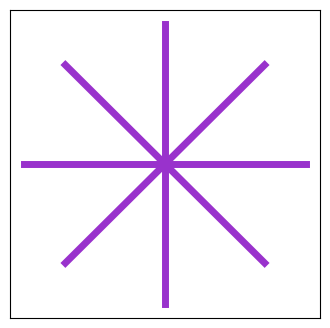

-------------
Index i = 39
Performance:  248000


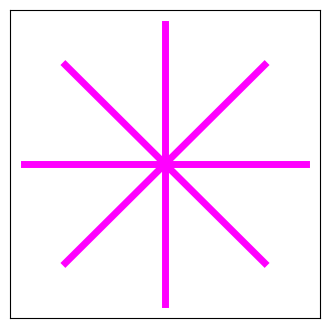

-------------
Index i = 40
Performance:  248000


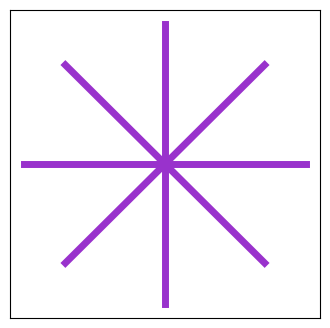

-------------
Index i = 41
Performance:  248000


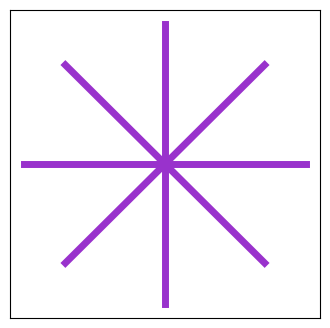

-------------
Index i = 42
Performance:  236524


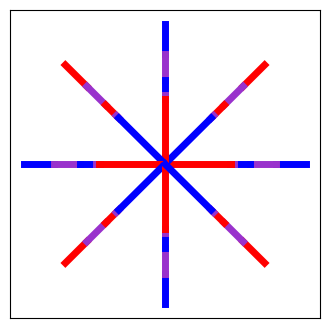

-------------
Index i = 43
Performance:  248000


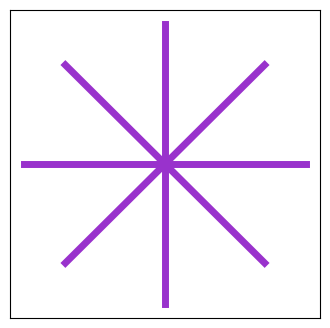

-------------
Index i = 44
Performance:  236520


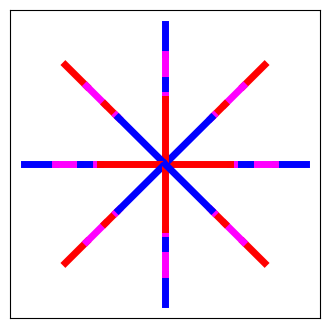

-------------
Index i = 45
Performance:  248000


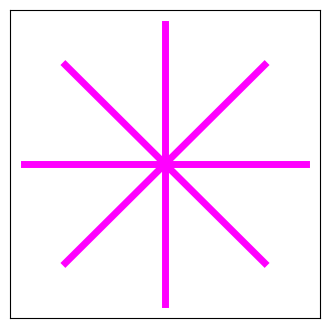

-------------
Index i = 46
Performance:  248000


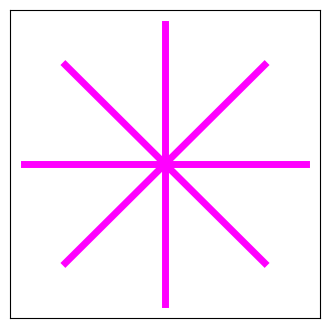

-------------
Index i = 47
Performance:  236520


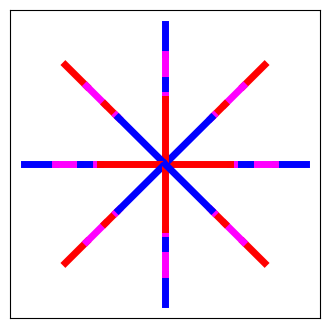

-------------
Index i = 48
Performance:  248000


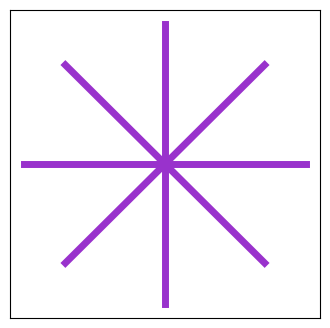

-------------
Index i = 49
Performance:  248000


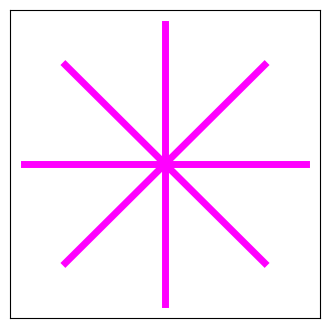

-------------
Index i = 50
Performance:  236523


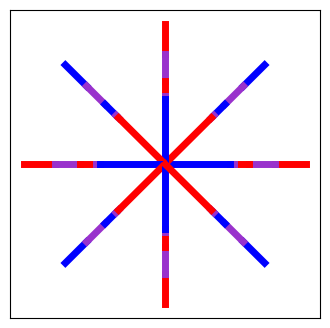

-------------
Index i = 51
Performance:  236520


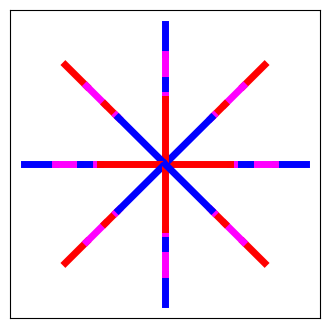

-------------
Index i = 52
Performance:  248000


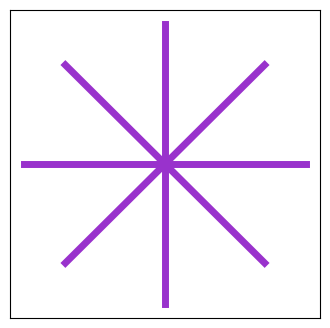

-------------
Index i = 53
Performance:  248000


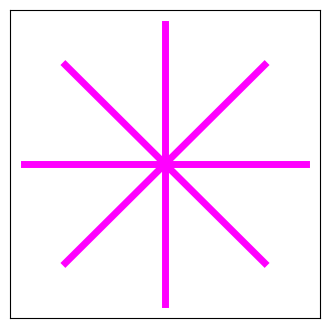

-------------
Index i = 54
Performance:  236520


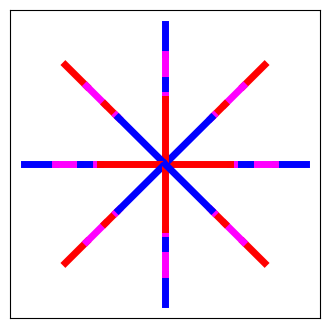

-------------
Index i = 55
Performance:  248000


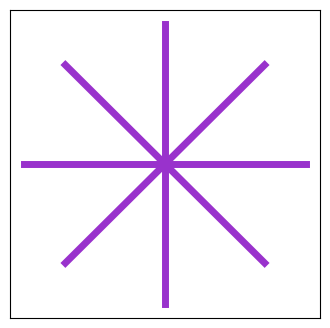

-------------
Index i = 56
Performance:  236520


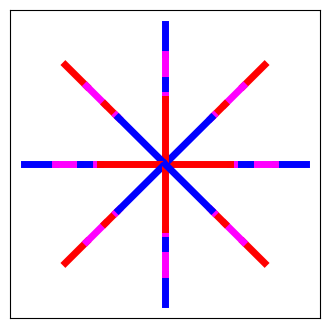

-------------
Index i = 57
Performance:  248000


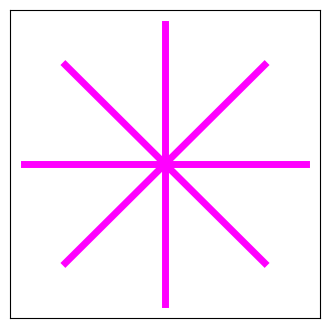

-------------
Index i = 58
Performance:  248000


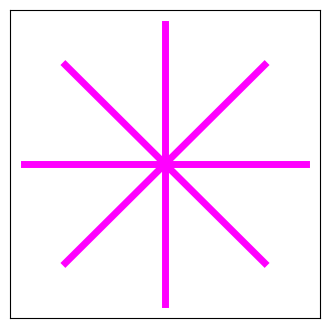

-------------
Index i = 59
Performance:  248000


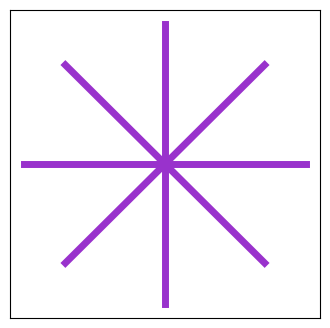

-------------
Index i = 60
Performance:  248000


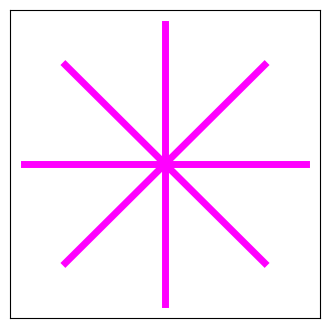

-------------
Index i = 61
Performance:  248000


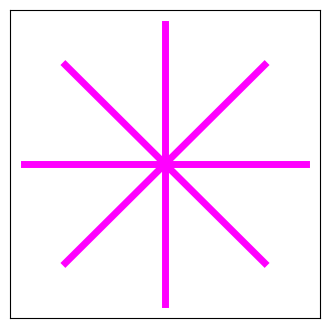

-------------
Index i = 62
Performance:  248000


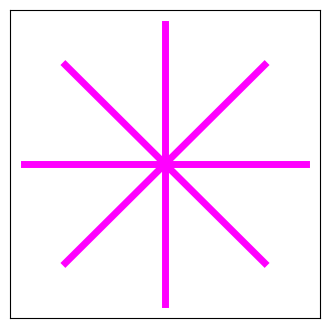

-------------
Index i = 63
Performance:  248000


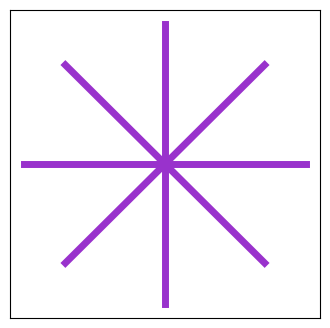

-------------
Index i = 64
Performance:  248000


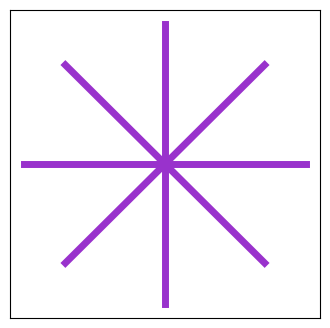

-------------
Index i = 65
Performance:  236520


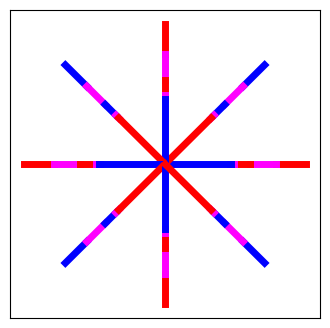

-------------
Index i = 66
Performance:  236520


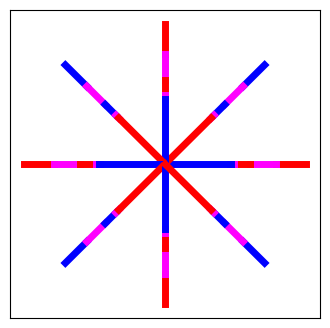

-------------
Index i = 67
Performance:  236524


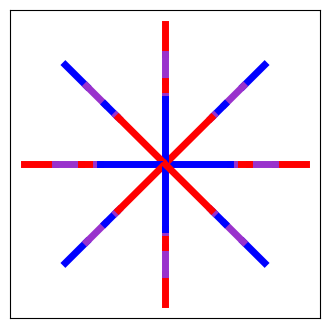

-------------
Index i = 68
Performance:  248000


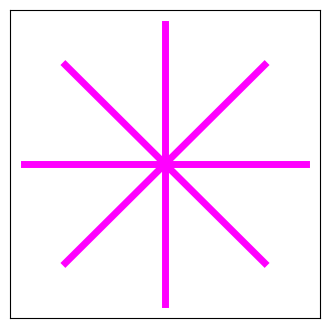

-------------
Index i = 69
Performance:  248000


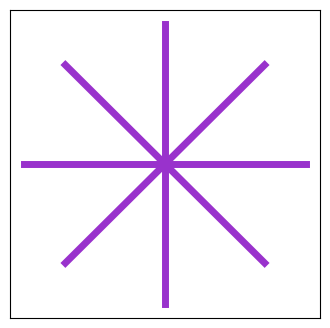

-------------
Index i = 70
Performance:  248000


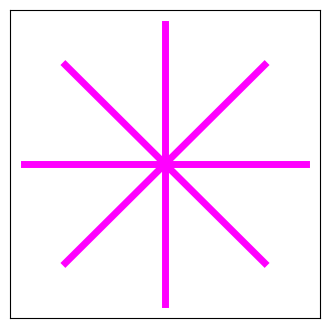

-------------
Index i = 71
Performance:  248000


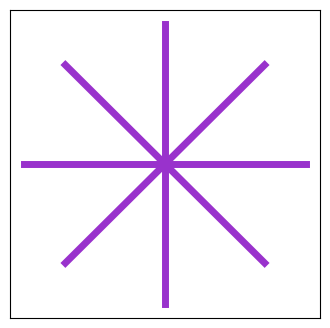

-------------
Index i = 72
Performance:  248000


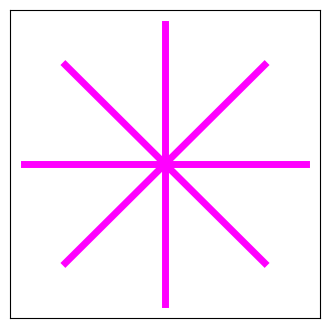

-------------
Index i = 73
Performance:  248000


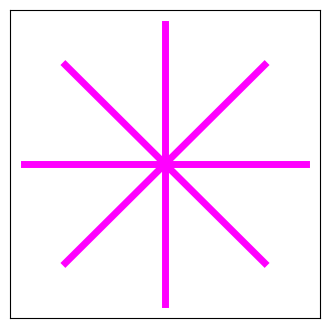

-------------
Index i = 74
Performance:  236520


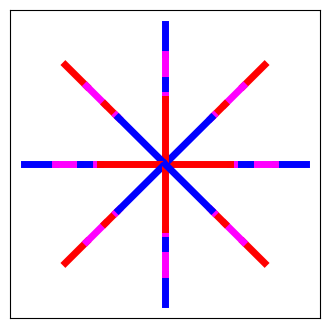

-------------
Index i = 75
Performance:  248000


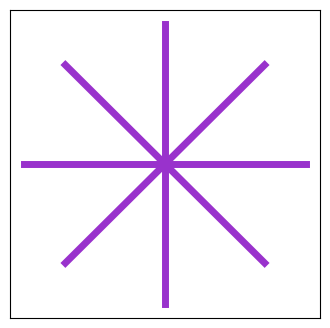

-------------
Index i = 76
Performance:  248000


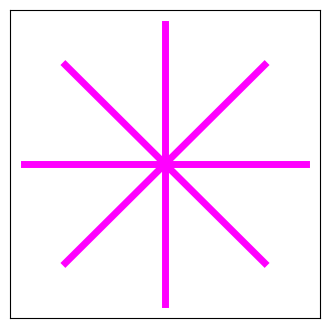

-------------
Index i = 77
Performance:  248000


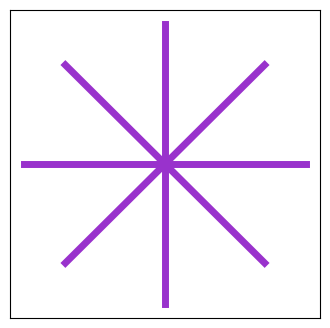

-------------
Index i = 78
Performance:  236522


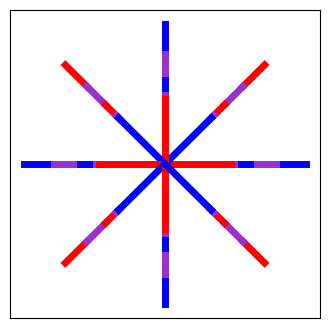

-------------
Index i = 79
Performance:  248000


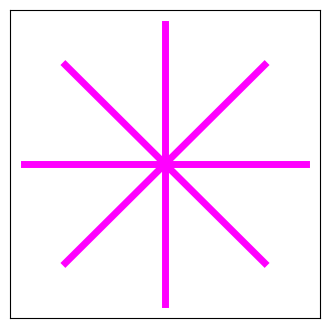

-------------
Index i = 80
Performance:  248000


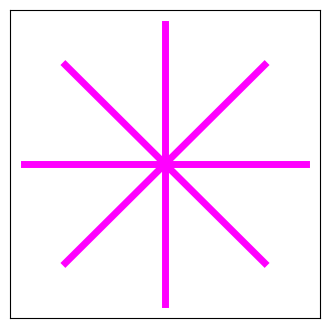

-------------
Index i = 81
Performance:  248000


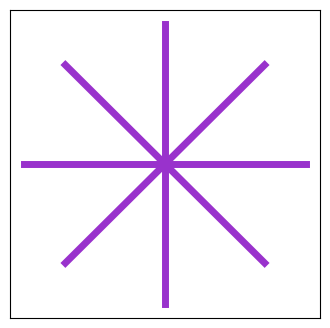

-------------
Index i = 82
Performance:  236520


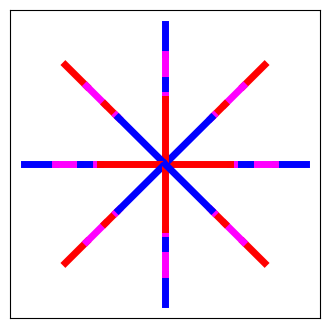

-------------
Index i = 83
Performance:  248000


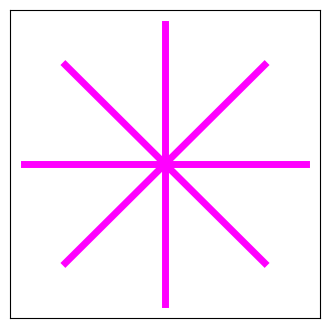

-------------
Index i = 84
Performance:  248000


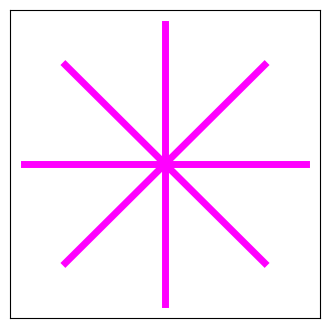

-------------
Index i = 85
Performance:  248000


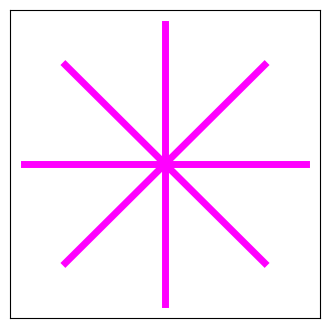

-------------
Index i = 86
Performance:  236524


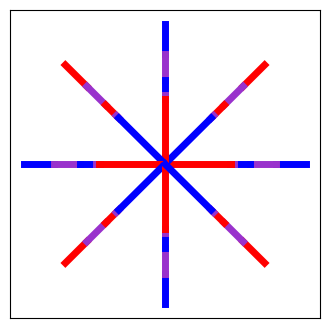

-------------
Index i = 87
Performance:  248000


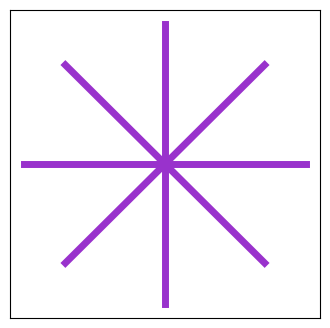

-------------
Index i = 88
Performance:  248000


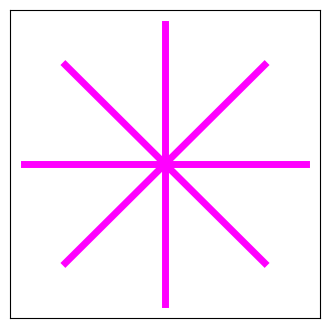

-------------
Index i = 89
Performance:  248000


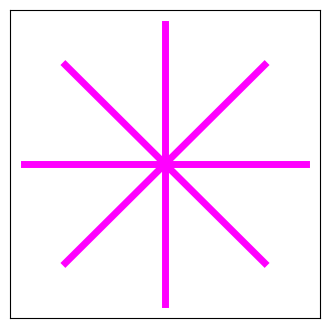

-------------
Index i = 90
Performance:  236522


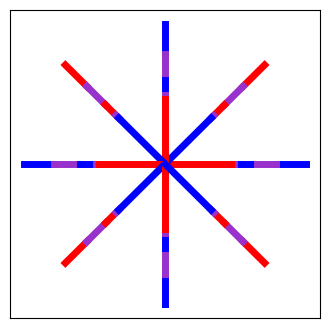

-------------
Index i = 91
Performance:  248000


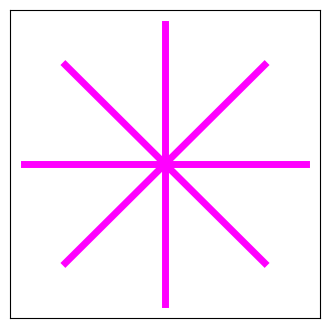

-------------
Index i = 92
Performance:  248000


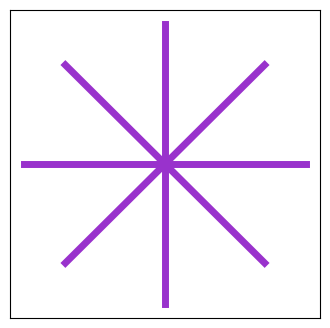

-------------
Index i = 93
Performance:  248000


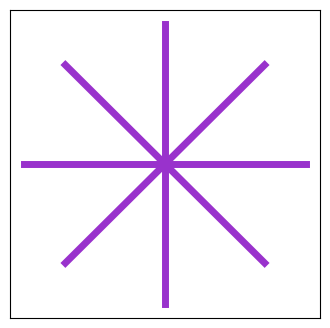

-------------
Index i = 94
Performance:  236523


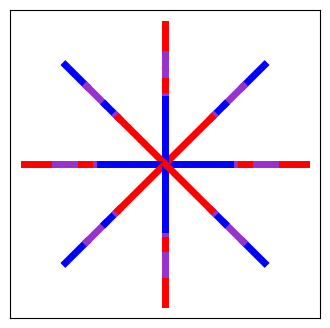

-------------
Index i = 95
Performance:  248000


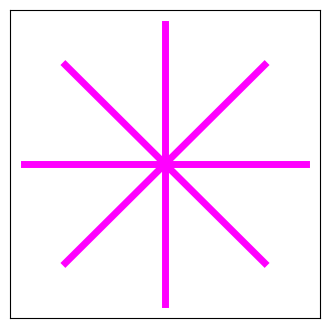

-------------
Index i = 96
Performance:  248000


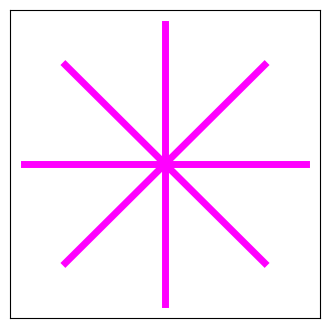

-------------
Index i = 97
Performance:  248000


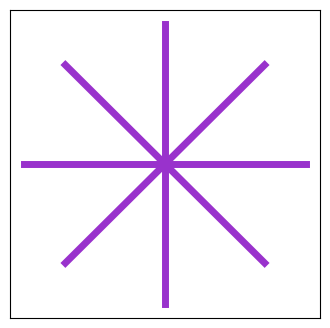

-------------
Index i = 98
Performance:  236523


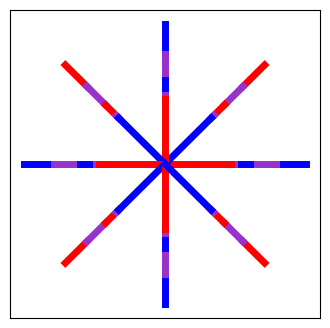

-------------
Index i = 99
Performance:  236522


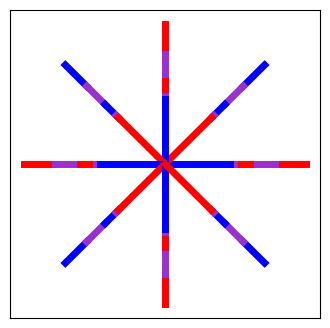

-------------


In [81]:
#Optimal colorings for k-star where k = 8 and n = 500 considering adjacent pairs of arms

np.random.seed(769)
random.seed(183)

colorings_kstar_adj_k8_n500 = []

for i in range(100):
    print('Index i =', i)
    colorings_kstar_adj_k8_n500 += [optimize_coloring('S', 'adj', random_kcoloring(8, 500), random_ordering(500))]
    print('-------------')

In [83]:
#Optimal colorings for k-star where k = 8 and n = 500 considering adjacent pairs of arms

buckets_for_kstar_adj_k8_n500 = [colorings_kstar_adj_k8_n500[2], colorings_kstar_adj_k8_n500[8]]

compare_list_to_target(colorings_kstar_adj_k8_n500, buckets_for_kstar_adj_k8_n500, 'adj')

Index i =  0
Bucket ID:  1
Number of Progressions: 236523
Percent difference:  0.4 %
----------------
Index i =  1
Bucket ID:  1
Number of Progressions: 236523
Percent difference:  0.15 %
----------------
Index i =  2
Bucket ID: Alternating
Number of Progressions: 248000
Percent difference:  0.0 %
----------------
Index i =  3
Bucket ID: Alternating
Number of Progressions: 248000
Percent difference:  0.0 %
----------------
Index i =  4
Bucket ID: Alternating
Number of Progressions: 248000
Percent difference:  0.0 %
----------------
Index i =  5
Bucket ID: Alternating
Number of Progressions: 248000
Percent difference:  0.0 %
----------------
Index i =  6
Bucket ID: Alternating
Number of Progressions: 248000
Percent difference:  0.0 %
----------------
Index i =  7
Bucket ID: Alternating
Number of Progressions: 248000
Percent difference:  0.0 %
----------------
Index i =  8
Bucket ID:  1
Number of Progressions: 236520
Percent difference:  0.0 %
----------------
Index i =  9
Bucket ID:  1


Index i = 0
Performance:  996000


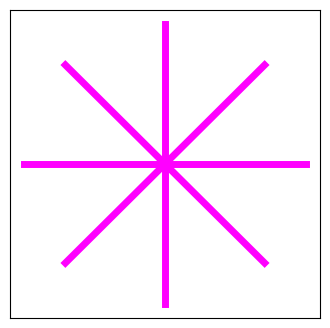

-------------
Index i = 1
Performance:  996000


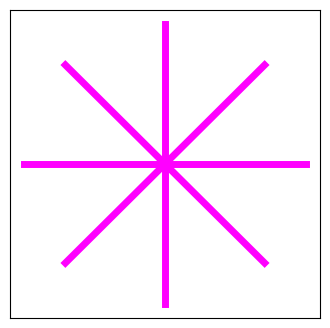

-------------
Index i = 2
Performance:  996000


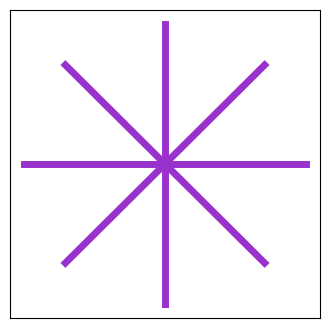

-------------
Index i = 3
Performance:  996000


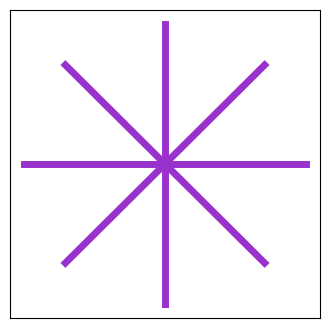

-------------
Index i = 4
Performance:  996000


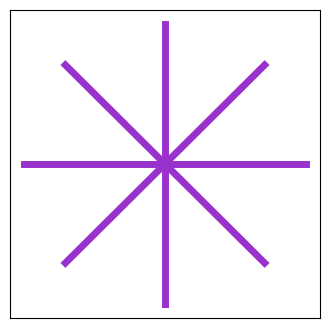

-------------
Index i = 5
Performance:  996000


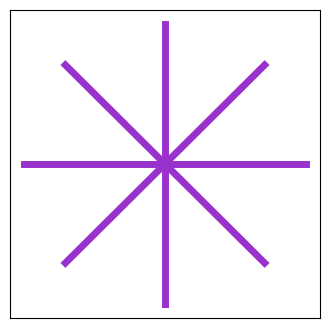

-------------
Index i = 6
Performance:  996000


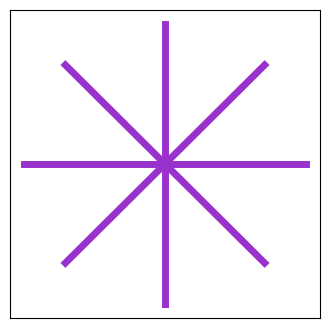

-------------
Index i = 7
Performance:  996000


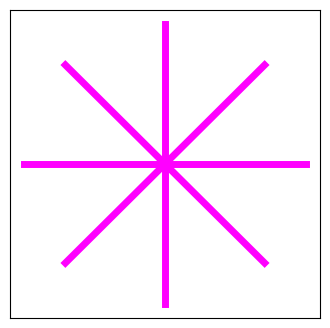

-------------
Index i = 8
Performance:  996000


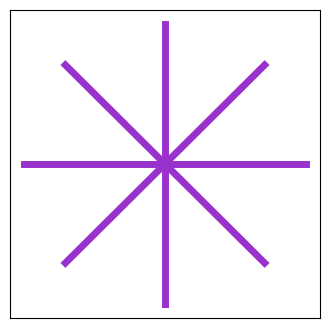

-------------
Index i = 9
Performance:  996000


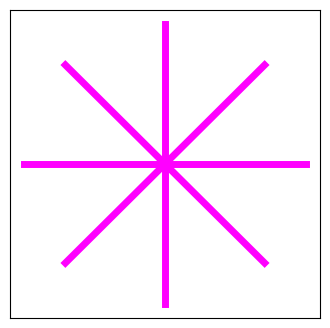

-------------
Index i = 10
Performance:  996000


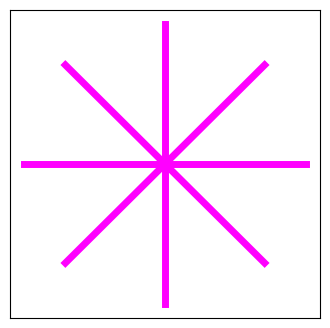

-------------
Index i = 11
Performance:  996000


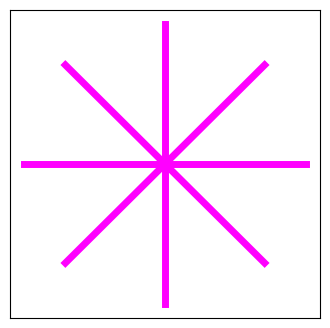

-------------
Index i = 12
Performance:  996000


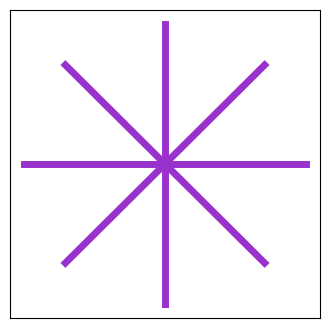

-------------
Index i = 13
Performance:  996000


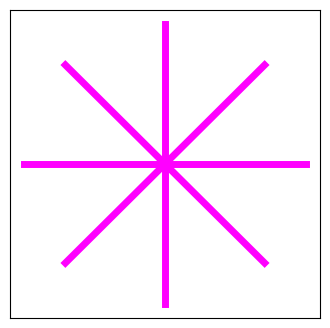

-------------
Index i = 14
Performance:  996000


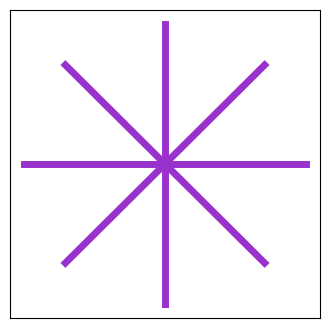

-------------
Index i = 15
Performance:  996000


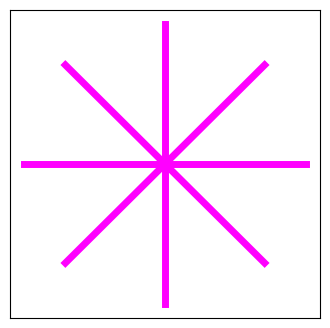

-------------
Index i = 16
Performance:  950076


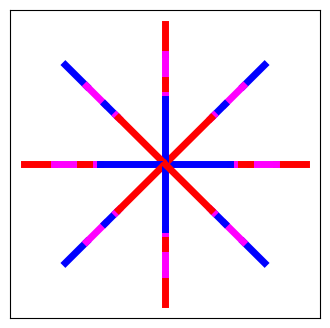

-------------
Index i = 17
Performance:  950076


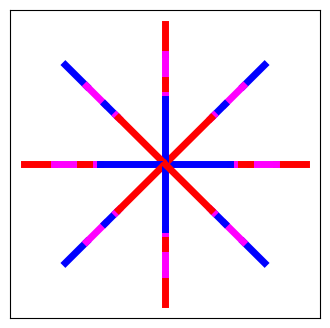

-------------
Index i = 18
Performance:  950068


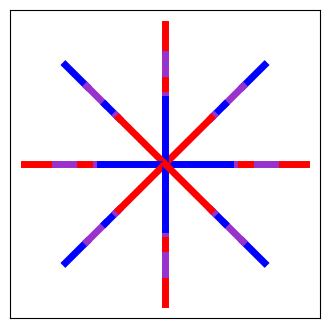

-------------
Index i = 19
Performance:  996000


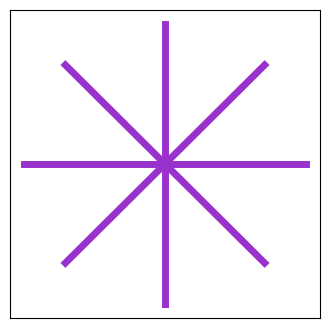

-------------
Index i = 20
Performance:  996000


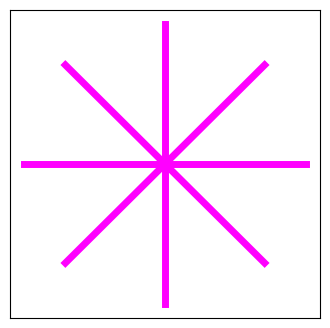

-------------
Index i = 21
Performance:  996000


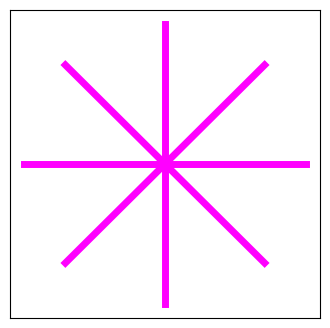

-------------
Index i = 22
Performance:  996000


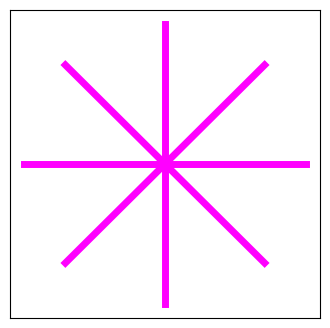

-------------
Index i = 23
Performance:  996000


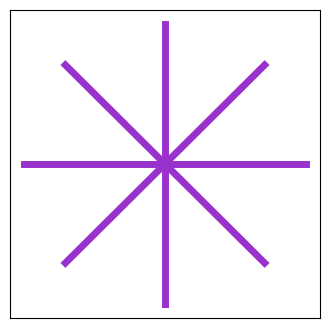

-------------
Index i = 24
Performance:  950068


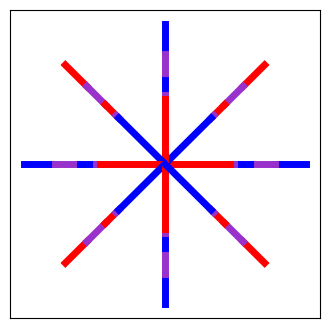

-------------
Index i = 25
Performance:  996000


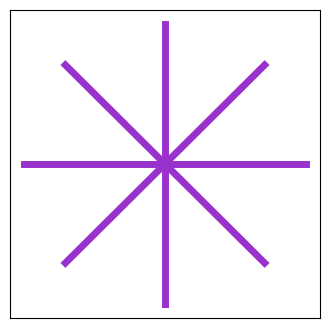

-------------
Index i = 26
Performance:  996000


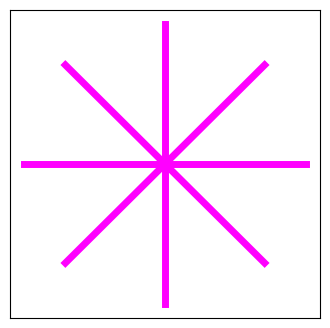

-------------
Index i = 27
Performance:  996000


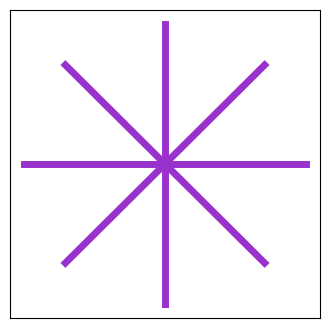

-------------
Index i = 28
Performance:  996000


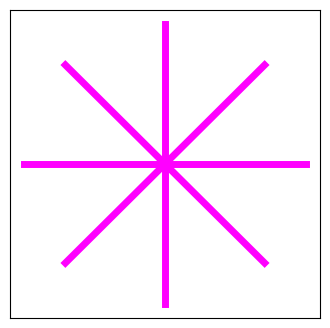

-------------
Index i = 29
Performance:  950072


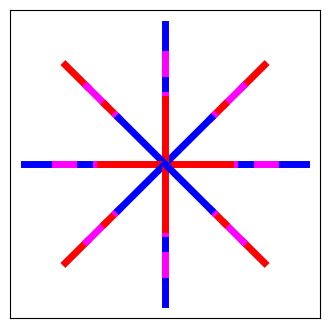

-------------
Index i = 30
Performance:  996000


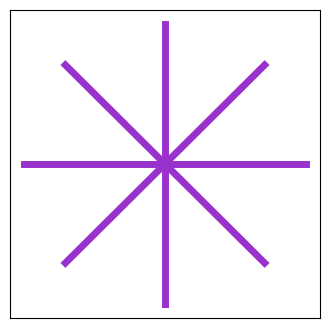

-------------
Index i = 31
Performance:  996000


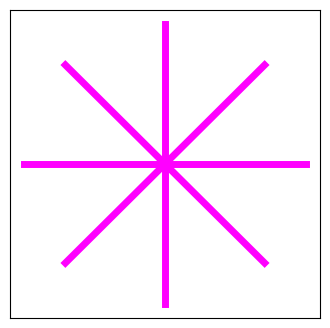

-------------
Index i = 32
Performance:  996000


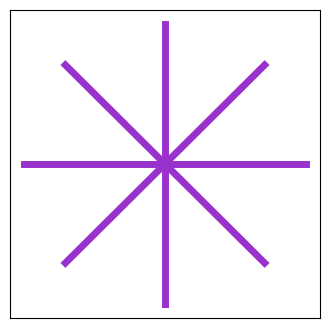

-------------
Index i = 33
Performance:  996000


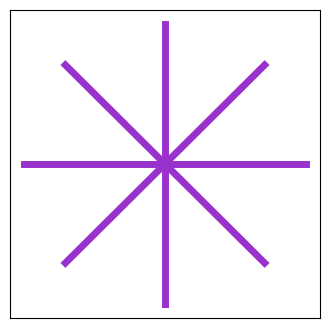

-------------
Index i = 34
Performance:  996000


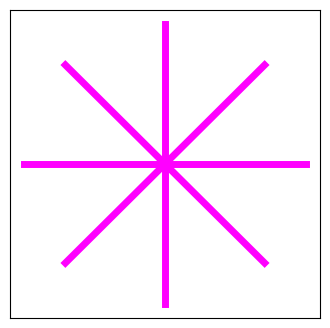

-------------
Index i = 35
Performance:  996000


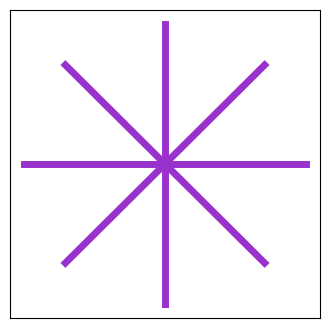

-------------
Index i = 36
Performance:  996000


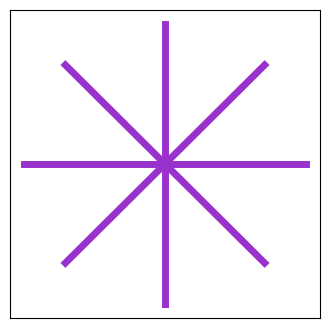

-------------
Index i = 37
Performance:  950072


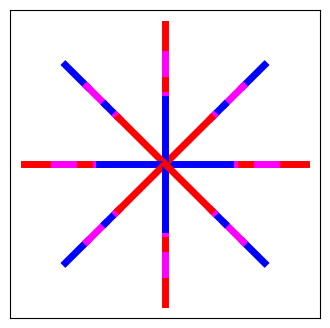

-------------
Index i = 38
Performance:  950073


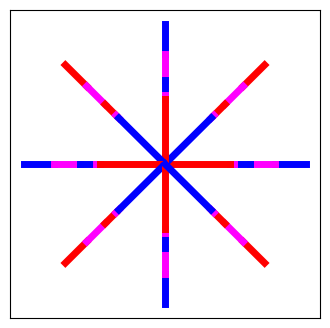

-------------
Index i = 39
Performance:  996000


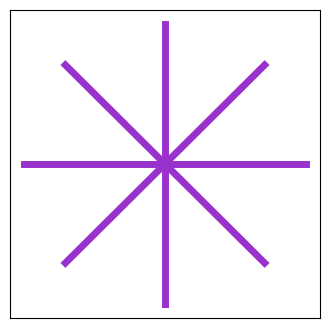

-------------
Index i = 40
Performance:  996000


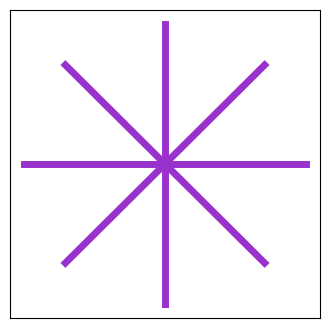

-------------
Index i = 41
Performance:  996000


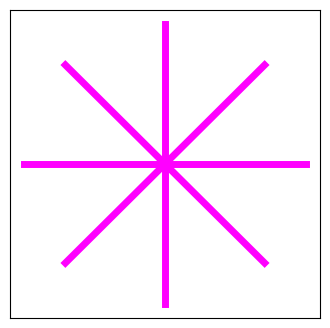

-------------
Index i = 42
Performance:  996000


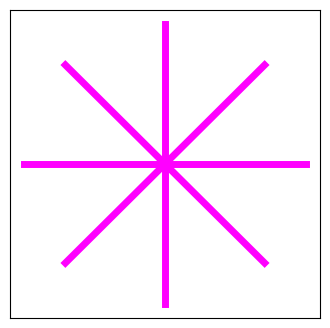

-------------
Index i = 43
Performance:  996000


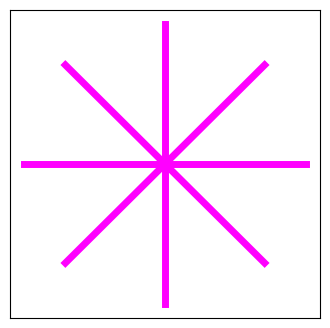

-------------
Index i = 44
Performance:  950068


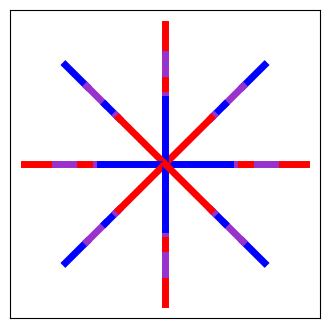

-------------
Index i = 45
Performance:  996000


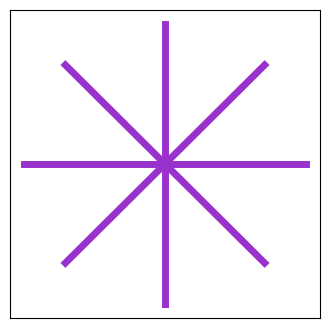

-------------
Index i = 46
Performance:  996000


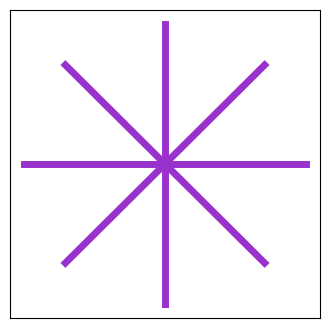

-------------
Index i = 47
Performance:  996000


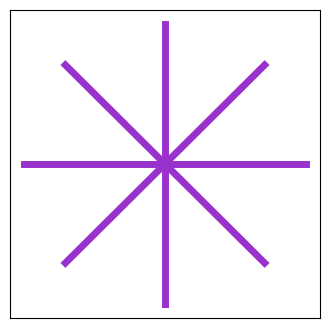

-------------
Index i = 48
Performance:  996000


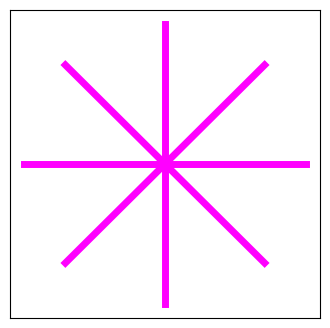

-------------
Index i = 49
Performance:  996000


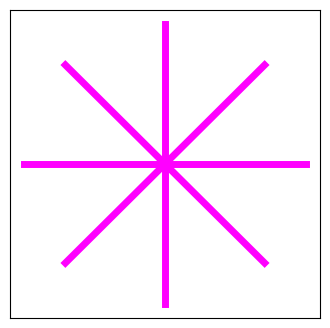

-------------
Index i = 50
Performance:  950073


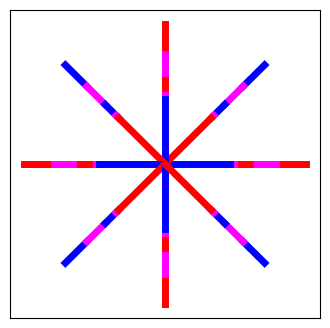

-------------
Index i = 51
Performance:  996000


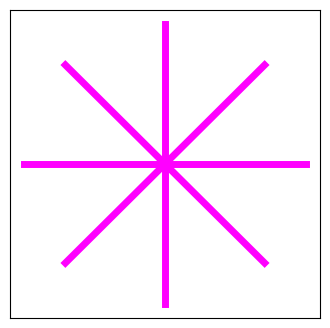

-------------
Index i = 52
Performance:  950072


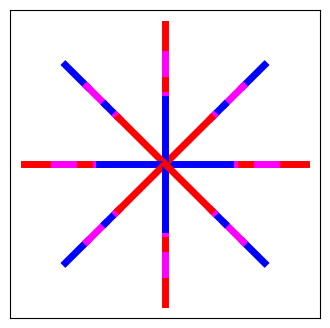

-------------
Index i = 53
Performance:  996000


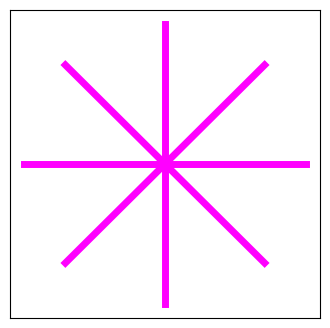

-------------
Index i = 54
Performance:  996000


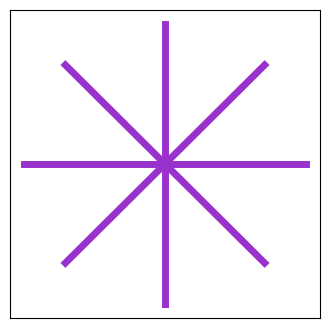

-------------
Index i = 55
Performance:  996000


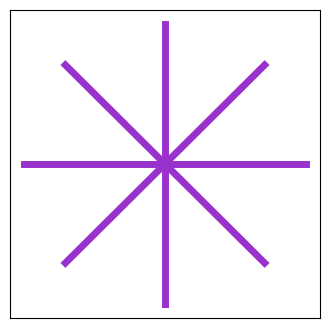

-------------
Index i = 56
Performance:  950072


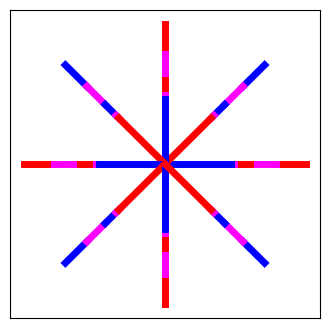

-------------
Index i = 57
Performance:  996000


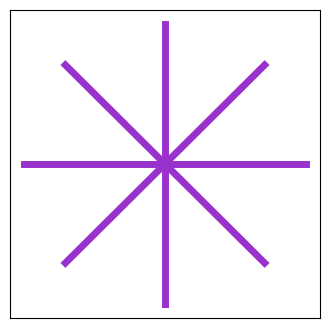

-------------
Index i = 58
Performance:  996000


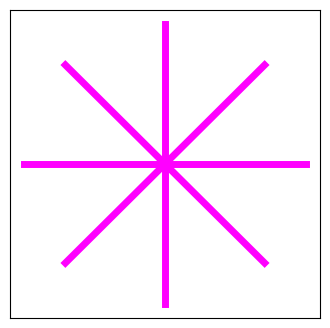

-------------
Index i = 59
Performance:  996000


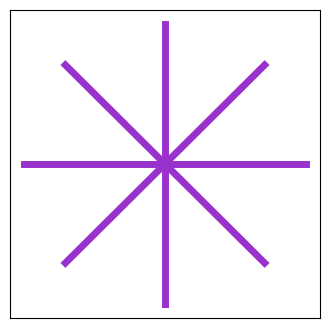

-------------
Index i = 60
Performance:  996000


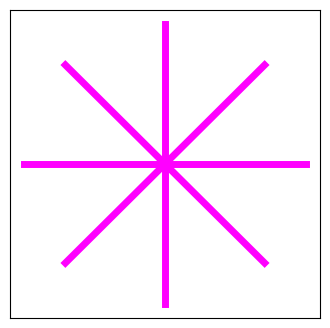

-------------
Index i = 61
Performance:  950072


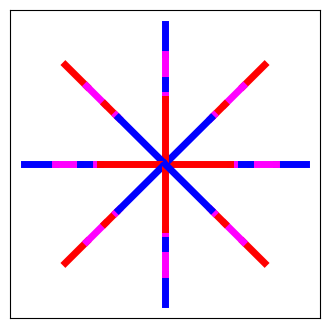

-------------
Index i = 62
Performance:  950068


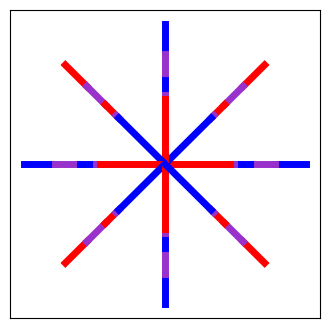

-------------
Index i = 63
Performance:  996000


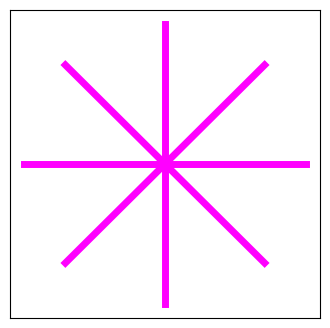

-------------
Index i = 64
Performance:  996000


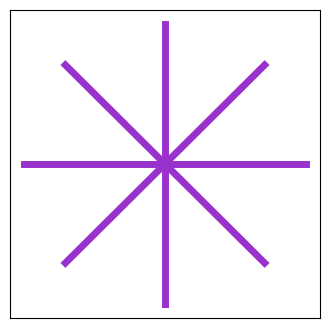

-------------
Index i = 65
Performance:  996000


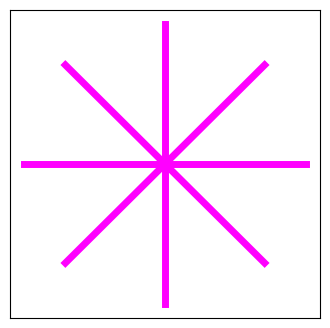

-------------
Index i = 66
Performance:  996000


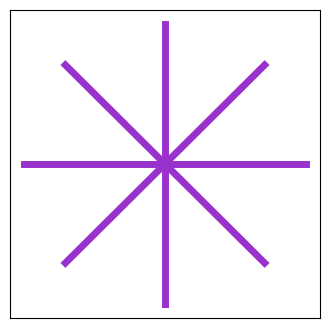

-------------
Index i = 67
Performance:  996000


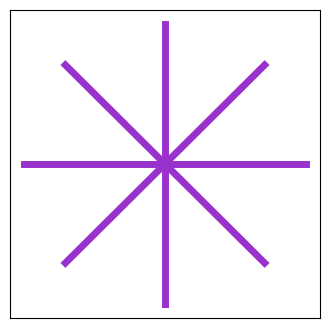

-------------
Index i = 68
Performance:  996000


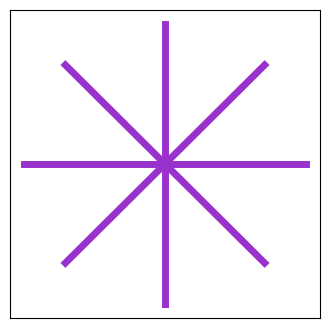

-------------
Index i = 69
Performance:  996000


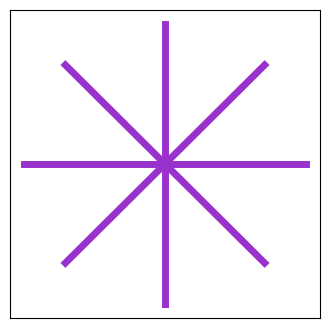

-------------
Index i = 70
Performance:  996000


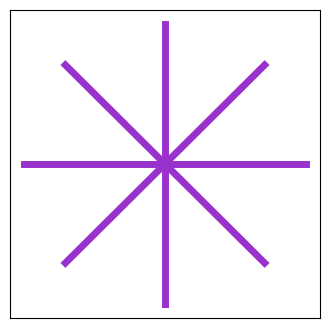

-------------
Index i = 71
Performance:  996000


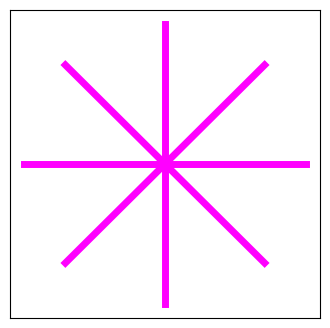

-------------
Index i = 72
Performance:  996000


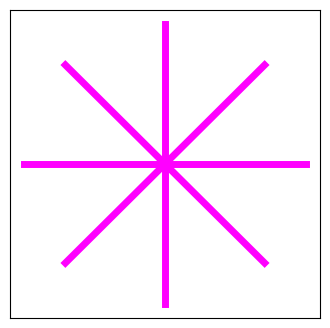

-------------
Index i = 73
Performance:  950068


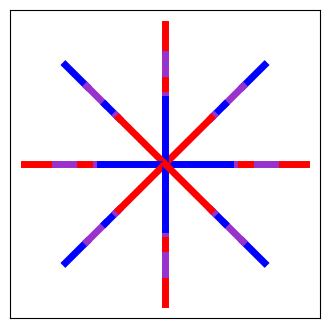

-------------
Index i = 74
Performance:  950073


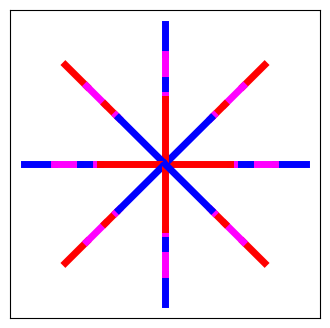

-------------
Index i = 75
Performance:  950076


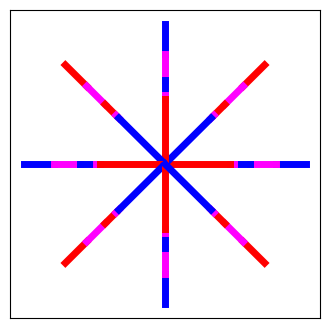

-------------
Index i = 76
Performance:  996000


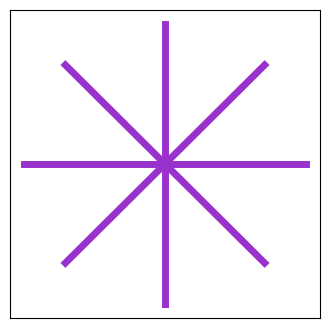

-------------
Index i = 77
Performance:  996000


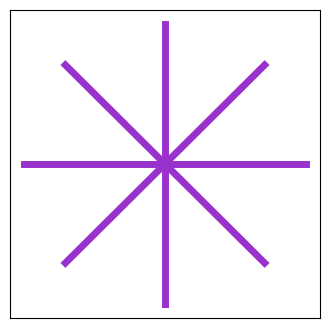

-------------
Index i = 78
Performance:  950076


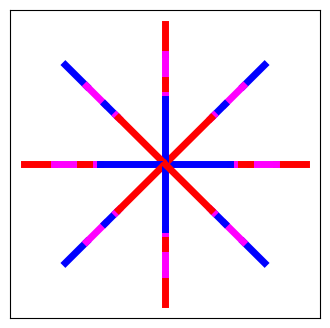

-------------
Index i = 79
Performance:  950073


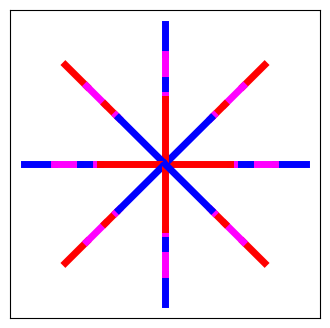

-------------
Index i = 80
Performance:  996000


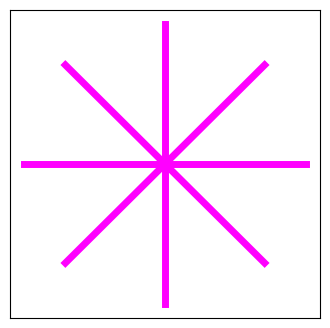

-------------
Index i = 81
Performance:  950068


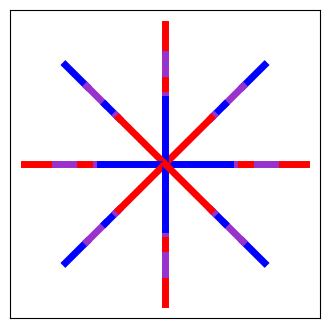

-------------
Index i = 82
Performance:  950068


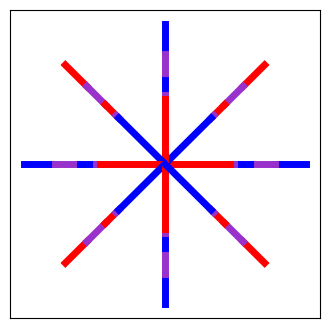

-------------
Index i = 83
Performance:  996000


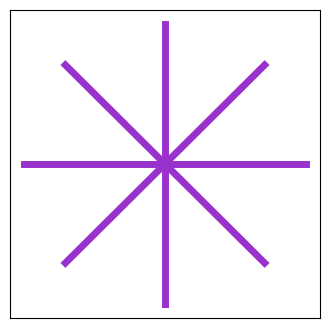

-------------
Index i = 84
Performance:  996000


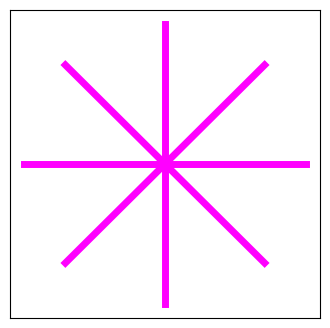

-------------
Index i = 85
Performance:  996000


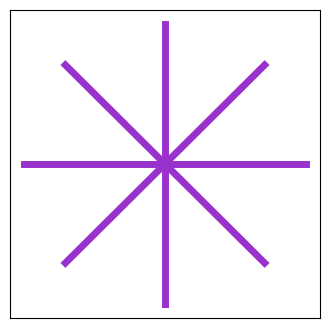

-------------
Index i = 86
Performance:  996000


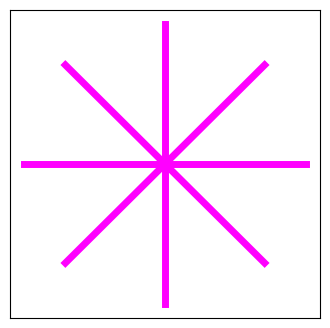

-------------
Index i = 87
Performance:  996000


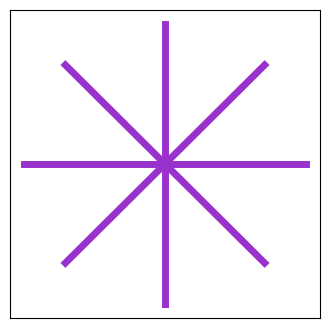

-------------
Index i = 88
Performance:  950073


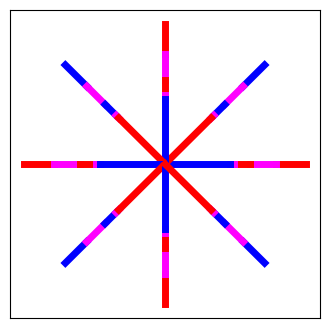

-------------
Index i = 89
Performance:  996000


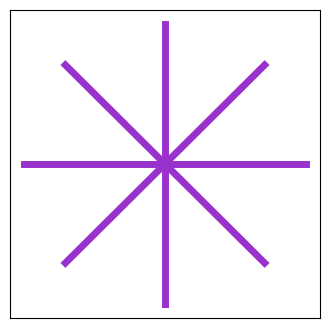

-------------
Index i = 90
Performance:  950071


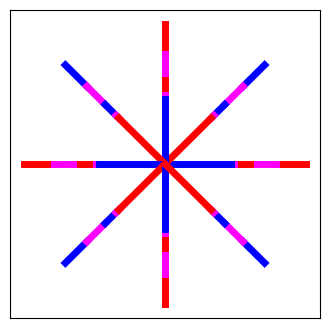

-------------
Index i = 91
Performance:  996000


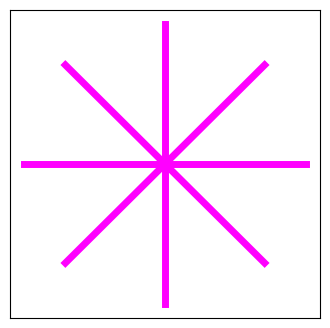

-------------
Index i = 92
Performance:  996000


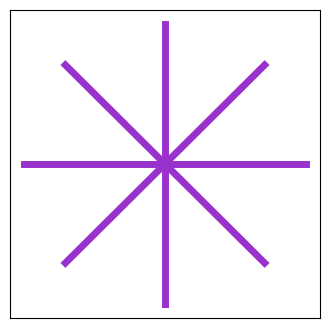

-------------
Index i = 93
Performance:  950076


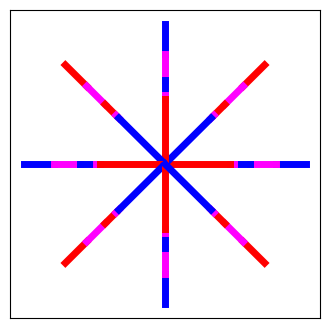

-------------
Index i = 94
Performance:  996000


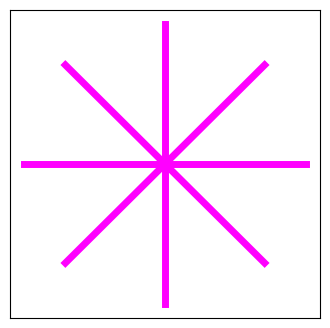

-------------
Index i = 95
Performance:  950068


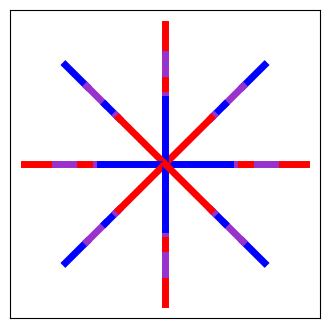

-------------
Index i = 96
Performance:  996000


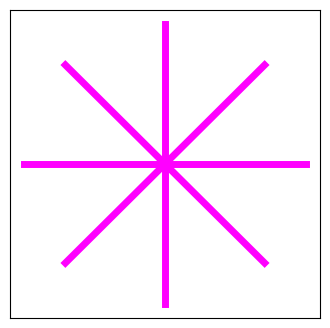

-------------
Index i = 97
Performance:  996000


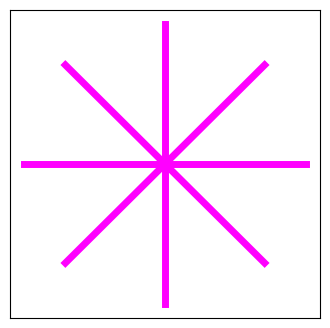

-------------
Index i = 98
Performance:  950076


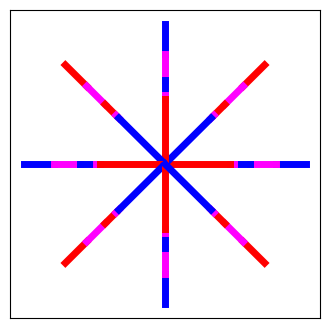

-------------
Index i = 99
Performance:  950073


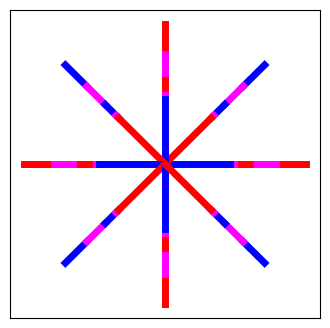

-------------


In [82]:
#Optimal colorings for k-star where k = 8 and n = 1000 considering adjacent pairs of arms

np.random.seed(307)
random.seed(949)

colorings_kstar_adj_k8_n1000 = []

for i in range(100):
    print('Index i =', i)
    colorings_kstar_adj_k8_n1000 += [optimize_coloring('S', 'adj', random_kcoloring(8, 1000), random_ordering(1000))]
    print('-------------')

In [87]:
#Optimal colorings for k-star where k = 8 and n = 1000 considering adjacent pairs of arms

buckets_for_kstar_adj_k8_n1000 = [colorings_kstar_adj_k8_n1000[0], colorings_kstar_adj_k8_n1000[18]]

compare_list_to_target(colorings_kstar_adj_k8_n1000, buckets_for_kstar_adj_k8_n1000, 'adj')

Index i =  0
Bucket ID: Alternating
Number of Progressions: 996000
Percent difference:  0.0 %
----------------
Index i =  1
Bucket ID: Alternating
Number of Progressions: 996000
Percent difference:  0.0 %
----------------
Index i =  2
Bucket ID: Alternating
Number of Progressions: 996000
Percent difference:  0.0 %
----------------
Index i =  3
Bucket ID: Alternating
Number of Progressions: 996000
Percent difference:  0.0 %
----------------
Index i =  4
Bucket ID: Alternating
Number of Progressions: 996000
Percent difference:  0.0 %
----------------
Index i =  5
Bucket ID: Alternating
Number of Progressions: 996000
Percent difference:  0.0 %
----------------
Index i =  6
Bucket ID: Alternating
Number of Progressions: 996000
Percent difference:  0.0 %
----------------
Index i =  7
Bucket ID: Alternating
Number of Progressions: 996000
Percent difference:  0.0 %
----------------
Index i =  8
Bucket ID: Alternating
Number of Progressions: 996000
Percent difference:  0.0 %
----------------
I